In [1]:
import matplotlib.pyplot as plt
import numpy as np
import math 
import sklearn.preprocessing 
import random
import yaml
import h5py
import logging
import datetime
import os
import time
import sys

import pprint
from tqdm import tqdm_notebook as tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, SequentialSampler, BatchSampler
import torch.nn.functional as F


from load_matlab_timedata import get_data_from
from src.TSGenerator import f_Y, f_X, get_func_timeseries
from src.DataLoader import TimeSeriesDataset
from src.model_utils import init_logger, plot_shared_scale, plot_multiscale
from src.Model import LSTM
from src.Losses import myLoss, aux_loss_jordan, prognose_dy

from torch.optim.lr_scheduler import ReduceLROnPlateau  


## Loading config files, setup execution parameters, init objects

In [2]:
plt.rcParams['figure.figsize'] = 20, 7.
CONFIG_FILENAME = "model_params_jordan.yaml"
# ! ls DC_motor_simulation
with open(CONFIG_FILENAME, 'r') as f:
        config = yaml.load(f, Loader=yaml.FullLoader)
   
pprint.pprint(config)


p_net = config['network_params']

p_train = config['train_params']

p_gen = config['generator_params']

p_data = config['data_params']
need_normalize = p_data['need_normalize']

{'data_params': {'best_discrete_k': 3,
                 'integration_step': 0.01,
                 'leave_nth': 13,
                 'mat_file': 'DC_motor_simulation/train_3_parameters.mat',
                 'need_normalize': True,
                 'specific_data_source': 'DC_motor_simulation/test_3_parameters_d_001_2.mat',
                 'specific_data_sources': {'dur': 'DC_motor_simulation/test_3_parameters_d_001_2.mat',
                                           'noice': 'DC_motor_simulation/test_3_parameters_5_15_1_20_additive_noise.mat',
                                           'range': 'DC_motor_simulation/test_3_parameters_v_0_33.mat',
                                           'sin': 'DC_motor_simulation/test_3_parameters_5_15_1_20_additive_sin.mat'},
                 'test_size': 0.3,
                 'tested_models': ['jordan_indep_estimate_1l 2h '
                                   '1b_18_May_11_42PM.pt',
                                   'jordan_full_blind_lower_cp_002

# Set parameters

In [3]:

# # If `per_element` is True, then LSTM reads in one timestep at a time.
if  p_net['per_element']:
    lstm_input_size = 1
else:
    lstm_input_size = p_net['input_size']
    
# if is_debug:
#     x, y = get_func_timeseries(f_Y = f_Y, f_X = f_X, a=p_generate['a'], b=p_generate['b'])
to_generate_data = config['to_generate_data'] 
if to_generate_data:
    p_gen = config['generator_params']
    print("Data generator params:")
    pprint.pprint(p_gen)
    a = p_gen['a']
    b = p_gen['b']
is_debug = config['is_debug']


init_logger(config)

logging.info("Experiment started with params")
logging.info(f"data_par: {p_data}")
logging.info(f"net_par: {p_net}")
logging.info(f"train_par: {p_train}") 

logger inited to file [only_batcheslogs/exp_2019-05-19_00:50:06.log]


## Init data loader and get appropriate part of data

## Creating objects from imported files

In [4]:
from src.Model import LSTM, LSTM_jordan
from src.Losses import myLoss, prognose_dy, myLoss_jordan  # imports here for faster rerun and debug procedure

model = LSTM_jordan(lstm_input_size,
             p_net['hidden_size'],
             batch_size=p_train['batch_size'],
            jordan_params=3,
             output_dim=1,
             num_layers=p_net['num_layers'],
                   lstm_bias=p_net['bias'])

loss_fn = myLoss_jordan


In [5]:
for name, parameter in model.named_parameters():
    print(name, '\t\t', parameter.shape)

jordan 		 torch.Size([1, 3])
lstm.weight_ih_l0 		 torch.Size([8, 4])
lstm.weight_hh_l0 		 torch.Size([8, 2])
lstm.bias_ih_l0 		 torch.Size([8])
lstm.bias_hh_l0 		 torch.Size([8])
linear.weight 		 torch.Size([1, 2])
linear.bias 		 torch.Size([1])


In [6]:
p_optim = p_train['optimizer']

if p_optim['optimizer'] == "adam":
    optimizer = torch.optim.Adam(
        [
                {
                    'params': model.jordan,
                    'lr': p_optim['jordan']['lr'],
                    'betas': (0.8, 0.95),
                    'weight_decay':p_optim['jordan']['wd']
                },
                {
                    'params': model.lstm.parameters(), 
                    'lr': p_optim['lstm']['lr'],
                    'weight_decay':p_optim['lstm']['wd']
                },
                {
                    'params': model.linear.parameters(),
                    'lr': p_optim['linear']['lr'],
                    'weight_decay':p_optim['linear']['wd']
                }
            ]
    )

logging.info(f"Model n params: {model.get_num_params()}")
print(f"model has [{model.get_num_params()}] params")
num_epochs = p_train['num_epochs']
logging.info("Training process INITIALIZED")
optimizer

model has [70.0] params


Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.8, 0.95)
    eps: 1e-08
    lr: 0.01
    weight_decay: 0

Parameter Group 1
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0

Parameter Group 2
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0
)

In [7]:
p_sched = p_train['lr_scheduler']
scheduler = ReduceLROnPlateau(optimizer=optimizer,
                              mode='min',
                              factor=p_sched['lr_drop'],
                              patience=p_sched['patience'],
                              cooldown=p_sched['cooldown'],
                              threshold=p_sched['threshold'],
                              threshold_mode='rel',
                              min_lr=10**p_sched['early_stop_order'],
                             verbose=True
                             )
print("LR scheduler set_uped")
scheduler.state_dict()

LR scheduler set_uped


{'factor': 0.4,
 'min_lrs': [1e-08, 1e-08, 1e-08],
 'patience': 60,
 'verbose': True,
 'cooldown': 4,
 'cooldown_counter': 0,
 'mode': 'min',
 'threshold': 0.01,
 'threshold_mode': 'rel',
 'best': inf,
 'num_bad_epochs': 0,
 'mode_worse': inf,
 'eps': 1e-08,
 'last_epoch': -1}

In [8]:
sample_x= torch.rand([p_net['retrospective_steps'], p_train['batch_size'], 1])
y, pars = model(sample_x)

In [9]:
sample_x.shape


torch.Size([64, 1024, 1])

using 1.0 of data
loading from [DC_motor_simulation/train_3_parameters.mat]
X normalized, norms: [14.99931682]
x shape (76924, 1)
x_normalized shape (76924, 1)


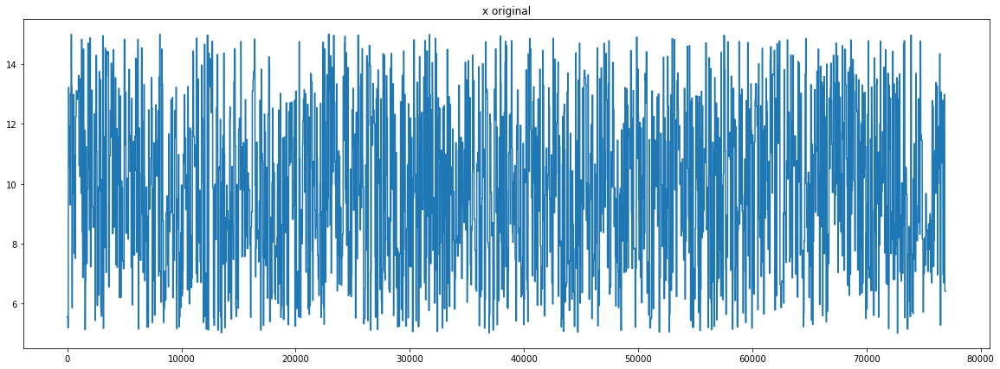

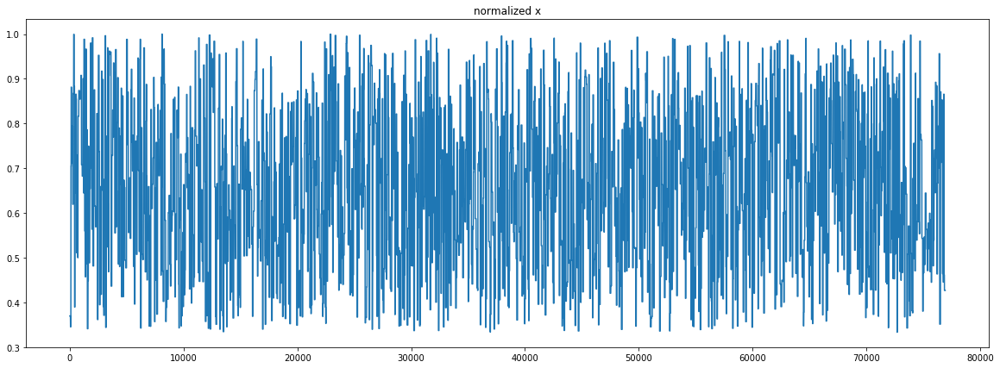

Y normalized, norms: [0.01324489]
input shape (76924, 1)
input partition shape (23078, 1)
output partition shape (23078, 1)
stacked Y shape  (23014, 1)
Y_tensor torch.Size([23014, 1])
X_tensor torch.Size([64, 23013, 1])
loading from [DC_motor_simulation/train_3_parameters.mat]
X normalized, norms: [14.99931682]
x shape (76924, 1)
x_normalized shape (76924, 1)


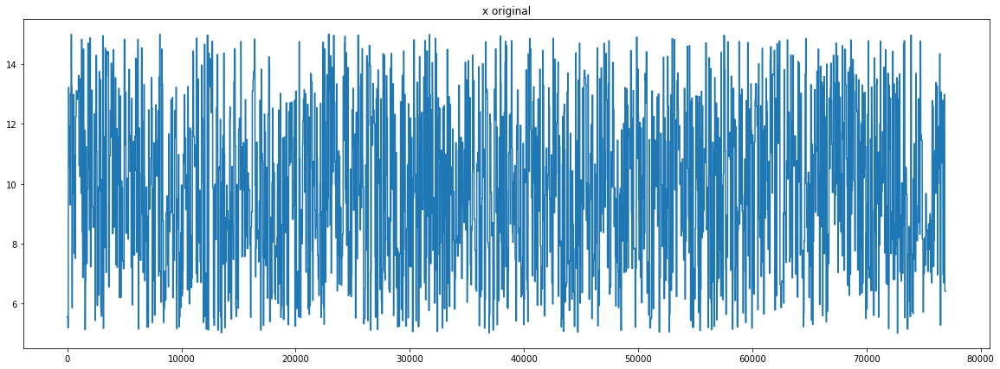

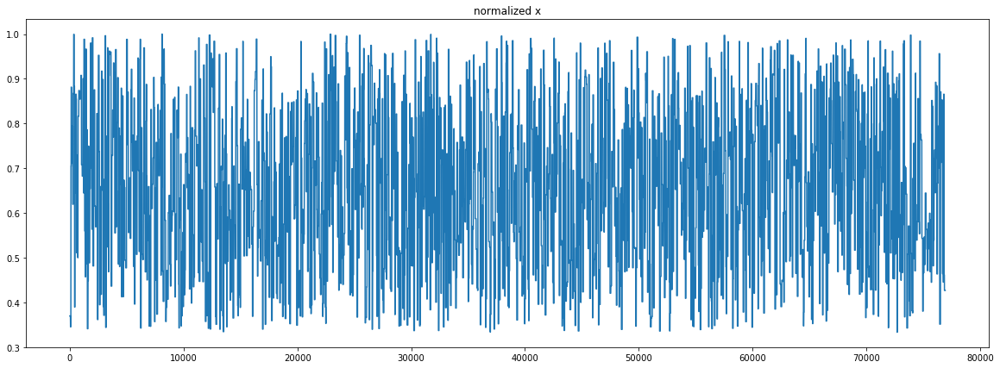

Y normalized, norms: [0.01324489]
input shape (76924, 1)
input partition shape (53846, 1)
output partition shape (53846, 1)
stacked Y shape  (53782, 1)
Y_tensor torch.Size([53782, 1])
X_tensor torch.Size([64, 53781, 1])
train set: [53782] batches
test set: [23014] batches
data_loading time 43.45891761779785 secs


In [10]:
# todo add time tracking for this cell
use_part = p_data['use_part_of_data']
print(f"using {use_part} of data")

t_tick = time.time()

test_ts_ds = TimeSeriesDataset(config=config,
                               partition=(use_part - use_part*p_data['test_size'], use_part),                        
                               logging=logging)

train_ts_ds = TimeSeriesDataset(config=config,
                                partition=(0, use_part - use_part*p_data['test_size']),
                                logging=logging)

print(f"train set: [{len(train_ts_ds)}] batches")
print(f"test set: [{len(test_ts_ds)}] batches")

if need_normalize:
    config['x_norm'] = train_ts_ds.x_norms[0]
    config['y_norm'] = train_ts_ds.y_norms[0]
    config['x_norm']
else:
    config['x_norm'] = 1
    config['y_norm'] = 1
    config['x_norm']

train_dl = DataLoader(dataset = train_ts_ds,
                      batch_sampler = BatchSampler(
                          sampler = SequentialSampler(train_ts_ds), 
                          batch_size = p_train['batch_size'],
                          drop_last = True)
                     )
test_dl = DataLoader(dataset = test_ts_ds,
                     batch_sampler = BatchSampler(
                     sampler = SequentialSampler(test_ts_ds), 
                     batch_size = p_train['batch_size'], 
                     drop_last = True)
                    )    
    
t_tock = time.time()
dataload_time = t_tock - t_tick
print(f"data_loading time {dataload_time} secs")

## Inspecting data we have, get several batches and look inside on pretty large scale to see individual iterations:

x [batch_size, retrospective_steps, channels] :torch.Size([1024, 64, 1])
y [batch_size, channels]: torch.Size([1024, 1])
y_last [slice_size]: (150,)


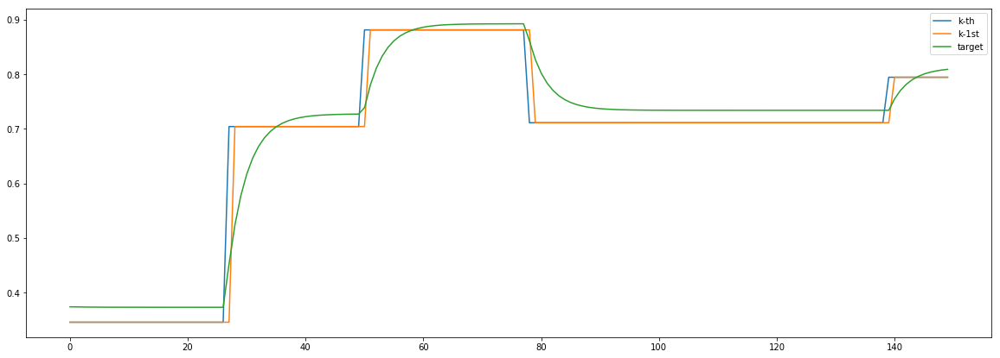

x [batch_size, retrospective_steps, channels] :torch.Size([1024, 64, 1])
y [batch_size, channels]: torch.Size([1024, 1])
y_last [slice_size]: (150,)


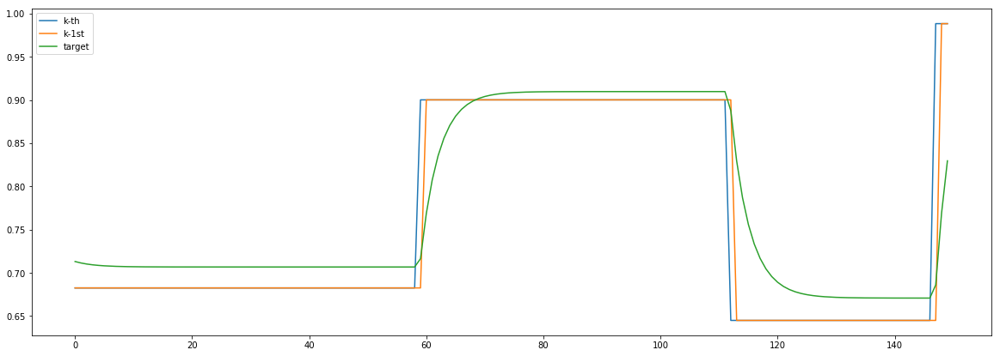

In [11]:
f, t = 0, 150
for i, batch in enumerate(train_dl):
    x, y, ind = batch
    print(f"x [batch_size, retrospective_steps, channels] :{x.shape}")
    print(f"y [batch_size, channels]: {y.shape}")
    y_kth = y.detach().numpy()[f:t, 0]
    print(f"y_last [slice_size]: {y_kth.shape}")
    x = x.transpose(0,1)
    plt.plot(x.detach().numpy()[-1][f:t], label='k-th')
    plt.plot(x.detach().numpy()[-2][f:t], label='k-1st')
    plt.plot(y_kth, label='target')
    plt.legend()
    plt.show()
    if i == 1:
        break

In [12]:
# #####################
# # 
# #####################
# from torch.nn import init
# for layer_p in a._all_weights:
#     for p in layer_p:
#         if 'weight' in p:
#             # print(p, a.__getattr__(p))
#             init.normal(a.__getattr__(p), 0.0, 0.02)

In [13]:
logging.info("History INITIALIZED")

hist = {
    
    "train":{
        "batches":{
            "main":np.zeros(len(train_dl)),
            "aux":np.zeros(len(train_dl)),
            "jordan":np.zeros(len(train_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "jordan":np.zeros(num_epochs)
        }
    },
    
    "eval_train":{
        "batches":{
            "main":np.zeros(len(train_dl)),
            "aux":np.zeros(len(train_dl)),
            "jordan":np.zeros(len(train_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "jordan":np.zeros(num_epochs)
        }
    },
    
    "eval_test":{
        "batches":{
            "main":np.zeros(len(test_dl)),
            "aux":np.zeros(len(test_dl)),
            "jordan":np.zeros(len(test_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "jordan":np.zeros(num_epochs)
        }
    },
    
    'mean_params_sample':
    {
        '1':np.zeros(num_epochs),
        '2':np.zeros(num_epochs),    
        '3':np.zeros(num_epochs)
    },
    'lr': np.zeros(num_epochs),
    'loss_rate': np.zeros(num_epochs),
    'weights_sum': np.zeros(num_epochs), 
    'weights_var': np.zeros(num_epochs),
    
    'grads':{
        'batches':{name: np.zeros(len(train_dl)) for name, parameter in model.named_parameters()},
        'epochs':{name: np.zeros(num_epochs) for name, parameter in model.named_parameters()}
    },
    'weights':{
        'batches':{name: np.zeros(len(train_dl)) for name, parameter in model.named_parameters()},
        'epochs':{name: np.zeros(num_epochs) for name, parameter in model.named_parameters()}
    },
    'vars':{
        'batches':{name: np.zeros(len(train_dl)) for name, parameter in model.named_parameters()},
        'epochs':{name: np.zeros(num_epochs) for name, parameter in model.named_parameters()}
    },
    'param_grads':{
        'batches':{"p1":np.zeros(len(train_dl)),
                   "p2":np.zeros(len(train_dl)),
                   "p3":np.zeros(len(train_dl))
                  },
        'epochs':{
            "p1":np.zeros(num_epochs), 
            "p2":np.zeros(num_epochs),
            "p3":np.zeros(num_epochs)
        }
    },
    'aux_global':[],
    'grad_global':{'p1':[], 'p2':[],'p3':[],'lstm':[], 'linear':[]}
}

In [14]:
def batch_iteration(iter_index, model, optimizer, batch_data, backprop, hist_part):
    
    x_batch, y_batch, indexes = batch_data
    x_batch.transpose_(0, 1) # todo get rid of it
    model.hidden = model.init_hidden()   
    
    
    if backprop:
        y_pred, jordan = model(x_batch)
        
        losses = loss_fn(y_pred, jordan.t(), y_batch, x_batch, config, 
                        jord_flag=False,
                        core_flag=True,
                      aux_flag=False,
                      perfect_params_flag=False )
        main_loss, aux_loss, aux_residuals, jordan_loss = losses
        
        optimizer.zero_grad()
        main_loss *= 10**p_train['core_loss']['scaling_order']
        main_loss.backward()
        optimizer.step()
                
    else:
        y_pred, jordan = model(x_batch)
        losses = loss_fn(y_pred, jordan.t(), y_batch, x_batch, config, 
                        jord_flag=True,
                        core_flag=True,
                      aux_flag=True,
                      perfect_params_flag=False )
        main_loss, aux_loss, aux_residuals, jordan_loss = losses

#         optimizer.zero_grad()
        
#         aux_loss.backward()
        
#         combined_loss.backward()
    # TODO or manually add weight decay here when grad is ready
    #         print(f"losses after scaling: m[{main_loss.item()}] a[{aux_loss.item()}] c[{const_loss.item()}]")
        for name, parameter in model.named_parameters():
            hist['grads']['batches'][name][iter_index] = parameter.grad.sum().item()
            hist['weights']['batches'][name][iter_index] = parameter.sum().item()
            hist['vars']['batches'][name][iter_index] = parameter.var().item()
        hist['param_grads']['batches']['p1'][iter_index] = model.jordan.grad[0][0].item()
        hist['param_grads']['batches']['p2'][iter_index] = model.jordan.grad[0][1].item()
        hist['param_grads']['batches']['p3'][iter_index] = model.jordan.grad[0][2].item()
        
        hist['grad_global']['p1'].append(model.jordan.grad[0][0].item())
        hist['grad_global']['p2'].append(model.jordan.grad[0][1].item())
        hist['grad_global']['p3'].append(model.jordan.grad[0][2].item())
        
        hist['grad_global']['lstm'].append(sum([p.grad.abs().sum() for p in model.lstm.parameters()]).item())
        hist['grad_global']['linear'].append(sum([p.grad.abs().sum() for p in model.linear.parameters()]).item())
        hist['aux_global'].append(aux_loss.item())
        
#         optimizer.step()
    
    hist_part["main"][iter_index] = main_loss.item()
    hist_part["aux"][iter_index] = aux_loss.item()
    hist_part["jordan"][iter_index] = jordan_loss.item()
    
    return y_pred, jordan

In [15]:
def update_long_term_hist(batches_hist, long_term_hist):
    mean_main = np.average(batches_hist["main"])
    mean_aux = np.average(batches_hist["aux"])
    mean_jord = np.average(batches_hist["jordan"])
    long_term_hist["main"][t] = mean_main
    long_term_hist["aux"][t] = mean_aux
    long_term_hist["jordan"][t] = mean_jord
    return mean_main, mean_aux, mean_jord

In [16]:
def slice_loss_sum(losses_dict, index):
    return sum([val[index] for val in losses_dict.values()])

## Train model


aux preds: -0.6017741560935974           -0.4063141345977783           0.45065850019454956
main loss 810050.1286057692
aux loss 0.0
jord loss 0.0
combined loss 810050.1286057692 



Parameter containing:
tensor([[-0.6018, -0.4063,  0.4507]], requires_grad=True)


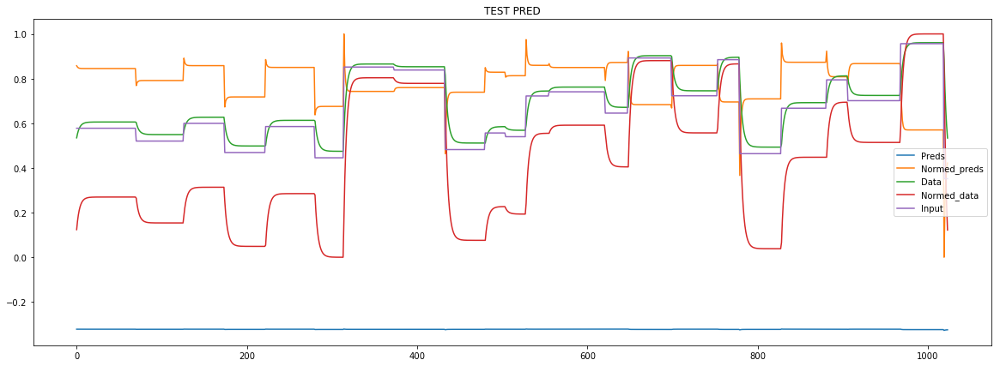

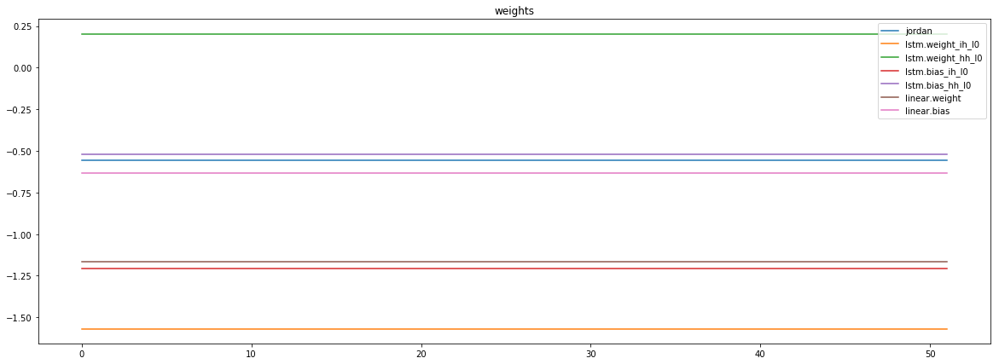

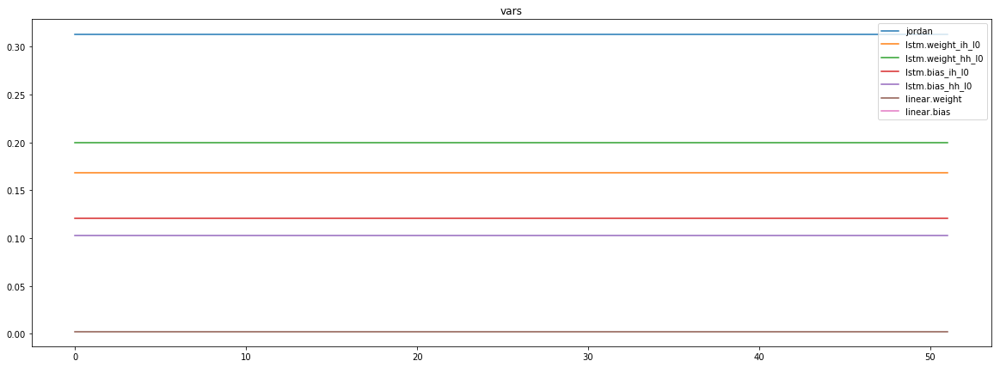

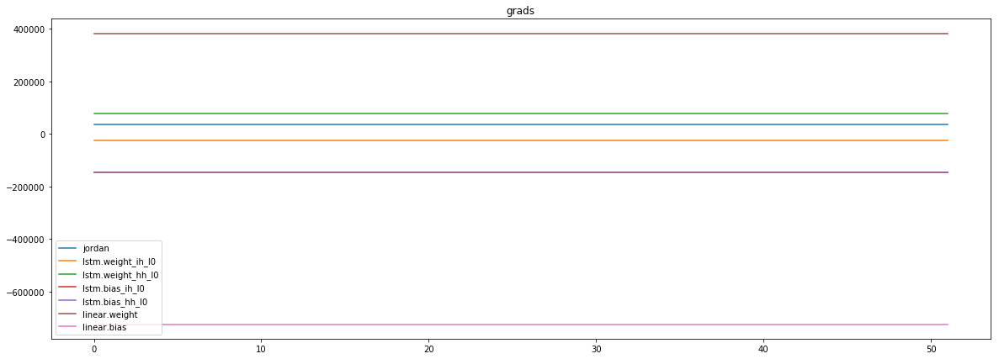

mean_p1 : 48197.6015625
mean_p2 : 9185.0849609375
mean_p3 : -22145.55859375


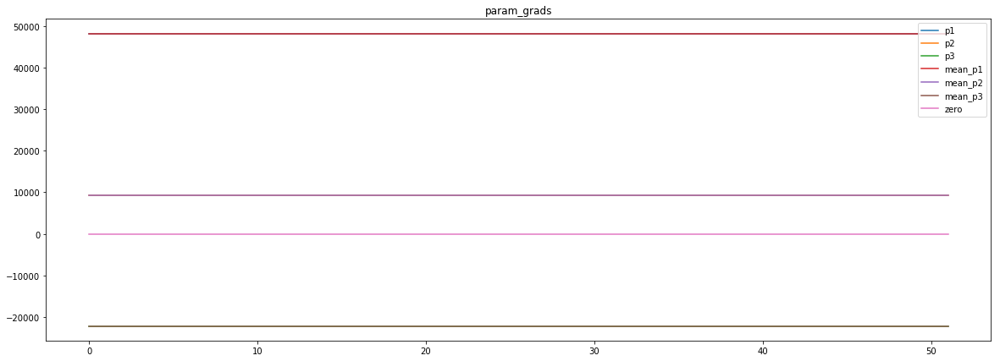

Epoch [0] 
     train_loss[810050.1286057692] 
     eval_train[72.76354480706729] 
     eval_test[73.70603952624582]



aux preds: -1.1880602836608887           -0.2653706967830658           0.7115179896354675
main loss 609462.9332932692
aux loss 0.0
jord loss 0.0
combined loss 609462.9332932692 



Parameter containing:
tensor([[-1.1881, -0.2654,  0.7115]], requires_grad=True)


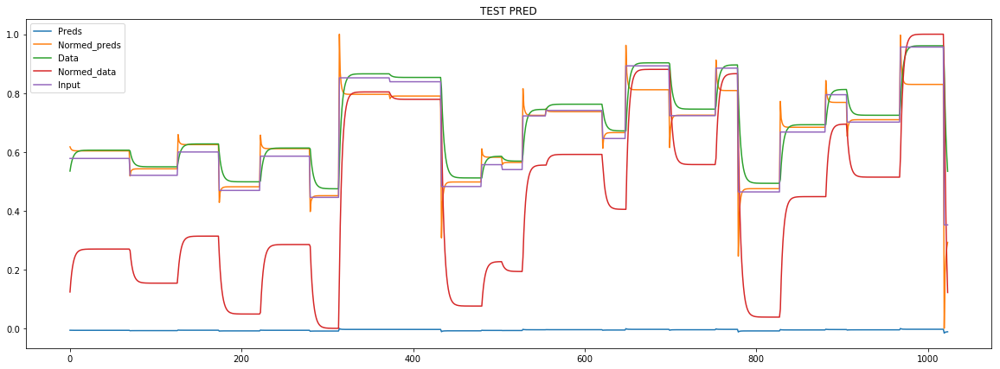

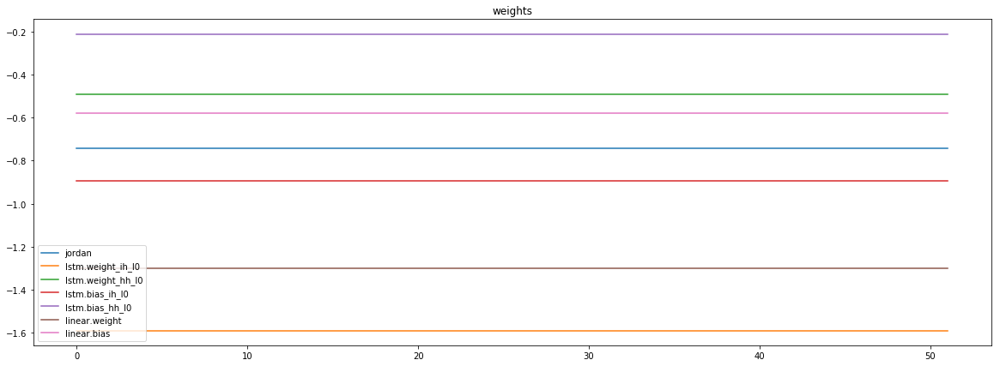

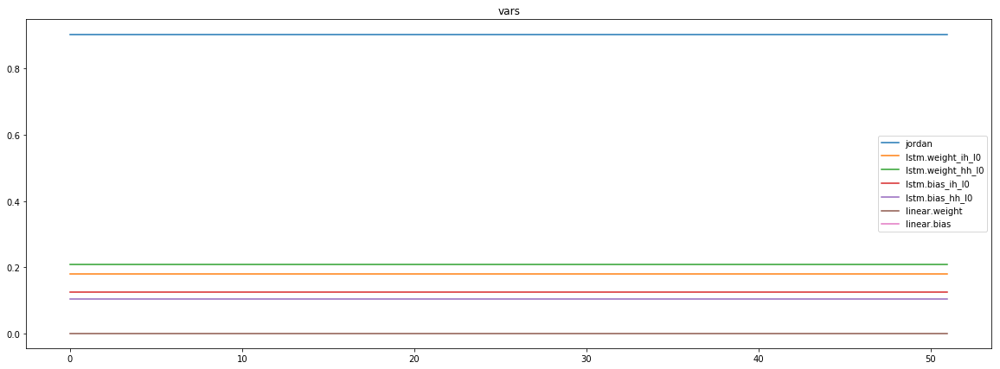

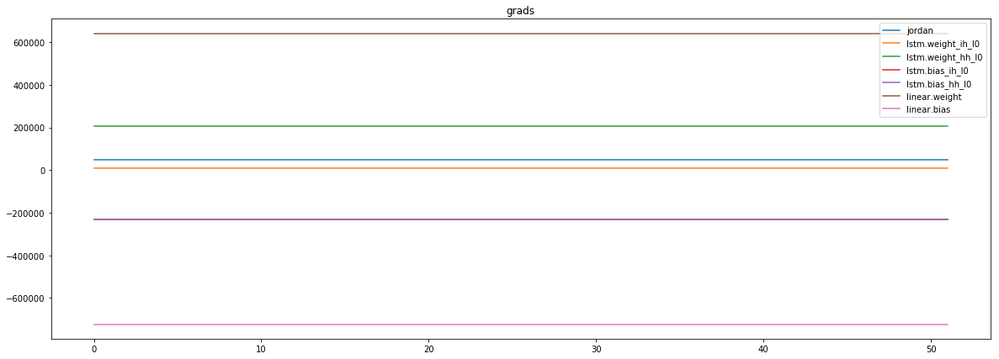

mean_p1 : 67679.375
mean_p2 : -15101.5244140625
mean_p3 : -5376.361328125


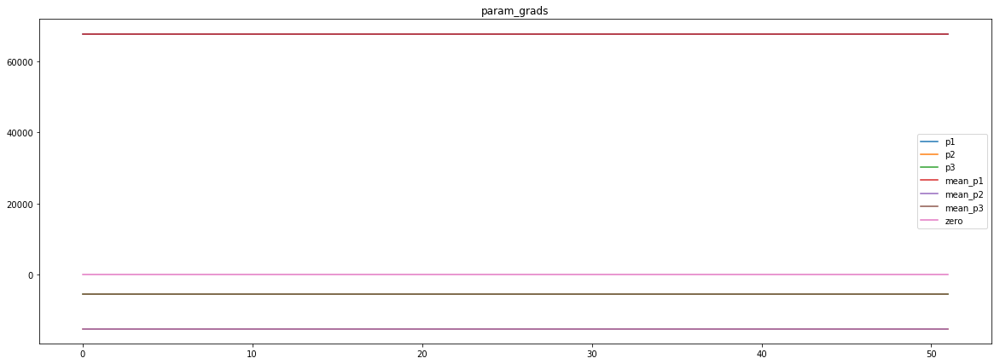

Epoch [1] 
     train_loss[609462.9332932692] 
     eval_train[51.172369993649994] 
     eval_test[52.10254491459239]



aux preds: -1.716412901878357           0.3179750442504883           1.008589506149292
main loss 350327.01201923075
aux loss 0.0
jord loss 0.0
combined loss 350327.01201923075 



Parameter containing:
tensor([[-1.7164,  0.3180,  1.0086]], requires_grad=True)


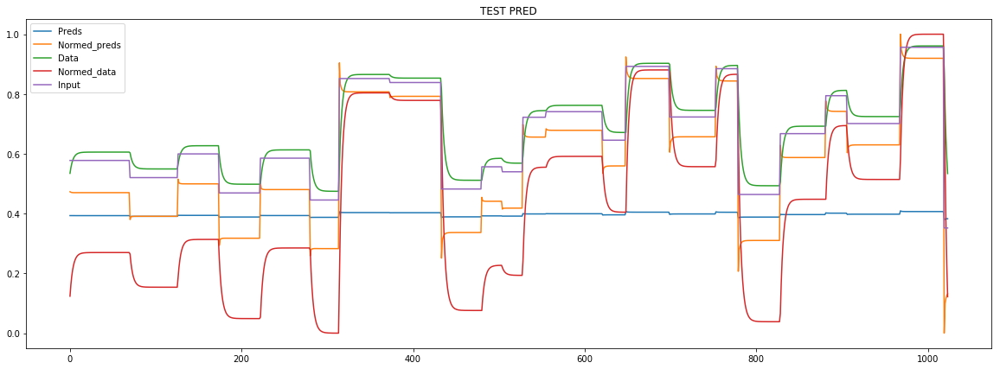

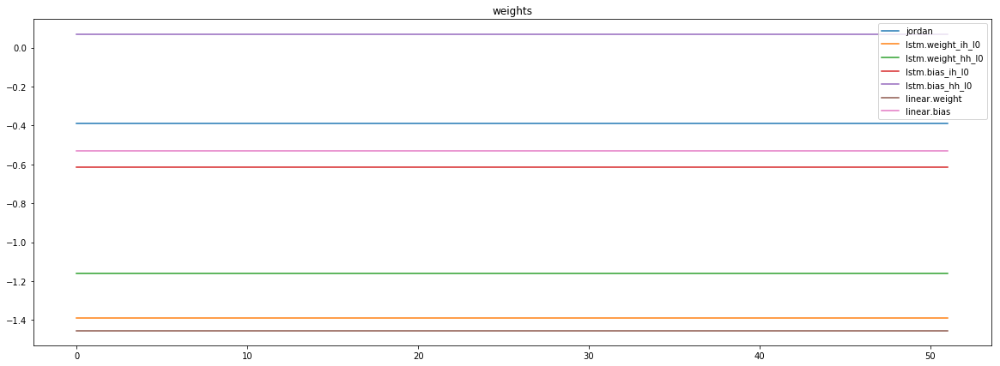

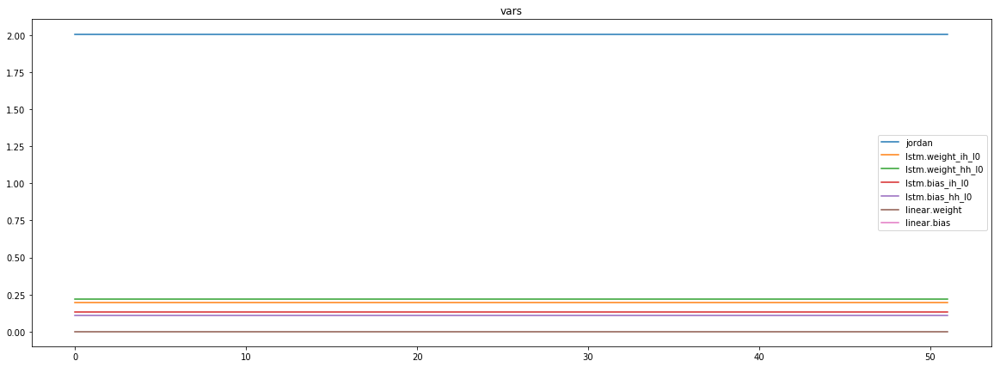

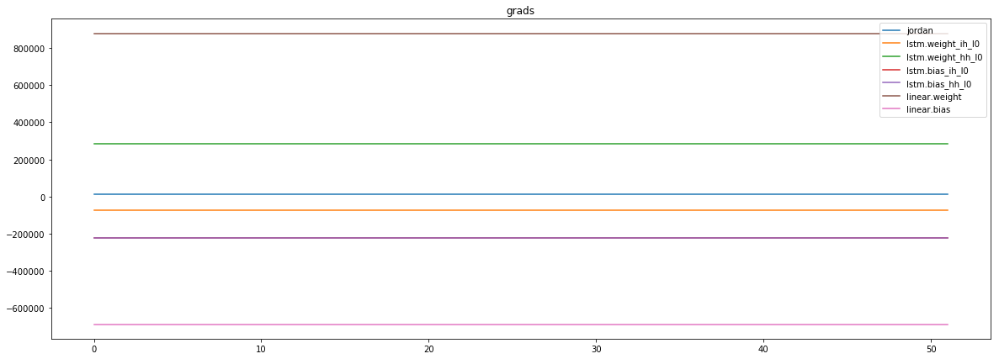

mean_p1 : 56053.27734375
mean_p2 : -40013.484375
mean_p3 : -1721.2454833984375


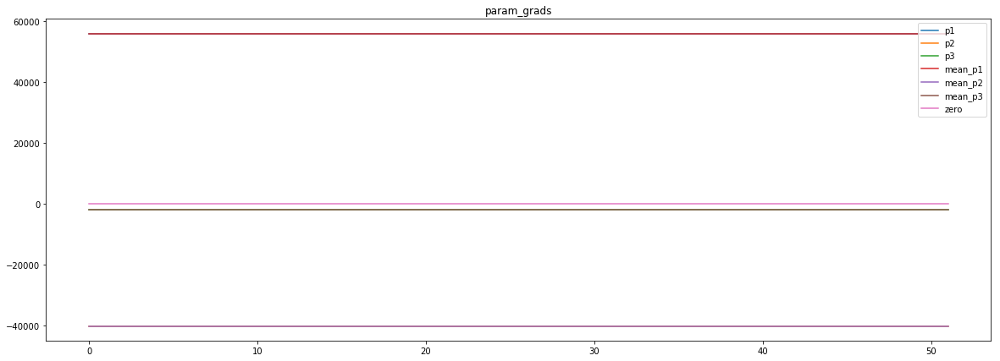

Epoch [2] 
     train_loss[350327.01201923075] 
     eval_train[23.409400408084576] 
     eval_test[24.29676045070995]



aux preds: -1.9718414545059204           0.7443834543228149           0.9122036099433899
main loss 130494.73903245192
aux loss 0.0
jord loss 0.0
combined loss 130494.73903245192 



Parameter containing:
tensor([[-1.9718,  0.7444,  0.9122]], requires_grad=True)


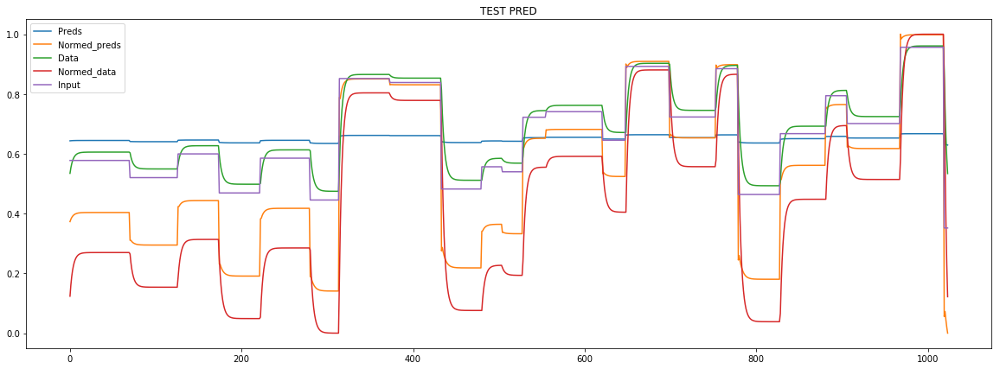

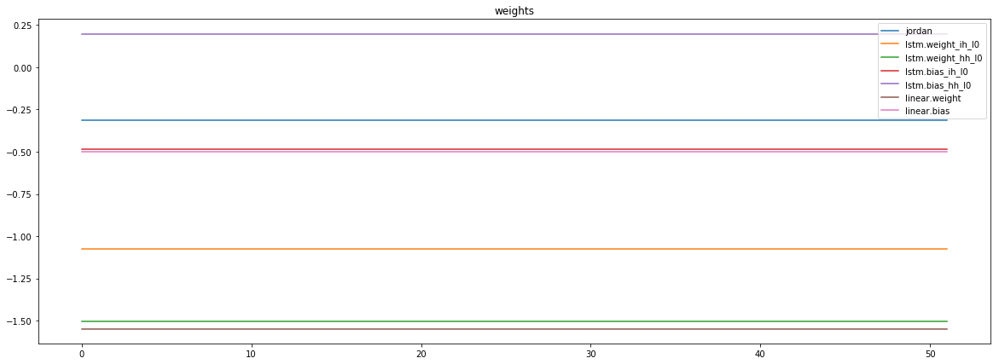

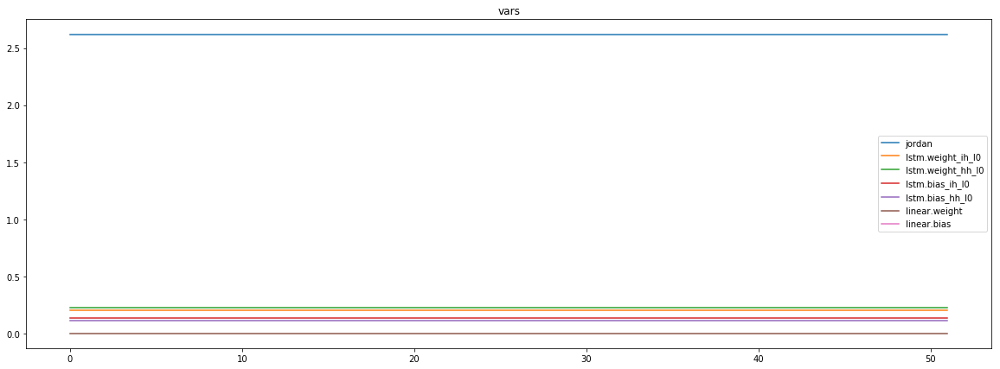

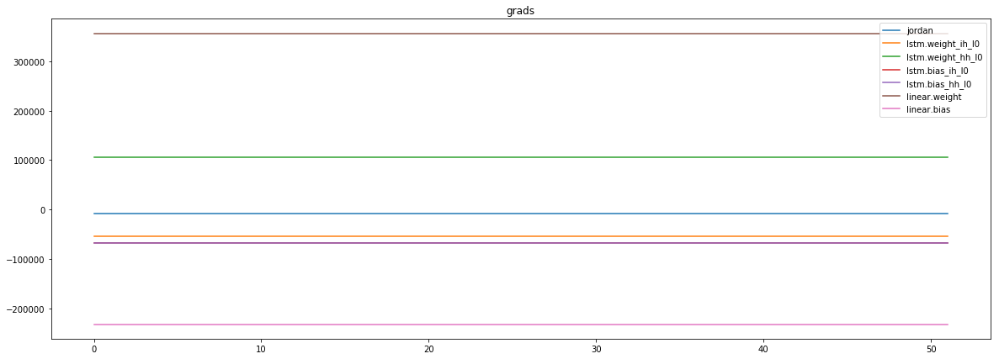

mean_p1 : 13001.2841796875
mean_p2 : -22513.8984375
mean_p3 : 1405.0201416015625


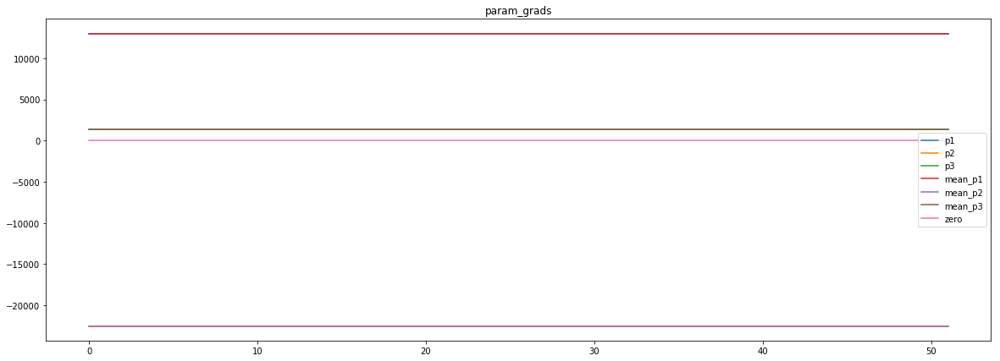

Epoch [3] 
     train_loss[130494.73903245192] 
     eval_train[14.247019309263964] 
     eval_test[14.232551076195456]



aux preds: -1.9184249639511108           0.9041611552238464           0.7688202857971191
main loss 92121.75946514423
aux loss 0.0
jord loss 0.0
combined loss 92121.75946514423 



Parameter containing:
tensor([[-1.9184,  0.9042,  0.7688]], requires_grad=True)


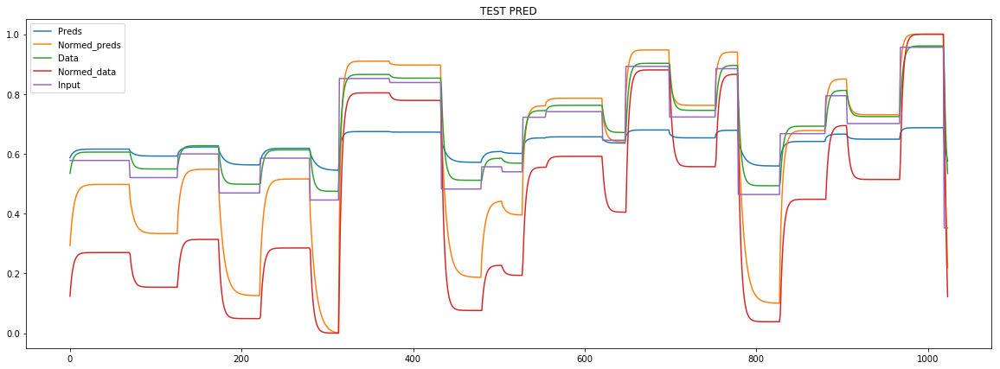

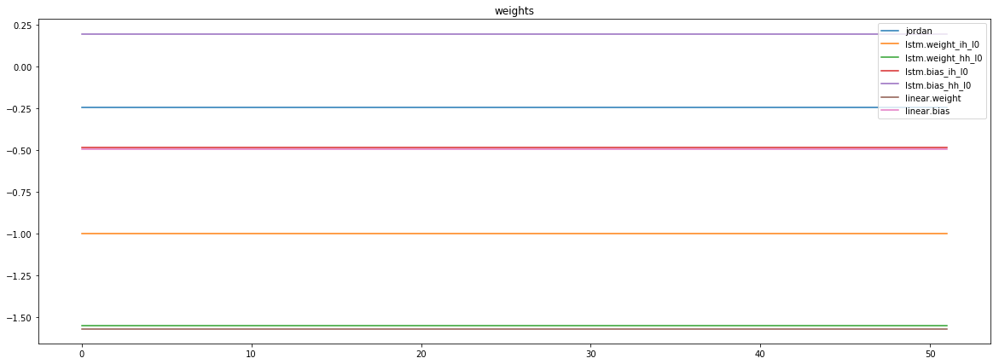

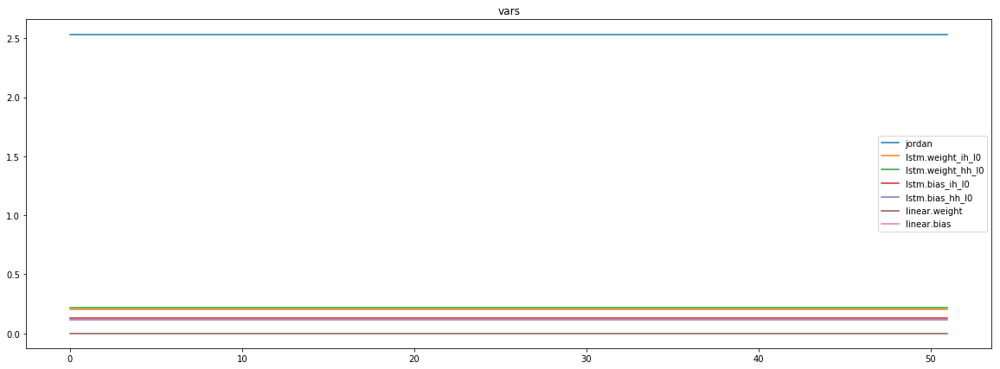

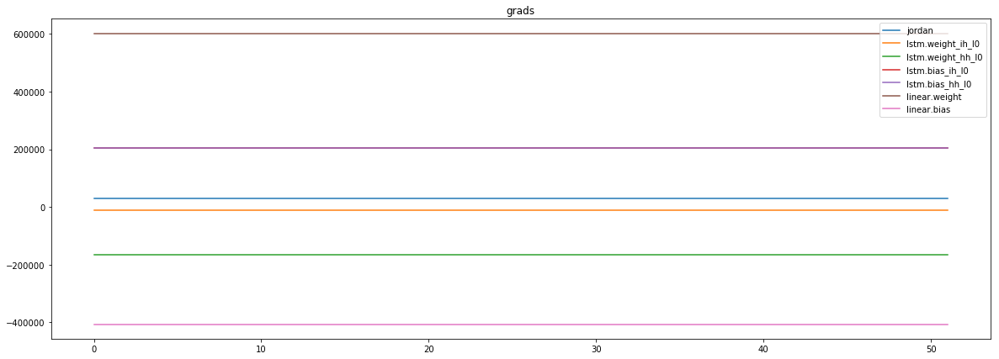

mean_p1 : 44557.5703125
mean_p2 : 242861.21875
mean_p3 : -256564.96875


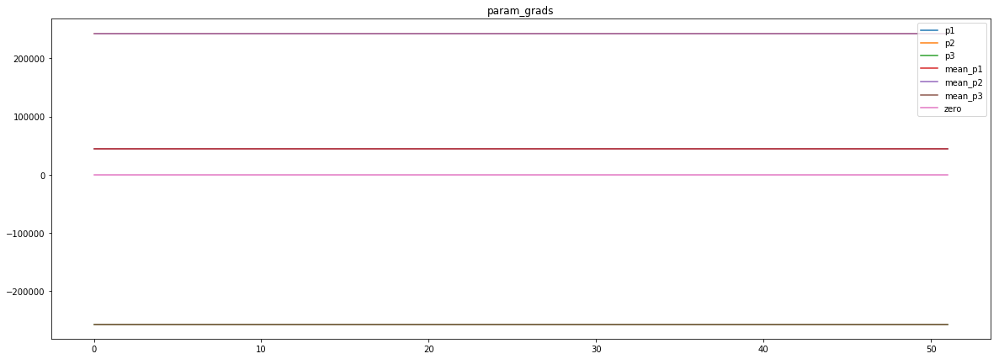

loss rate [0.6200847507656451]
Epoch [4] 
     train_loss[92121.75946514423] 
     eval_train[11.159009676713211] 
     eval_test[11.477474776181307]



aux preds: -1.941389560699463           0.9195332527160645           0.771324098110199
main loss 65920.90422175481
aux loss 0.0
jord loss 0.0
combined loss 65920.90422175481 



Parameter containing:
tensor([[-1.9414,  0.9195,  0.7713]], requires_grad=True)


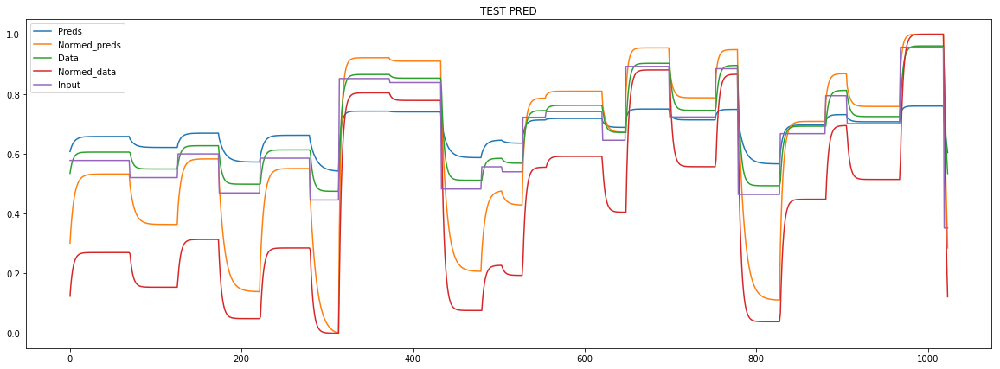

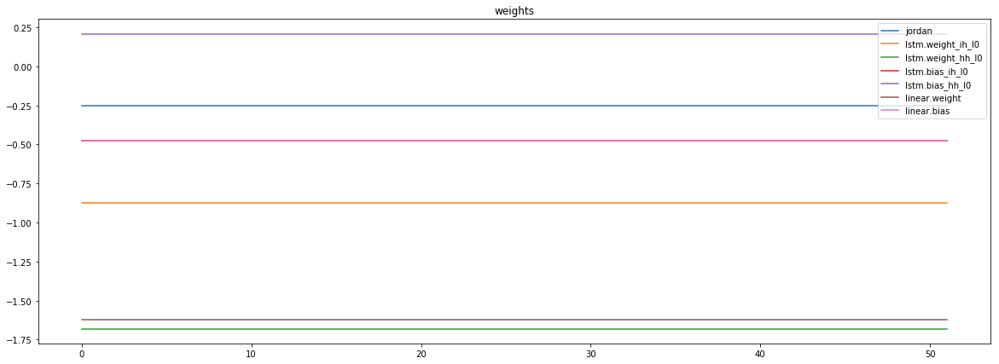

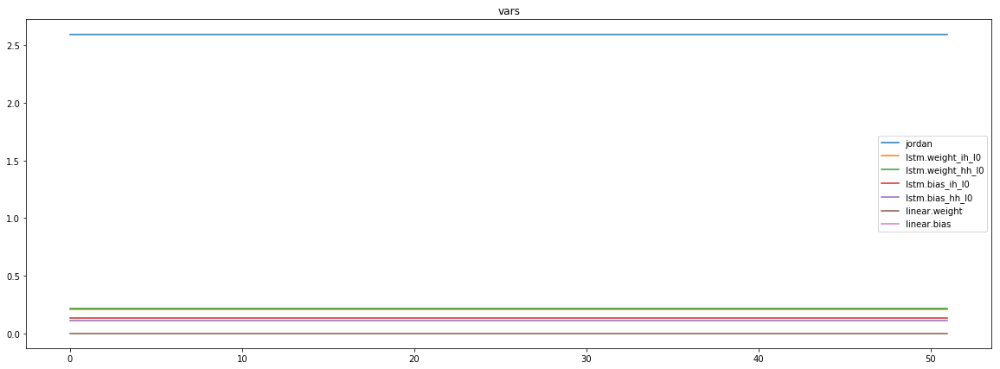

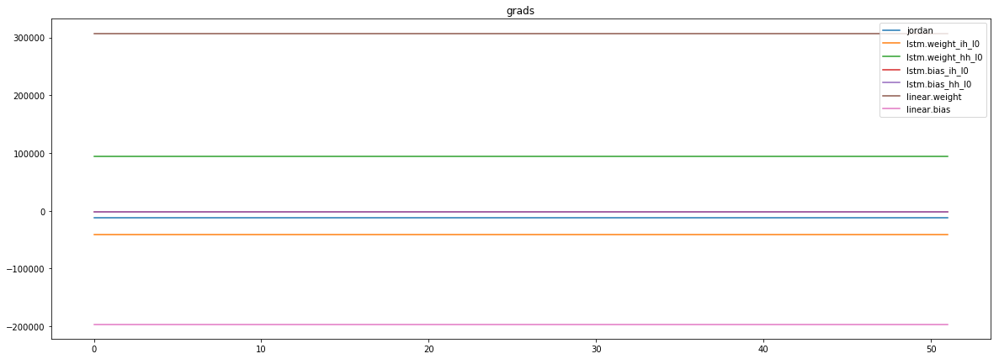

mean_p1 : 3691.083984375
mean_p2 : -3066.587890625
mean_p3 : -12546.57421875


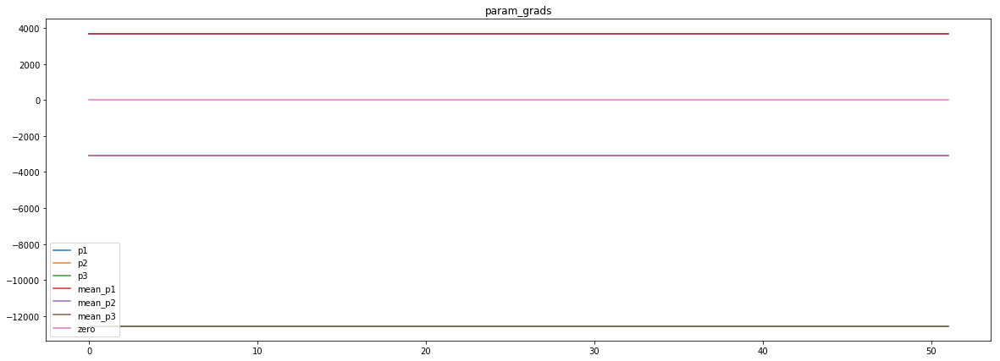

loss rate [0.42774596079227445]
Epoch [5] 
     train_loss[65920.90422175481] 
     eval_train[9.303081961778494] 
     eval_test[9.538861816579645]



aux preds: -1.9212502241134644           0.9290790557861328           0.7760839462280273
main loss 48106.12729116587
aux loss 0.0
jord loss 0.0
combined loss 48106.12729116587 



Parameter containing:
tensor([[-1.9213,  0.9291,  0.7761]], requires_grad=True)


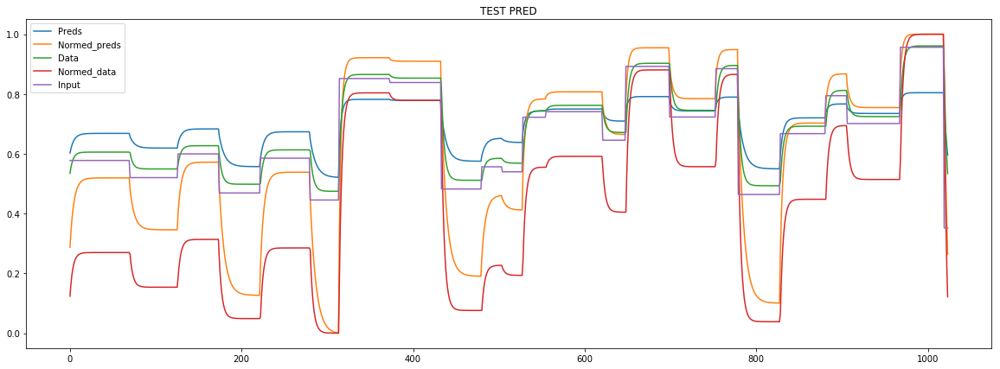

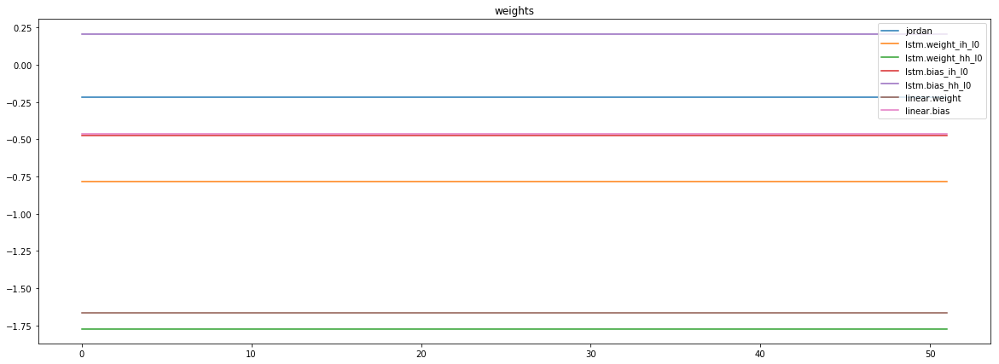

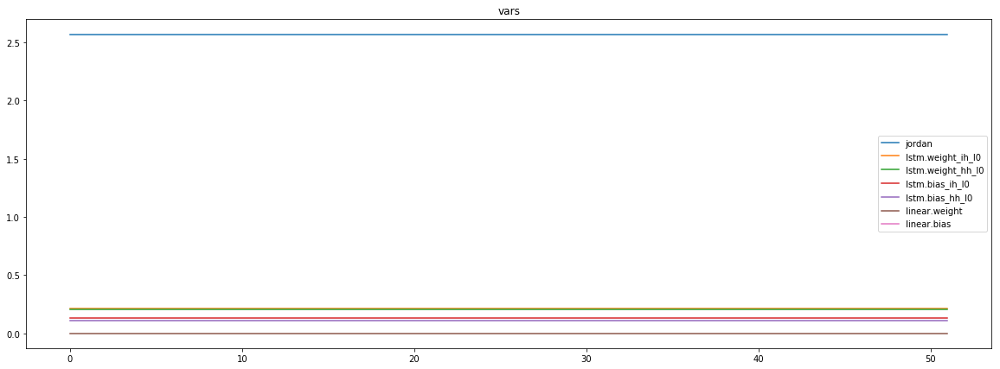

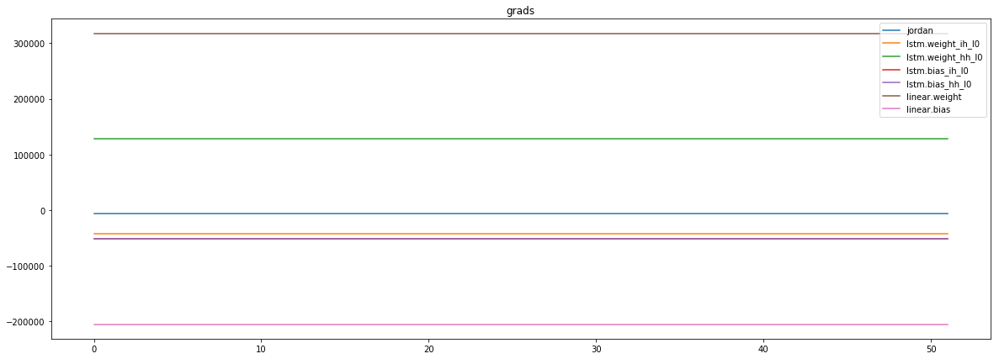

mean_p1 : 10139.130859375
mean_p2 : -20735.955078125
mean_p3 : 4198.19384765625


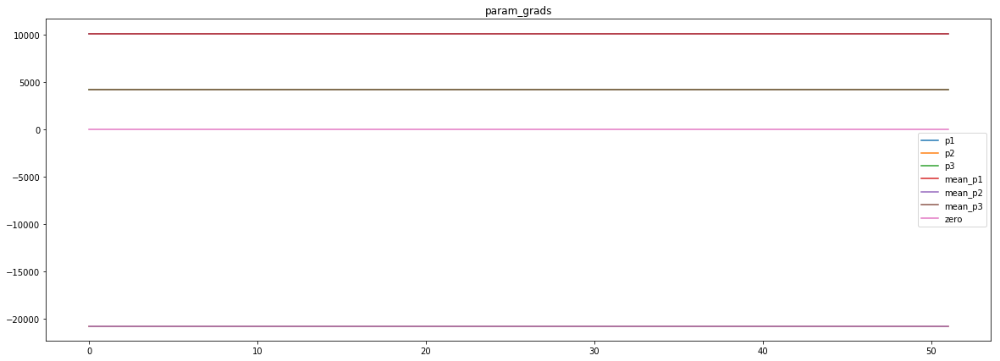

loss rate [0.2942798381717461]
Epoch [6] 
     train_loss[48106.12729116587] 
     eval_train[8.111050738738133] 
     eval_test[8.291950236667287]



aux preds: -1.8937617540359497           0.9391575455665588           0.778239369392395
main loss 37245.28429236779
aux loss 0.0
jord loss 0.0
combined loss 37245.28429236779 



Parameter containing:
tensor([[-1.8938,  0.9392,  0.7782]], requires_grad=True)


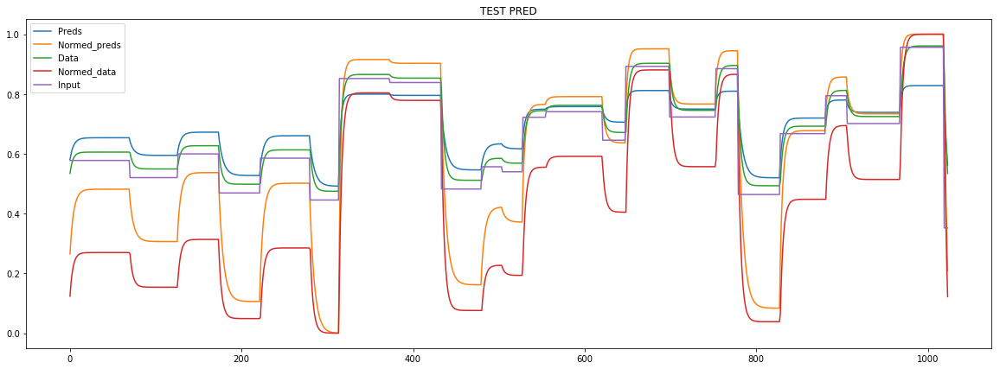

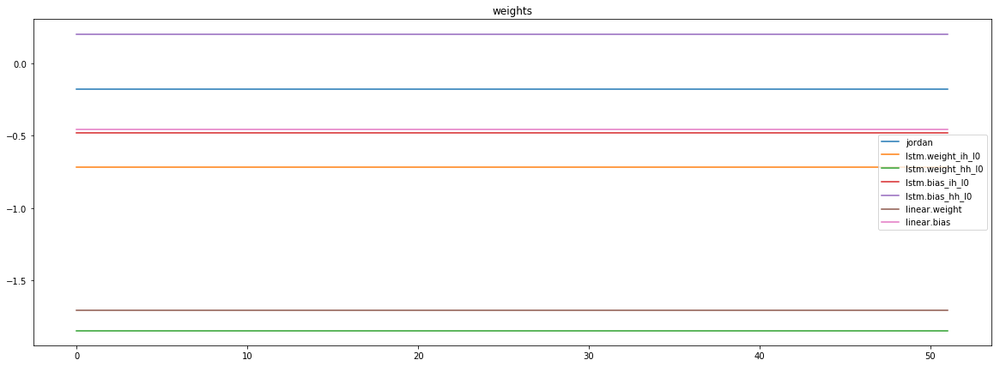

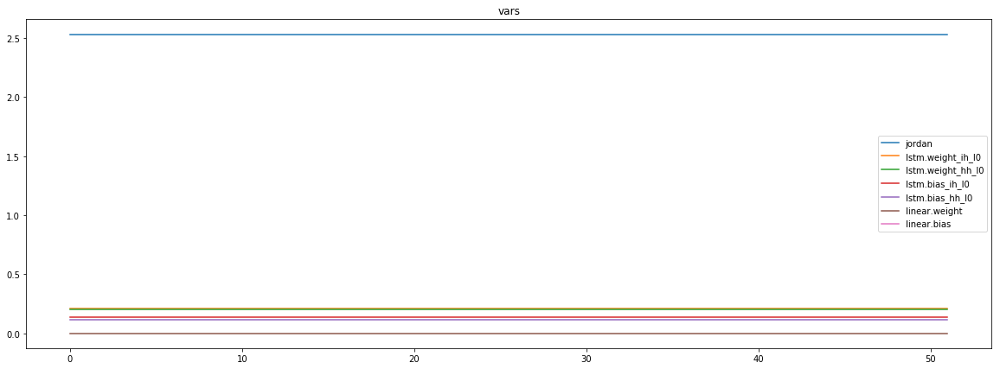

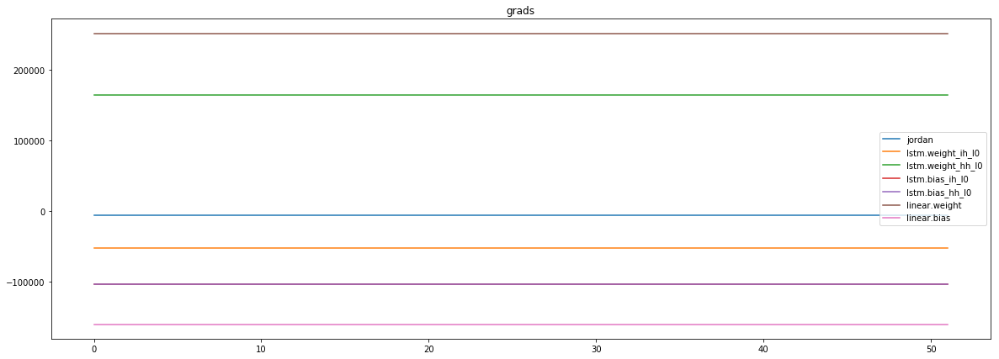

mean_p1 : 8875.7470703125
mean_p2 : -55965.38671875
mean_p3 : 41022.421875


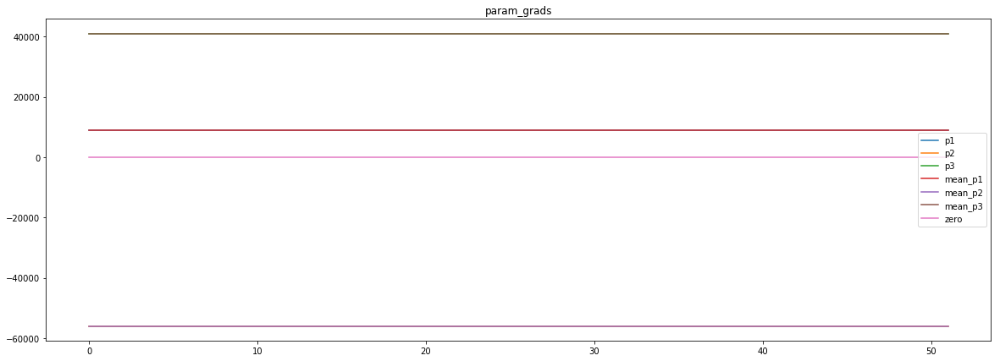

loss rate [0.2642756024770111]
Epoch [7] 
     train_loss[37245.28429236779] 
     eval_train[7.065833628177643] 
     eval_test[7.187607223337347]



aux preds: -1.8910586833953857           0.9505248665809631           0.7768629193305969
main loss 30101.543719951922
aux loss 0.0
jord loss 0.0
combined loss 30101.543719951922 



Parameter containing:
tensor([[-1.8911,  0.9505,  0.7769]], requires_grad=True)


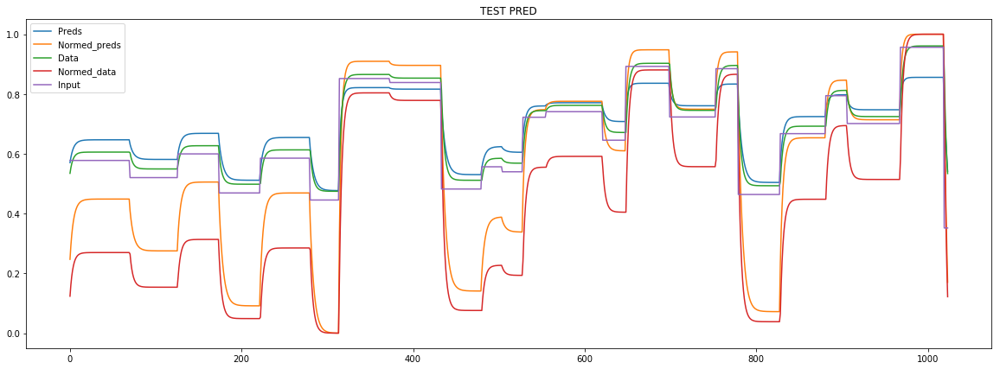

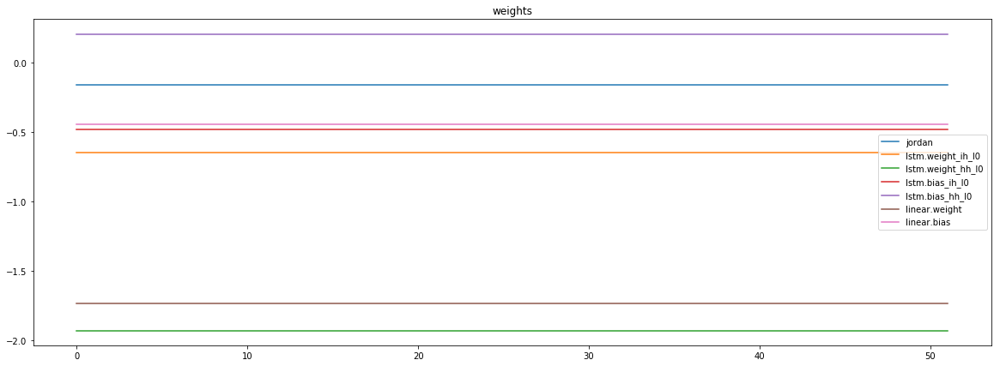

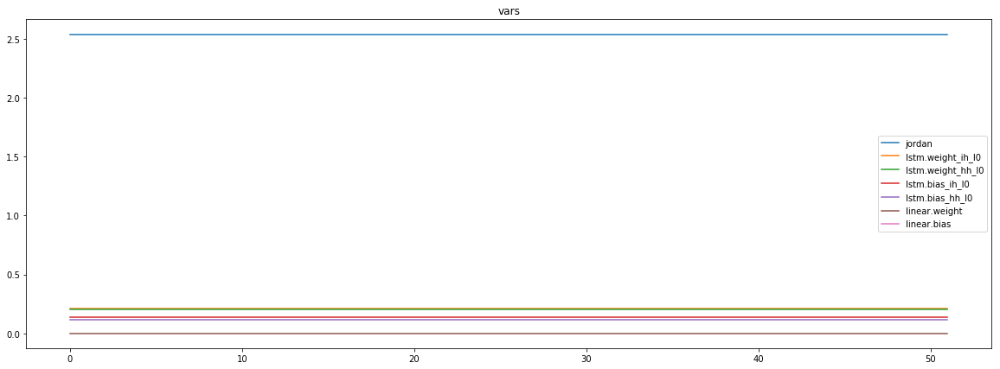

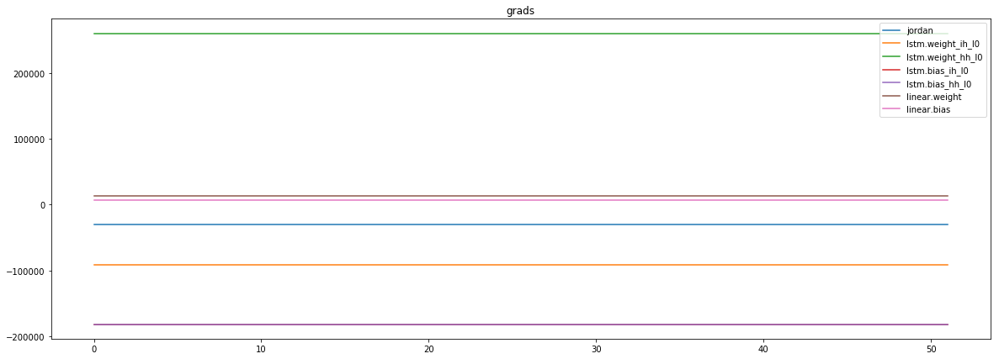

mean_p1 : -15695.50390625
mean_p2 : -165381.0
mean_p3 : 150851.15625


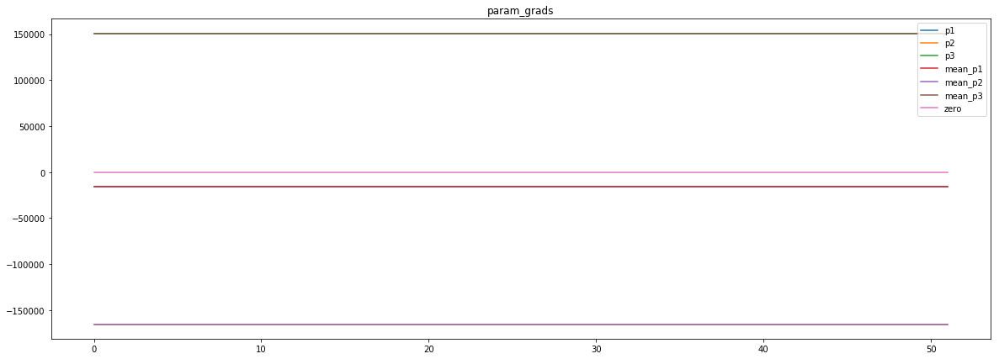

loss rate [0.22208751536715843]
Epoch [8] 
     train_loss[30101.543719951922] 
     eval_train[6.428584607747885] 
     eval_test[6.487380233677951]



aux preds: -1.8801249265670776           0.9583401083946228           0.776148796081543
main loss 24888.527400090145
aux loss 0.0
jord loss 0.0
combined loss 24888.527400090145 



Parameter containing:
tensor([[-1.8801,  0.9583,  0.7761]], requires_grad=True)


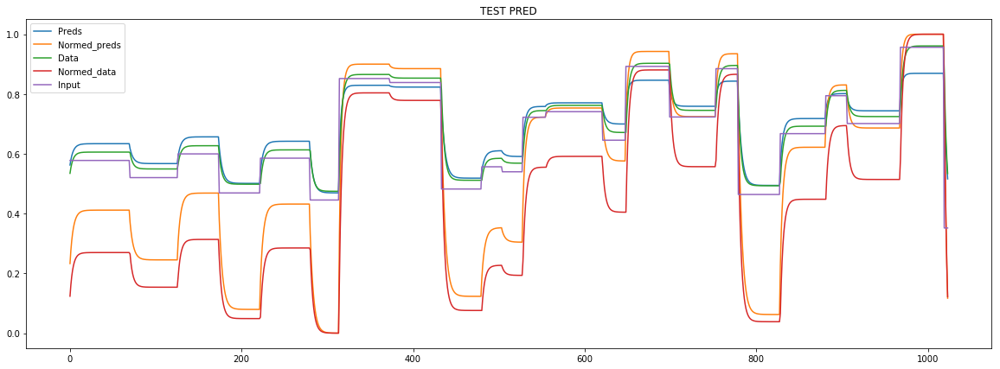

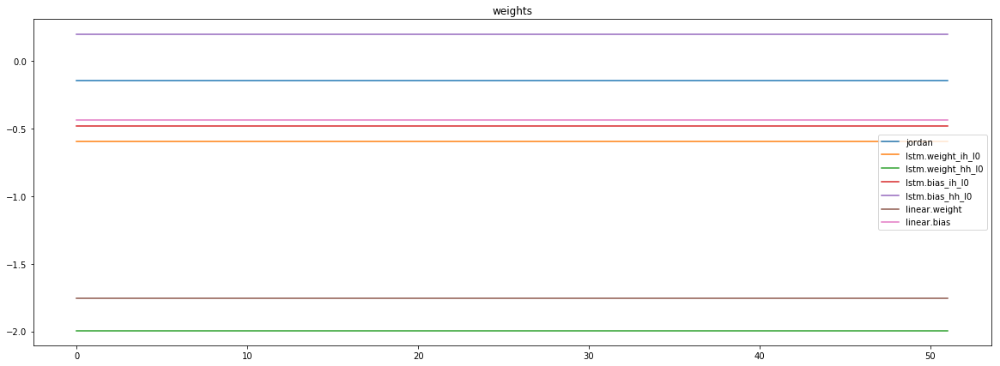

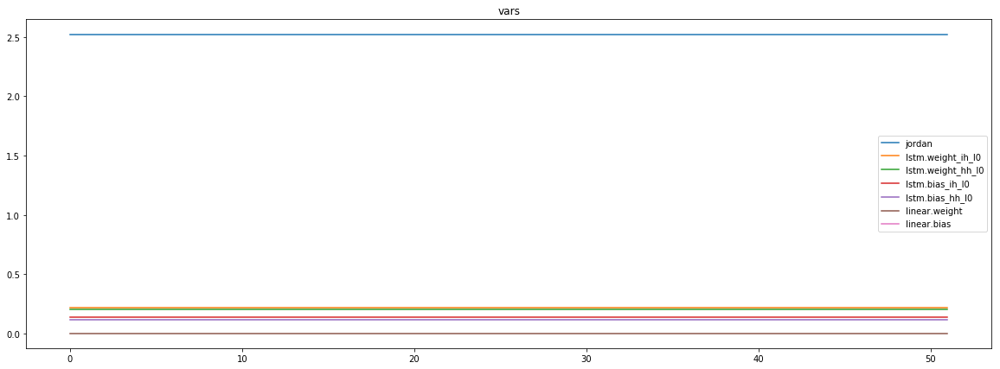

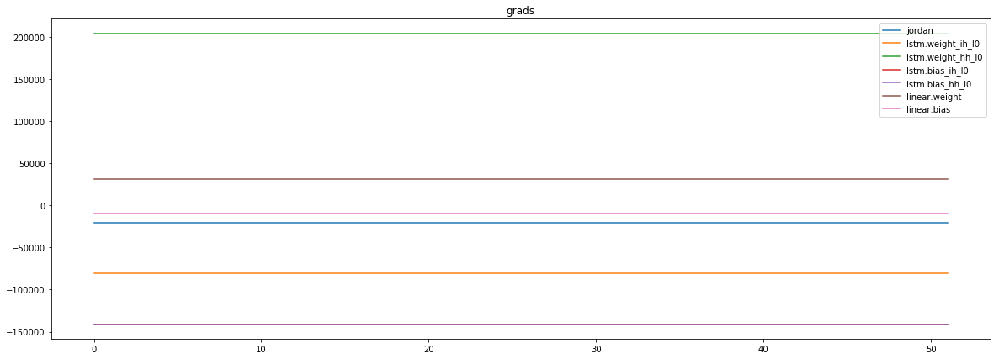

mean_p1 : -9493.6728515625
mean_p2 : -121523.546875
mean_p3 : 110464.390625


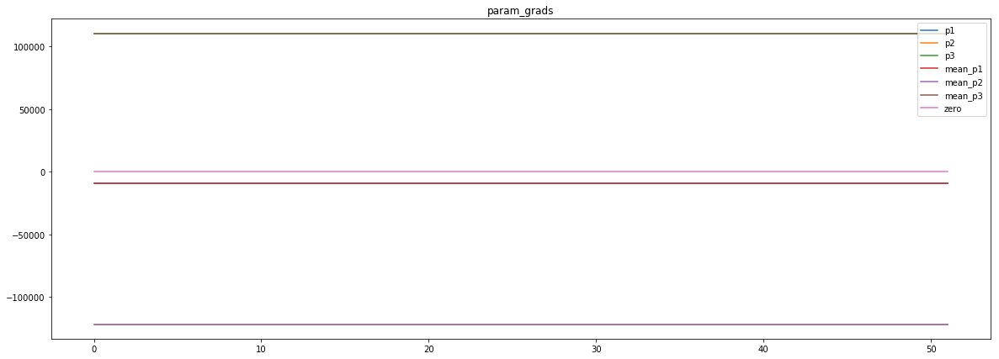

loss rate [0.18725670486284152]
Epoch [9] 
     train_loss[24888.527400090145] 
     eval_train[5.919040145782324] 
     eval_test[5.951160441745412]



aux preds: -1.8781205415725708           0.9649543762207031           0.7750228643417358
main loss 20548.27088341346
aux loss 0.0
jord loss 0.0
combined loss 20548.27088341346 



Parameter containing:
tensor([[-1.8781,  0.9650,  0.7750]], requires_grad=True)


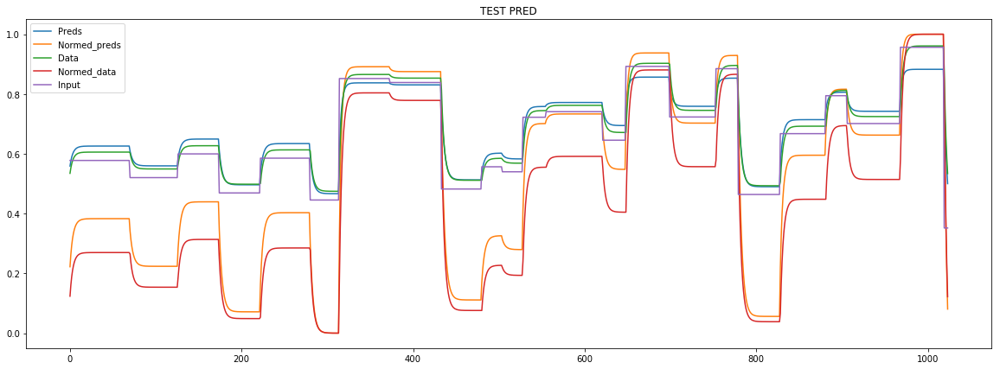

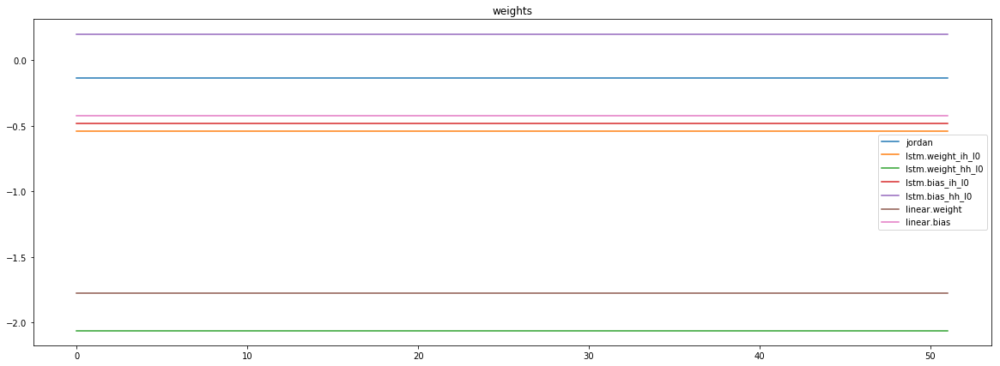

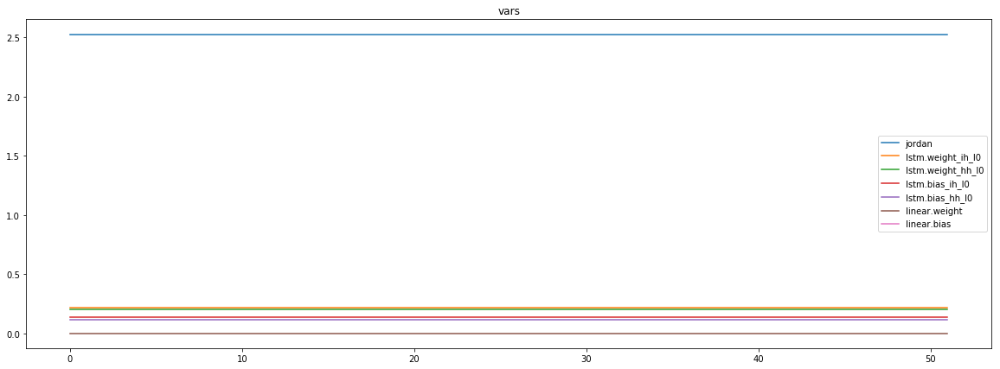

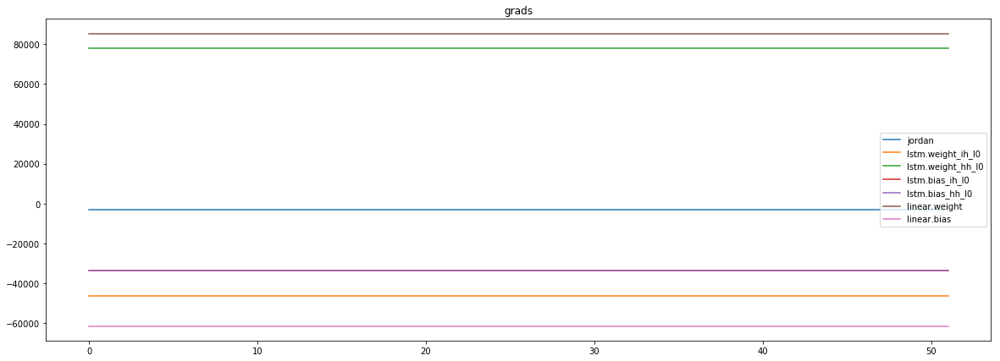

mean_p1 : 1031.654541015625
mean_p2 : -24111.818359375
mean_p3 : 19869.681640625


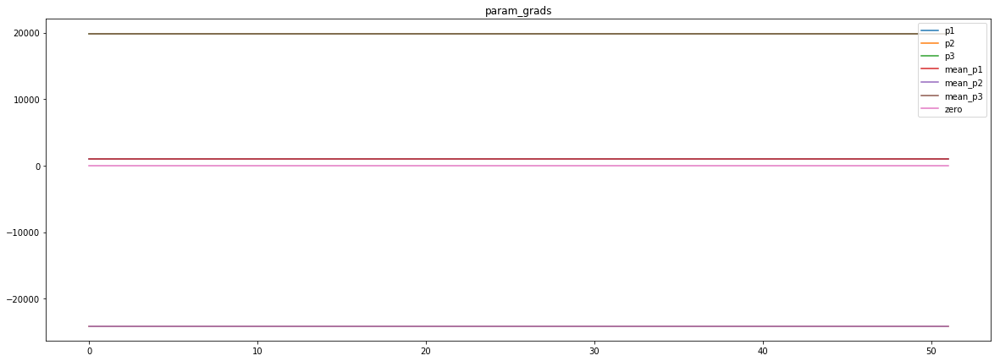

loss rate [0.14566017281376853]
Epoch [10] 
     train_loss[20548.27088341346] 
     eval_train[5.566860694151658] 
     eval_test[5.589133268052882]



aux preds: -1.8774378299713135           0.9689456820487976           0.7746822834014893
main loss 17554.474853515625
aux loss 0.0
jord loss 0.0
combined loss 17554.474853515625 



Parameter containing:
tensor([[-1.8774,  0.9689,  0.7747]], requires_grad=True)


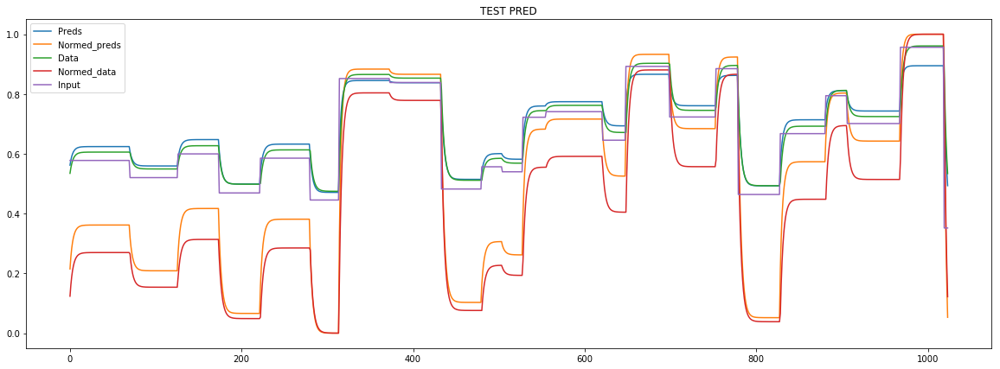

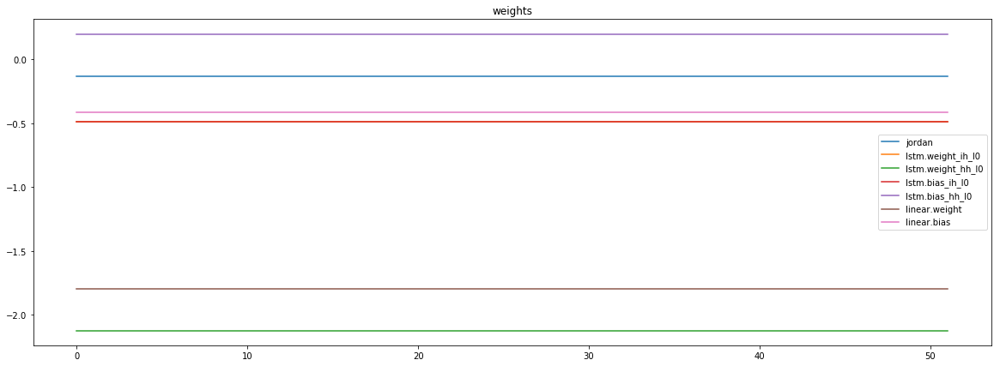

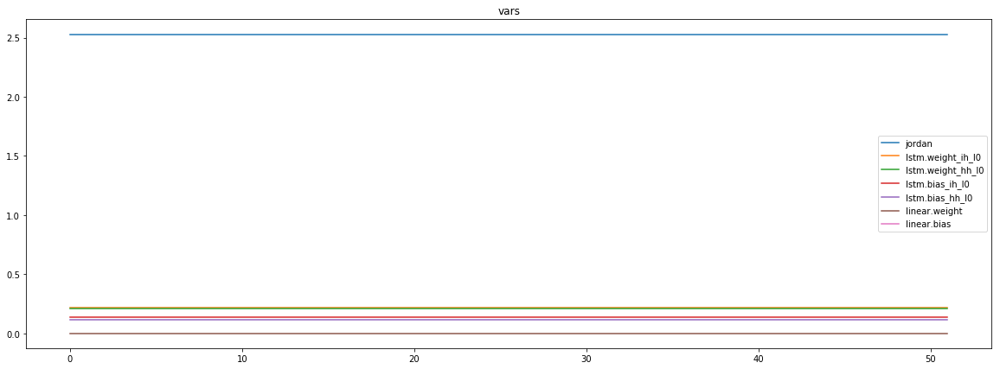

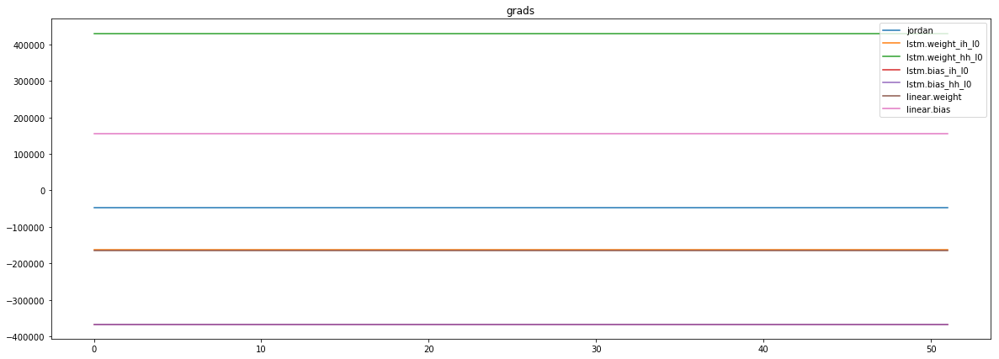

mean_p1 : -28045.462890625
mean_p2 : -309406.65625
mean_p3 : 291169.375


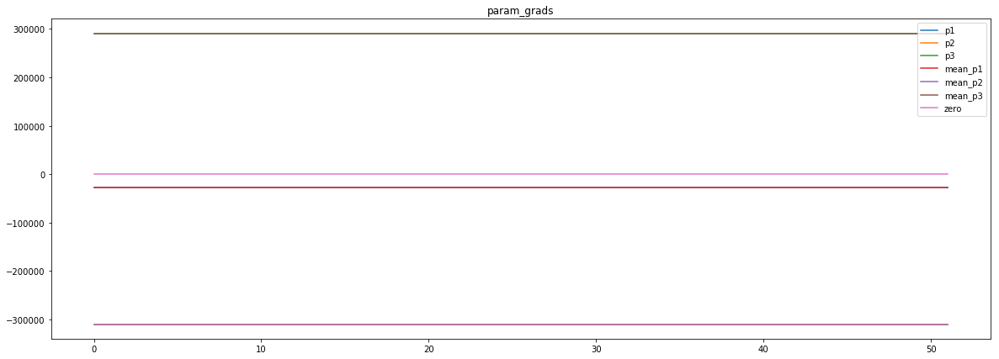

loss rate [0.11025727849865696]
Epoch [11] 
     train_loss[17554.474853515625] 
     eval_train[5.317394542006346] 
     eval_test[5.3466638922691345]



aux preds: -1.8815200328826904           0.973518431186676           0.7721266746520996
main loss 15757.32391826923
aux loss 0.0
jord loss 0.0
combined loss 15757.32391826923 



Parameter containing:
tensor([[-1.8815,  0.9735,  0.7721]], requires_grad=True)


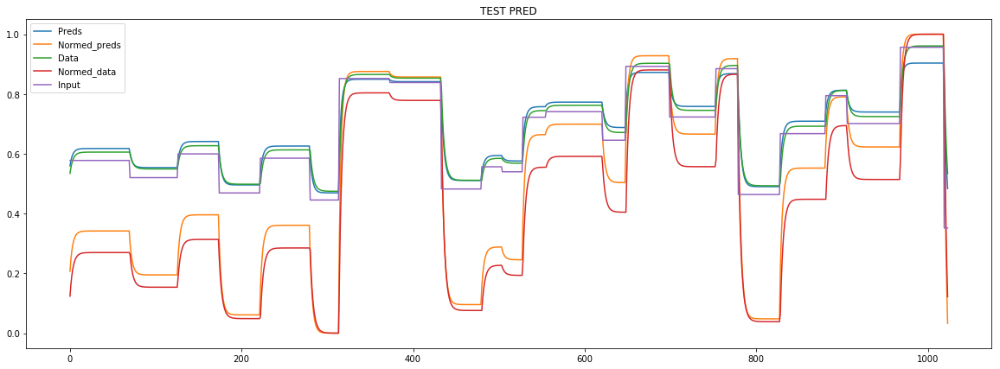

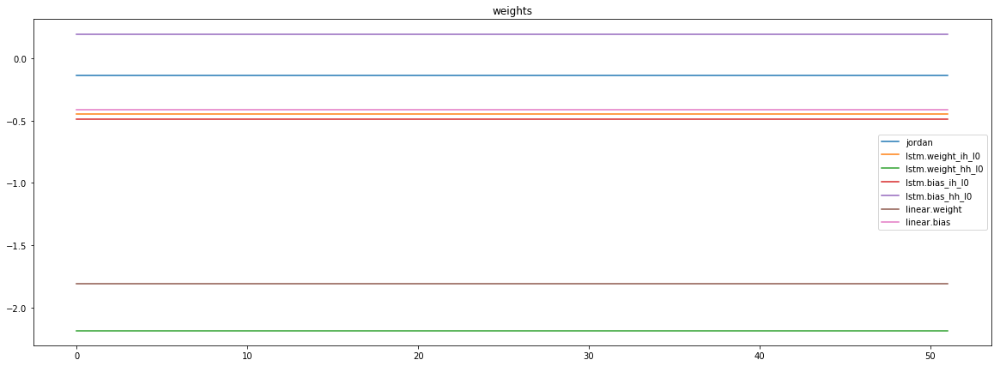

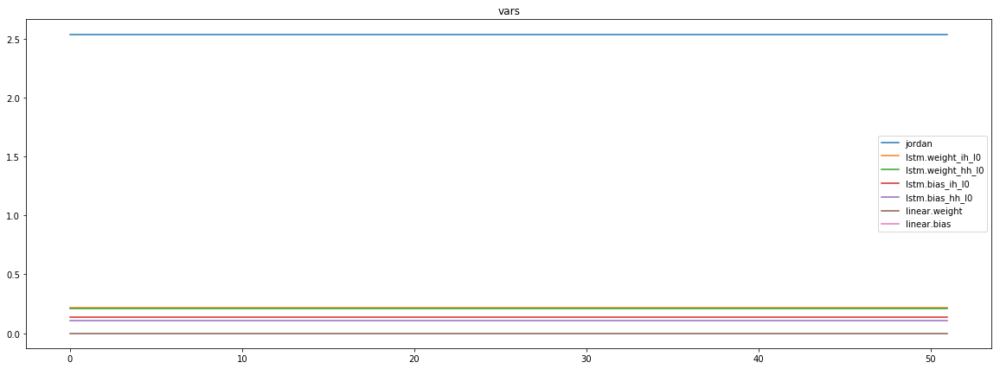

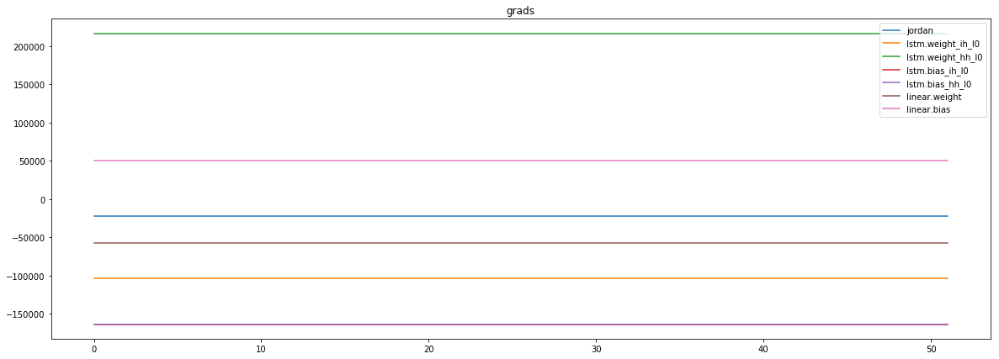

mean_p1 : -13557.013671875
mean_p2 : -142458.59375
mean_p3 : 133788.46875


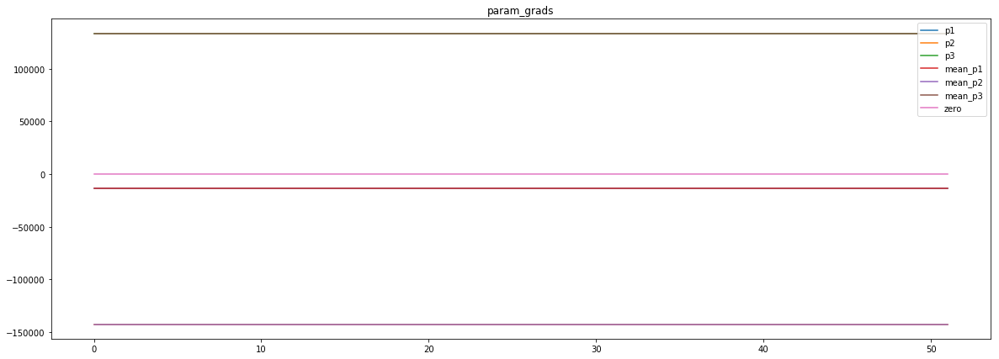

loss rate [0.0919021944175199]
Epoch [12] 
     train_loss[15757.32391826923] 
     eval_train[5.081775099039078] 
     eval_test[5.1116697138006035]



aux preds: -1.8874059915542603           0.9799841642379761           0.7672044038772583
main loss 12481.602454552283
aux loss 0.0
jord loss 0.0
combined loss 12481.602454552283 



Parameter containing:
tensor([[-1.8874,  0.9800,  0.7672]], requires_grad=True)


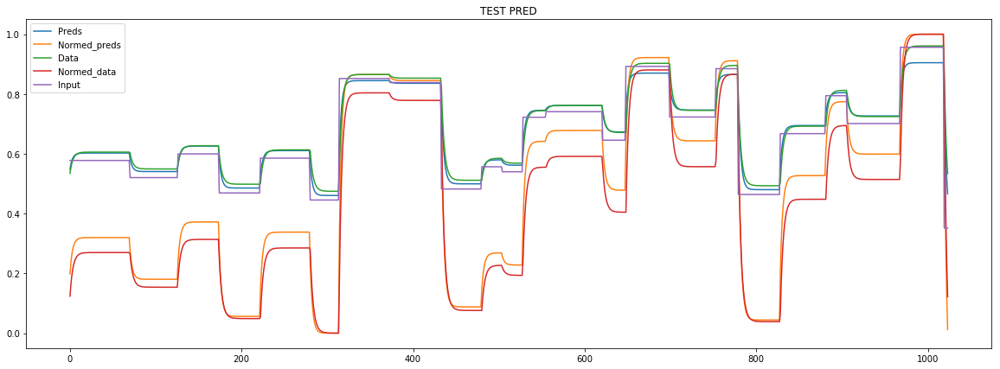

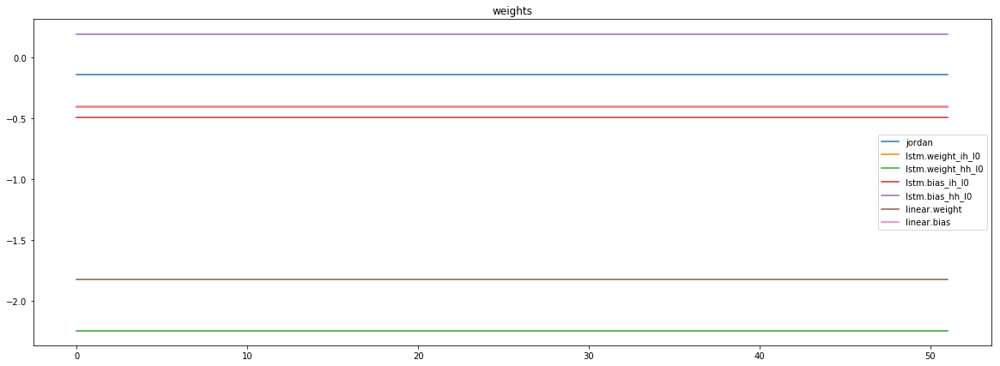

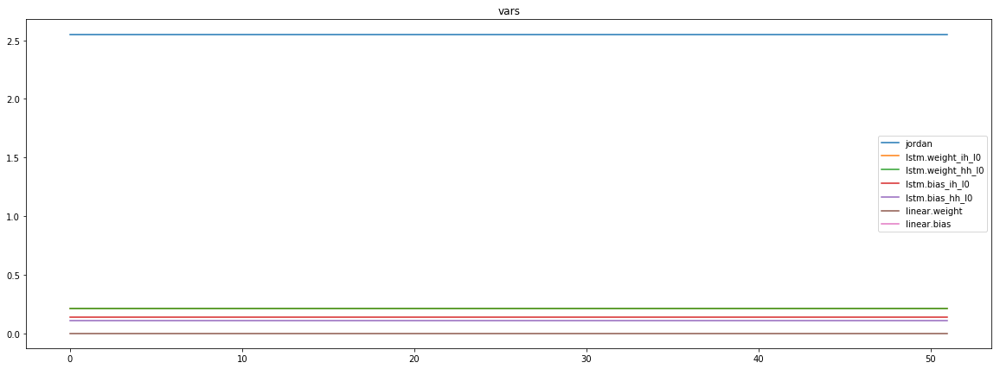

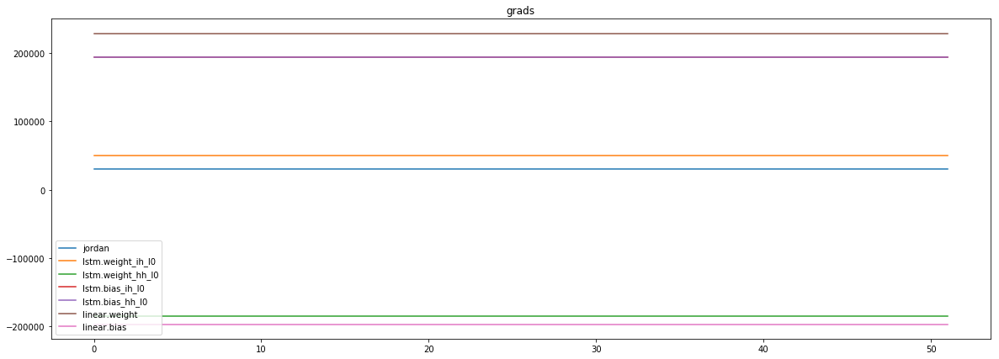

mean_p1 : 21914.548828125
mean_p2 : 176368.265625
mean_p3 : -167406.265625


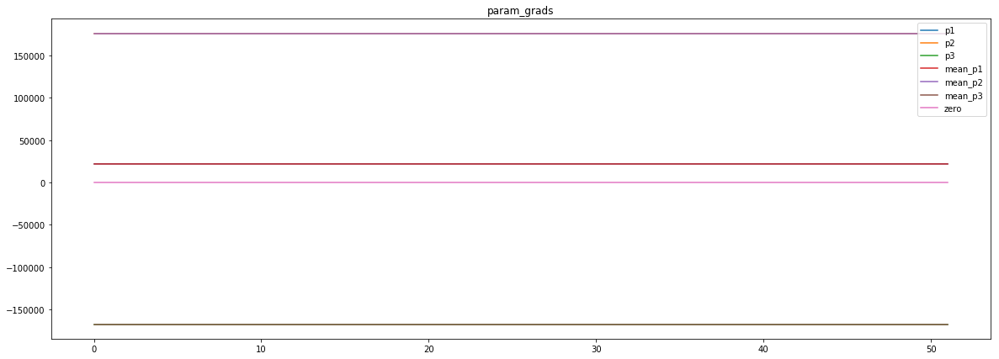

loss rate [0.05513221897663878]
Epoch [13] 
     train_loss[12481.602454552283] 
     eval_train[5.022544773725363] 
     eval_test[5.054244805466045]



aux preds: -1.9048644304275513           0.9812464714050293           0.7666398286819458
main loss 10645.374624399039
aux loss 0.0
jord loss 0.0
combined loss 10645.374624399039 



Parameter containing:
tensor([[-1.9049,  0.9812,  0.7666]], requires_grad=True)


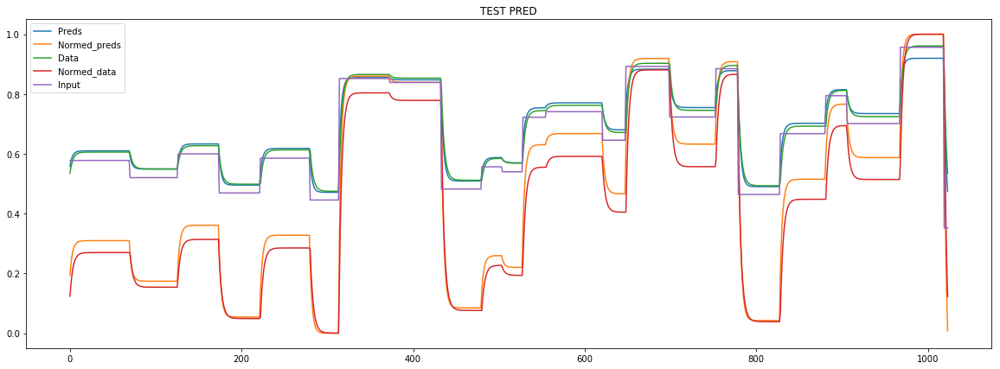

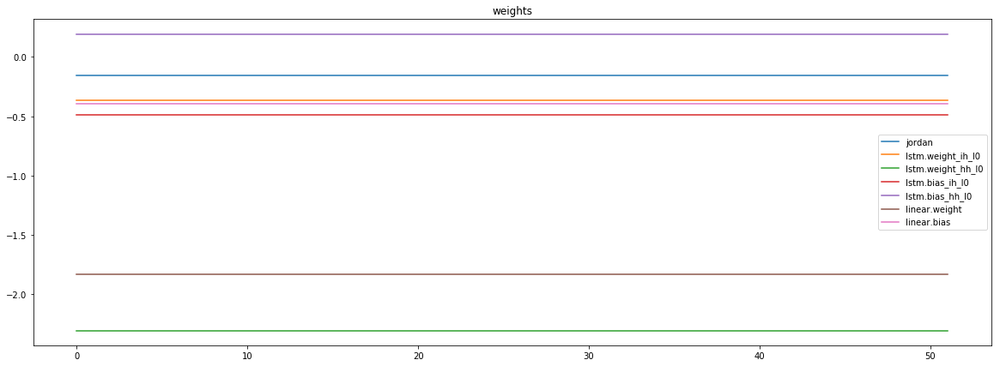

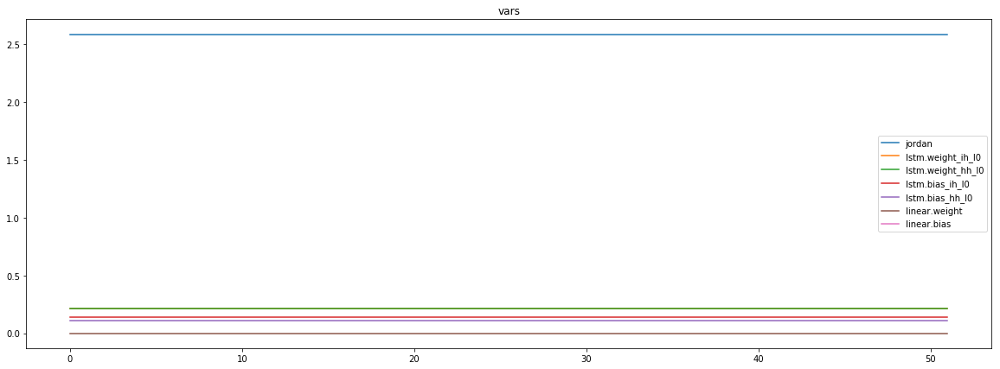

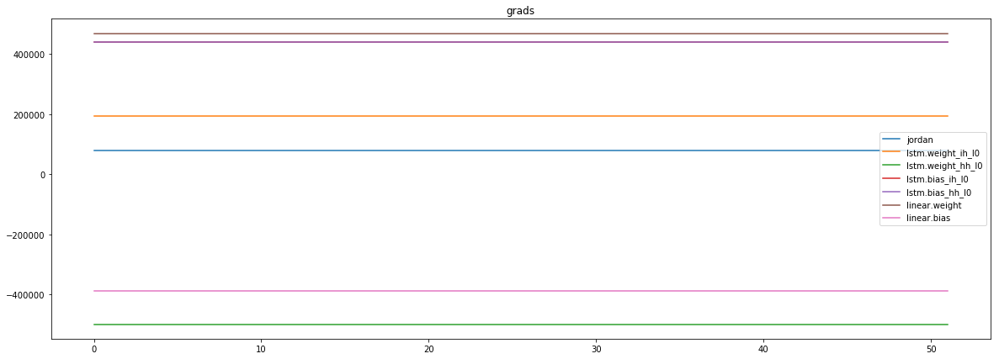

mean_p1 : 55028.640625
mean_p2 : 421073.3125
mean_p3 : -396891.03125


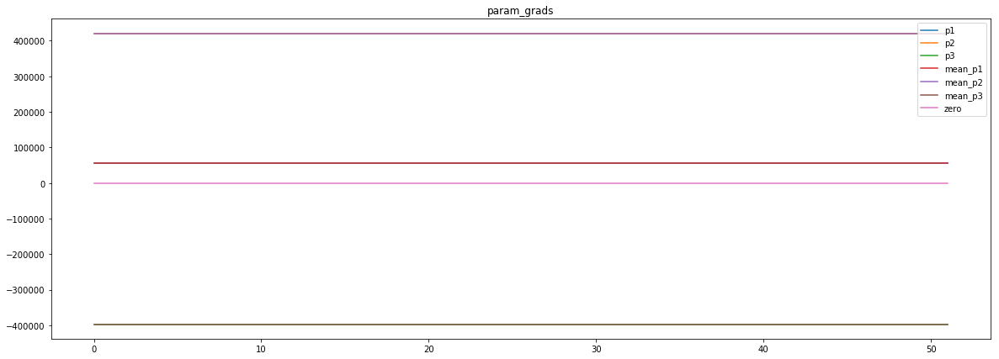

loss rate [0.07618865462721436]
Epoch [14] 
     train_loss[10645.374624399039] 
     eval_train[4.74453357148629] 
     eval_test[4.776898644187233]



aux preds: -1.9178481101989746           0.98646080493927           0.7612871527671814
main loss 9505.512779822717
aux loss 0.0
jord loss 0.0
combined loss 9505.512779822717 



Parameter containing:
tensor([[-1.9178,  0.9865,  0.7613]], requires_grad=True)


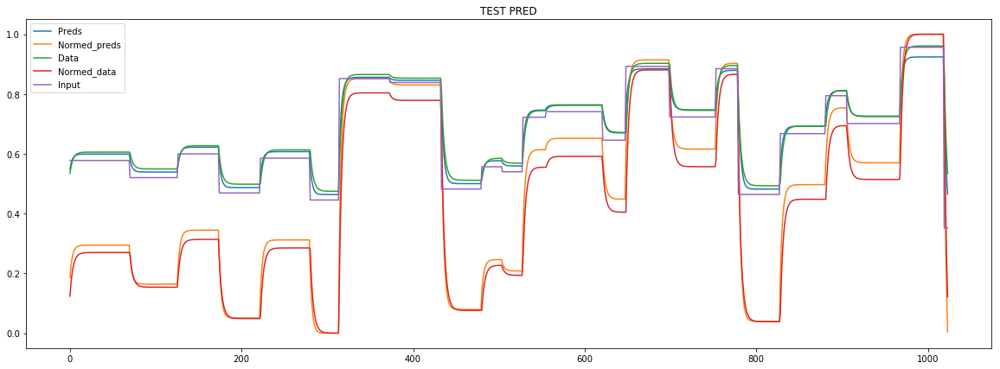

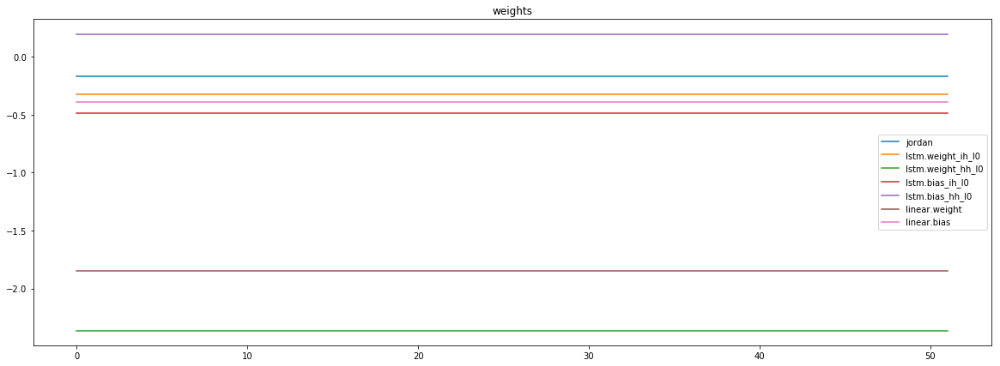

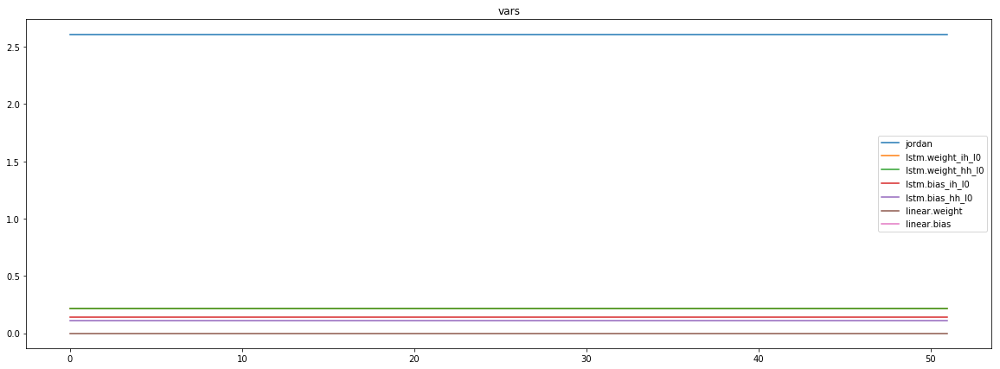

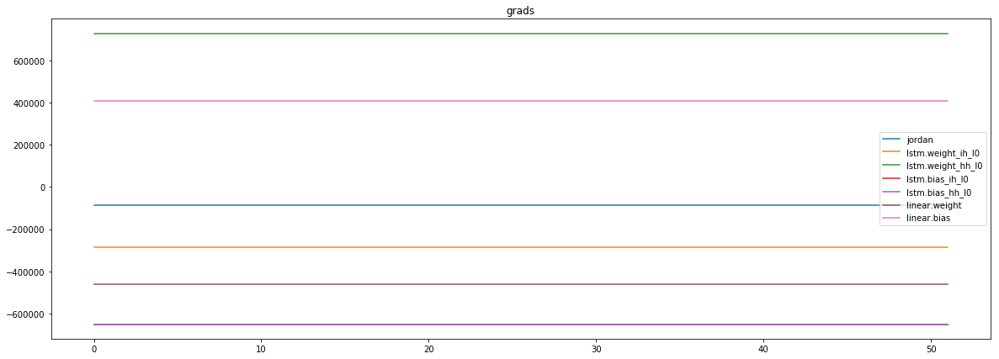

mean_p1 : -56307.61328125
mean_p2 : -558794.5625
mean_p3 : 527750.3125


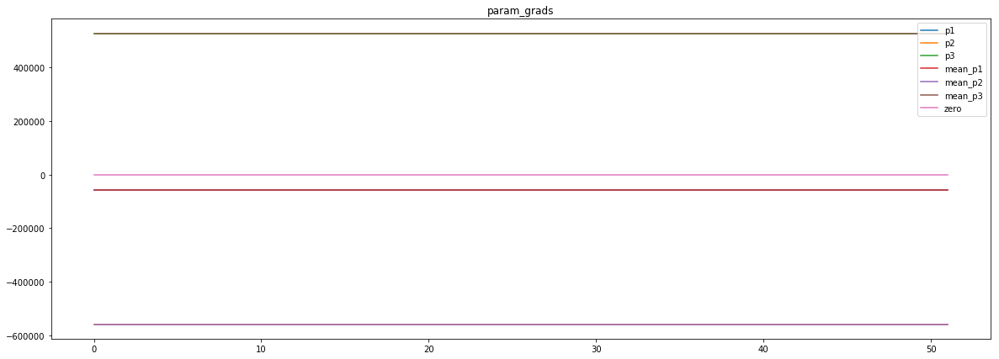

loss rate [0.035972647938565916]
Epoch [15] 
     train_loss[9505.512779822717] 
     eval_train[4.76647990827377] 
     eval_test[4.801760202104395]



aux preds: -1.925277829170227           0.9889580011367798           0.7581543326377869
main loss 8821.021700345553
aux loss 0.0
jord loss 0.0
combined loss 8821.021700345553 



Parameter containing:
tensor([[-1.9253,  0.9890,  0.7582]], requires_grad=True)


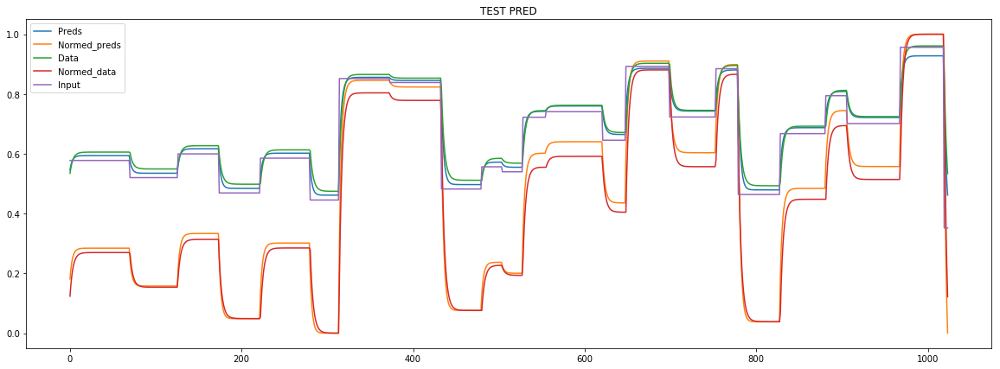

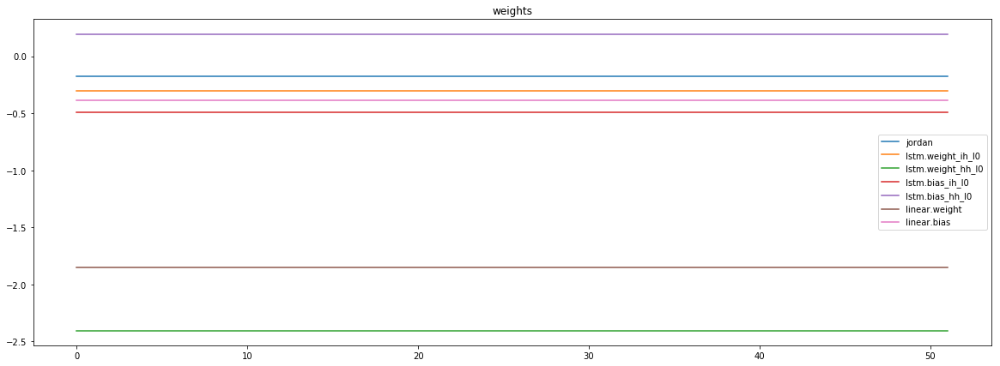

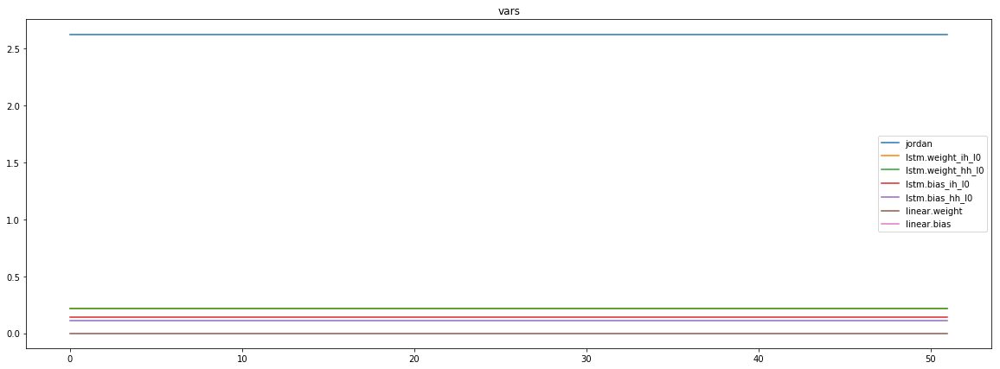

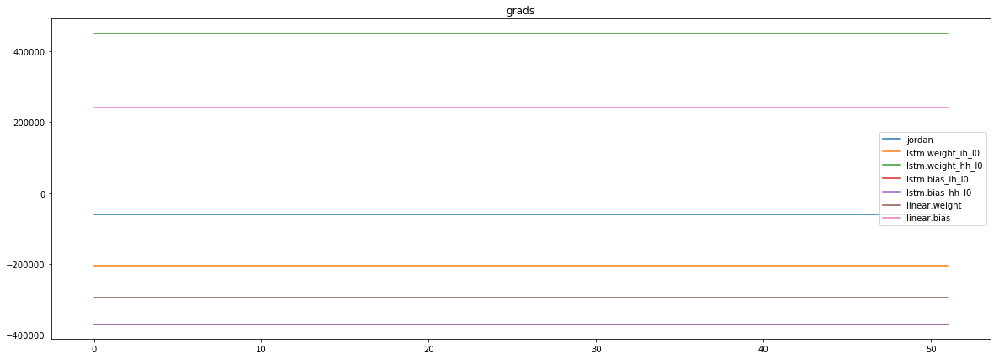

mean_p1 : -40083.01171875
mean_p2 : -341538.75
mean_p3 : 321648.875


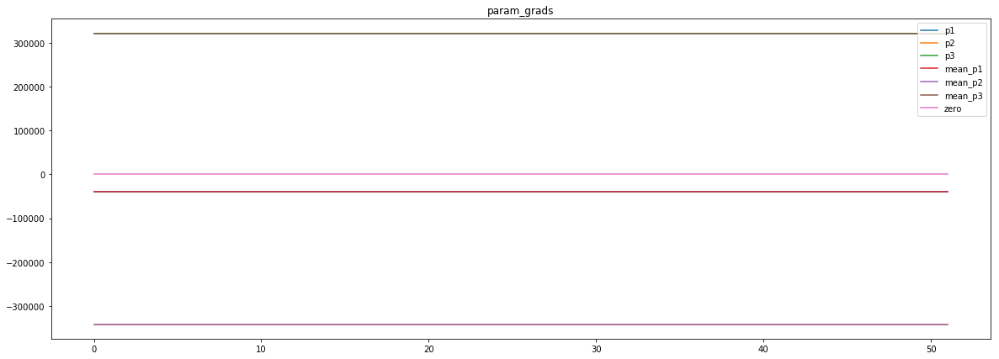

loss rate [-0.004976613461159296]
Epoch [16] 
     train_loss[8821.021700345553] 
     eval_train[4.866170714680965] 
     eval_test[4.901908652348952]



aux preds: -1.929656982421875           0.9877312779426575           0.7585227489471436
main loss 8267.494150015023
aux loss 0.0
jord loss 0.0
combined loss 8267.494150015023 



Parameter containing:
tensor([[-1.9297,  0.9877,  0.7585]], requires_grad=True)


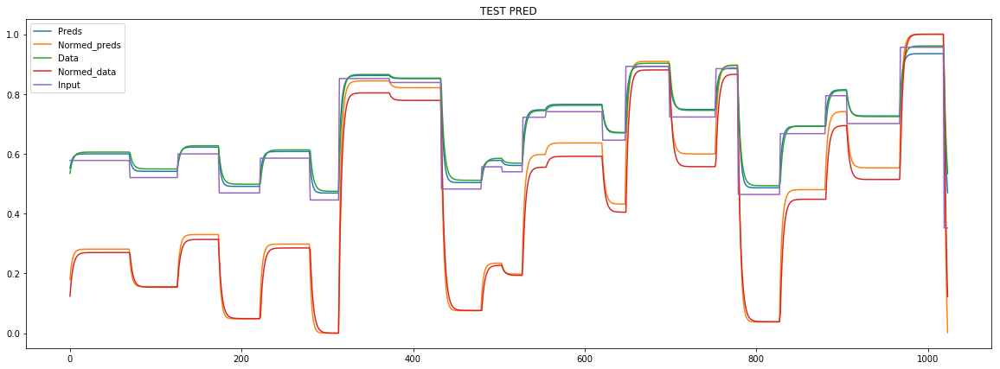

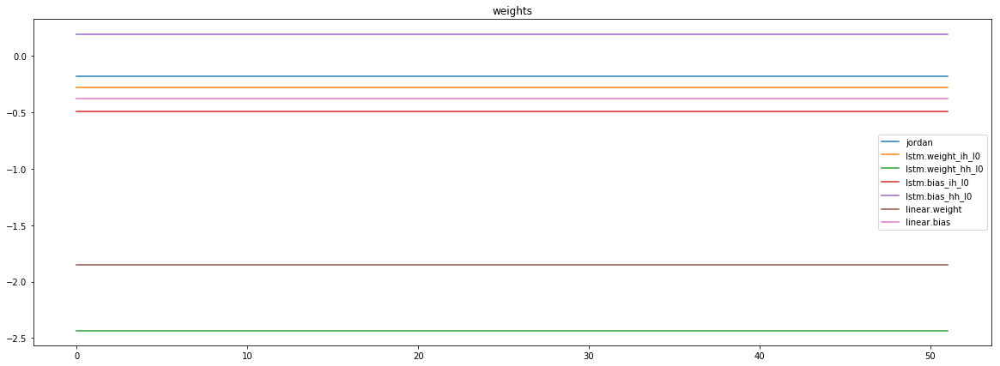

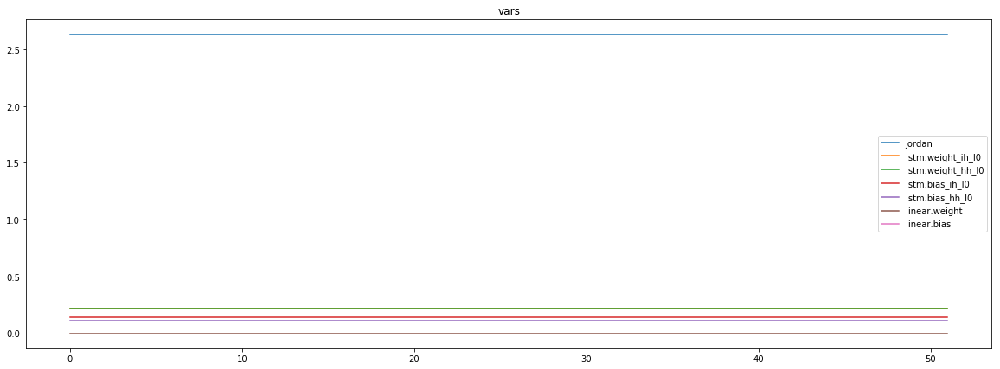

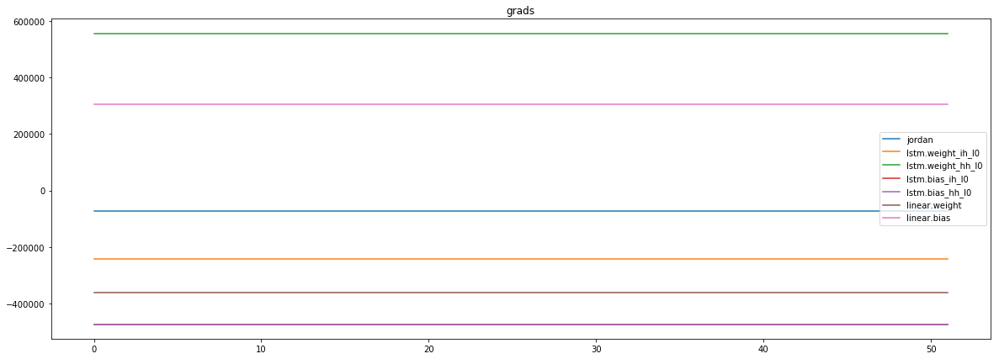

mean_p1 : -47062.796875
mean_p2 : -425456.15625
mean_p3 : 400675.90625


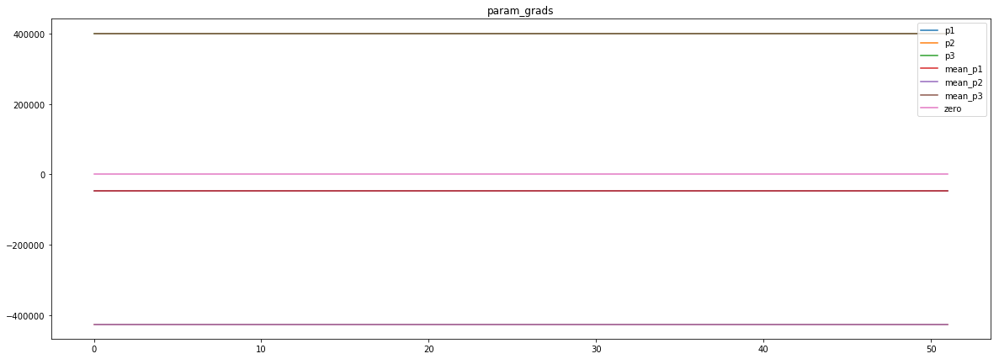

loss rate [0.0403354372364606]
Epoch [17] 
     train_loss[8267.494150015023] 
     eval_train[4.610603002401499] 
     eval_test[4.63216249238361]



aux preds: -1.932249665260315           0.9884324073791504           0.7567287683486938
main loss 7558.044330303485
aux loss 0.0
jord loss 0.0
combined loss 7558.044330303485 



Parameter containing:
tensor([[-1.9322,  0.9884,  0.7567]], requires_grad=True)


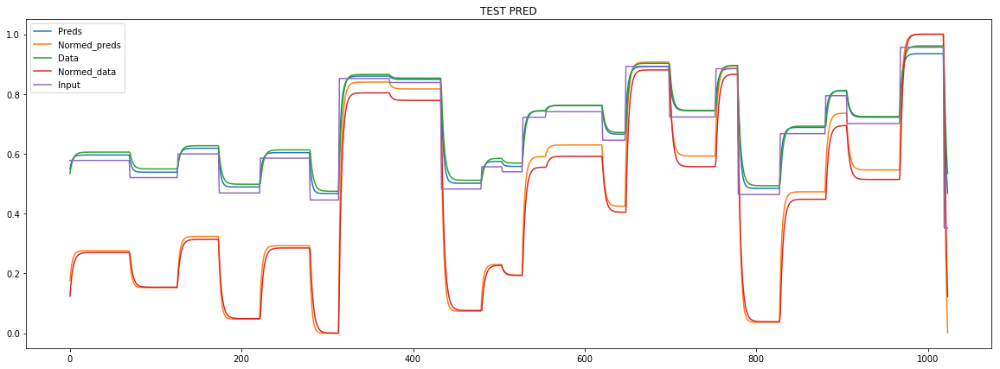

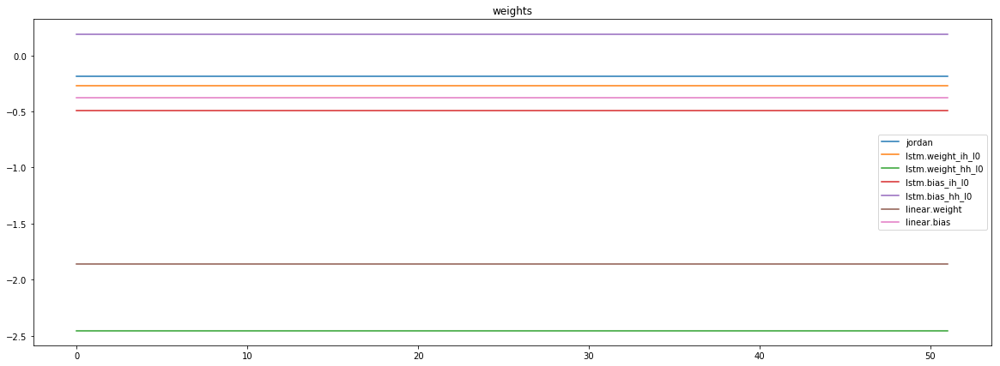

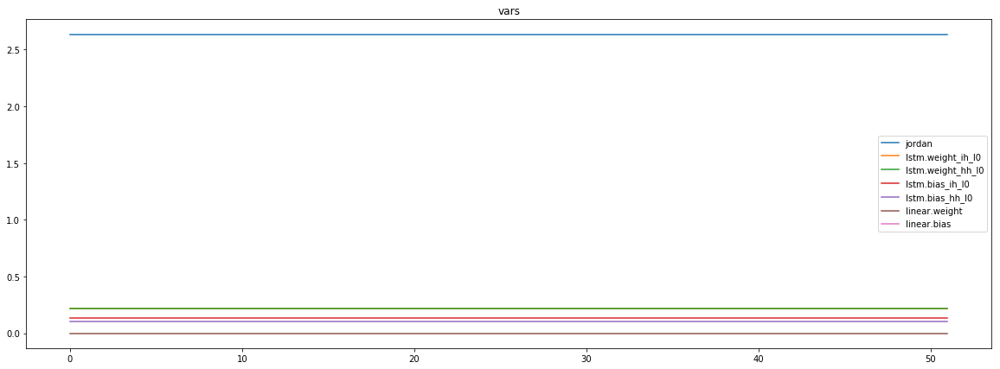

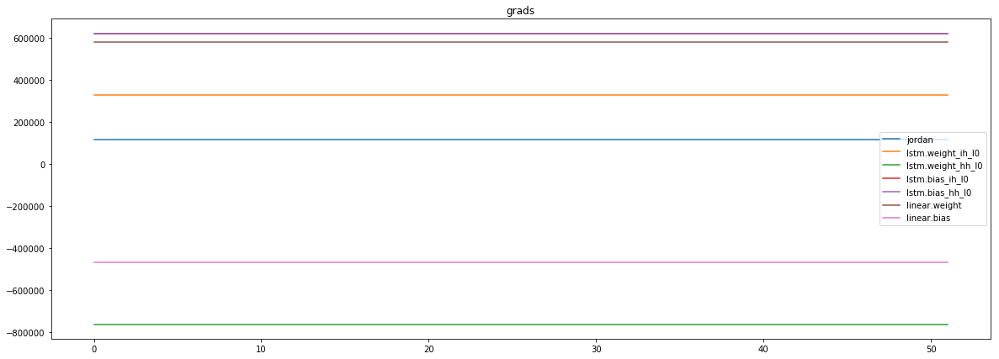

mean_p1 : 77653.640625
mean_p2 : 603964.125
mean_p3 : -565038.5625


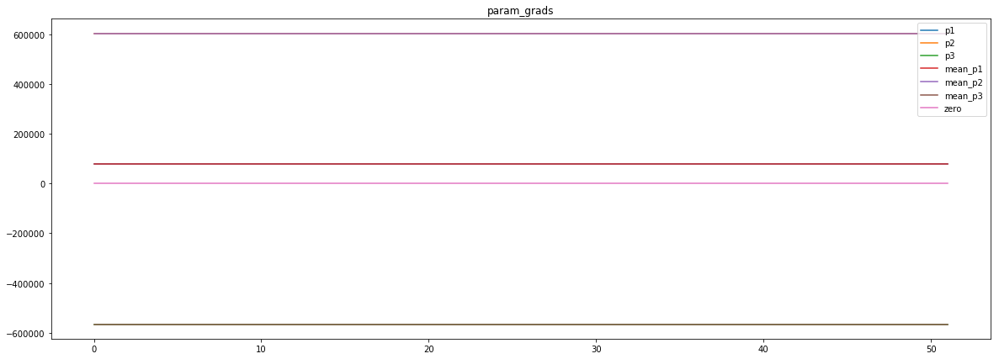

loss rate [0.015327168344187903]
Epoch [18] 
     train_loss[7558.044330303485] 
     eval_train[4.682817184008085] 
     eval_test[4.705367882143367]



aux preds: -1.9348429441452026           0.9878151416778564           0.756148099899292
main loss 8200.180748572717
aux loss 0.0
jord loss 0.0
combined loss 8200.180748572717 



Parameter containing:
tensor([[-1.9348,  0.9878,  0.7561]], requires_grad=True)


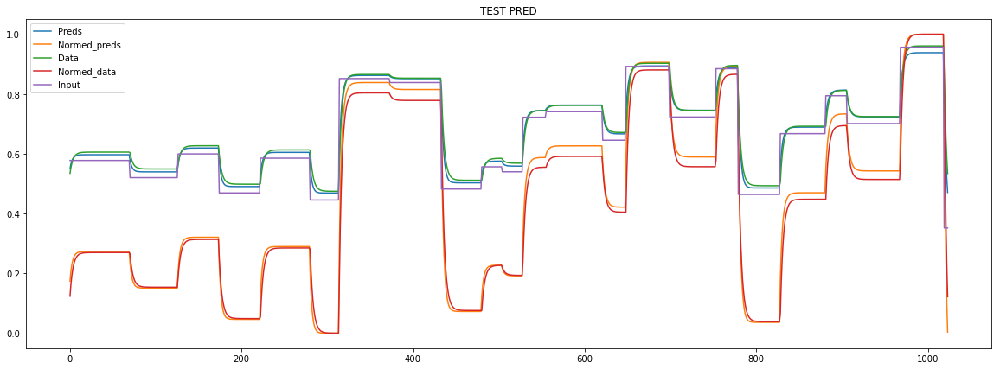

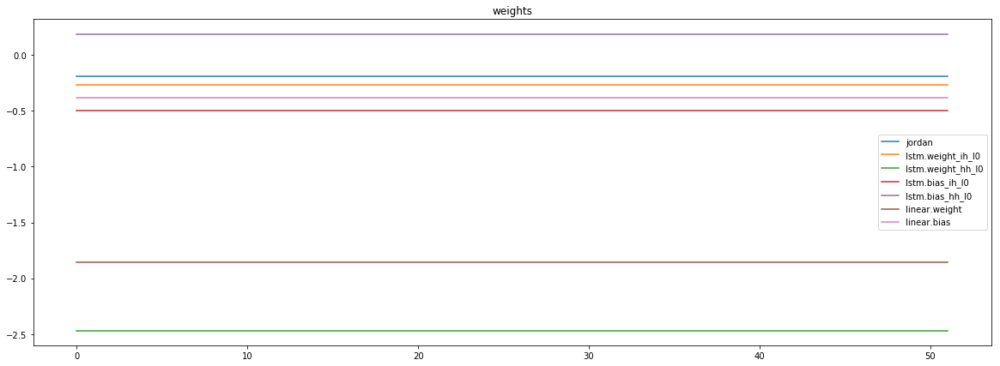

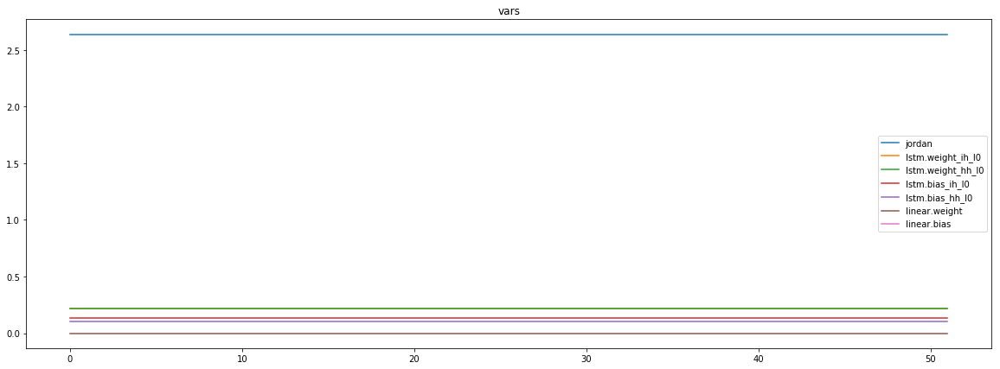

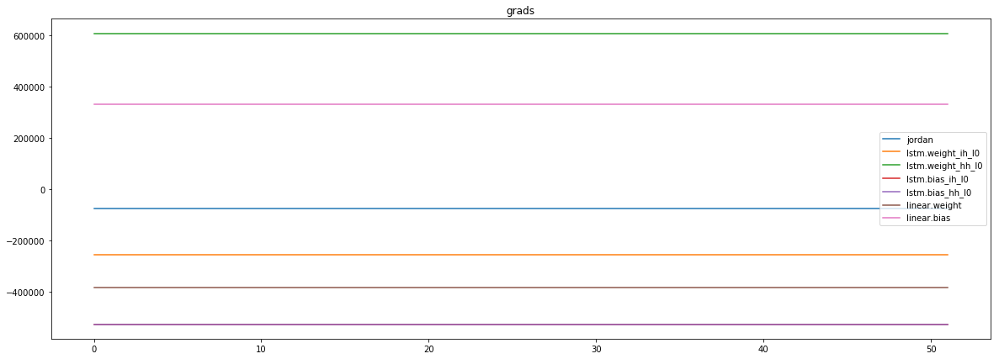

mean_p1 : -49084.46484375
mean_p2 : -463314.15625
mean_p3 : 436244.0625


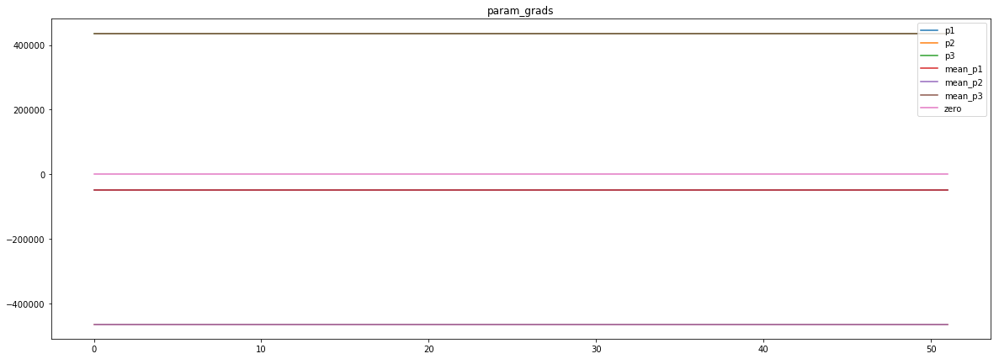

loss rate [0.02389682077164379]
Epoch [19] 
     train_loss[8200.180748572717] 
     eval_train[4.617516889021947] 
     eval_test[4.6330539015206424]



aux preds: -1.9355818033218384           0.989177405834198           0.7535744309425354
main loss 7509.542452298678
aux loss 0.0
jord loss 0.0
combined loss 7509.542452298678 



Parameter containing:
tensor([[-1.9356,  0.9892,  0.7536]], requires_grad=True)


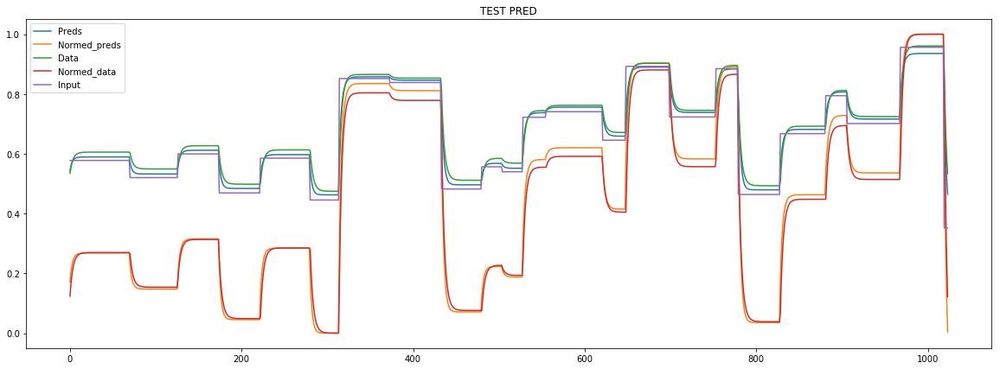

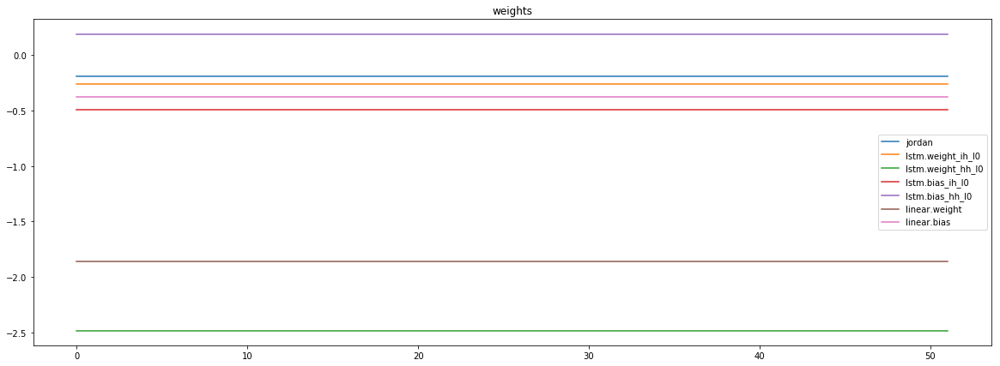

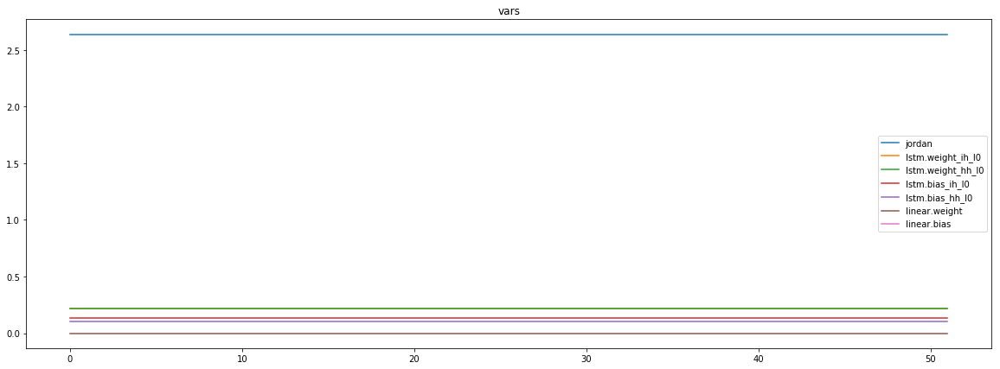

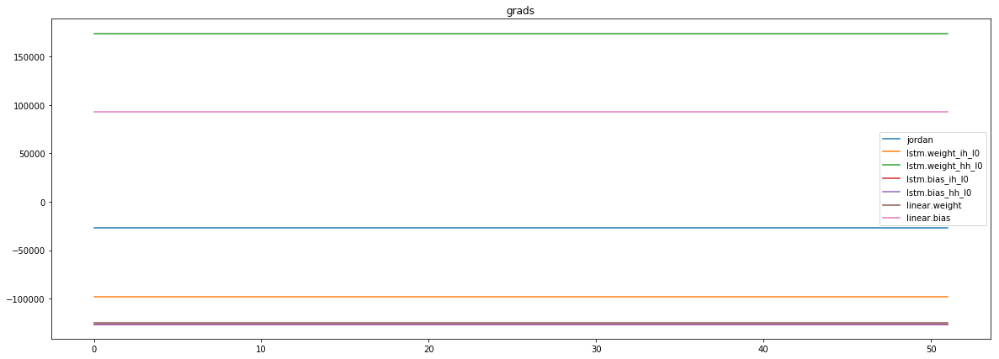

mean_p1 : -19423.984375
mean_p2 : -132463.546875
mean_p3 : 124632.5625


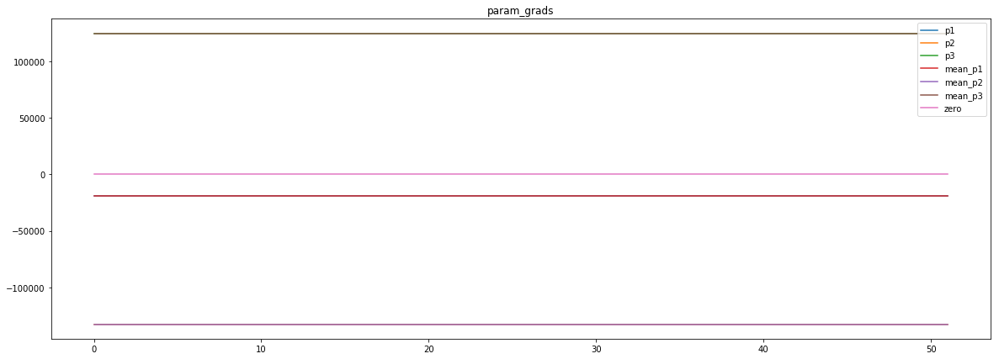

loss rate [-0.05957713456900793]
Epoch [20] 
     train_loss[7509.542452298678] 
     eval_train[4.90473057444279] 
     eval_test[4.934303885156458]



aux preds: -1.9402872323989868           0.9840676784515381           0.7575473785400391
main loss 8006.805372971755
aux loss 0.0
jord loss 0.0
combined loss 8006.805372971755 



Parameter containing:
tensor([[-1.9403,  0.9841,  0.7575]], requires_grad=True)


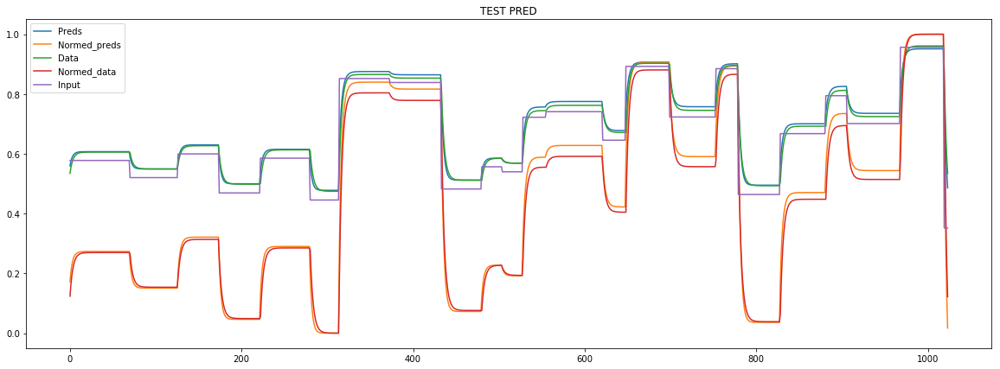

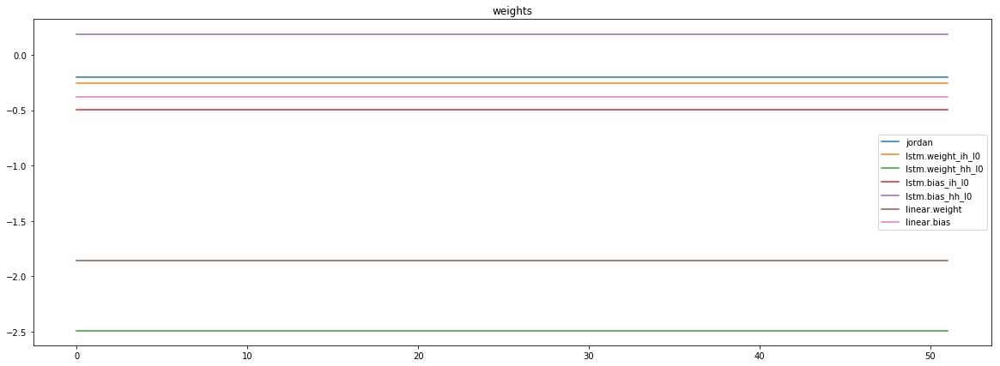

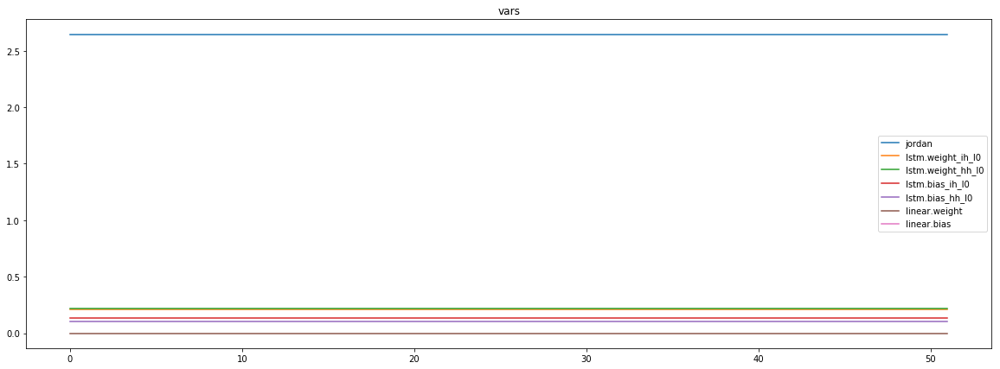

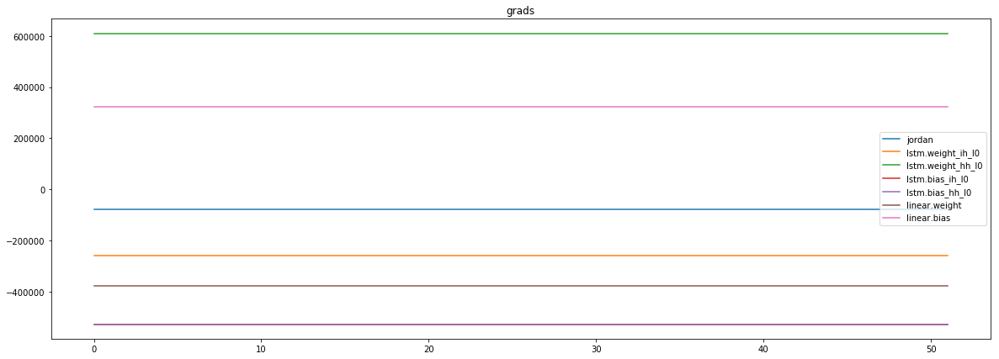

mean_p1 : -49524.17578125
mean_p2 : -465062.6875
mean_p3 : 437586.28125


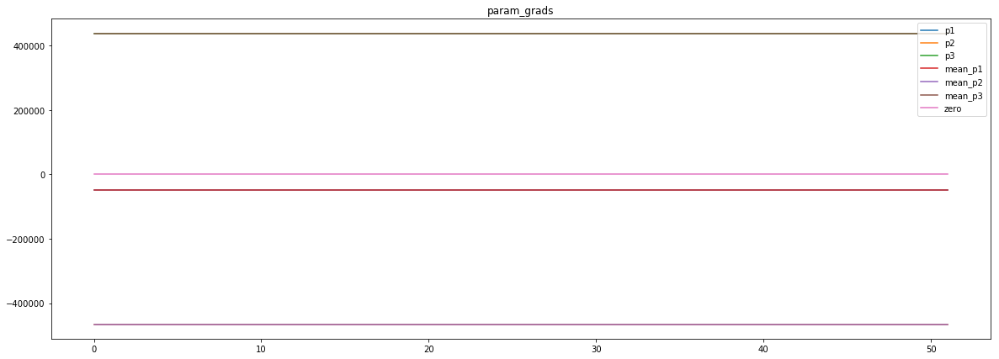

loss rate [0.019824192447252864]
Epoch [21] 
     train_loss[8006.805372971755] 
     eval_train[4.695525486881916] 
     eval_test[4.663260136138309]



aux preds: -1.9354931116104126           0.987642765045166           0.7527855634689331
main loss 7380.200232872596
aux loss 0.0
jord loss 0.0
combined loss 7380.200232872596 



Parameter containing:
tensor([[-1.9355,  0.9876,  0.7528]], requires_grad=True)


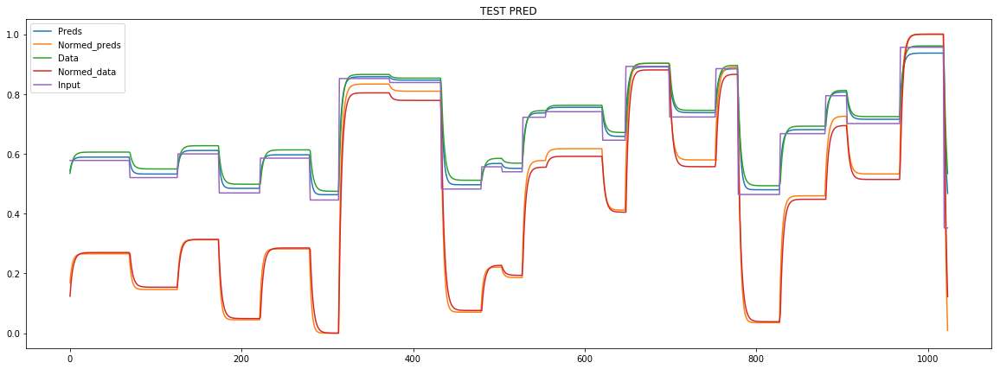

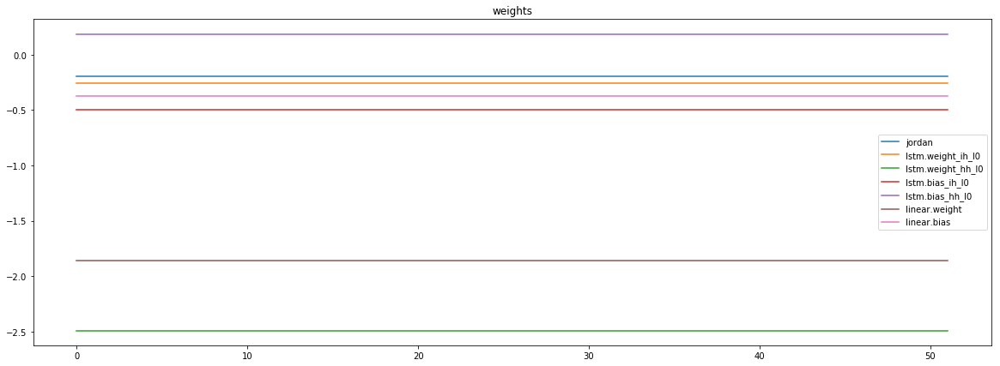

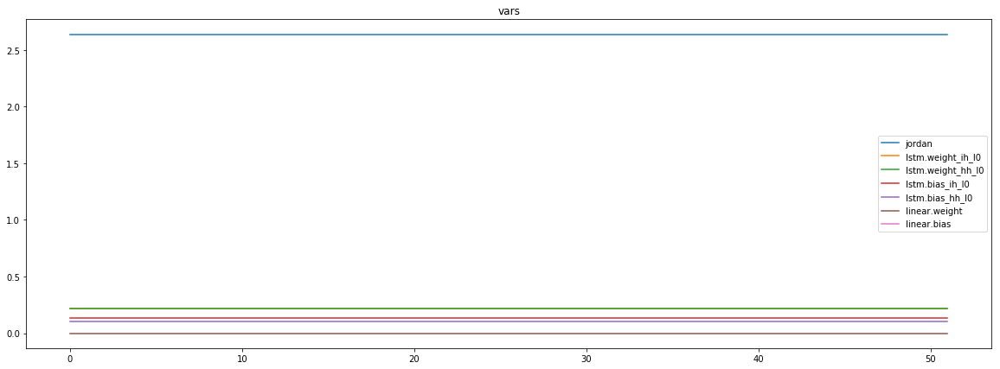

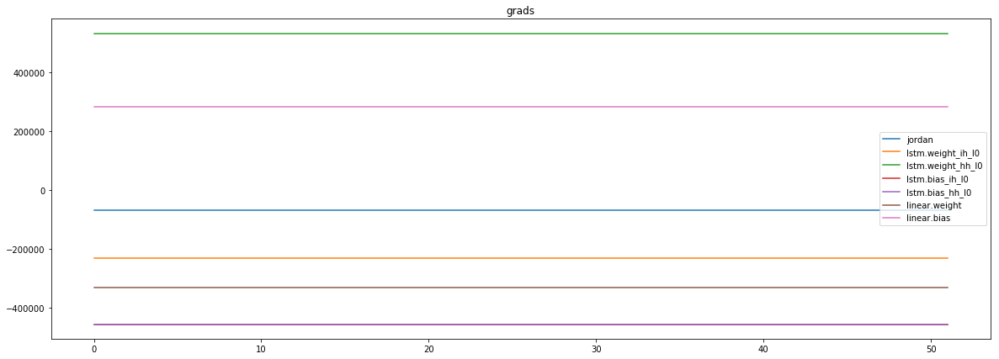

mean_p1 : -44265.9453125
mean_p2 : -405406.90625
mean_p3 : 381459.375


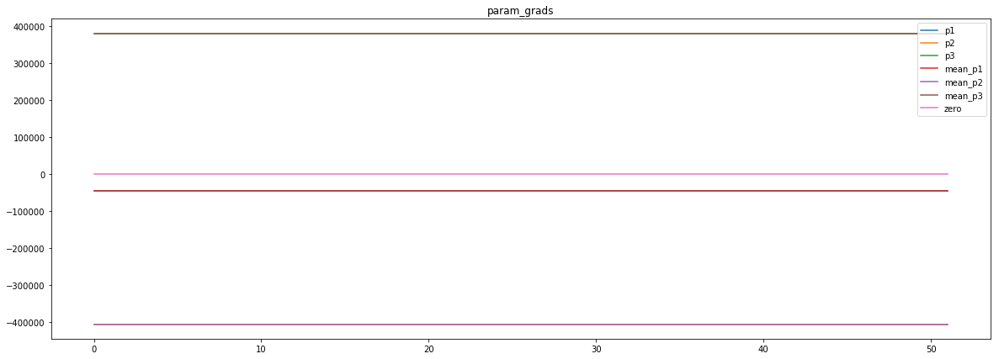

loss rate [-0.03871106771127186]
Epoch [22] 
     train_loss[7380.200232872596] 
     eval_train[4.900479697264158] 
     eval_test[4.927166778932918]



aux preds: -1.9307308197021484           0.9853838086128235           0.7538275122642517
main loss 7303.869027944712
aux loss 0.0
jord loss 0.0
combined loss 7303.869027944712 



Parameter containing:
tensor([[-1.9307,  0.9854,  0.7538]], requires_grad=True)


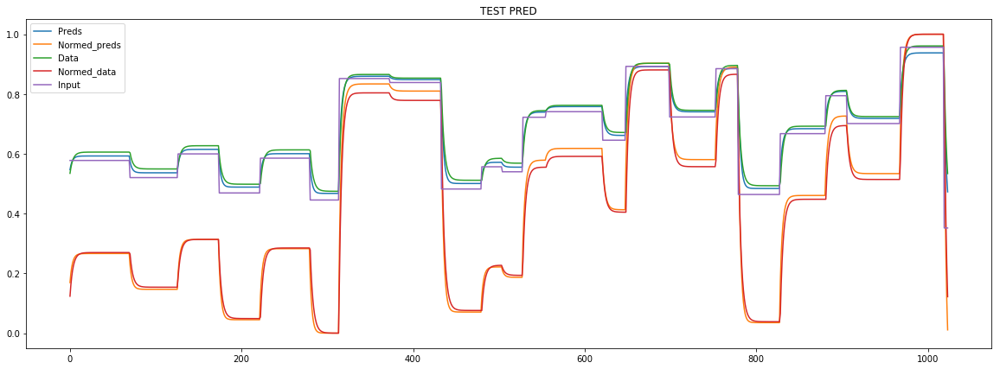

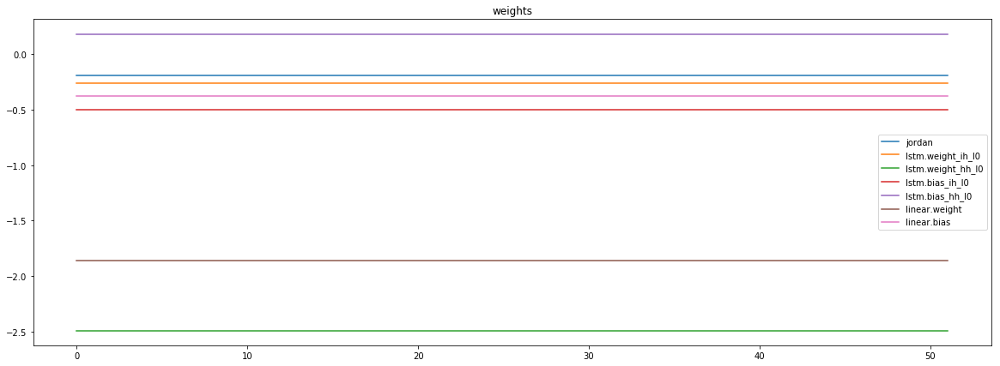

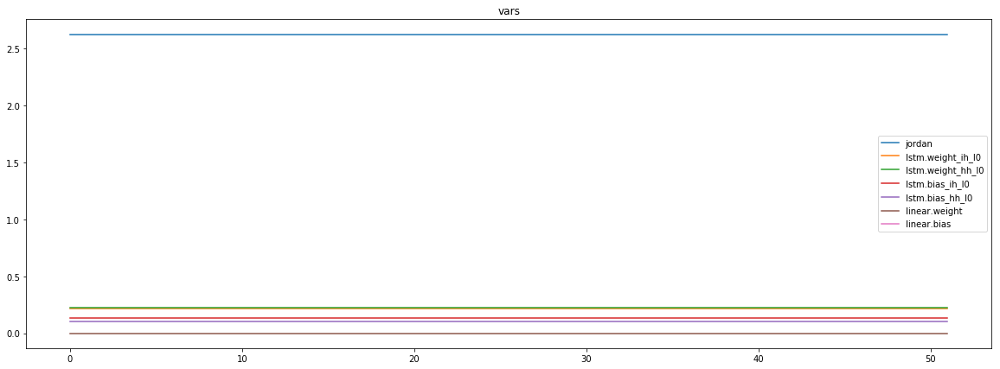

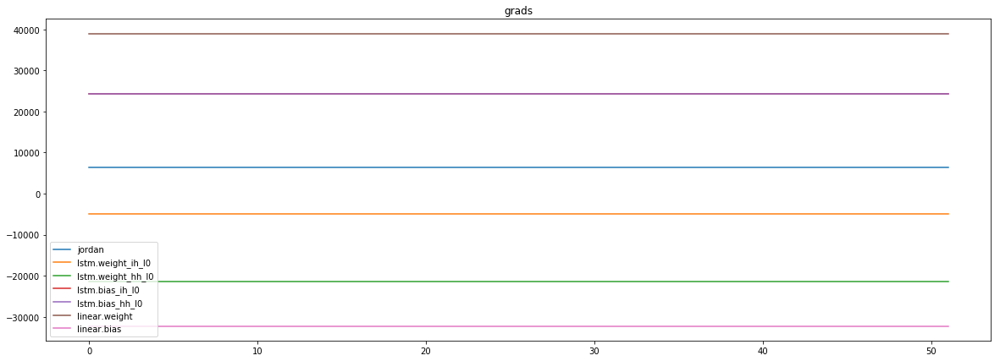

mean_p1 : 3931.707275390625
mean_p2 : 26053.216796875
mean_p3 : -23664.705078125


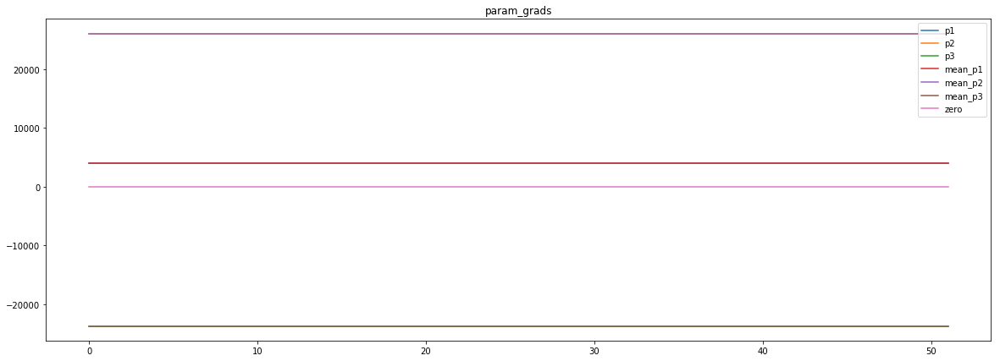

loss rate [0.015643688807828515]
Epoch [23] 
     train_loss[7303.869027944712] 
     eval_train[4.745826455262991] 
     eval_test[4.765836810523814]



aux preds: -1.9392074346542358           0.9823265075683594           0.7556447386741638
main loss 8640.399583082934
aux loss 0.0
jord loss 0.0
combined loss 8640.399583082934 



Parameter containing:
tensor([[-1.9392,  0.9823,  0.7556]], requires_grad=True)


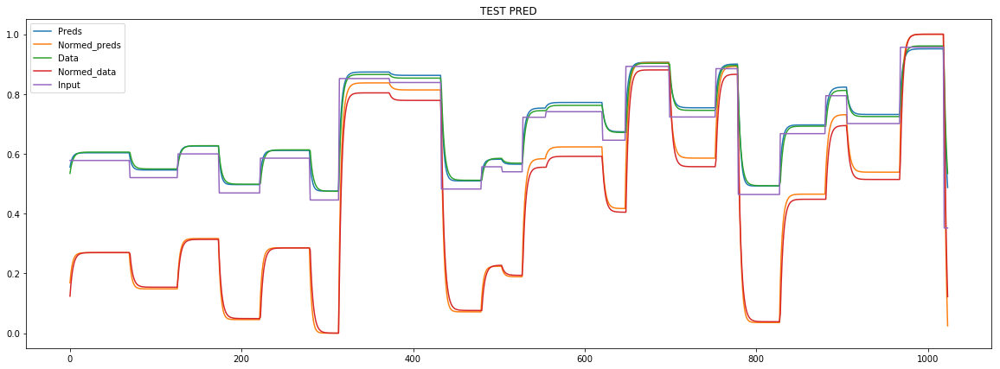

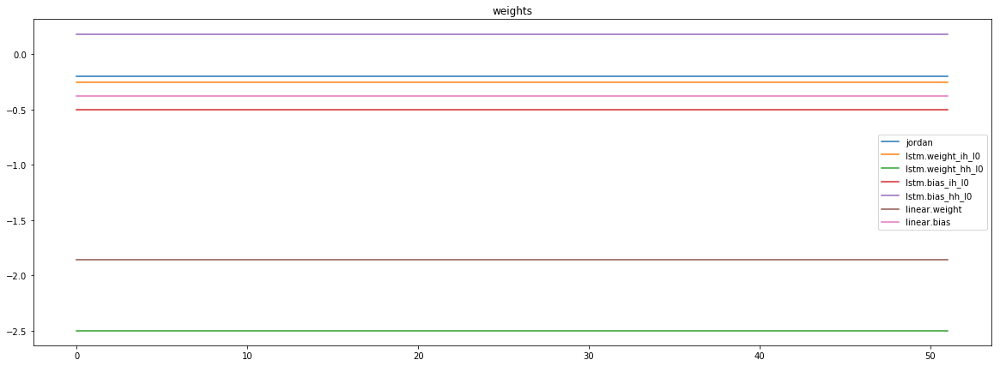

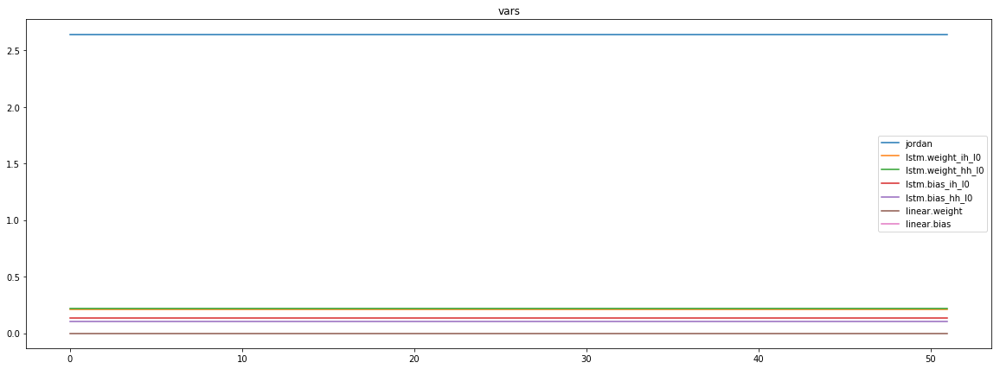

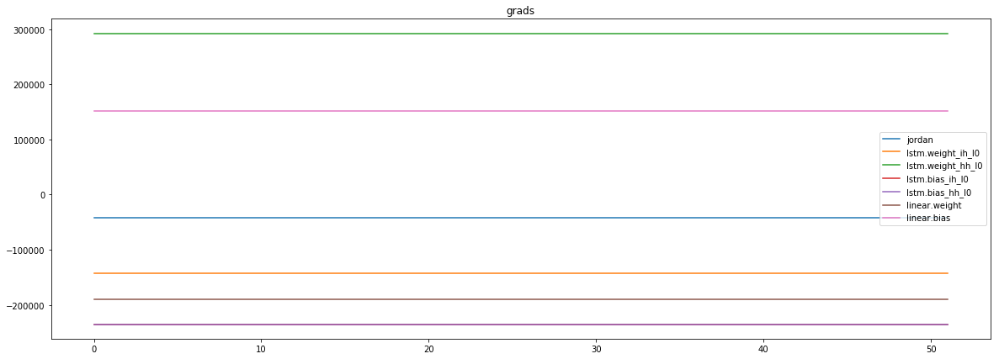

mean_p1 : -28047.455078125
mean_p2 : -223666.46875
mean_p3 : 210375.6875


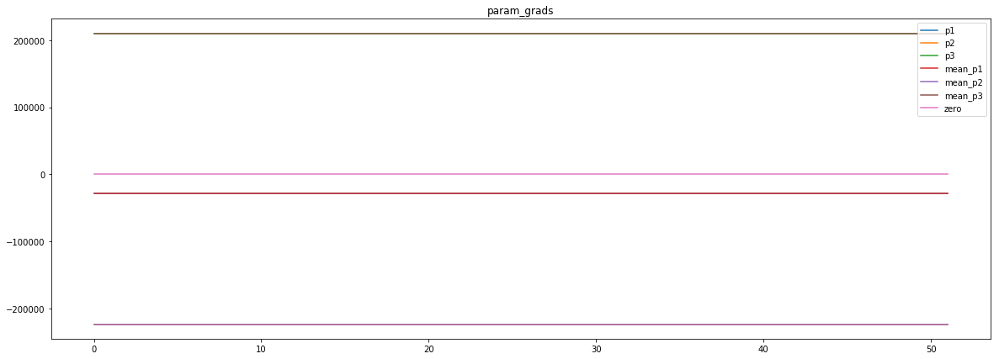

loss rate [0.04558649629159883]
Epoch [24] 
     train_loss[8640.399583082934] 
     eval_train[4.592155508697033] 
     eval_test[4.567270654168996]



aux preds: -1.9310922622680664           0.98255455493927           0.7542932033538818
main loss 7201.8472243088945
aux loss 0.0
jord loss 0.0
combined loss 7201.8472243088945 



Parameter containing:
tensor([[-1.9311,  0.9826,  0.7543]], requires_grad=True)


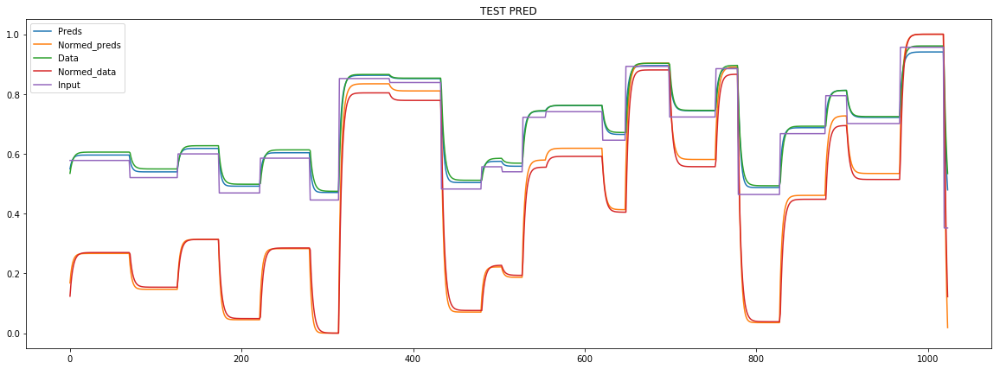

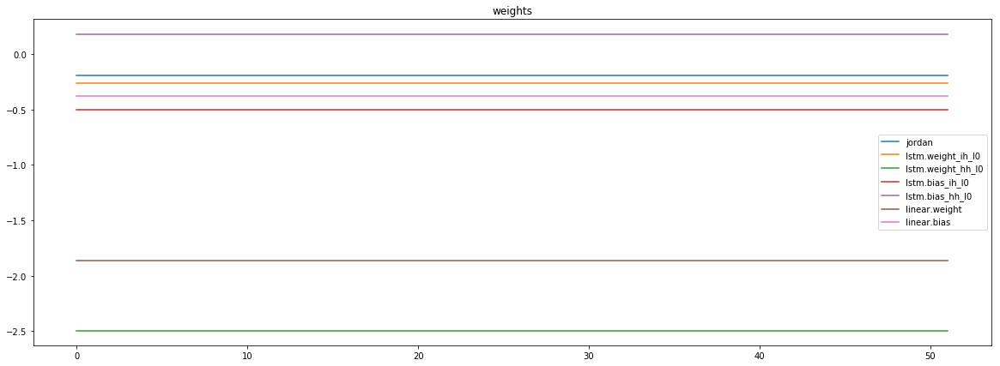

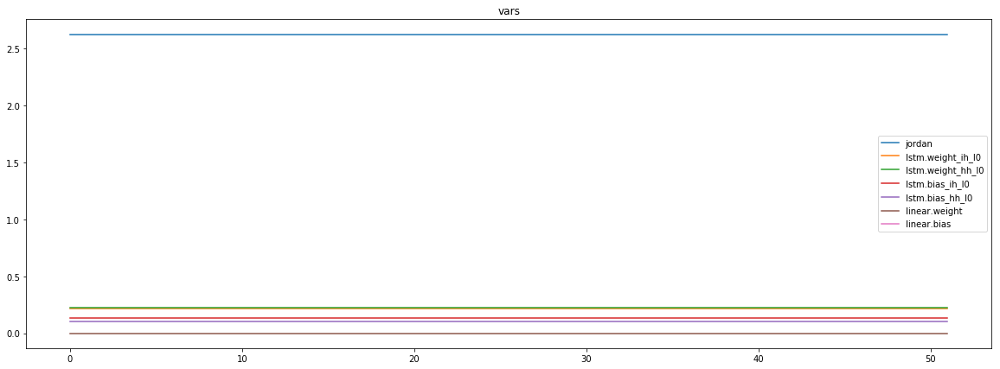

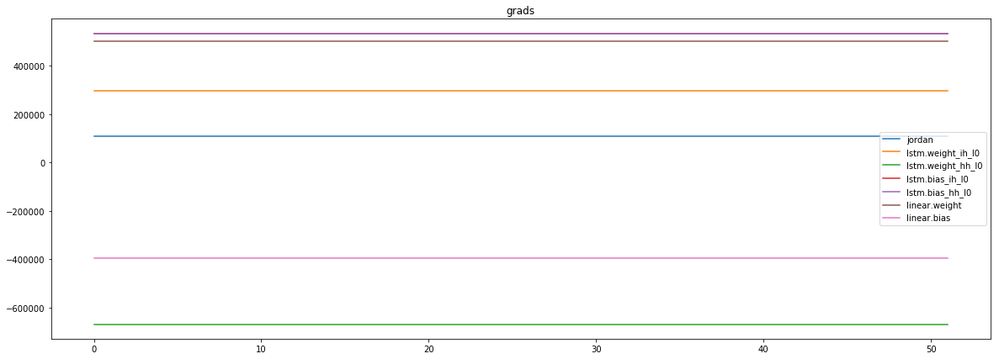

mean_p1 : 73219.390625
mean_p2 : 535789.8125
mean_p3 : -500561.5625


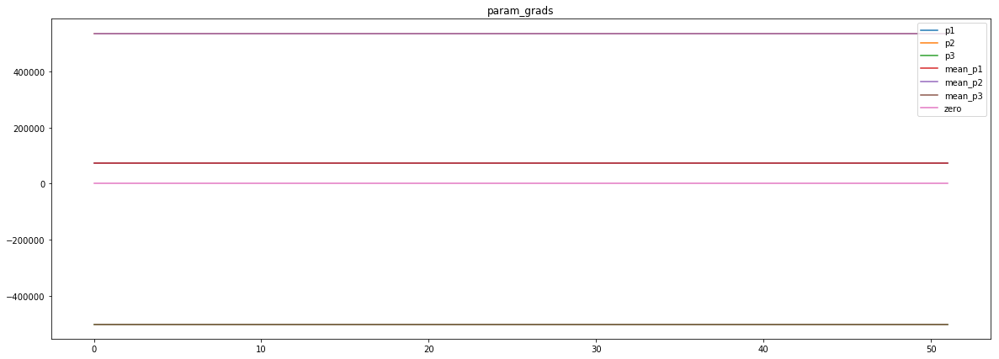

loss rate [0.03331169491574093]
Epoch [25] 
     train_loss[7201.8472243088945] 
     eval_train[4.590886431244703] 
     eval_test[4.5950801128690895]



aux preds: -1.9352165460586548           0.9801697731018066           0.7555373907089233
main loss 8370.17948091947
aux loss 0.0
jord loss 0.0
combined loss 8370.17948091947 



Parameter containing:
tensor([[-1.9352,  0.9802,  0.7555]], requires_grad=True)


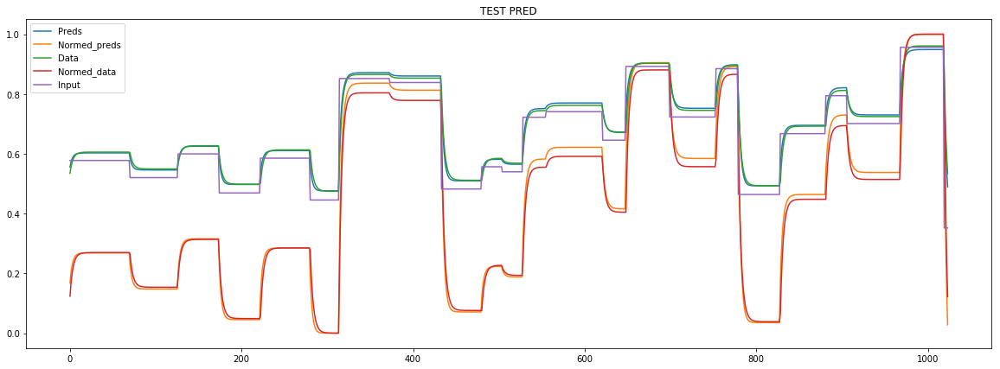

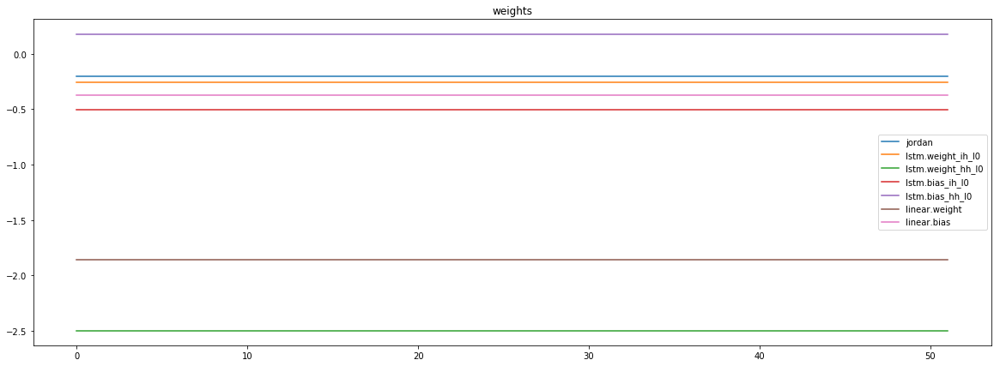

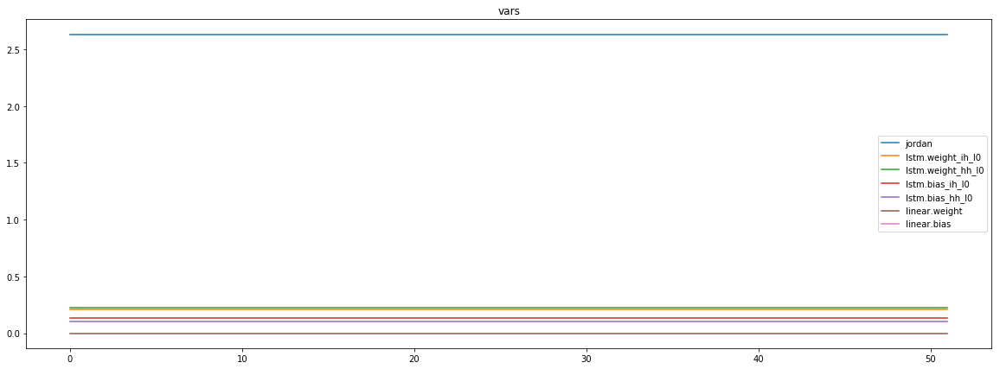

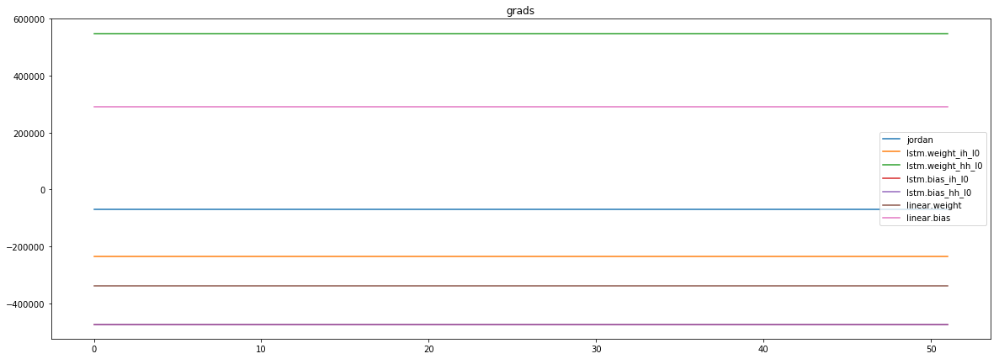

mean_p1 : -45871.7578125
mean_p2 : -420469.90625
mean_p3 : 395611.15625


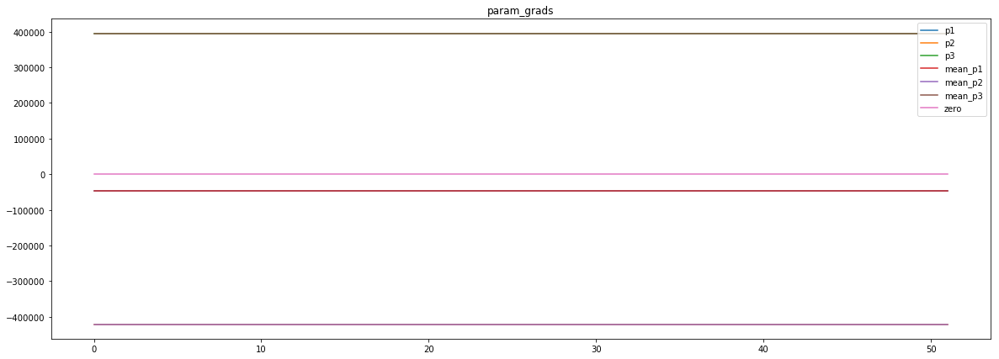

loss rate [0.024895822376473475]
Epoch [26] 
     train_loss[8370.17948091947] 
     eval_train[4.553535456267687] 
     eval_test[4.527144631201571]



aux preds: -1.9276478290557861           0.9817988276481628           0.7528868317604065
main loss 7120.876953125
aux loss 0.0
jord loss 0.0
combined loss 7120.876953125 



Parameter containing:
tensor([[-1.9276,  0.9818,  0.7529]], requires_grad=True)


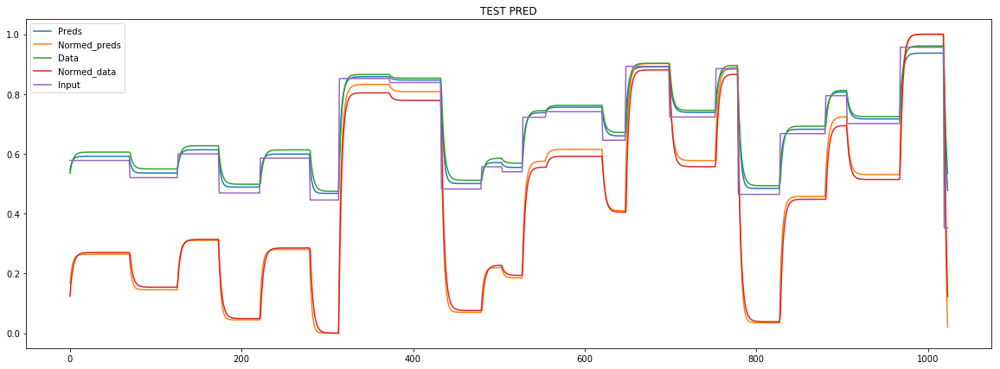

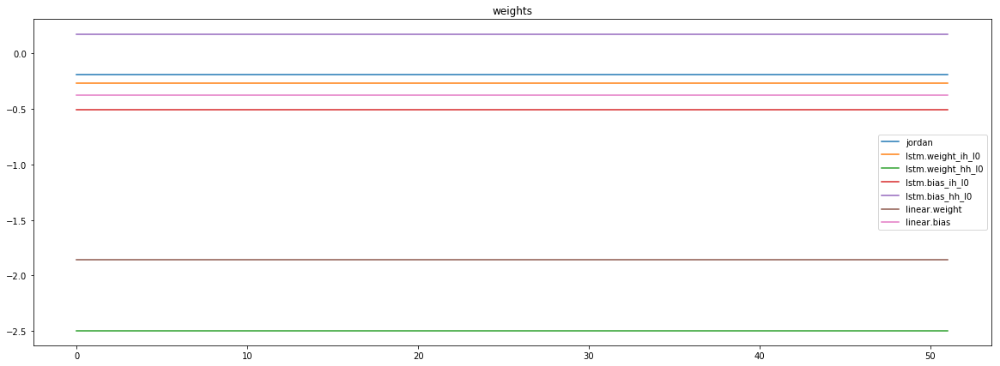

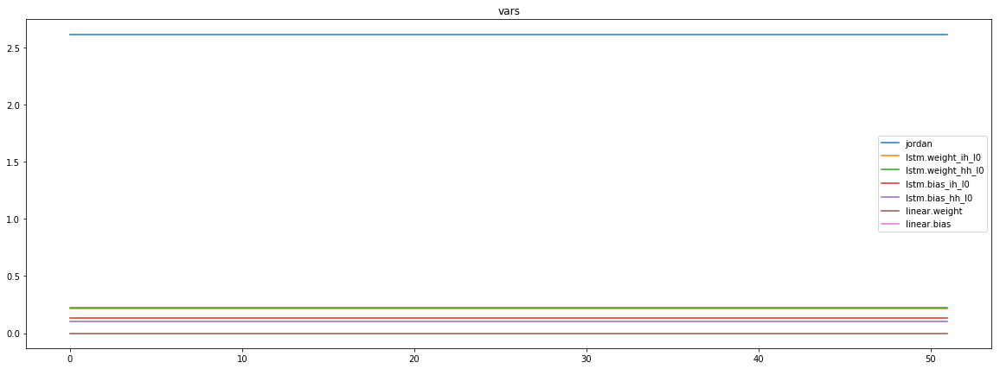

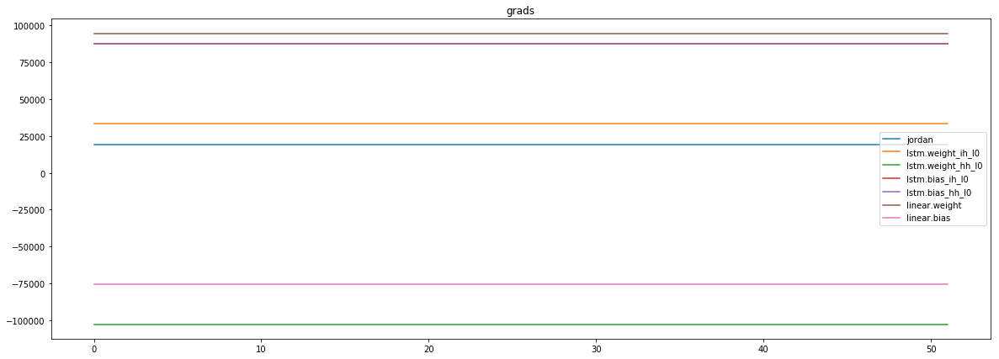

mean_p1 : 12571.2587890625
mean_p2 : 89583.2265625
mean_p3 : -83211.5234375


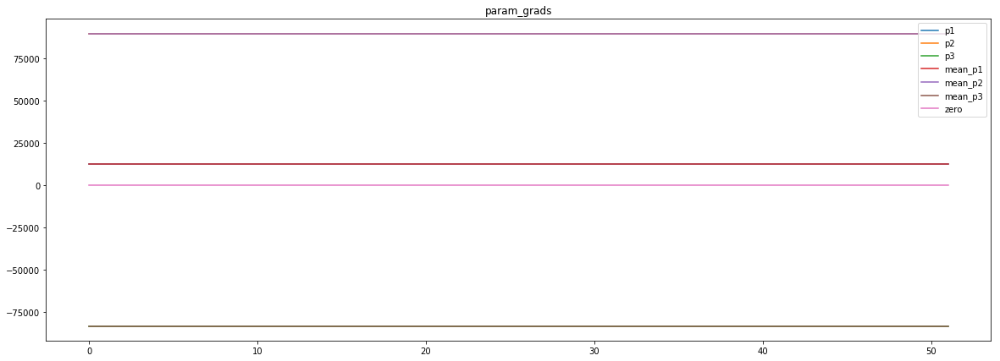

loss rate [-0.054683369143924354]
Epoch [27] 
     train_loss[7120.876953125] 
     eval_train[4.79302569421438] 
     eval_test[4.812694376165217]



aux preds: -1.936945915222168           0.9790917634963989           0.754396378993988
main loss 8302.159677358773
aux loss 0.0
jord loss 0.0
combined loss 8302.159677358773 



Parameter containing:
tensor([[-1.9369,  0.9791,  0.7544]], requires_grad=True)


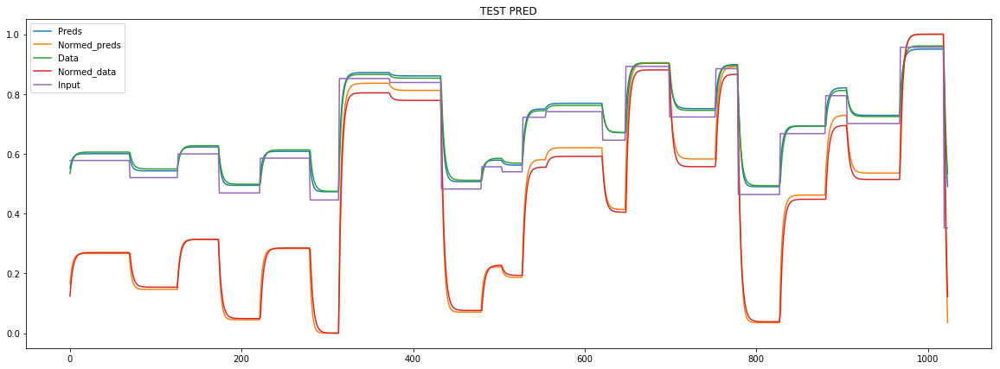

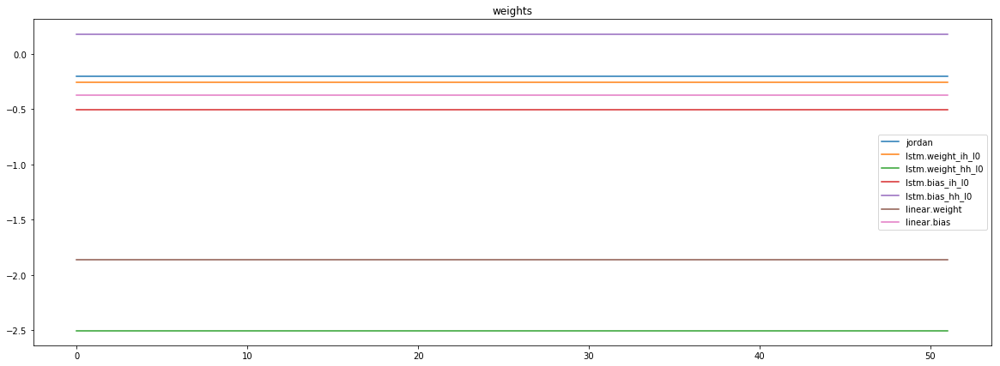

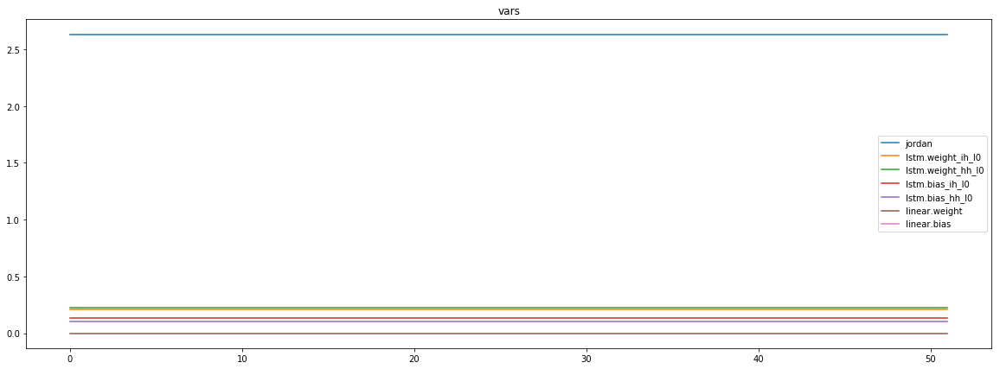

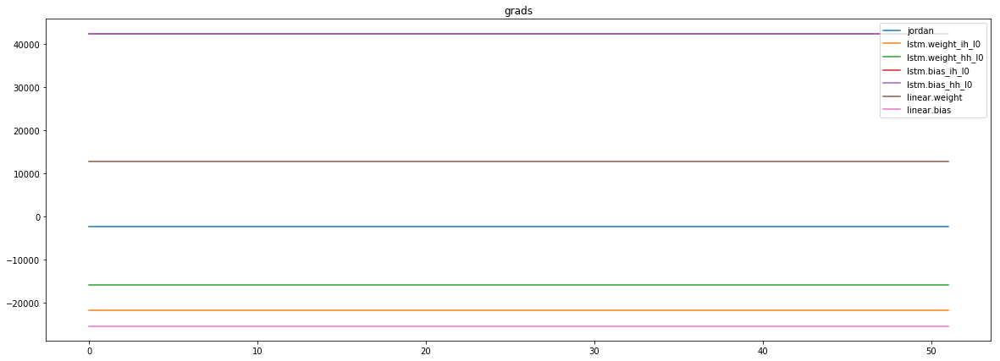

mean_p1 : -3341.095458984375
mean_p2 : 16917.123046875
mean_p3 : -15897.7626953125


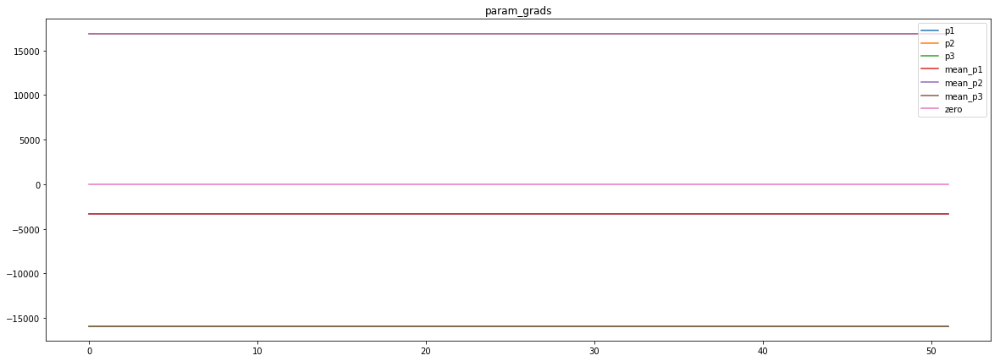

loss rate [0.026634852709767176]
Epoch [28] 
     train_loss[8302.159677358773] 
     eval_train[4.535077145466438] 
     eval_test[4.521254867315292]



aux preds: -1.9318736791610718           0.9792412519454956           0.7532066702842712
main loss 6844.454439603365
aux loss 0.0
jord loss 0.0
combined loss 6844.454439603365 



Parameter containing:
tensor([[-1.9319,  0.9792,  0.7532]], requires_grad=True)


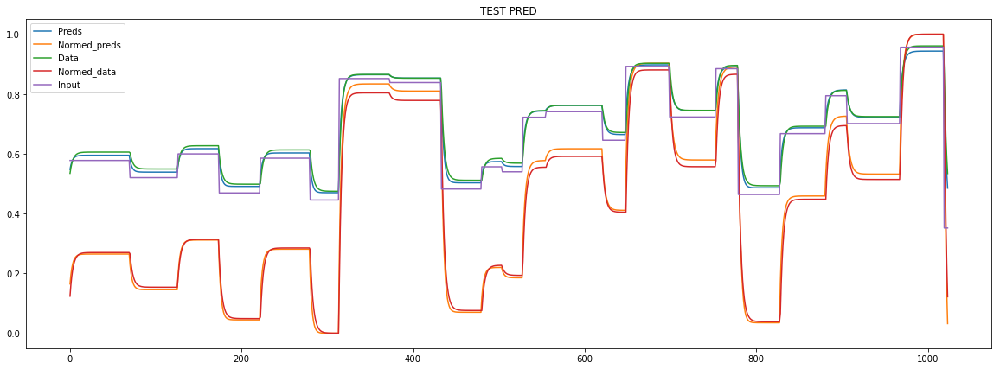

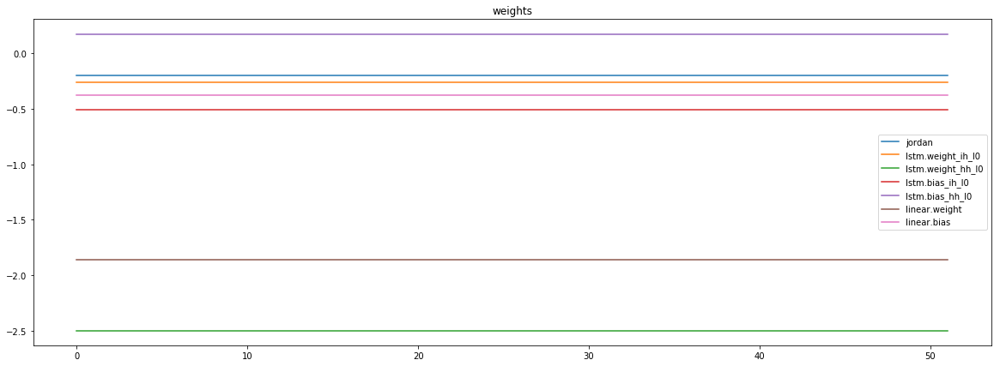

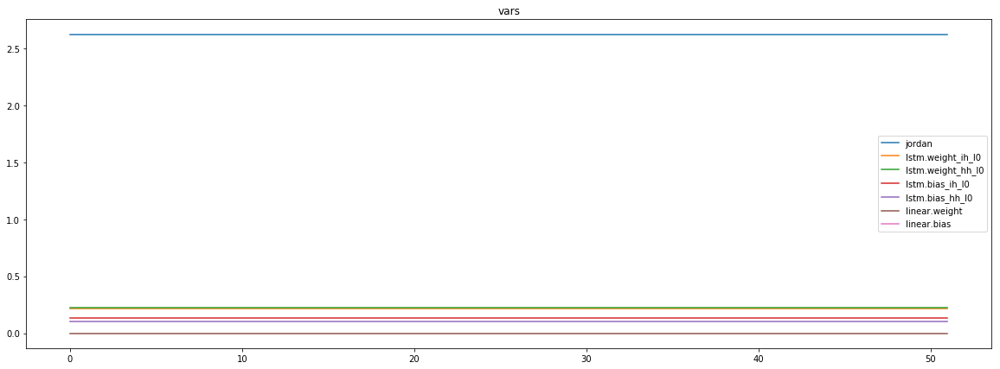

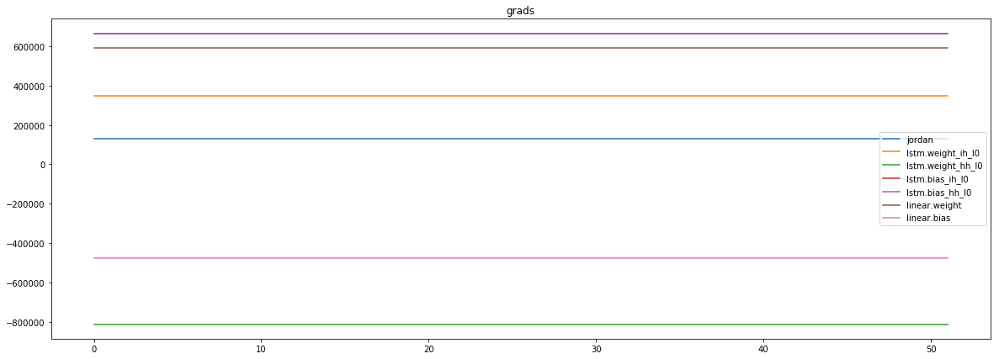

mean_p1 : 86259.40625
mean_p2 : 651473.0
mean_p3 : -609565.3125


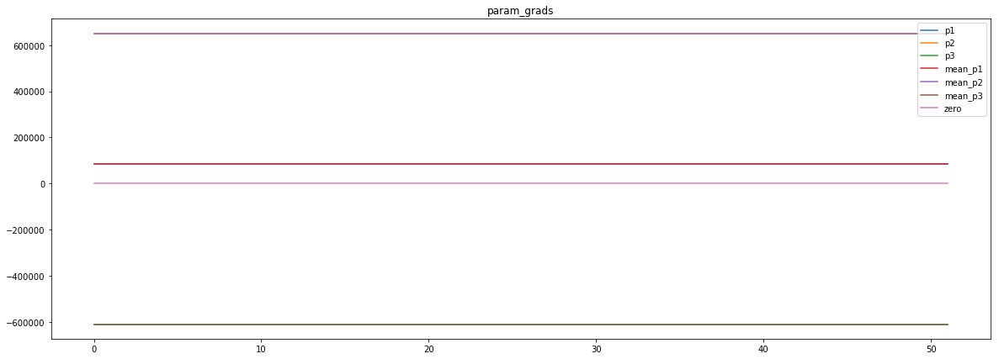

loss rate [0.01345532162673091]
Epoch [29] 
     train_loss[6844.454439603365] 
     eval_train[4.557773427321361] 
     eval_test[4.558196132833308]



aux preds: -1.922990083694458           0.9781767129898071           0.753231406211853
main loss 7233.520216721755
aux loss 0.0
jord loss 0.0
combined loss 7233.520216721755 



Parameter containing:
tensor([[-1.9230,  0.9782,  0.7532]], requires_grad=True)


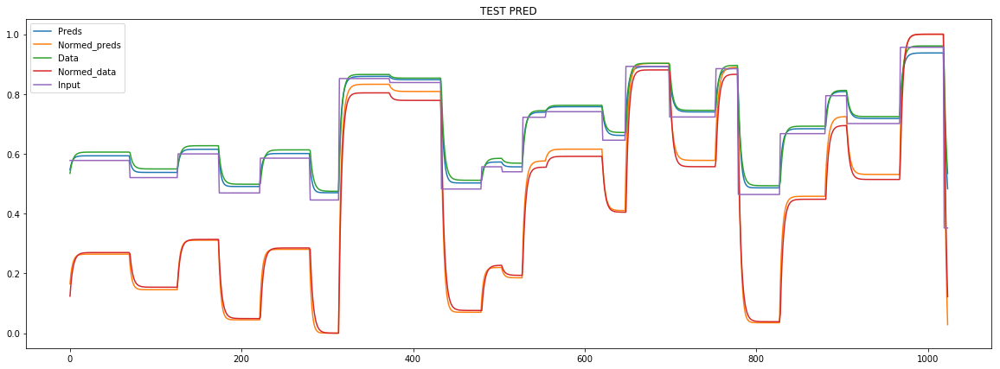

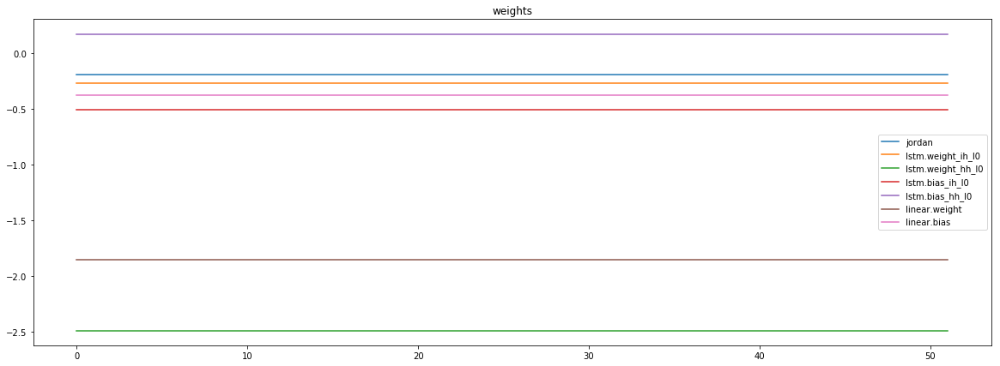

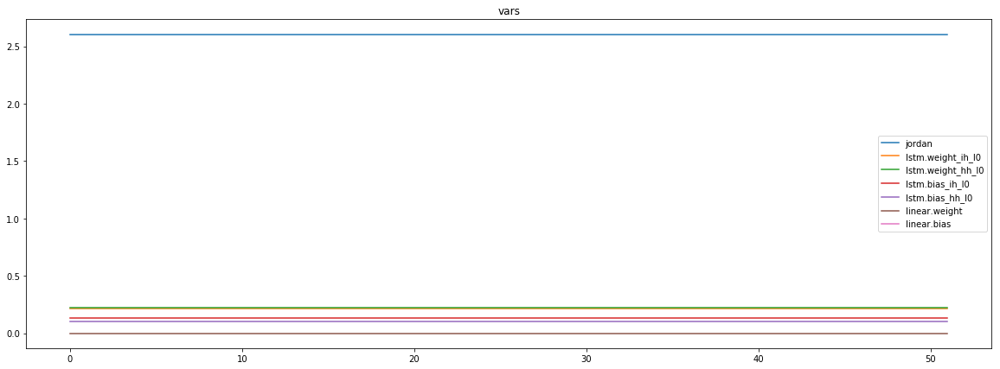

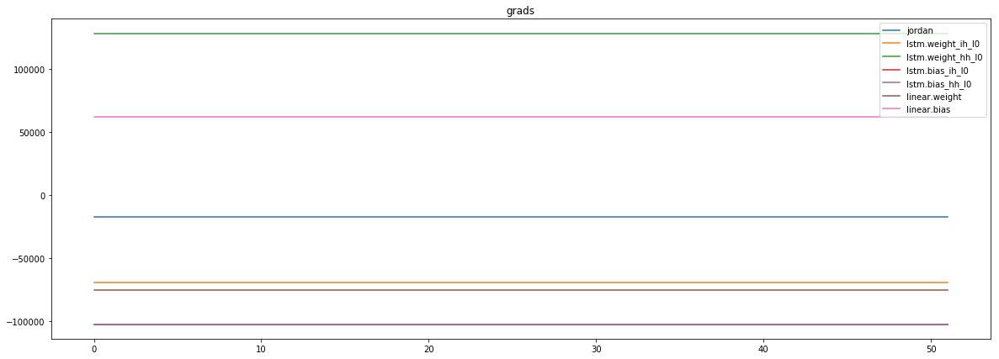

mean_p1 : -12060.1064453125
mean_p2 : -96295.8125
mean_p3 : 90974.0234375


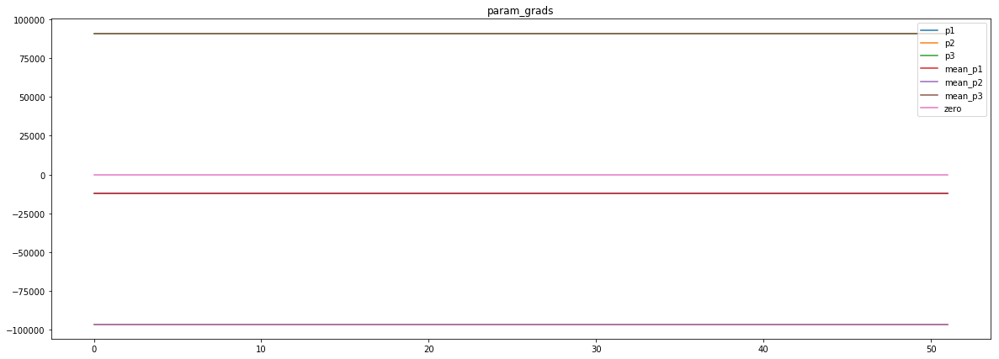

loss rate [-0.018903477756686993]
Epoch [30] 
     train_loss[7233.520216721755] 
     eval_train[4.70718554693919] 
     eval_test[4.718251745809209]



aux preds: -1.9318253993988037           0.9762759804725647           0.7540332078933716
main loss 8091.080829326923
aux loss 0.0
jord loss 0.0
combined loss 8091.080829326923 



Parameter containing:
tensor([[-1.9318,  0.9763,  0.7540]], requires_grad=True)


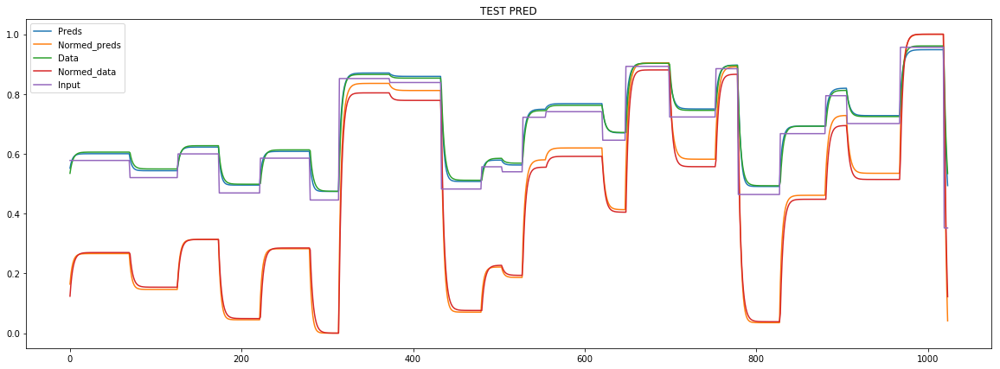

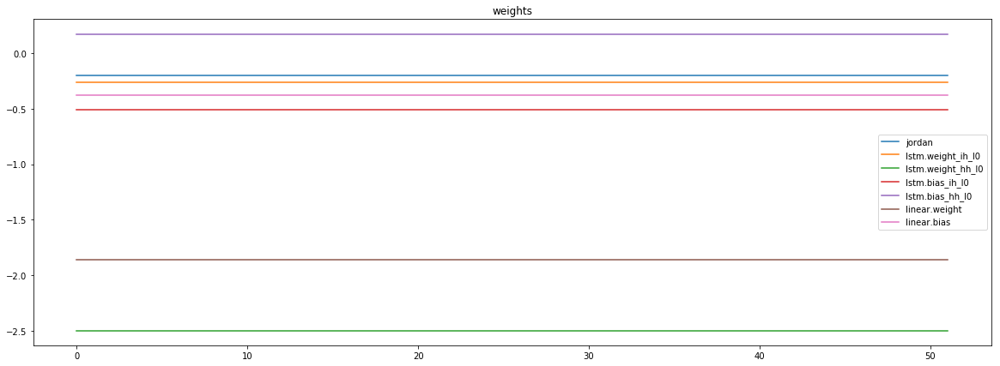

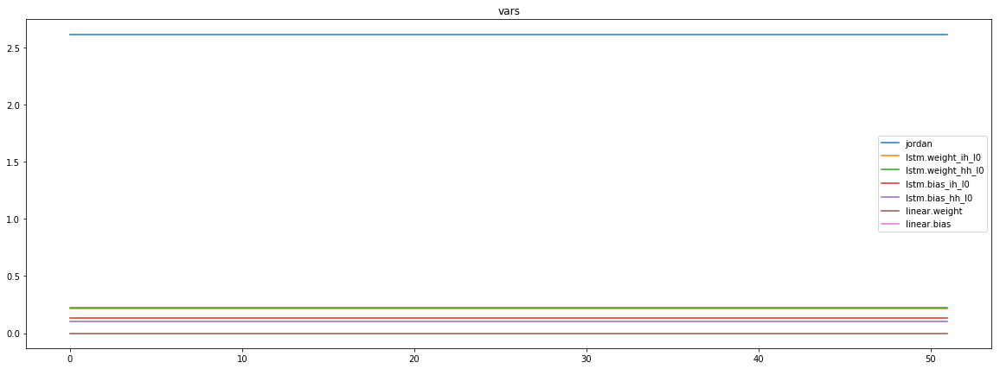

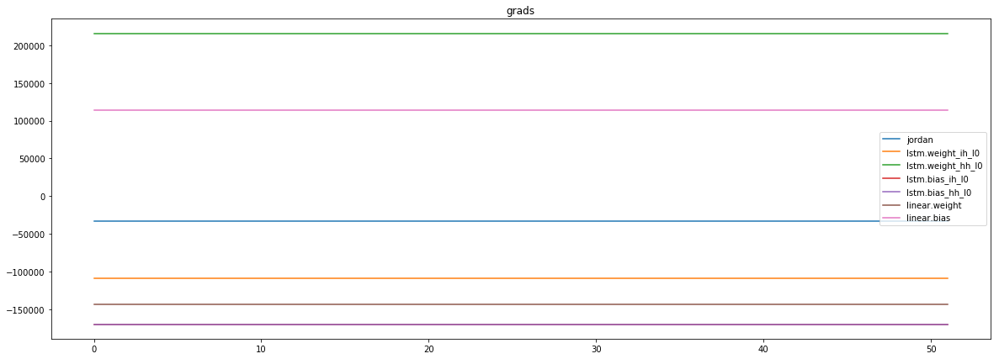

mean_p1 : -22843.814453125
mean_p2 : -167676.40625
mean_p3 : 157818.9375


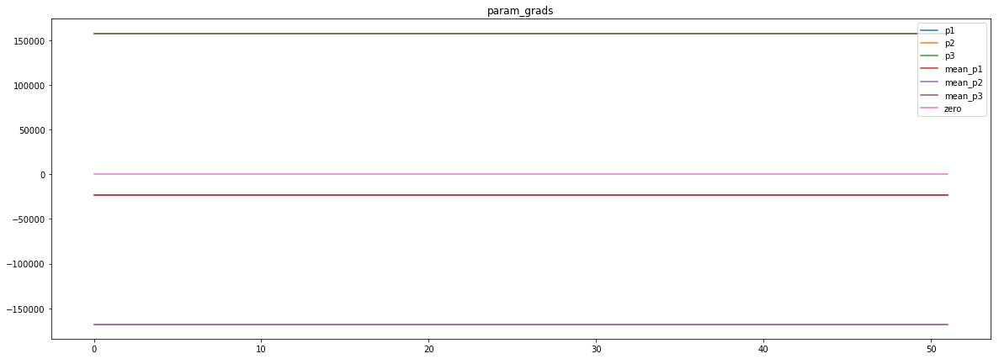

loss rate [0.024737142342395324]
Epoch [31] 
     train_loss[8091.080829326923] 
     eval_train[4.503773286365545] 
     eval_test[4.485462336377664]



aux preds: -1.9299145936965942           0.9762969613075256           0.7529798746109009
main loss 6890.2249098557695
aux loss 0.0
jord loss 0.0
combined loss 6890.2249098557695 



Parameter containing:
tensor([[-1.9299,  0.9763,  0.7530]], requires_grad=True)


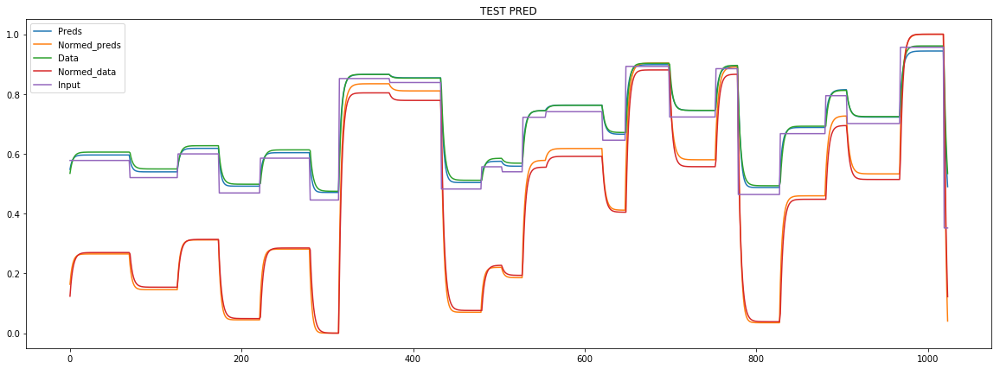

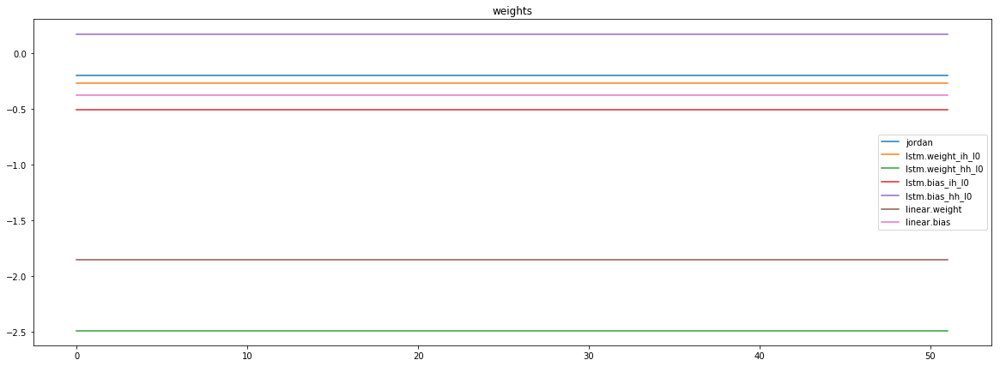

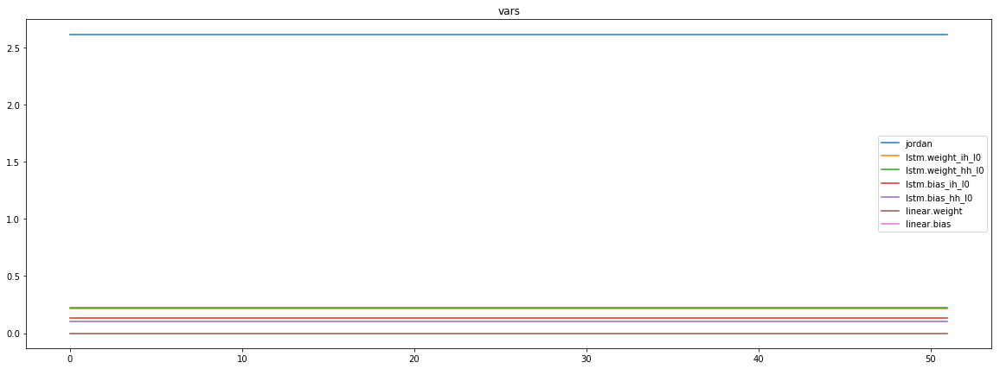

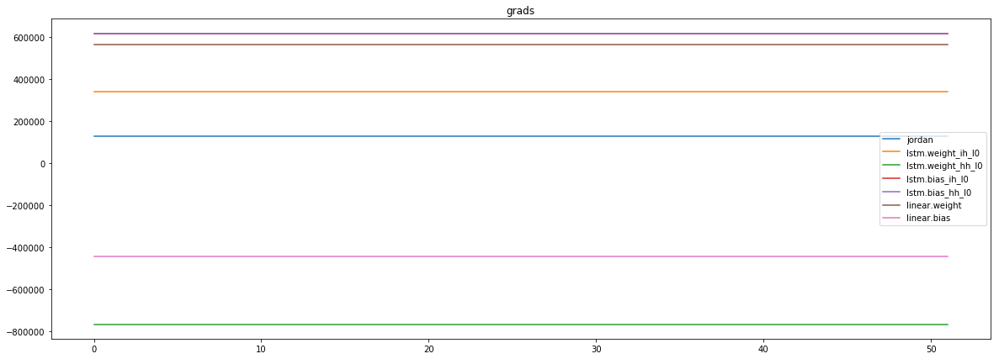

mean_p1 : 86302.8125
mean_p2 : 620090.1875
mean_p3 : -580118.0


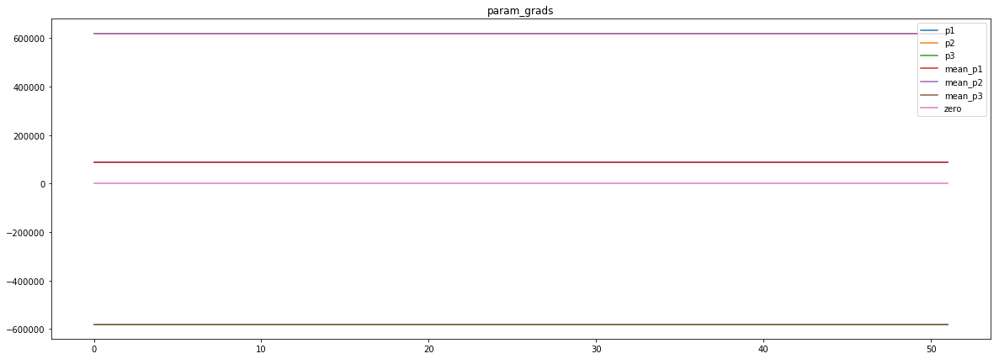

loss rate [0.014577638420825934]
Epoch [32] 
     train_loss[6890.2249098557695] 
     eval_train[4.524537398264958] 
     eval_test[4.520431354641914]



aux preds: -1.9310458898544312           0.9727118611335754           0.755665123462677
main loss 8230.539438100961
aux loss 0.0
jord loss 0.0
combined loss 8230.539438100961 



Parameter containing:
tensor([[-1.9310,  0.9727,  0.7557]], requires_grad=True)


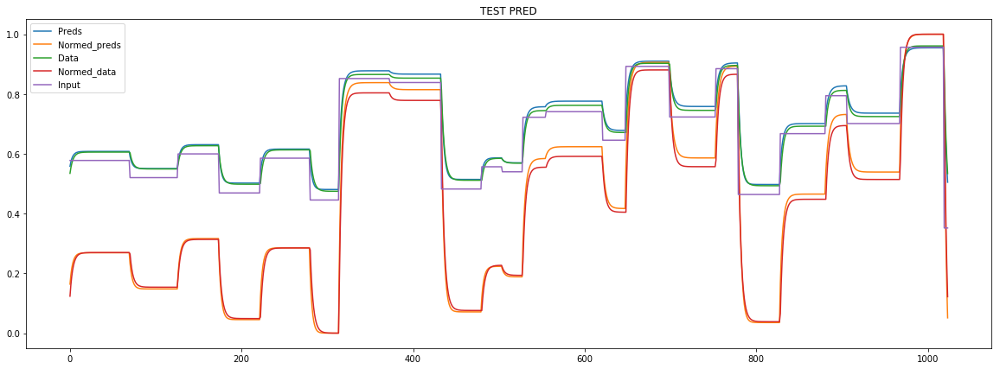

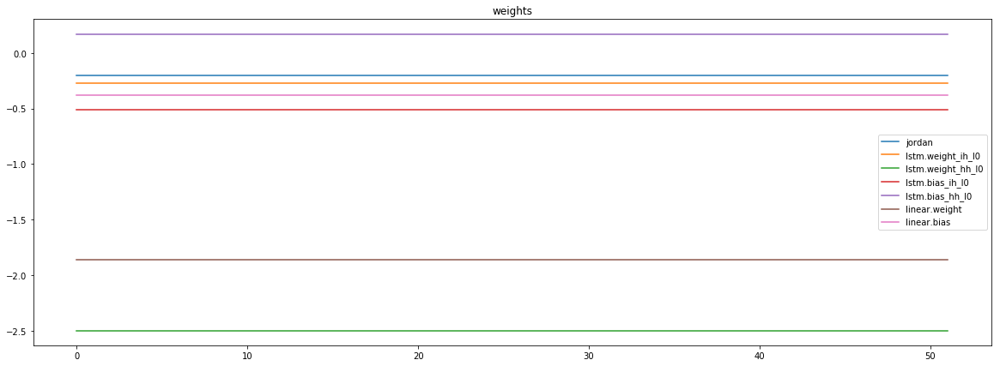

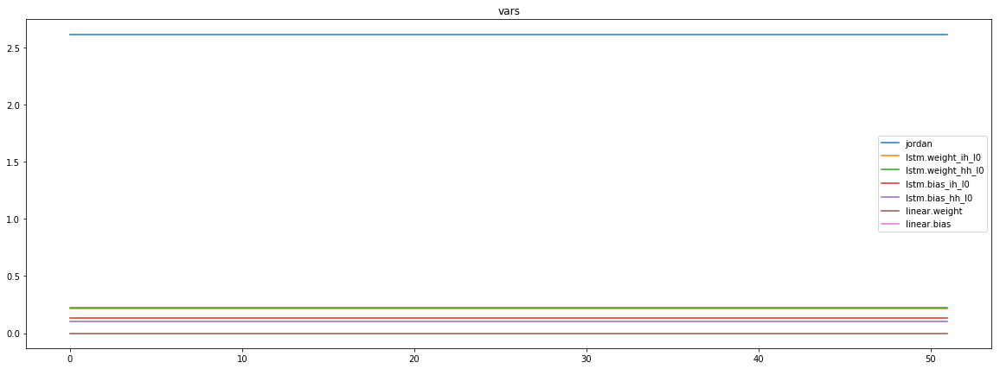

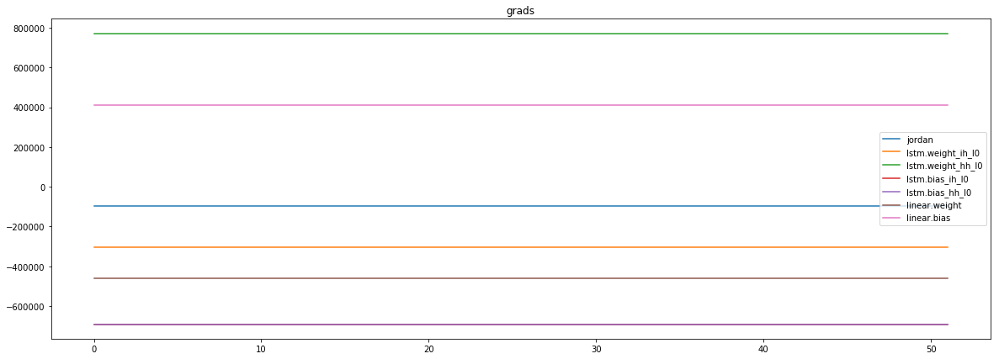

mean_p1 : -61039.5234375
mean_p2 : -596406.5
mean_p3 : 561567.875


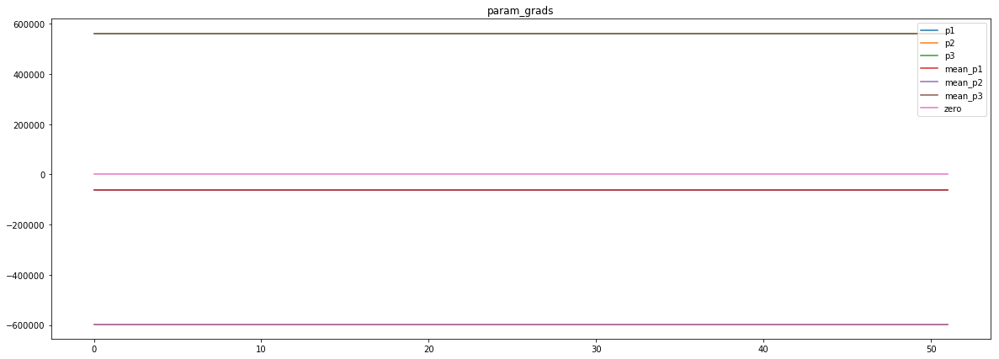

loss rate [-0.02201147375160306]
Epoch [33] 
     train_loss[8230.539438100961] 
     eval_train[4.713566415585005] 
     eval_test[4.675411367958242]



aux preds: -1.9229662418365479           0.9758505821228027           0.7516025900840759
main loss 6779.979961688702
aux loss 0.0
jord loss 0.0
combined loss 6779.979961688702 



Parameter containing:
tensor([[-1.9230,  0.9759,  0.7516]], requires_grad=True)


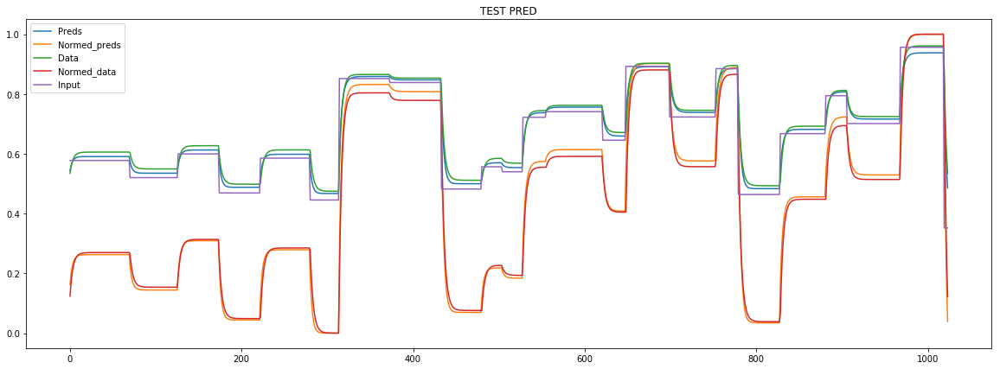

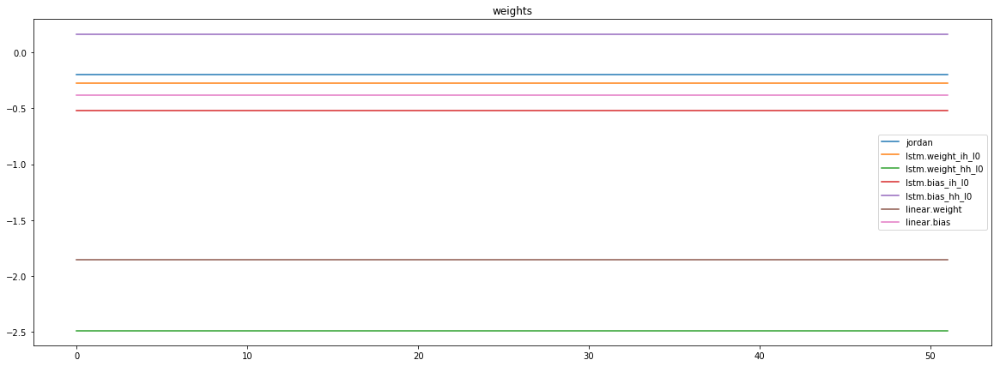

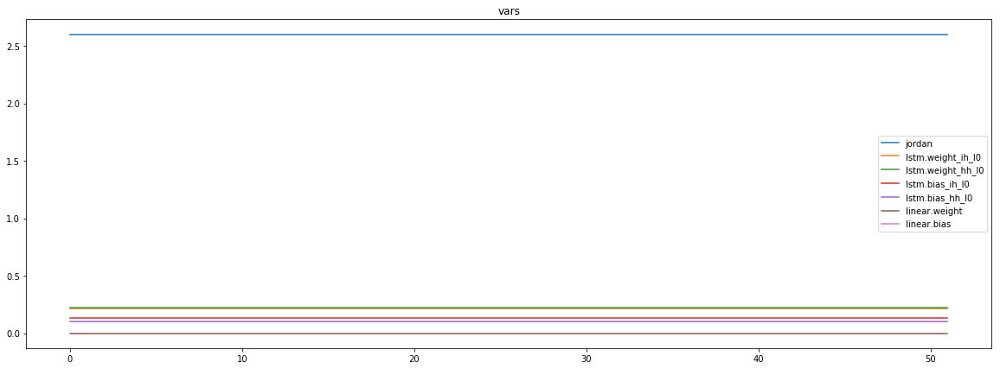

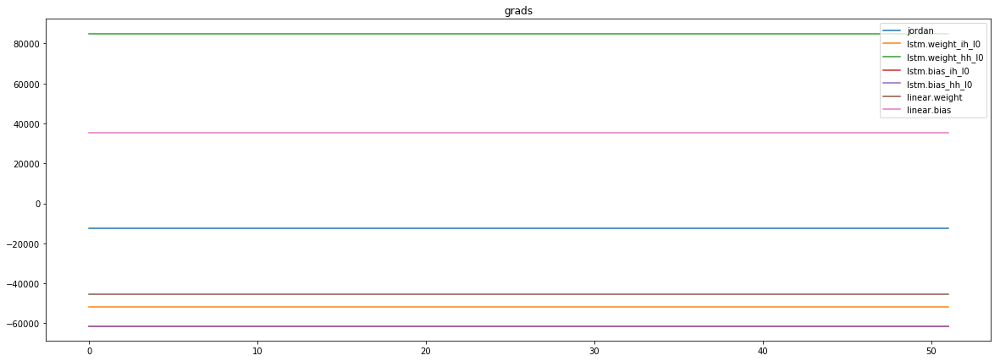

mean_p1 : -8964.6884765625
mean_p2 : -62357.91015625
mean_p3 : 58836.4609375


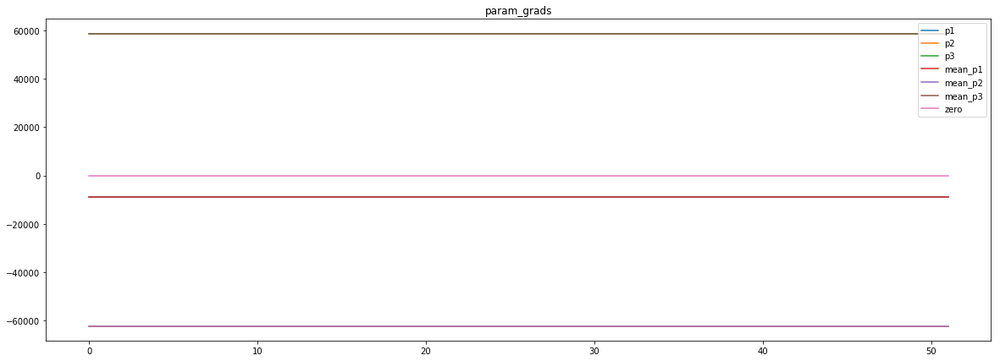

loss rate [-0.0485460693427715]
Epoch [34] 
     train_loss[6779.979961688702] 
     eval_train[4.763520906750973] 
     eval_test[4.781826214356856]



aux preds: -1.9294023513793945           0.9721782207489014           0.7543415427207947
main loss 7995.256319486178
aux loss 0.0
jord loss 0.0
combined loss 7995.256319486178 



Parameter containing:
tensor([[-1.9294,  0.9722,  0.7543]], requires_grad=True)


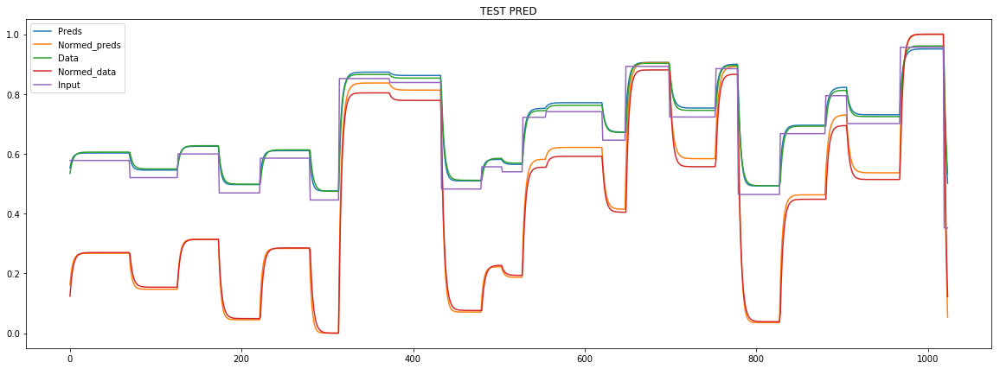

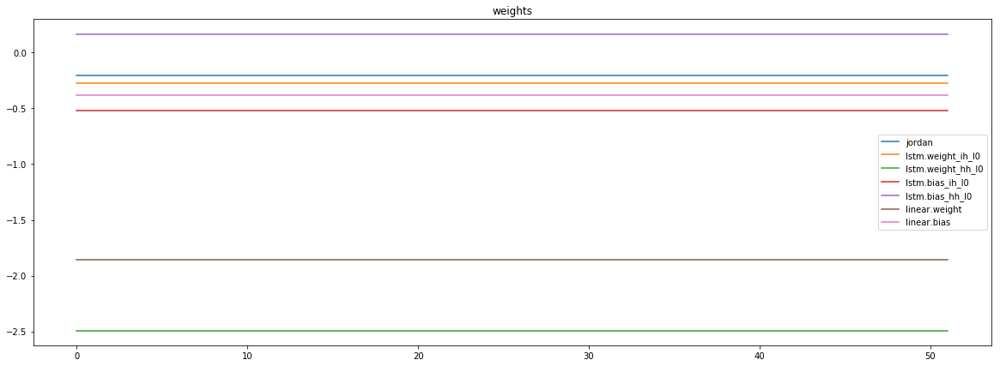

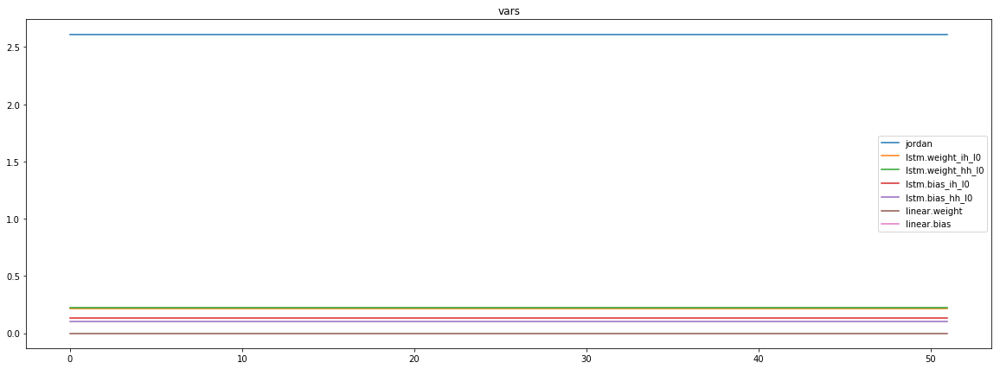

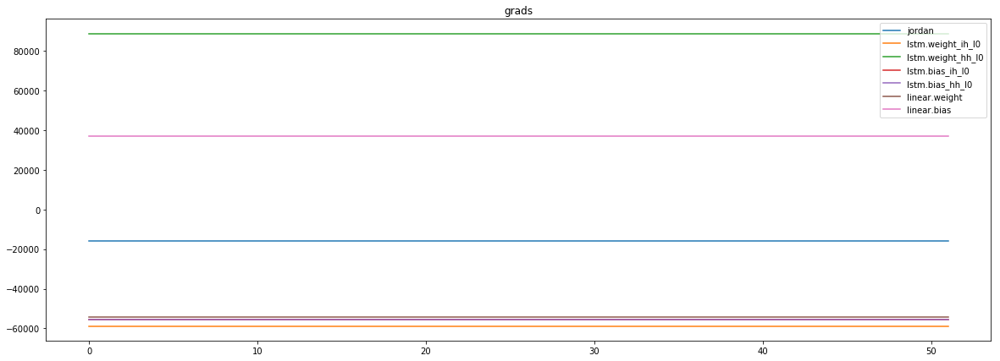

mean_p1 : -11872.4755859375
mean_p2 : -66847.234375
mean_p3 : 62811.703125


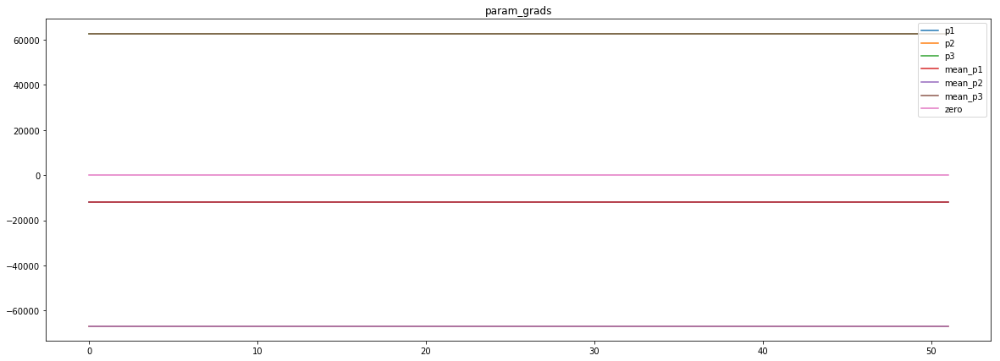

loss rate [0.03485569821824186]
Epoch [35] 
     train_loss[7995.256319486178] 
     eval_train[4.522472997124378] 
     eval_test[4.496822508898648]



aux preds: -1.9236843585968018           0.9728365540504456           0.7529152631759644
main loss 6738.74844125601
aux loss 0.0
jord loss 0.0
combined loss 6738.74844125601 



Parameter containing:
tensor([[-1.9237,  0.9728,  0.7529]], requires_grad=True)


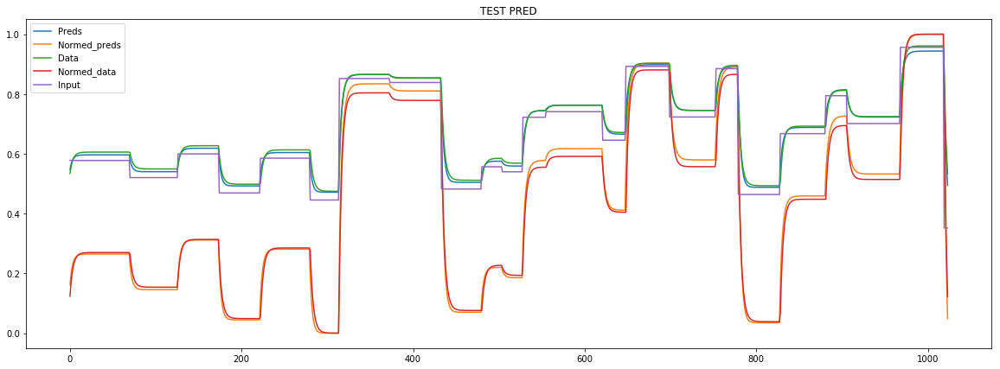

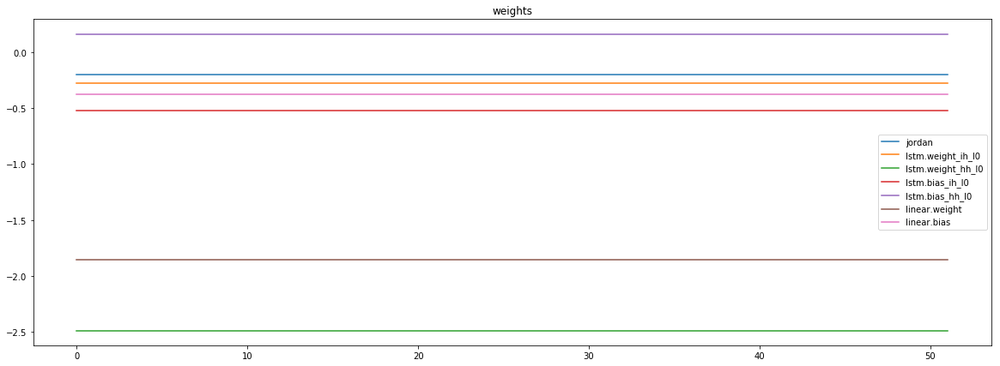

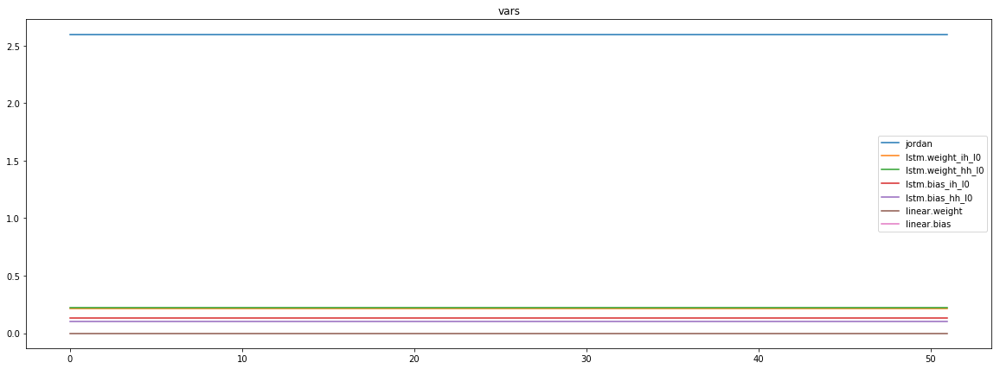

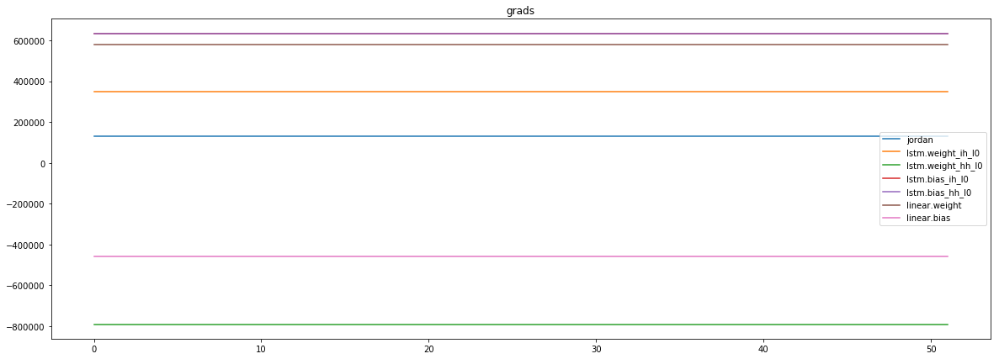

mean_p1 : 90557.296875
mean_p2 : 641609.9375
mean_p3 : -600508.625


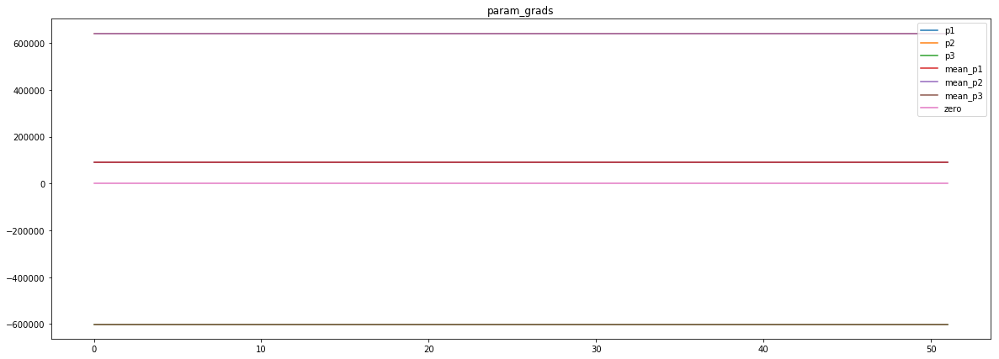

loss rate [0.03396650624541098]
Epoch [36] 
     train_loss[6738.74844125601] 
     eval_train[4.498927072263681] 
     eval_test[4.493363140658898]



aux preds: -1.9201011657714844           0.9733944535255432           0.7514905333518982
main loss 7179.00727726863
aux loss 0.0
jord loss 0.0
combined loss 7179.00727726863 



Parameter containing:
tensor([[-1.9201,  0.9734,  0.7515]], requires_grad=True)


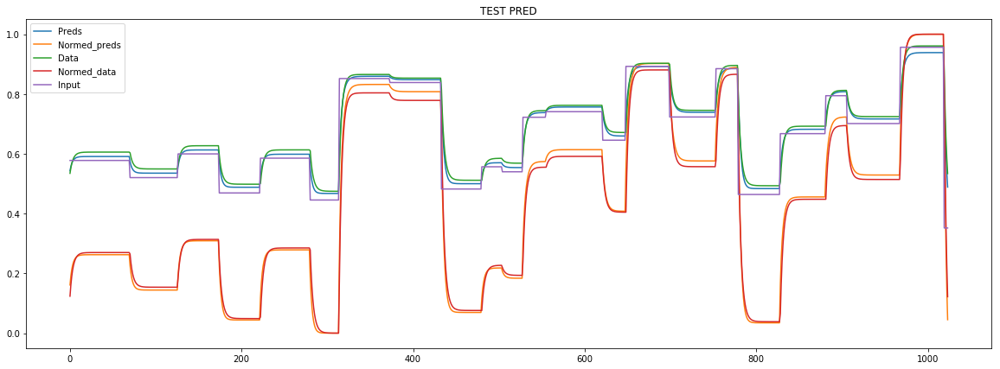

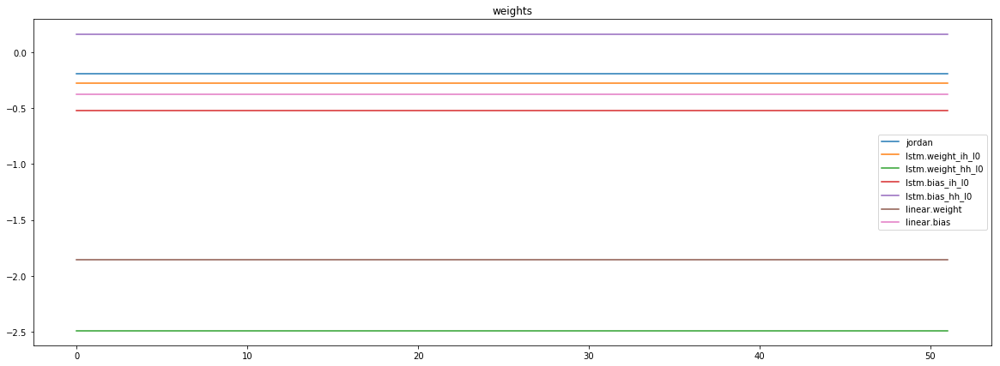

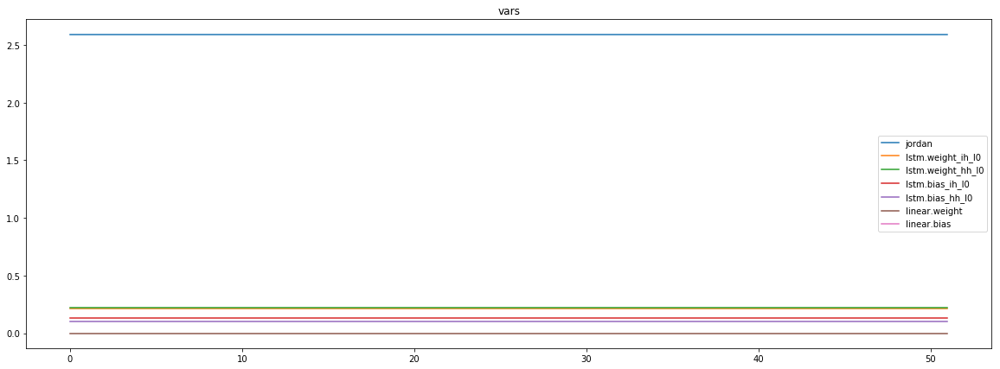

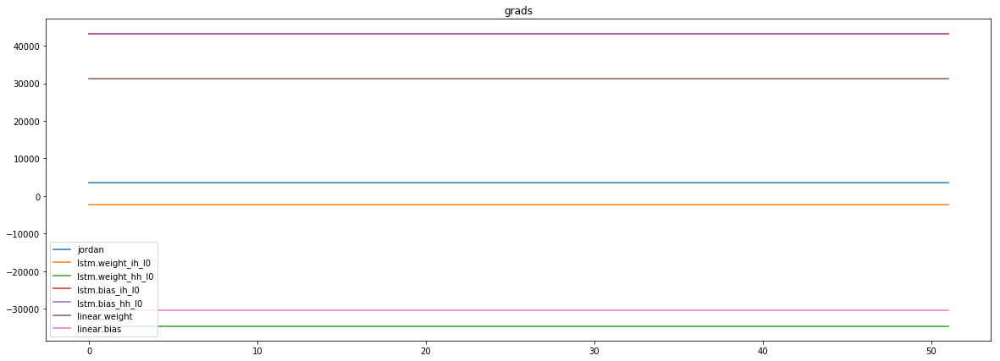

mean_p1 : 1483.1473388671875
mean_p2 : 31162.630859375
mean_p3 : -29144.85546875


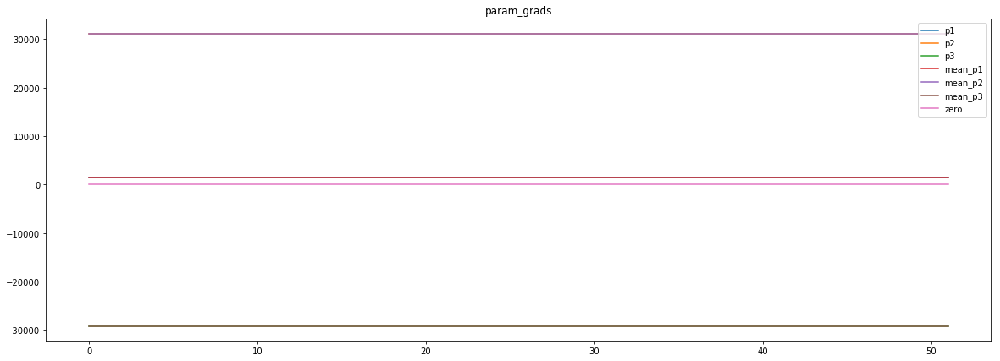

loss rate [-0.03431138477785245]
Epoch [37] 
     train_loss[7179.00727726863] 
     eval_train[4.73163756613548] 
     eval_test[4.748182887380773]



aux preds: -1.9184380769729614           0.9736250638961792           0.7504187822341919
main loss 6893.027015099158
aux loss 0.0
jord loss 0.0
combined loss 6893.027015099158 



Parameter containing:
tensor([[-1.9184,  0.9736,  0.7504]], requires_grad=True)


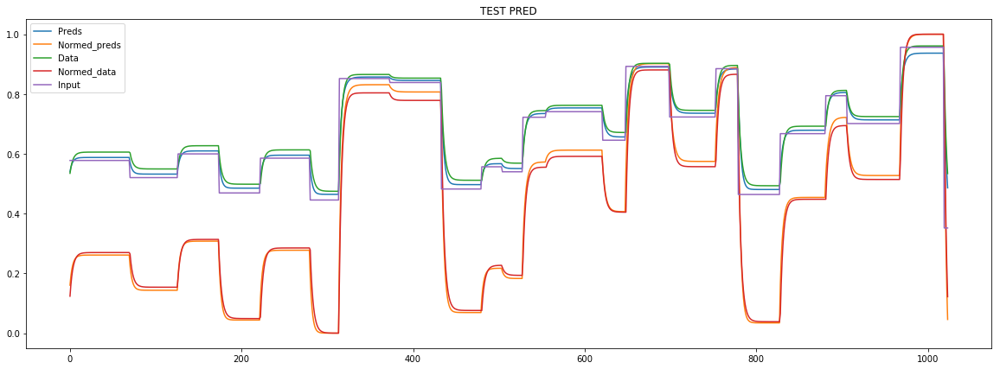

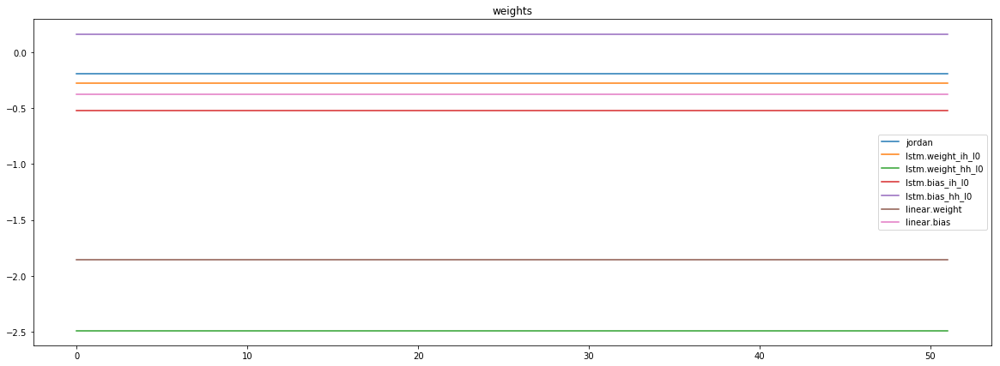

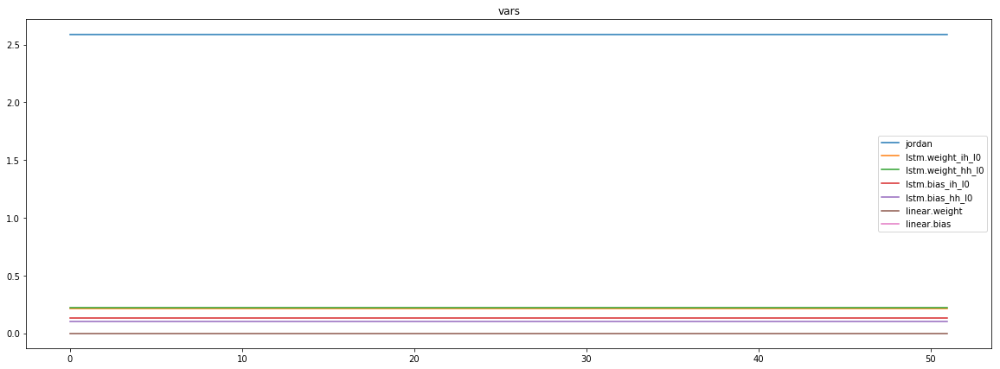

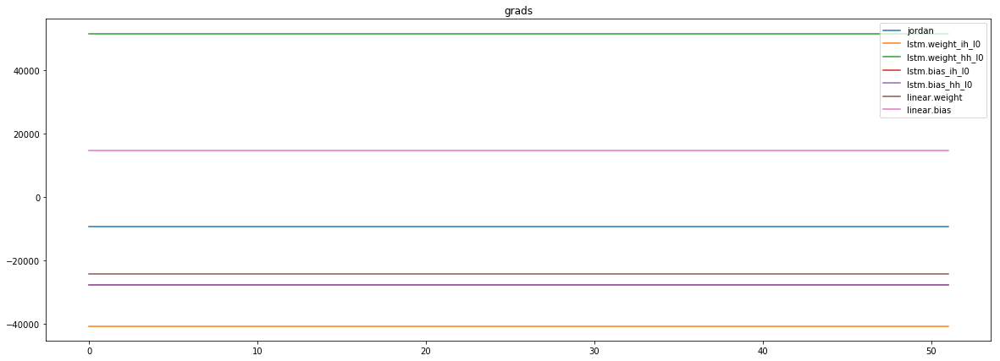

mean_p1 : -7184.369140625
mean_p2 : -36575.28515625
mean_p3 : 34414.109375


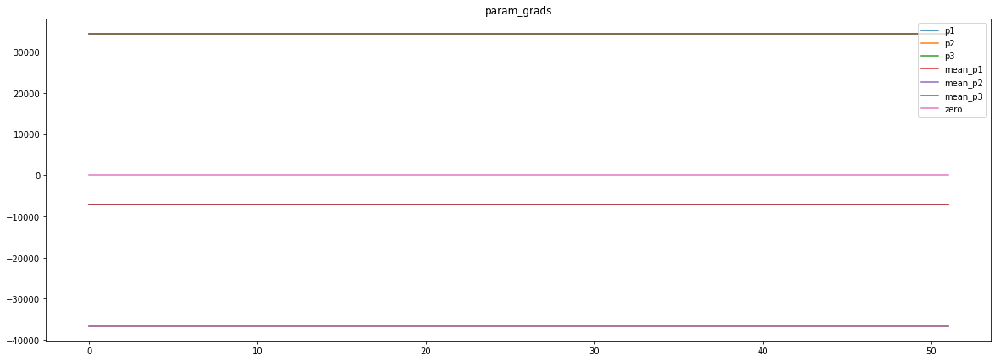

loss rate [-0.06989533531822101]
Epoch [38] 
     train_loss[6893.027015099158] 
     eval_train[4.875405061703462] 
     eval_test[4.899538804184306]



aux preds: -1.9167625904083252           0.9697576761245728           0.7534854412078857
main loss 6775.124333308293
aux loss 0.0
jord loss 0.0
combined loss 6775.124333308293 



Parameter containing:
tensor([[-1.9168,  0.9698,  0.7535]], requires_grad=True)


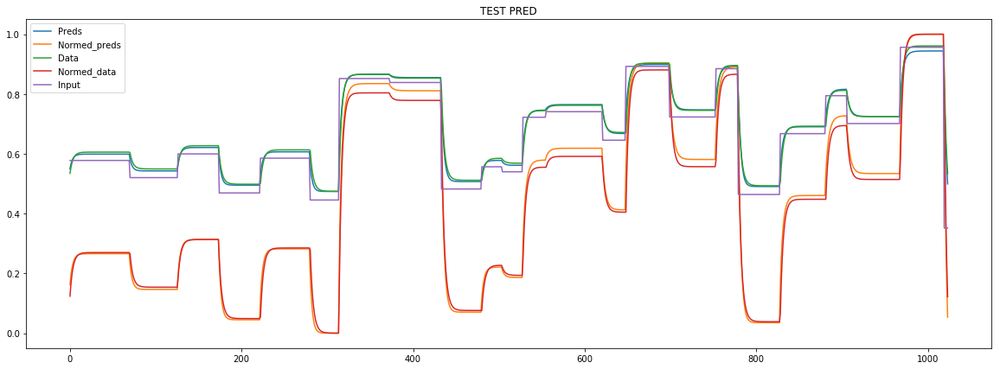

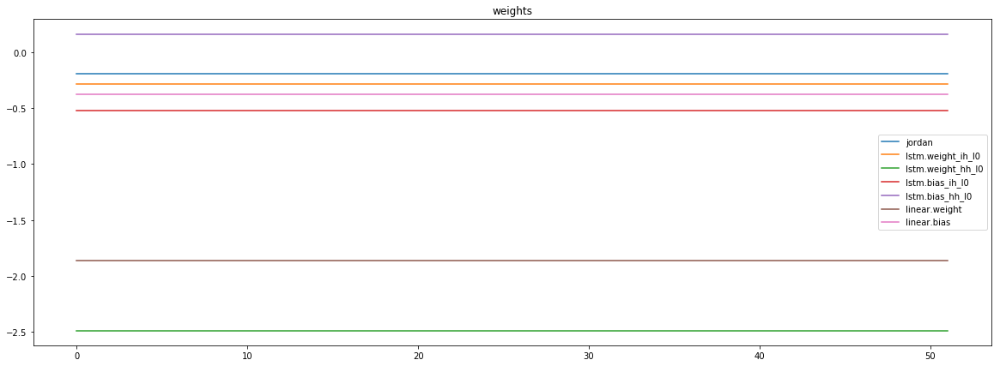

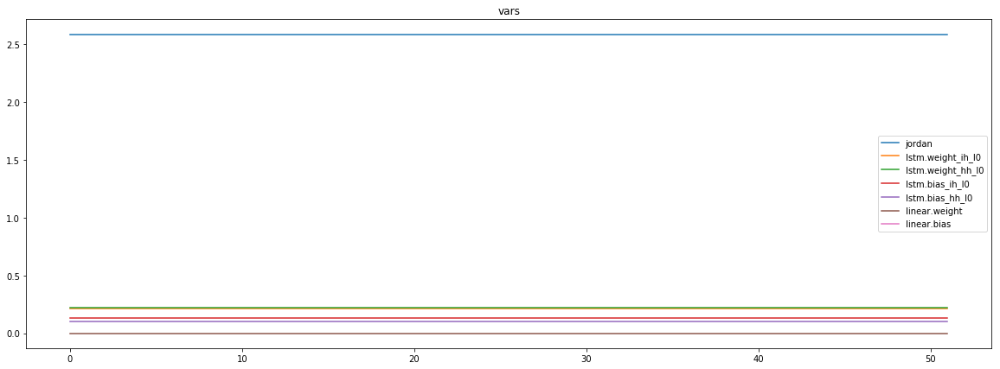

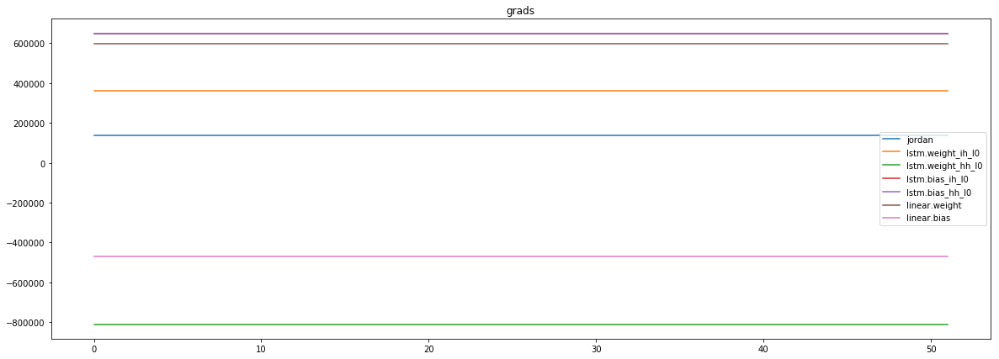

mean_p1 : 94812.6171875
mean_p2 : 661350.6875
mean_p3 : -619427.125


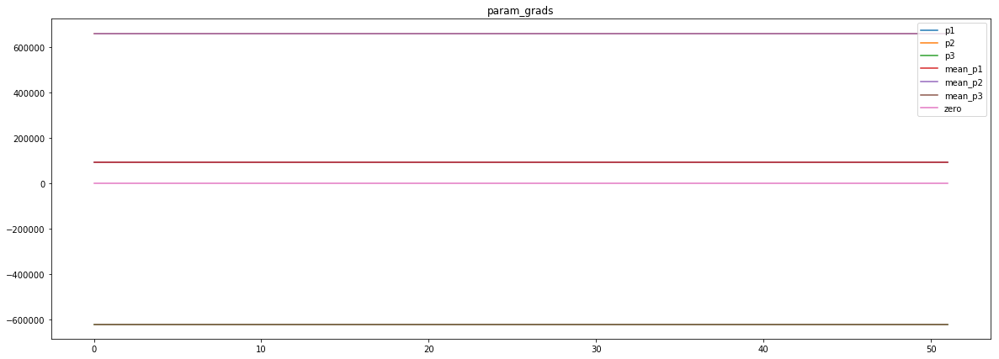

loss rate [0.05850733713046885]
Epoch [39] 
     train_loss[6775.124333308293] 
     eval_train[4.452421830823788] 
     eval_test[4.437909204851497]



aux preds: -1.9146095514297485           0.9687744379043579           0.7536929845809937
main loss 6741.1510338416465
aux loss 0.0
jord loss 0.0
combined loss 6741.1510338416465 



Parameter containing:
tensor([[-1.9146,  0.9688,  0.7537]], requires_grad=True)


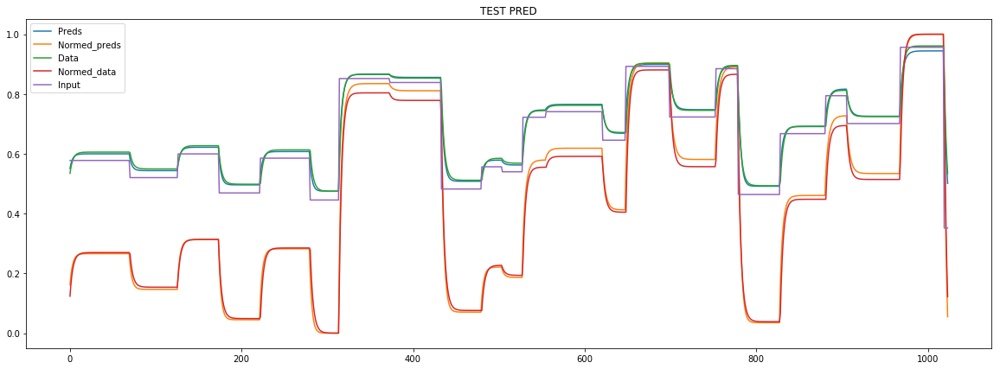

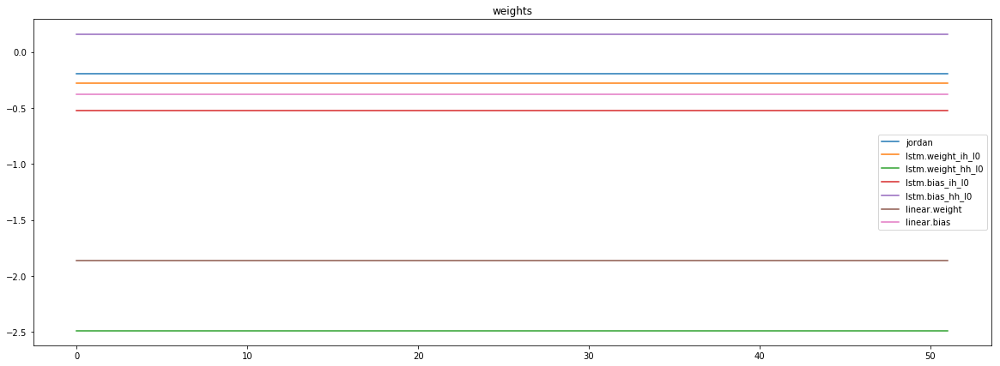

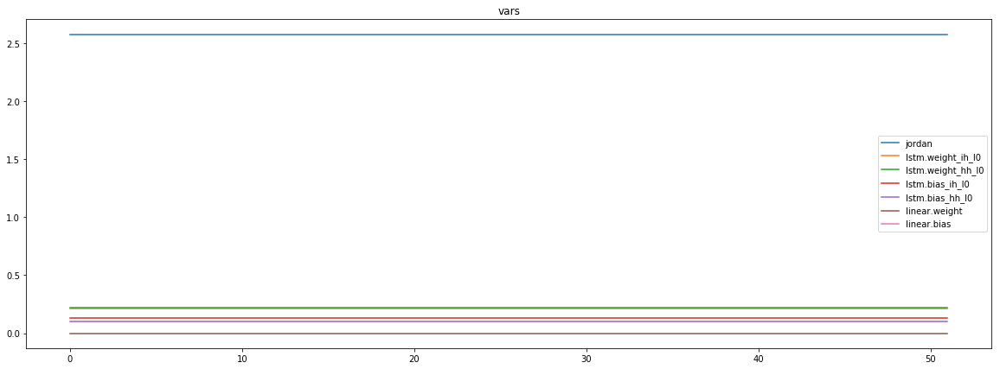

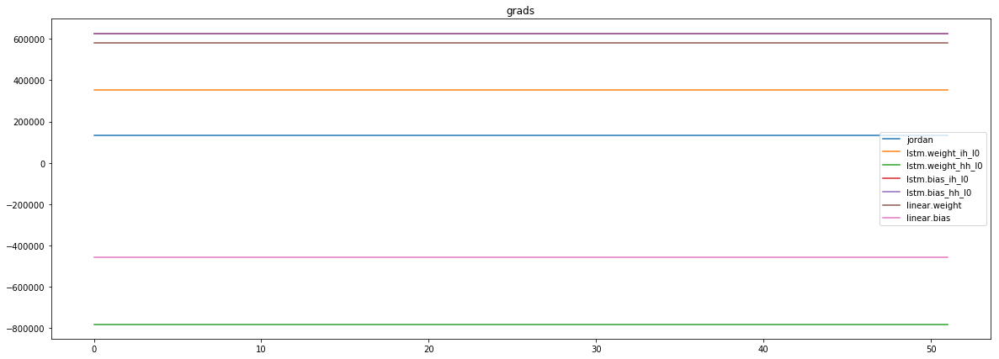

mean_p1 : 92538.515625
mean_p2 : 640605.4375
mean_p3 : -600029.75


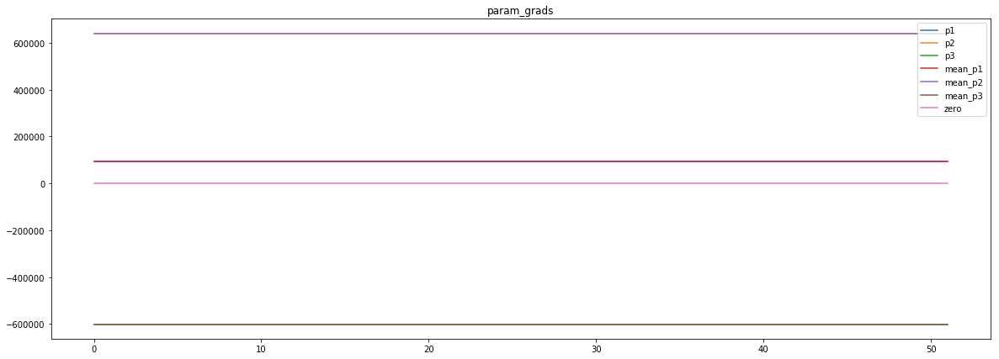

loss rate [0.05765157945036803]
Epoch [40] 
     train_loss[6741.1510338416465] 
     eval_train[4.442449209208672] 
     eval_test[4.424524009227753]



aux preds: -1.9157987833023071           0.9723203778266907           0.7493702173233032
main loss 6521.801006610577
aux loss 0.0
jord loss 0.0
combined loss 6521.801006610577 



Parameter containing:
tensor([[-1.9158,  0.9723,  0.7494]], requires_grad=True)


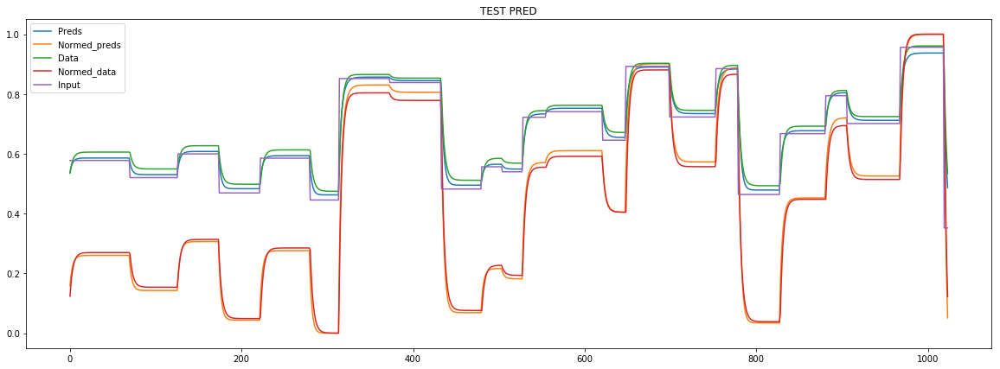

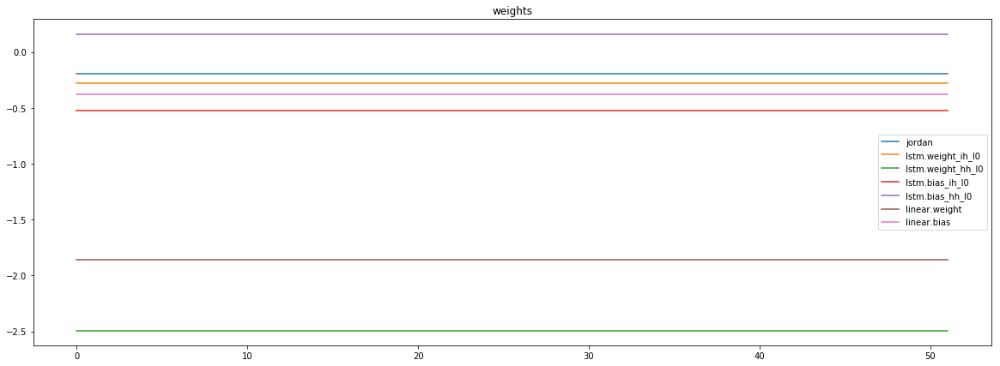

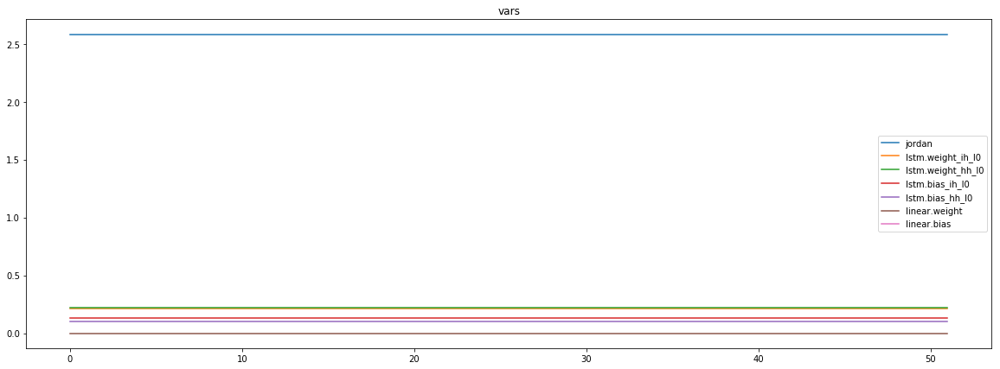

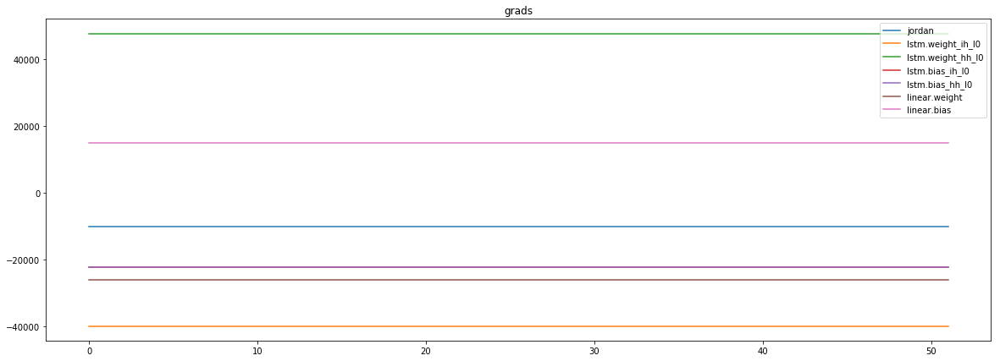

mean_p1 : -7966.3681640625
mean_p2 : -35245.890625
mean_p3 : 33091.19921875


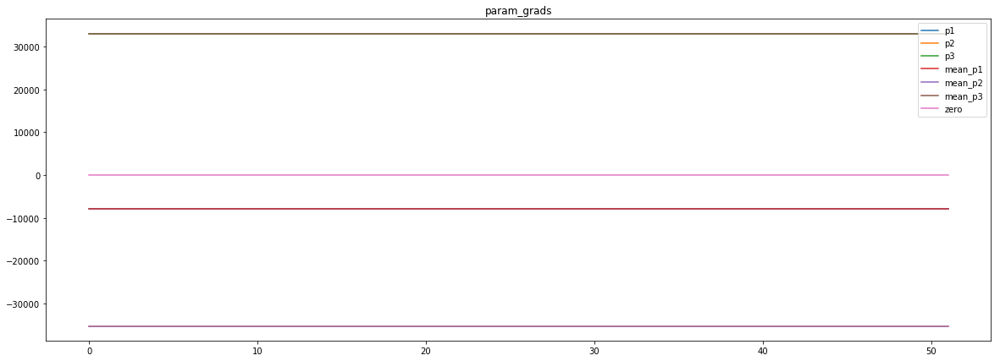

loss rate [-0.07961920019809288]
Epoch [41] 
     train_loss[6521.801006610577] 
     eval_train[4.927869143394323] 
     eval_test[4.952563074502078]



aux preds: -1.9161324501037598           0.9698750376701355           0.7510306239128113
main loss 6736.334510216346
aux loss 0.0
jord loss 0.0
combined loss 6736.334510216346 



Parameter containing:
tensor([[-1.9161,  0.9699,  0.7510]], requires_grad=True)


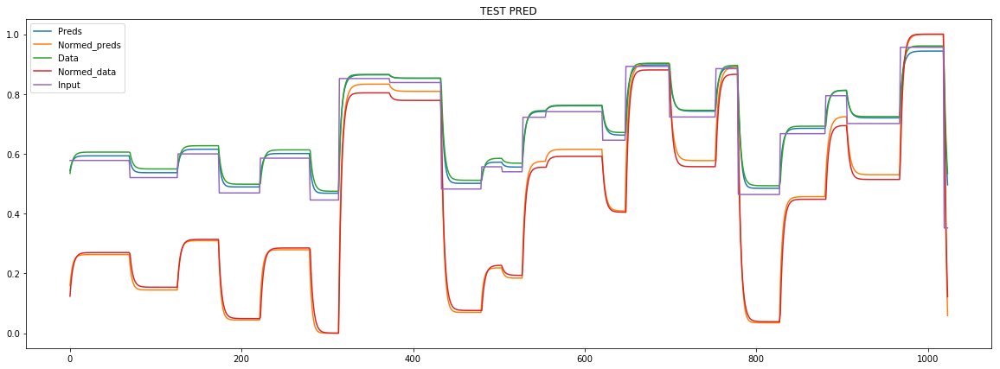

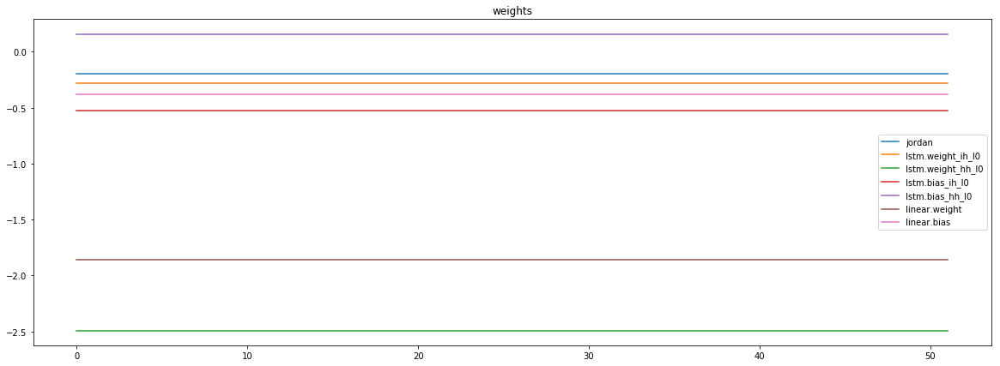

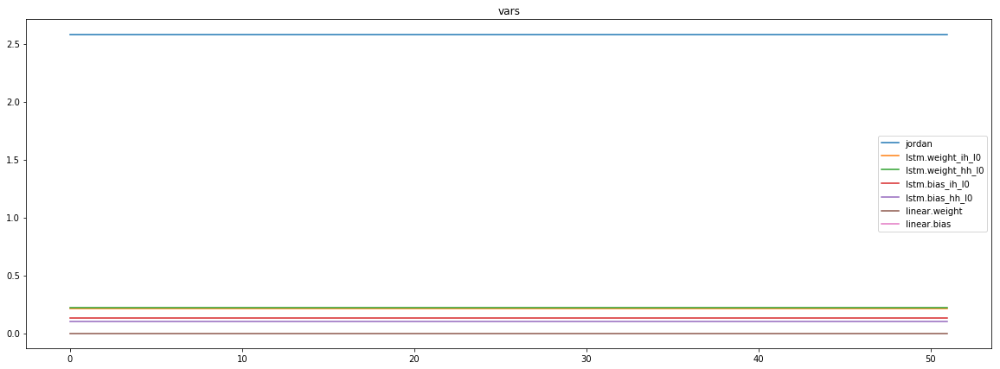

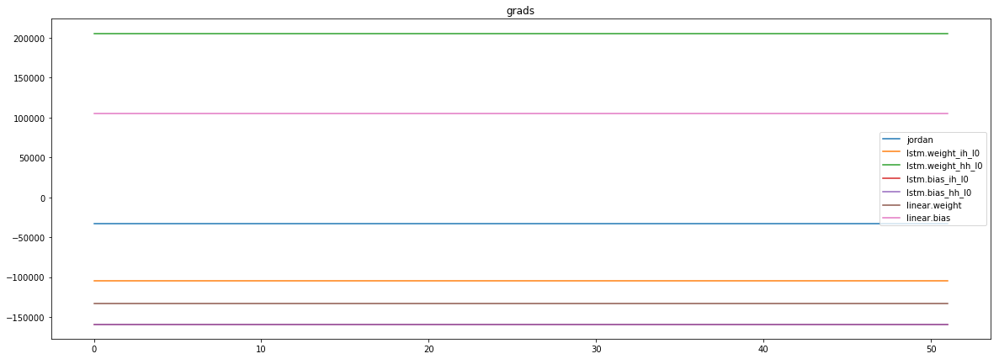

mean_p1 : -23602.162109375
mean_p2 : -162069.1875
mean_p3 : 152338.4375


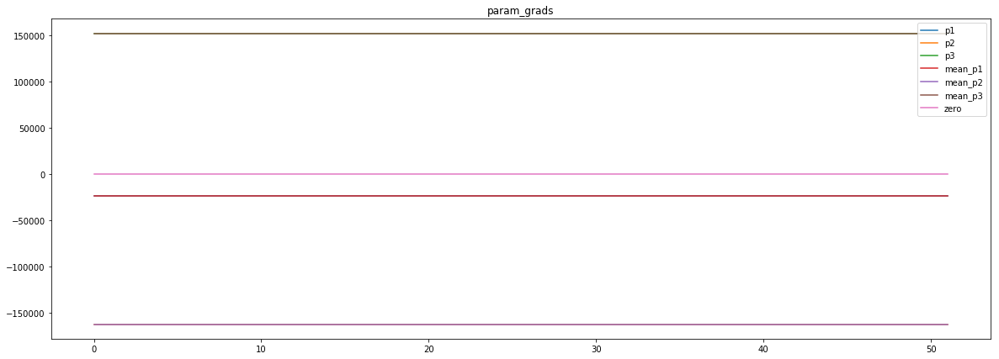

loss rate [0.01252529984524875]
Epoch [42] 
     train_loss[6736.334510216346] 
     eval_train[4.5393454019839945] 
     eval_test[4.547319772568616]



aux preds: -1.9186787605285645           0.9657353162765503           0.7543994188308716
main loss 8077.463022085337
aux loss 0.0
jord loss 0.0
combined loss 8077.463022085337 



Parameter containing:
tensor([[-1.9187,  0.9657,  0.7544]], requires_grad=True)


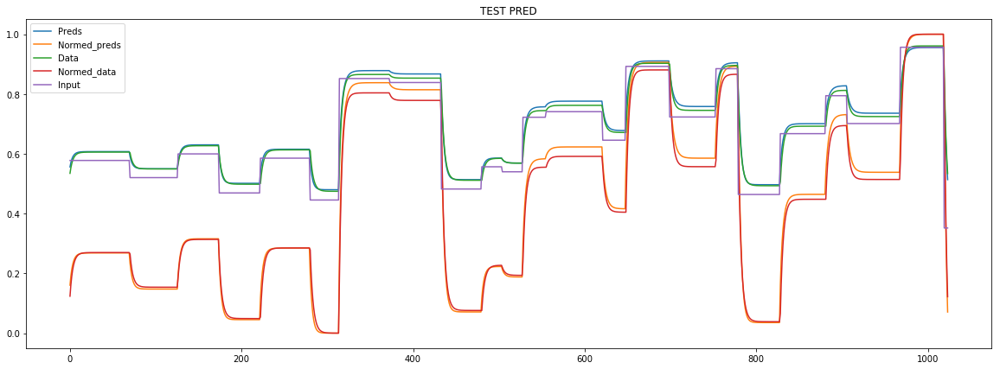

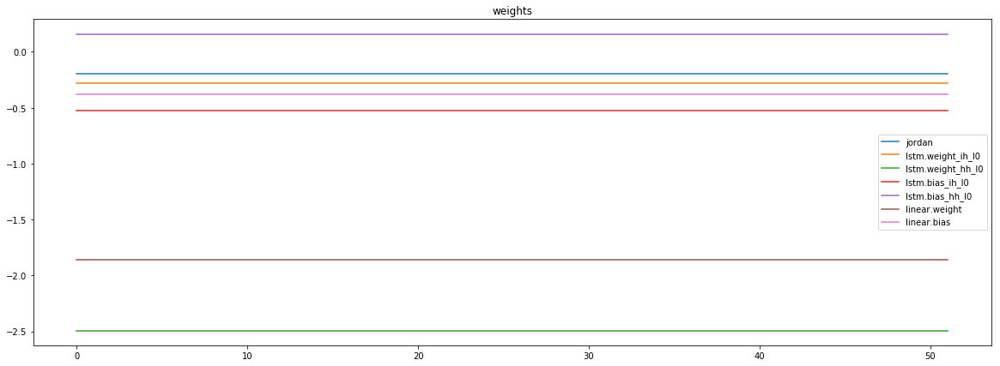

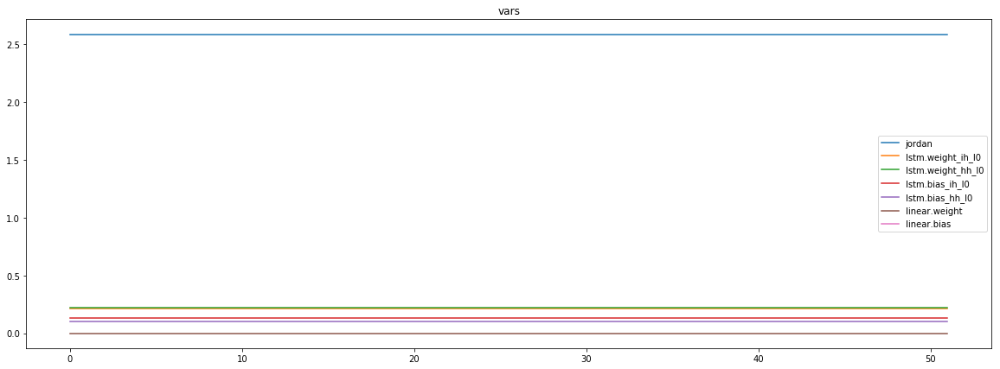

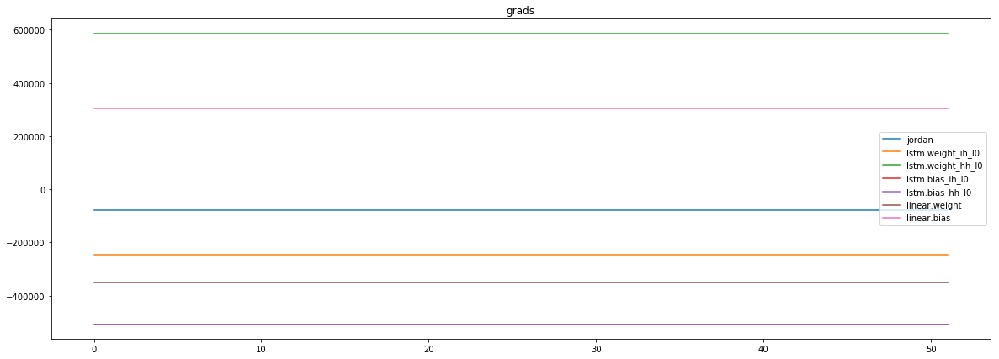

mean_p1 : -52499.90234375
mean_p2 : -457077.71875
mean_p3 : 430016.28125


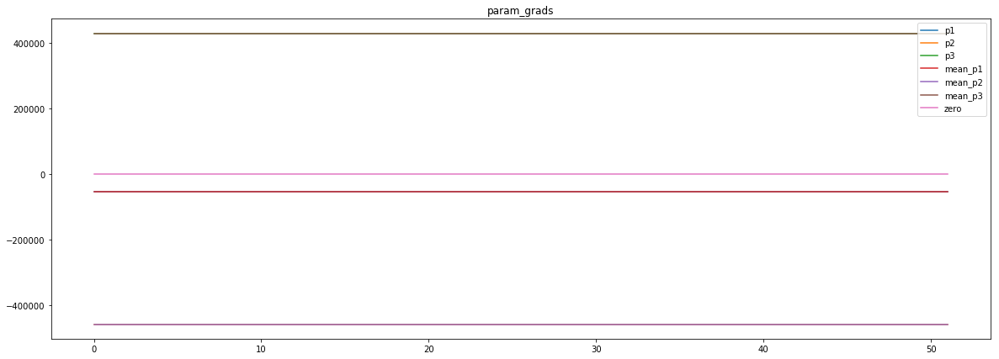

loss rate [0.007384862318728591]
Epoch [43] 
     train_loss[8077.463022085337] 
     eval_train[4.642264248086856] 
     eval_test[4.607192342931574]



aux preds: -1.9180787801742554           0.9655181765556335           0.7539312243461609
main loss 7873.681753305288
aux loss 0.0
jord loss 0.0
combined loss 7873.681753305288 



Parameter containing:
tensor([[-1.9181,  0.9655,  0.7539]], requires_grad=True)


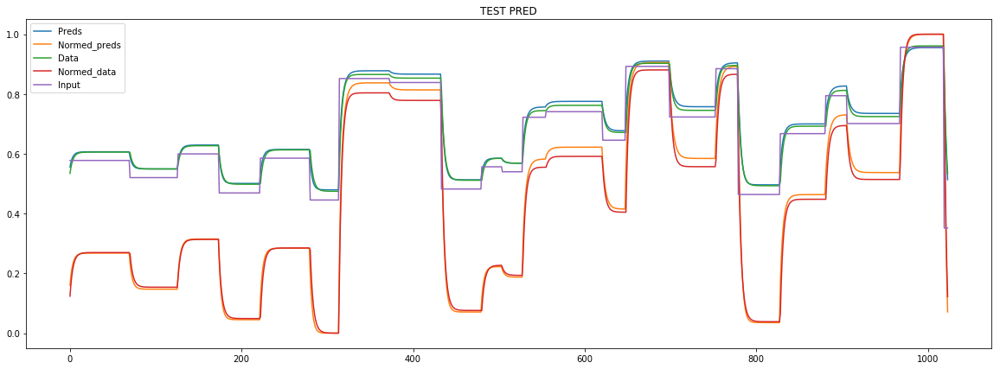

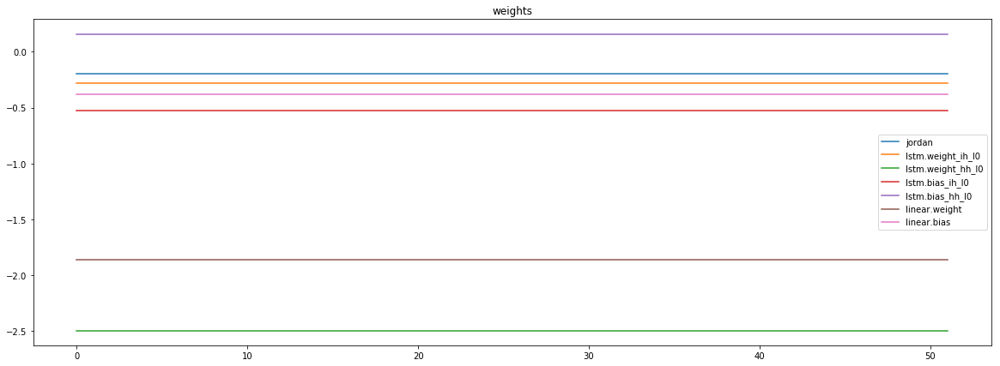

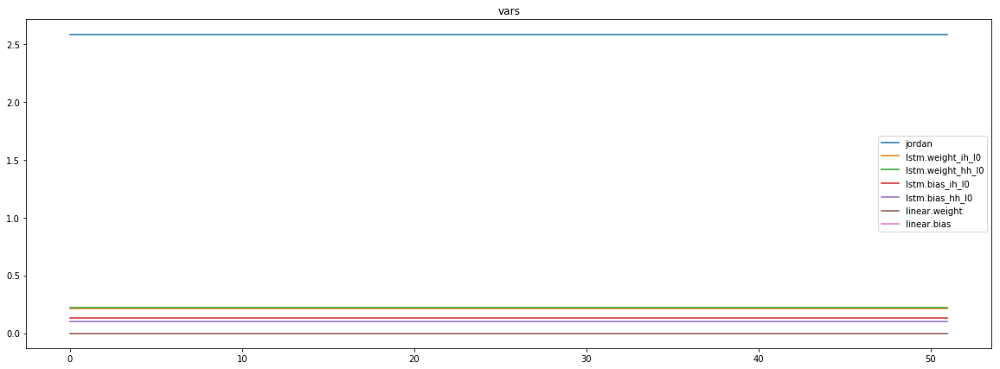

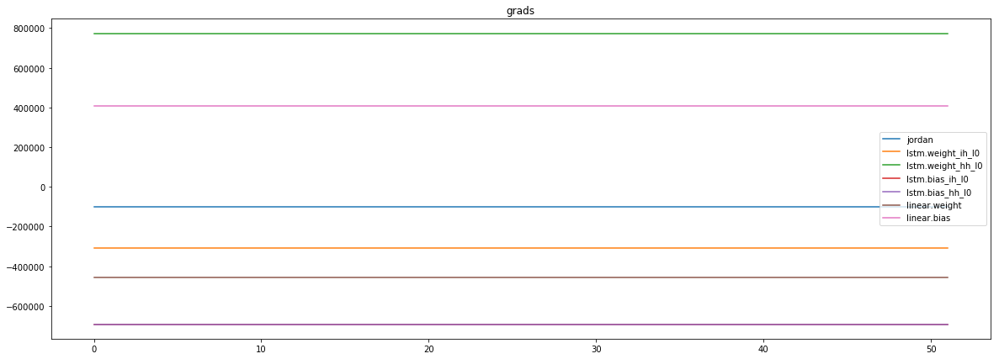

mean_p1 : -63872.7578125
mean_p2 : -602374.0625
mean_p3 : 567225.5625


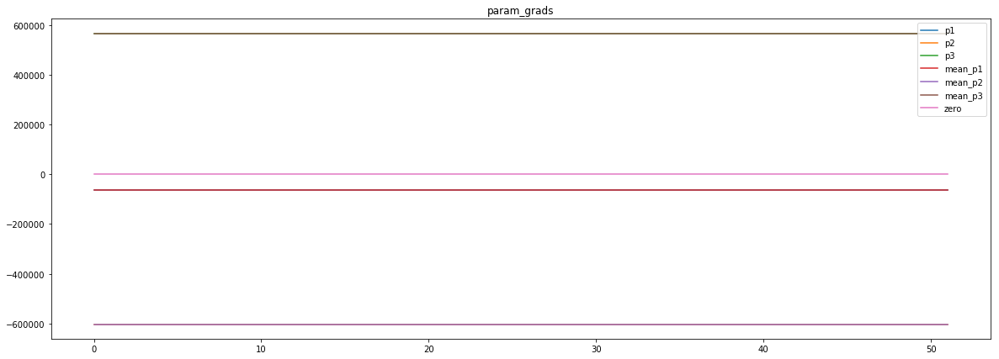

loss rate [0.02736097461874265]
Epoch [44] 
     train_loss[7873.681753305288] 
     eval_train[4.608646506300339] 
     eval_test[4.573697287927974]



aux preds: -1.9081127643585205           0.9669479131698608           0.7518885135650635
main loss 6473.23672250601
aux loss 0.0
jord loss 0.0
combined loss 6473.23672250601 



Parameter containing:
tensor([[-1.9081,  0.9669,  0.7519]], requires_grad=True)


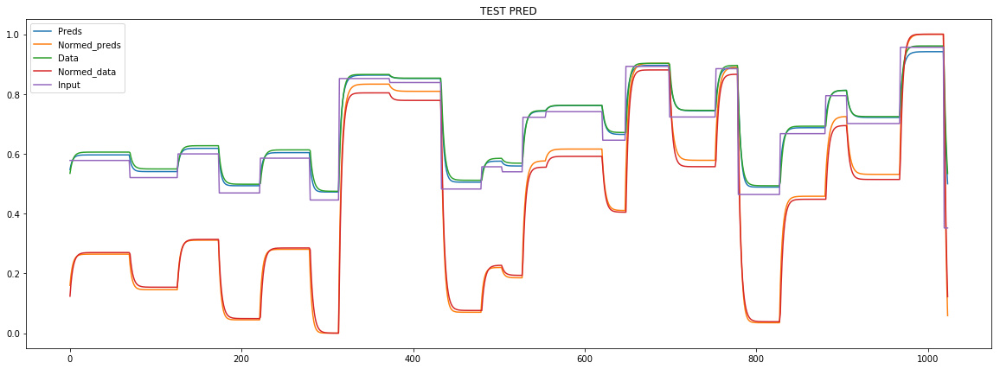

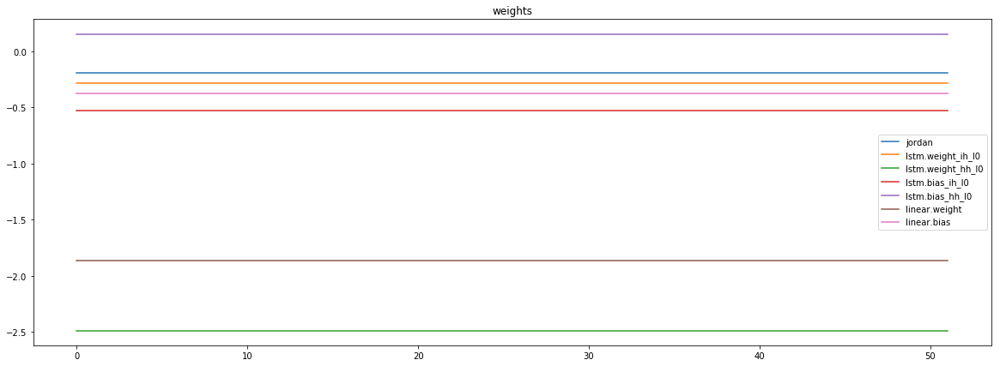

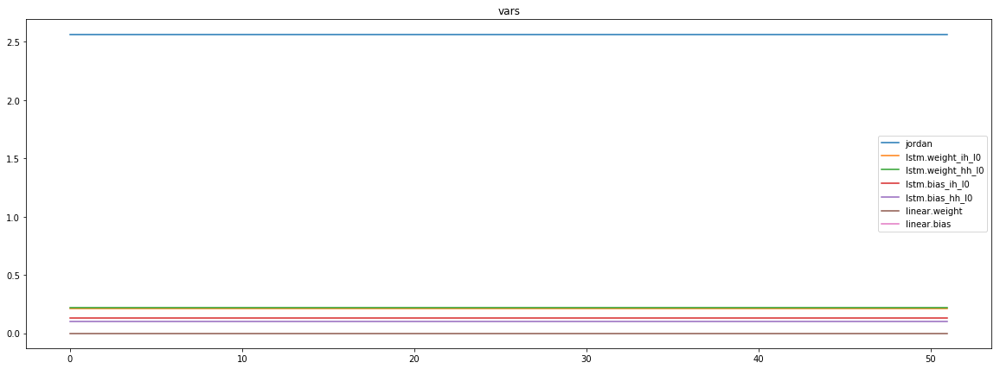

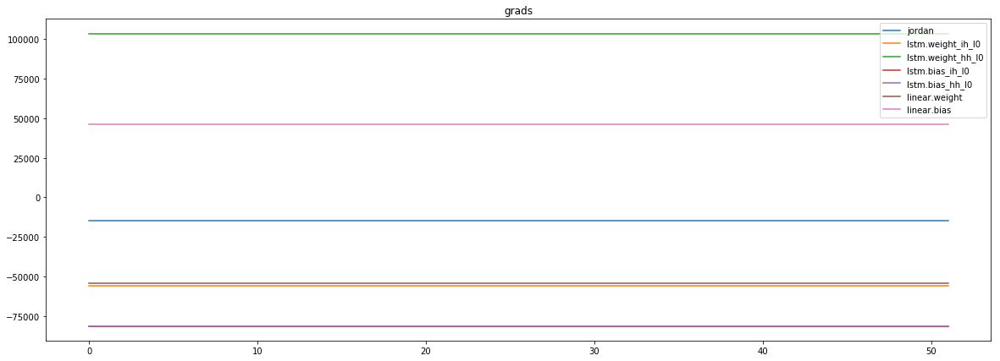

mean_p1 : -10303.7109375
mean_p2 : -77861.8359375
mean_p3 : 73293.328125


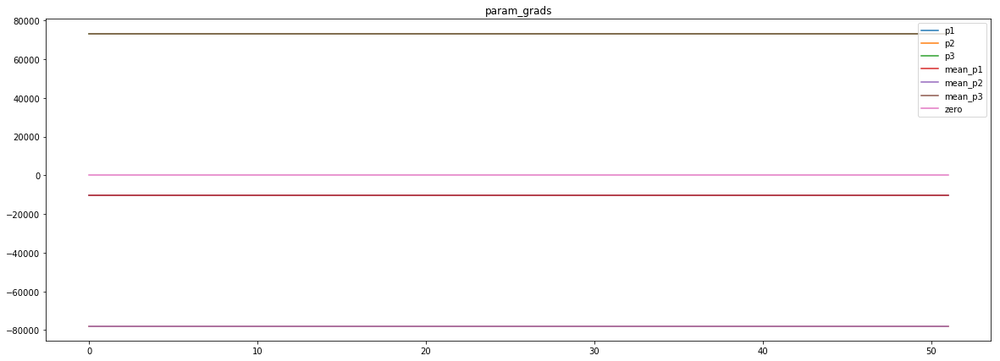

loss rate [0.02052565585049282]
Epoch [45] 
     train_loss[6473.23672250601] 
     eval_train[4.485073473017949] 
     eval_test[4.482142967256633]



aux preds: -1.9155199527740479           0.9672807455062866           0.7508001923561096
main loss 7412.6194411057695
aux loss 0.0
jord loss 0.0
combined loss 7412.6194411057695 



Parameter containing:
tensor([[-1.9155,  0.9673,  0.7508]], requires_grad=True)


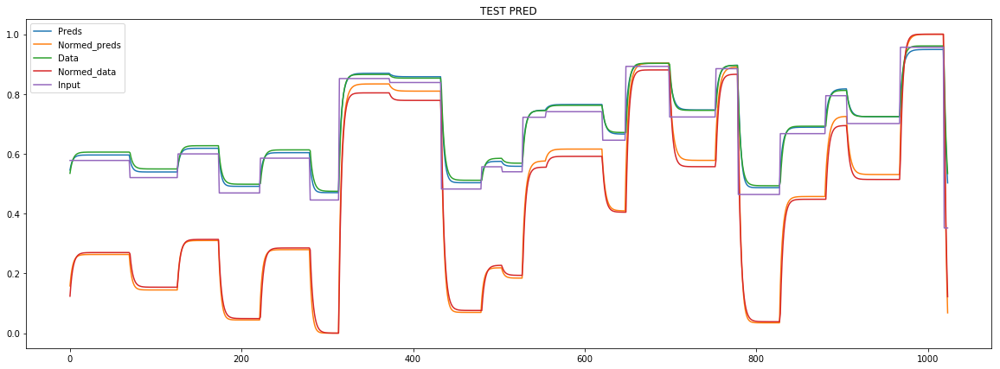

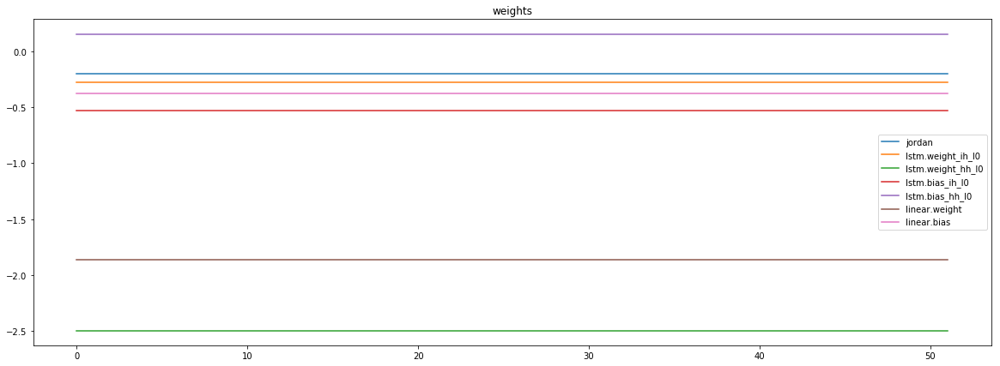

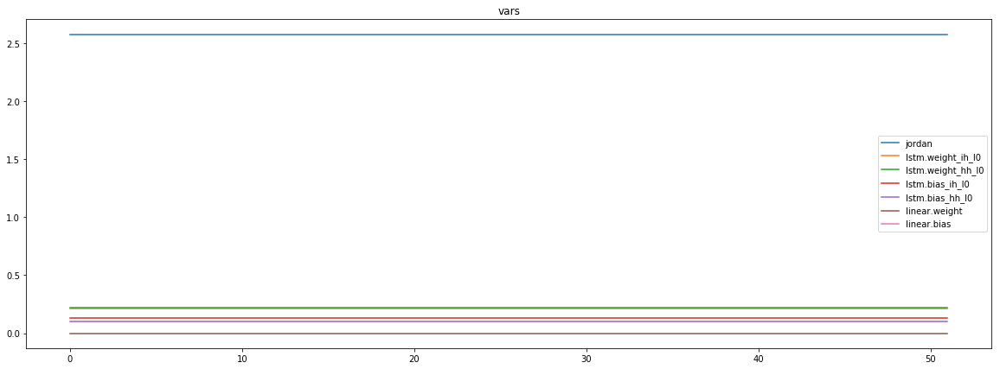

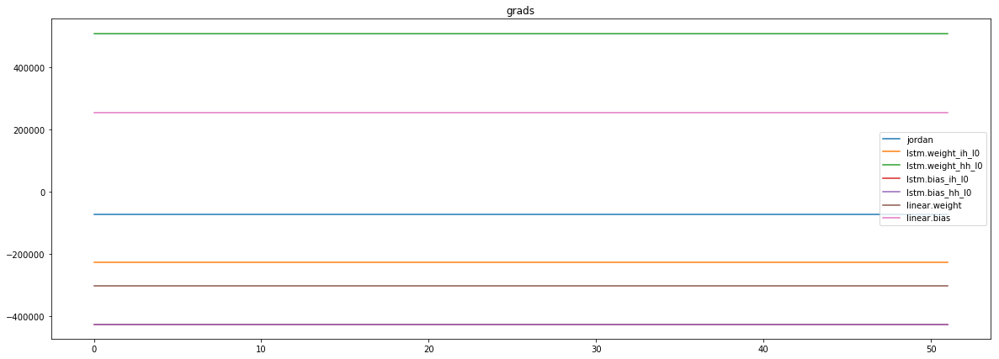

mean_p1 : -49360.80859375
mean_p2 : -398180.625
mean_p3 : 374172.28125


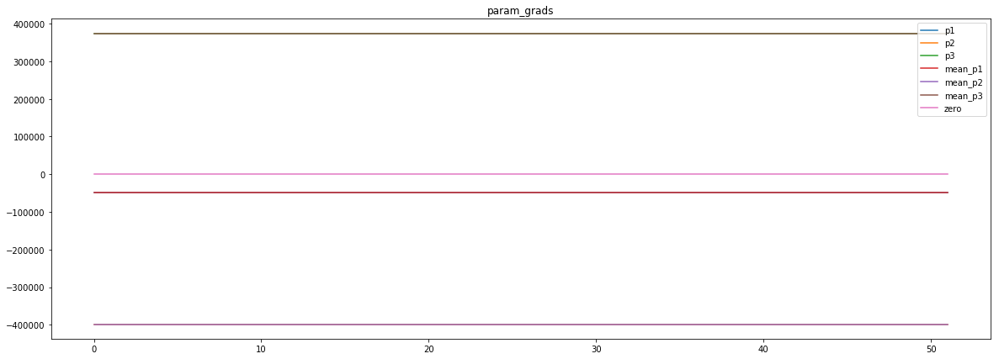

loss rate [0.0242884905570403]
Epoch [46] 
     train_loss[7412.6194411057695] 
     eval_train[4.448773107276513] 
     eval_test[4.443726053292101]



aux preds: -1.9070693254470825           0.9671241641044617           0.7503811120986938
main loss 6701.29780461238
aux loss 0.0
jord loss 0.0
combined loss 6701.29780461238 



Parameter containing:
tensor([[-1.9071,  0.9671,  0.7504]], requires_grad=True)


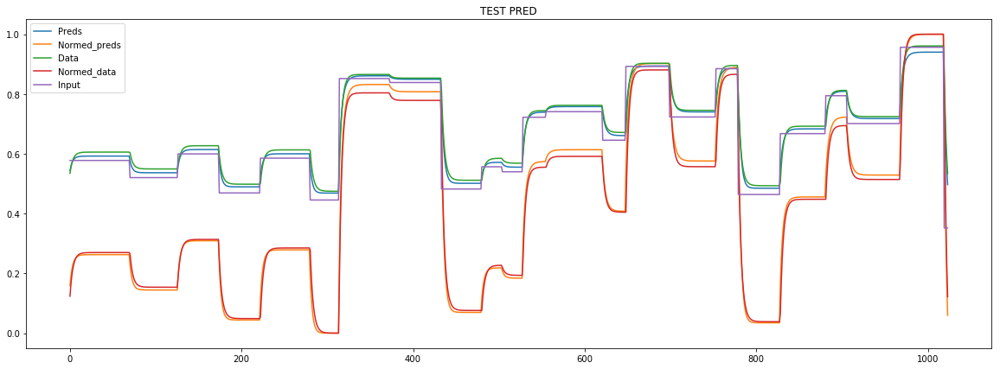

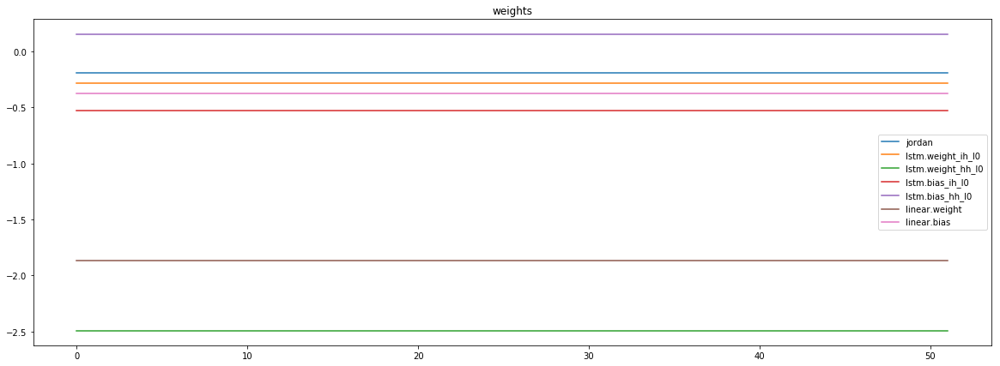

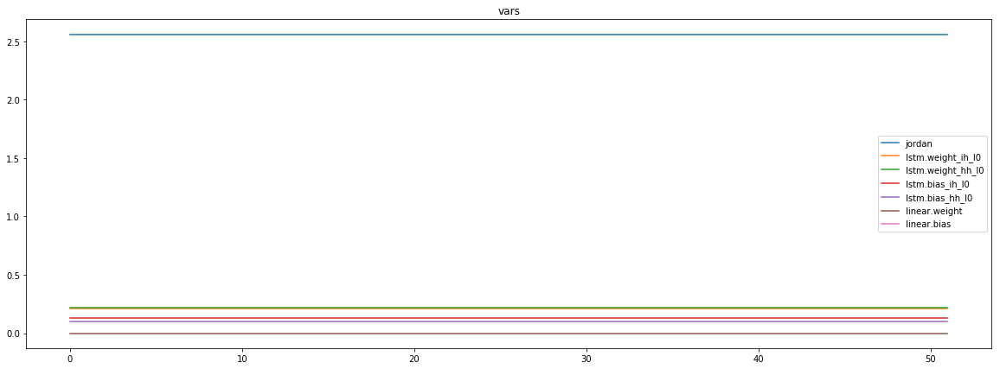

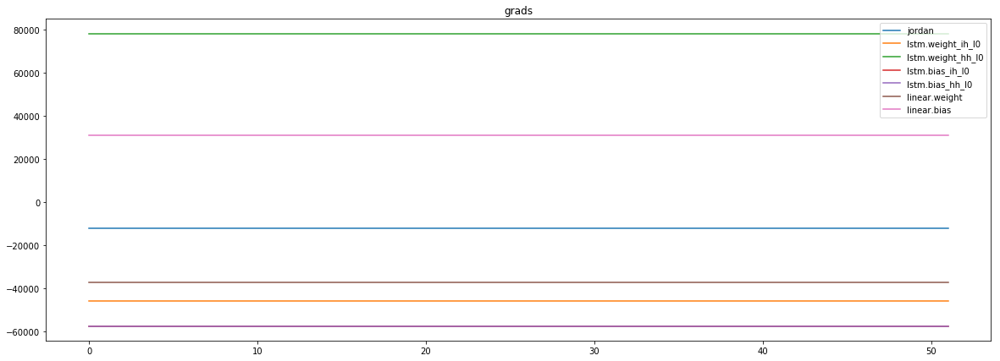

mean_p1 : -8386.9833984375
mean_p2 : -58017.328125
mean_p3 : 54510.81640625


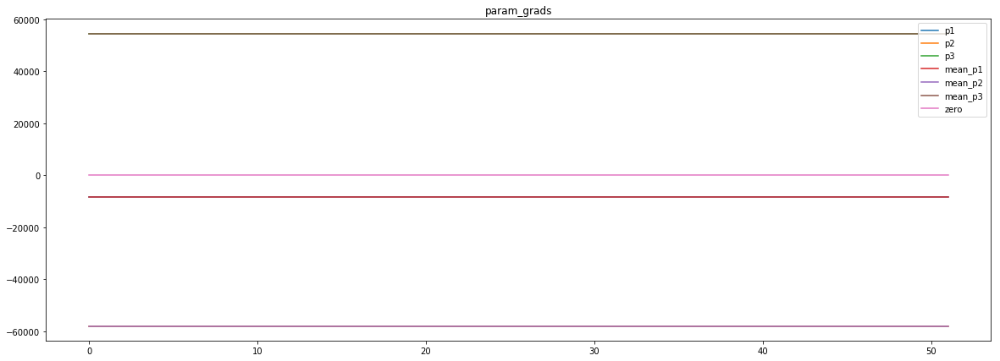

loss rate [-0.02927338674361124]
Epoch [47] 
     train_loss[6701.29780461238] 
     eval_train[4.620568223870718] 
     eval_test[4.631581444631923]



aux preds: -1.9142991304397583           0.9634115695953369           0.7533918023109436
main loss 7992.722036508413
aux loss 0.0
jord loss 0.0
combined loss 7992.722036508413 



Parameter containing:
tensor([[-1.9143,  0.9634,  0.7534]], requires_grad=True)


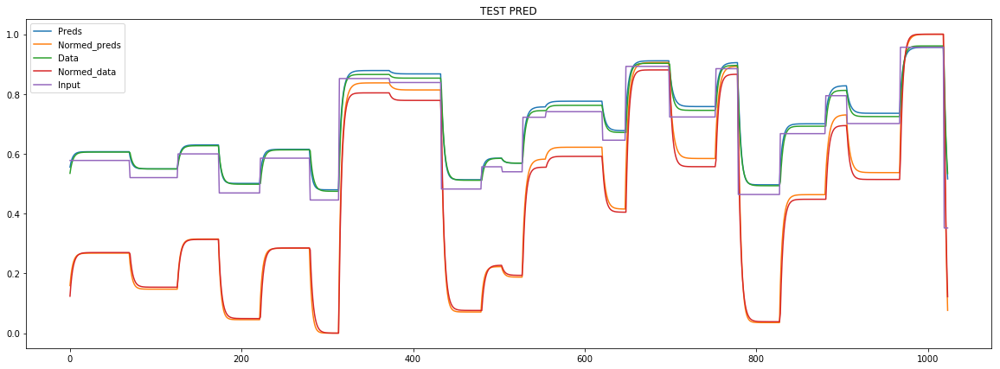

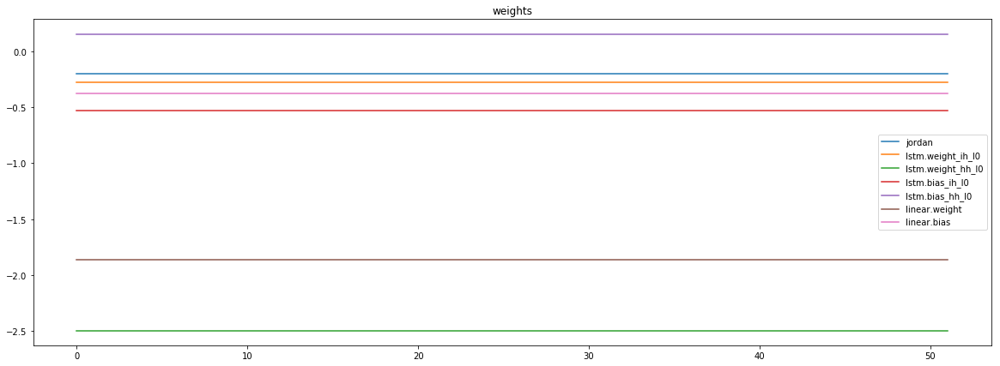

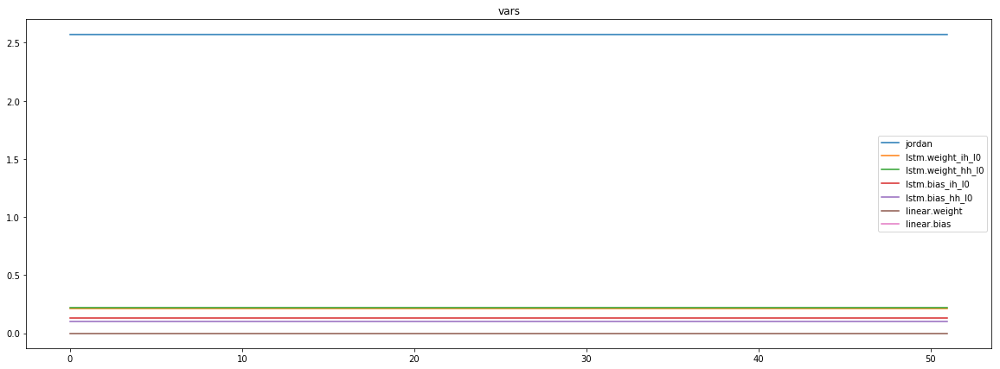

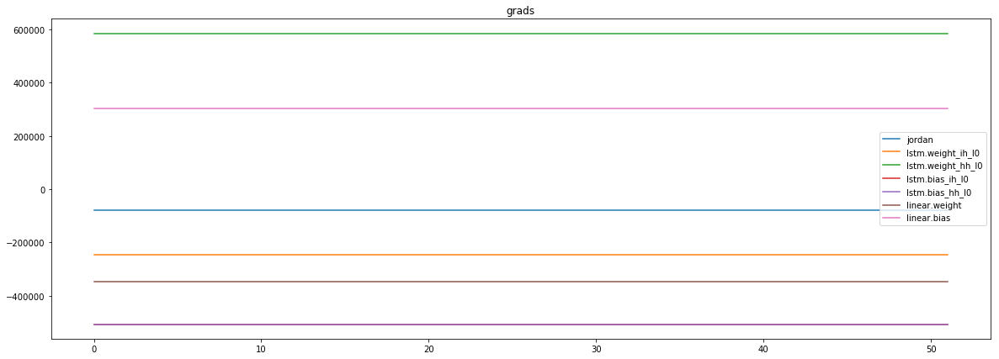

mean_p1 : -52905.88671875
mean_p2 : -456749.09375
mean_p3 : 429679.40625


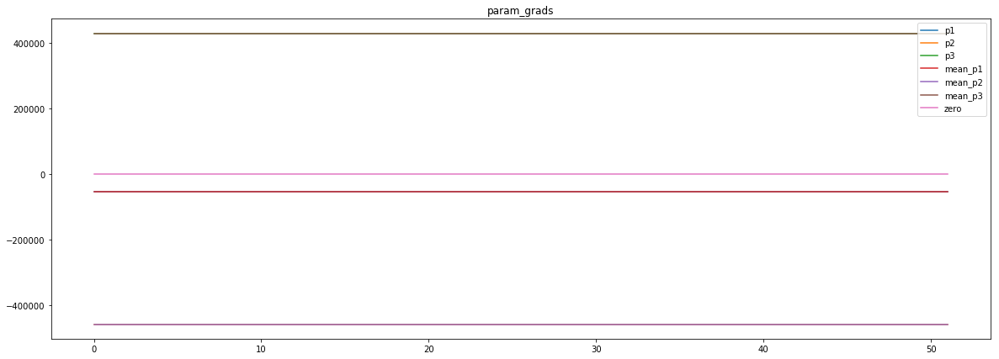

loss rate [-0.013365582529912157]
Epoch [48] 
     train_loss[7992.722036508413] 
     eval_train[4.613015437355408] 
     eval_test[4.5795512294227425]



aux preds: -1.9090514183044434           0.9681656360626221           0.7480553388595581
main loss 6401.67289851262
aux loss 0.0
jord loss 0.0
combined loss 6401.67289851262 



Parameter containing:
tensor([[-1.9091,  0.9682,  0.7481]], requires_grad=True)


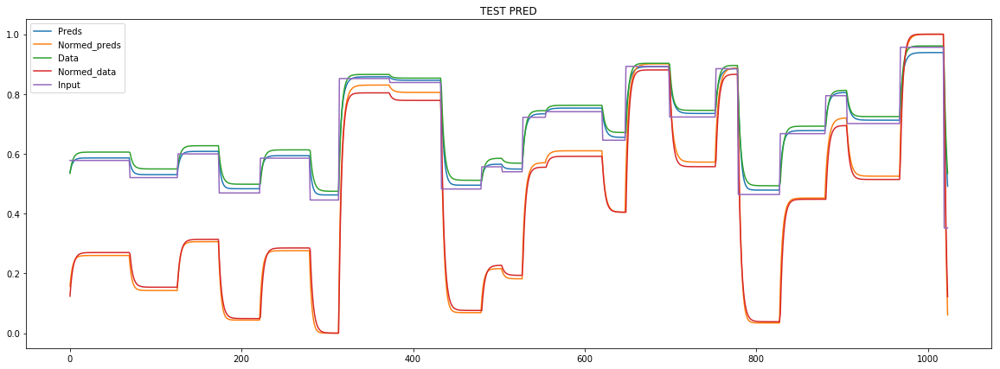

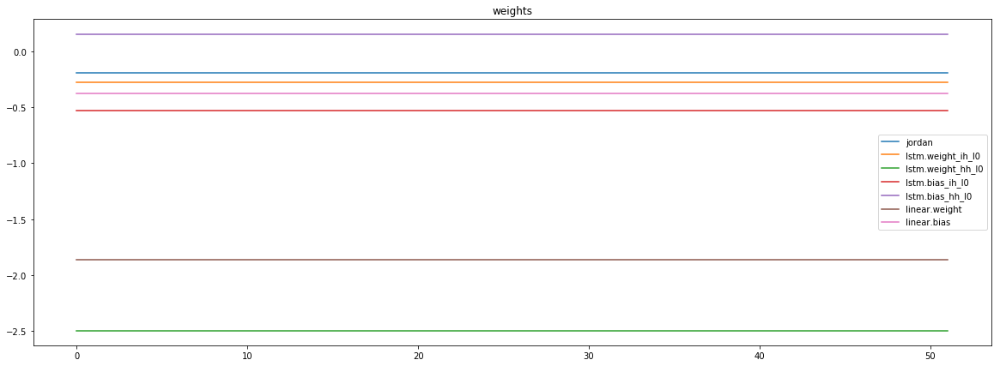

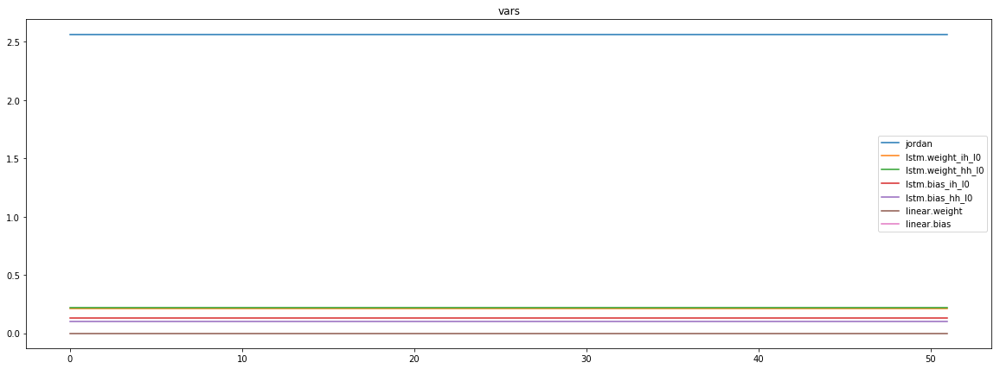

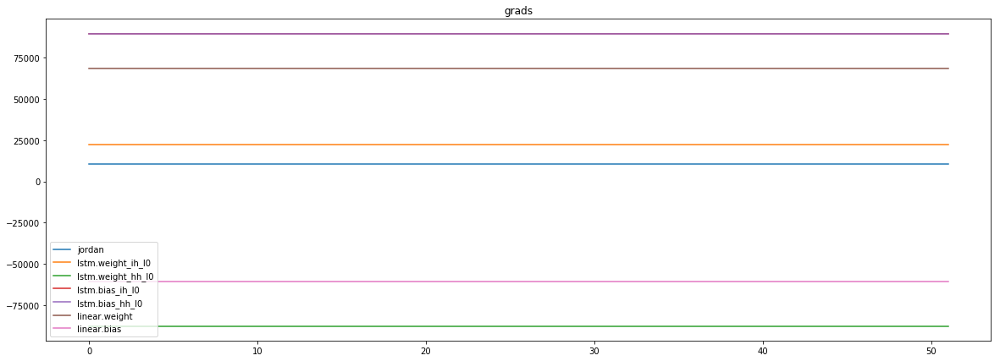

mean_p1 : 6526.5029296875
mean_p2 : 73225.515625
mean_p3 : -69089.359375


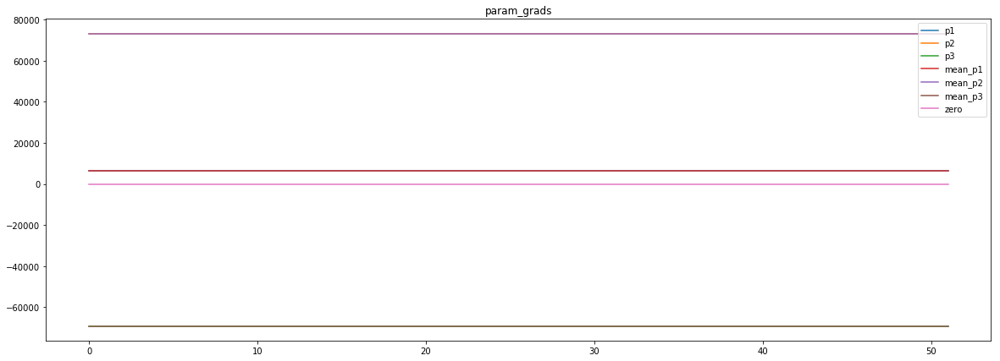

loss rate [-0.07653965213231717]
Epoch [49] 
     train_loss[6401.67289851262] 
     eval_train[4.877226526920612] 
     eval_test[4.899998954751275]



aux preds: -1.904683232307434           0.9638932347297668           0.7517908215522766
main loss 6668.249075082632
aux loss 0.0
jord loss 0.0
combined loss 6668.249075082632 



Parameter containing:
tensor([[-1.9047,  0.9639,  0.7518]], requires_grad=True)


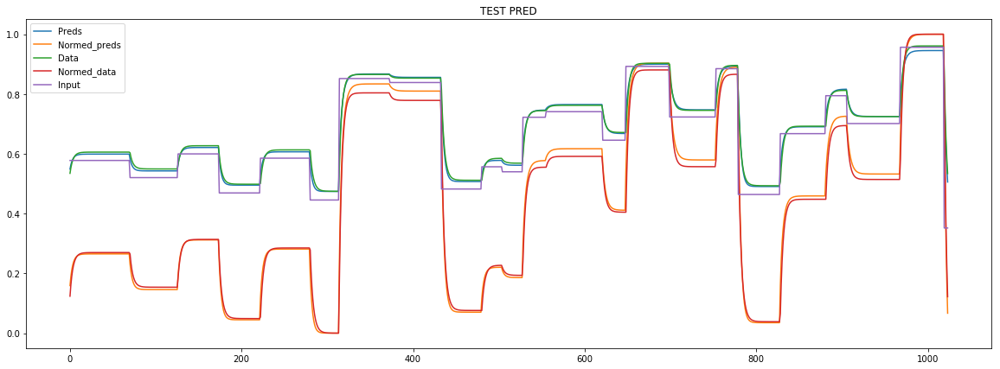

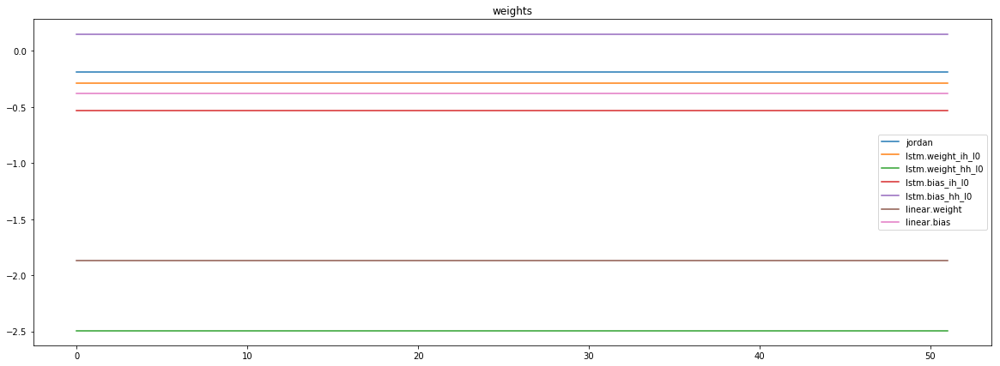

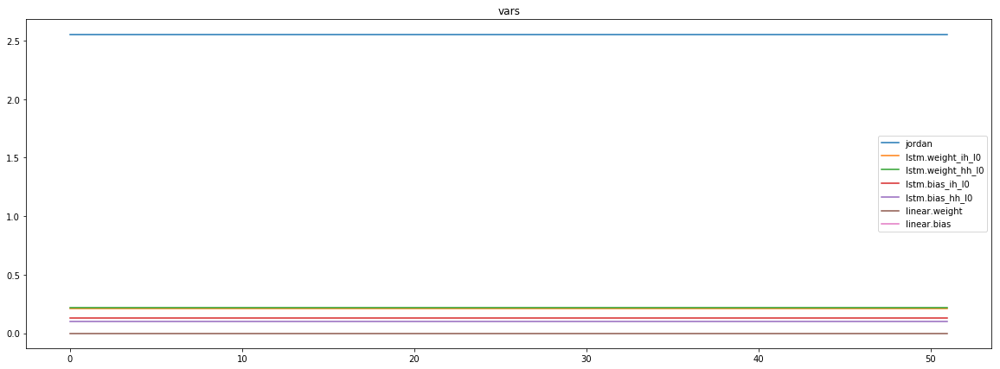

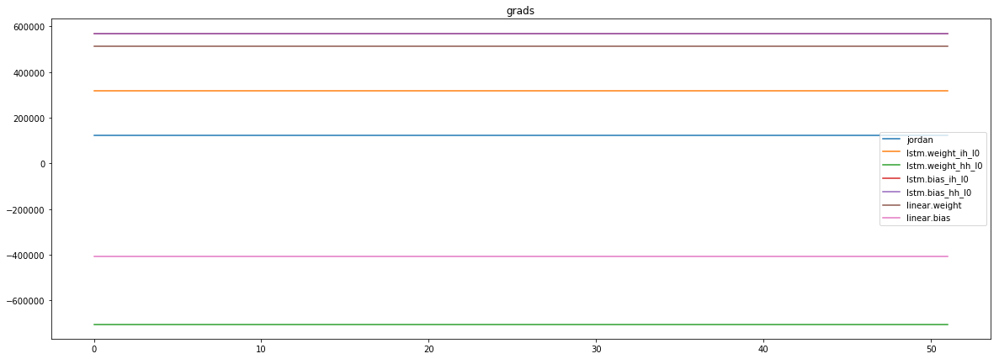

mean_p1 : 85160.09375
mean_p2 : 581390.625
mean_p3 : -545057.6875


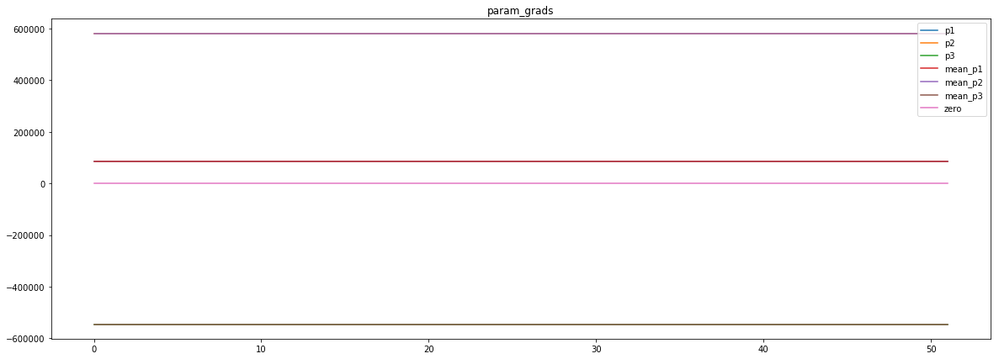

loss rate [0.06703615842421529]
Epoch [50] 
     train_loss[6668.249075082632] 
     eval_train[4.401159348396154] 
     eval_test[4.3883918577974494]



aux preds: -1.9028159379959106           0.9637618064880371           0.7513436079025269
main loss 6827.3579664963945
aux loss 0.0
jord loss 0.0
combined loss 6827.3579664963945 



Parameter containing:
tensor([[-1.9028,  0.9638,  0.7513]], requires_grad=True)


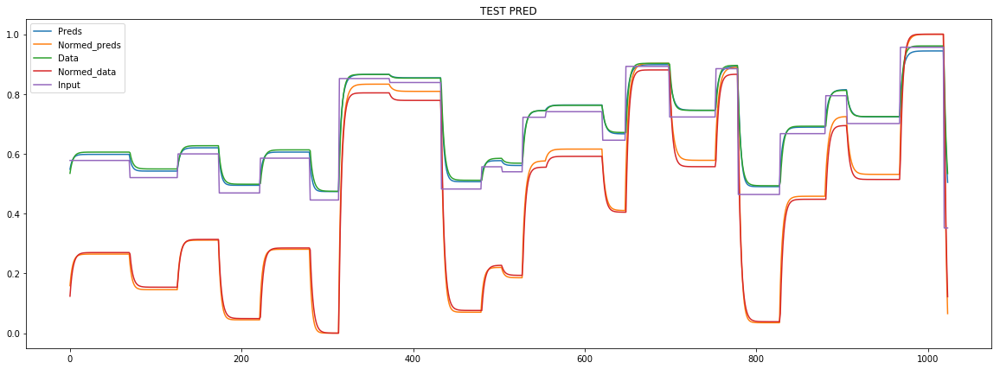

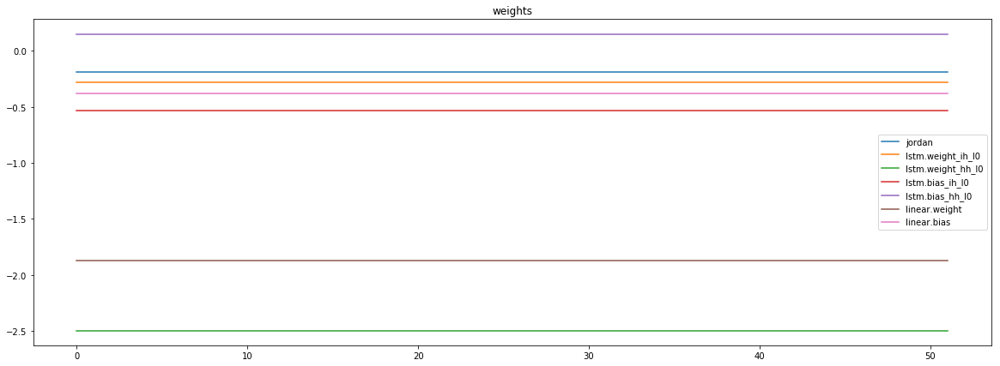

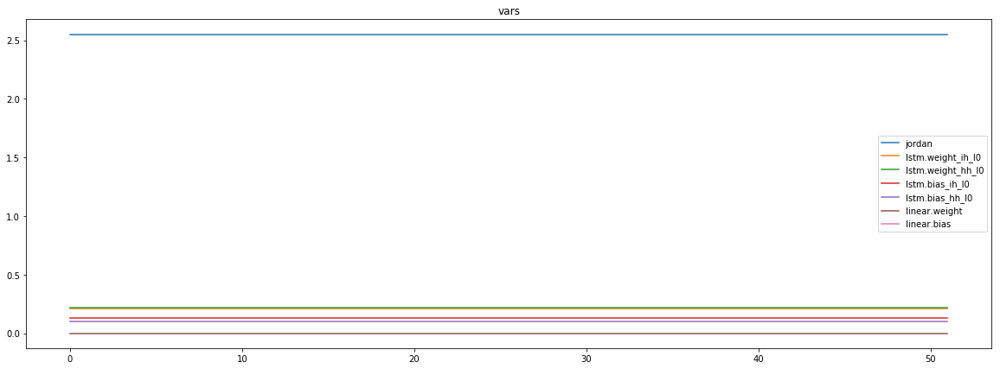

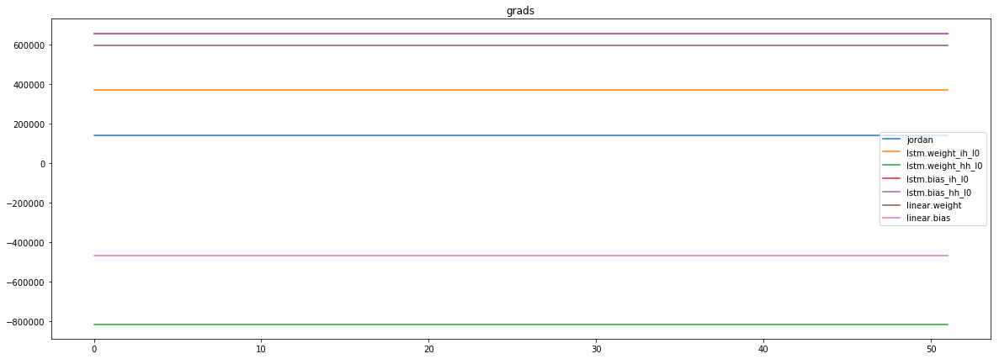

mean_p1 : 99133.125
mean_p2 : 671803.0625
mean_p3 : -629745.0625


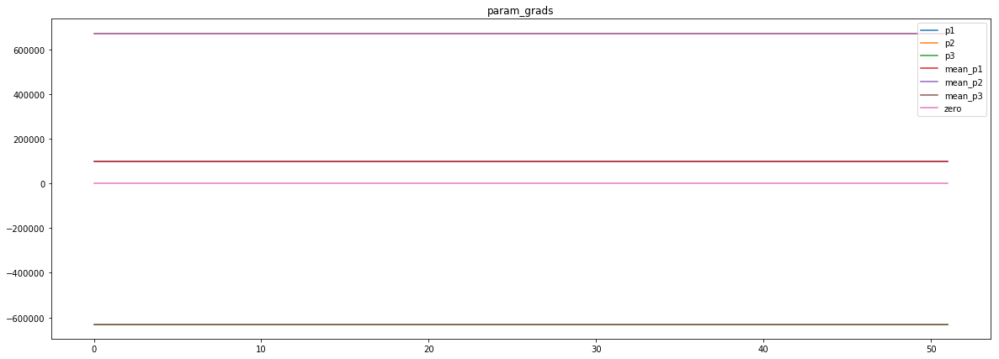

loss rate [0.04769206267816206]
Epoch [51] 
     train_loss[6827.3579664963945] 
     eval_train[4.412879015963811] 
     eval_test[4.402183760296214]



aux preds: -1.9020413160324097           0.9629741311073303           0.7515197992324829
main loss 6901.580683781551
aux loss 0.0
jord loss 0.0
combined loss 6901.580683781551 



Parameter containing:
tensor([[-1.9020,  0.9630,  0.7515]], requires_grad=True)


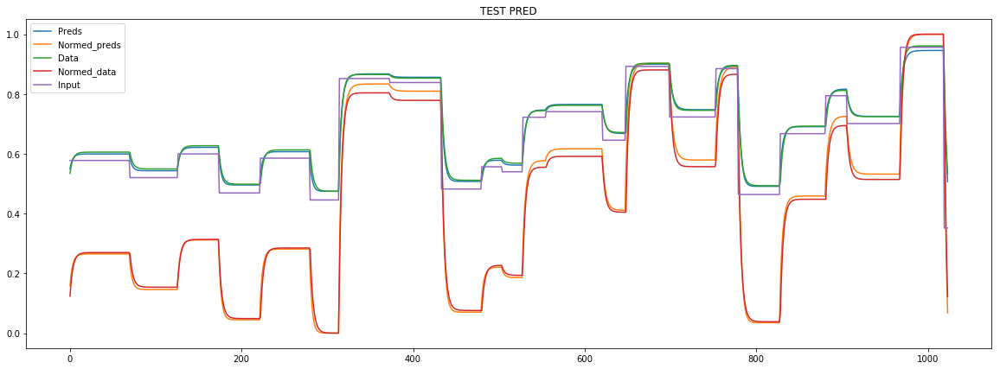

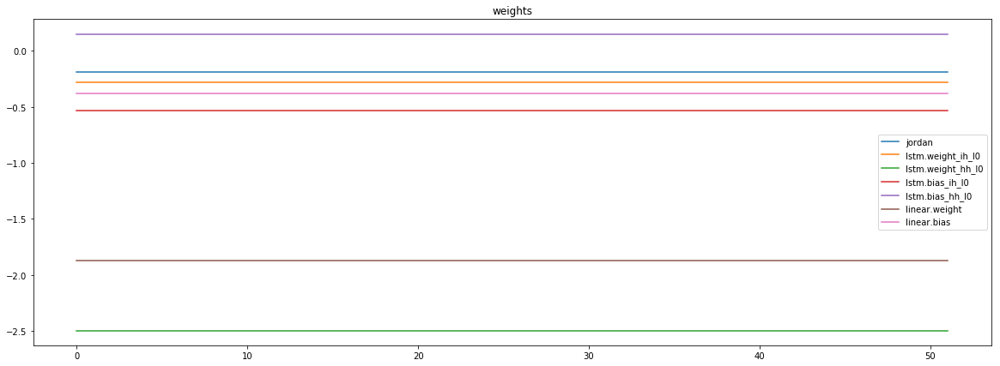

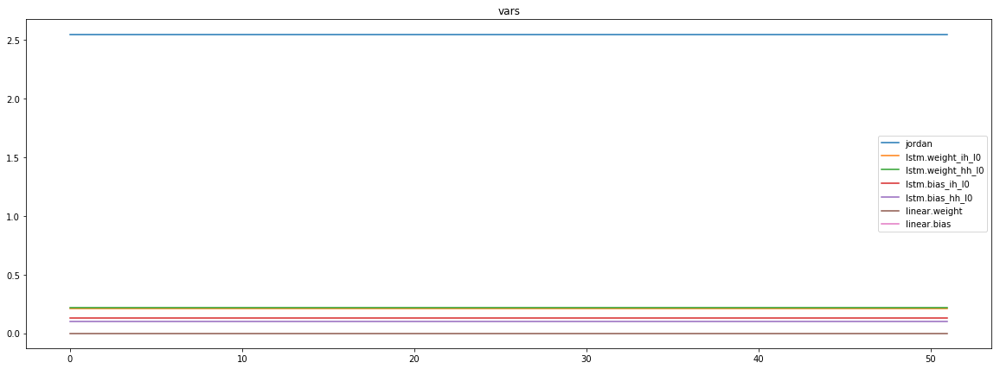

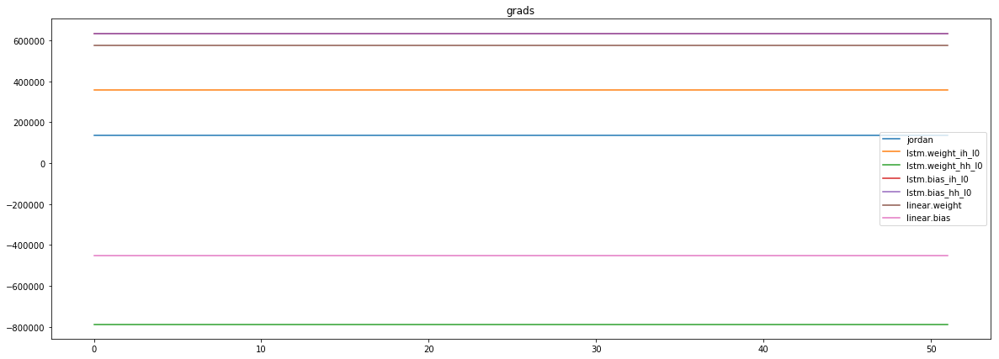

mean_p1 : 96263.421875
mean_p2 : 650752.3125
mean_p3 : -610074.4375


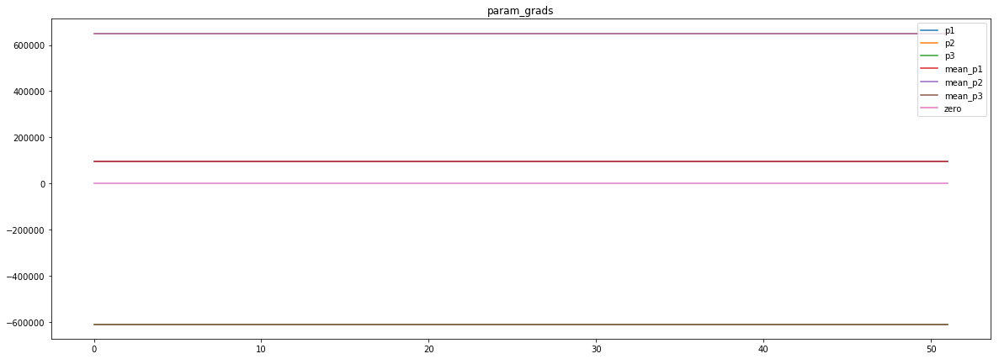

loss rate [0.04117450704308201]
Epoch [52] 
     train_loss[6901.580683781551] 
     eval_train[4.39055290646278] 
     eval_test[4.375623971223831]



aux preds: -1.8980321884155273           0.9644944071769714           0.7495014071464539
main loss 6818.974083533654
aux loss 0.0
jord loss 0.0
combined loss 6818.974083533654 



Parameter containing:
tensor([[-1.8980,  0.9645,  0.7495]], requires_grad=True)


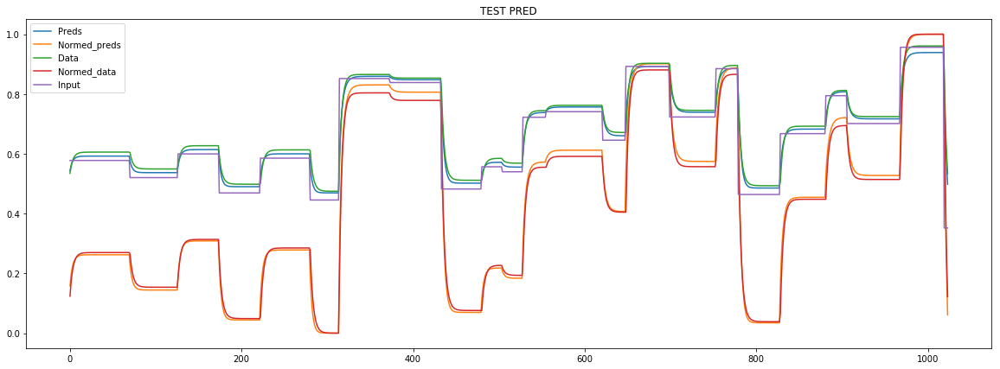

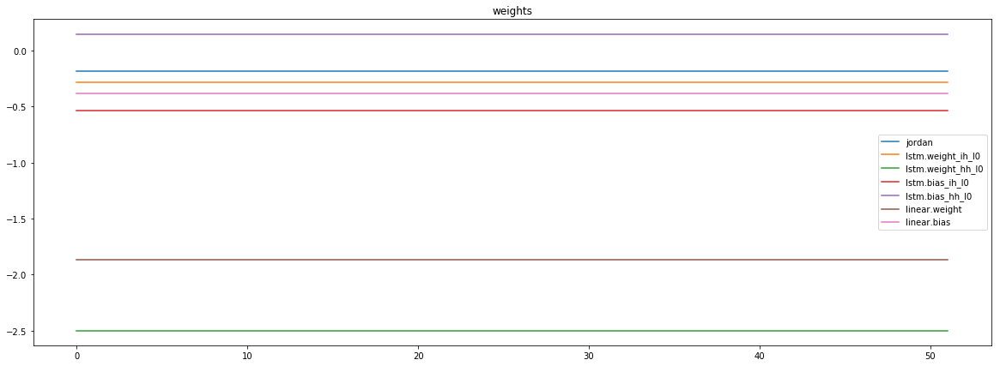

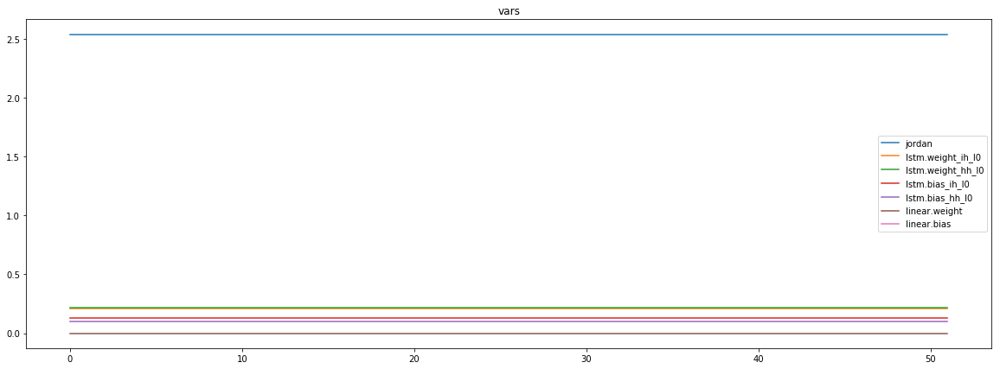

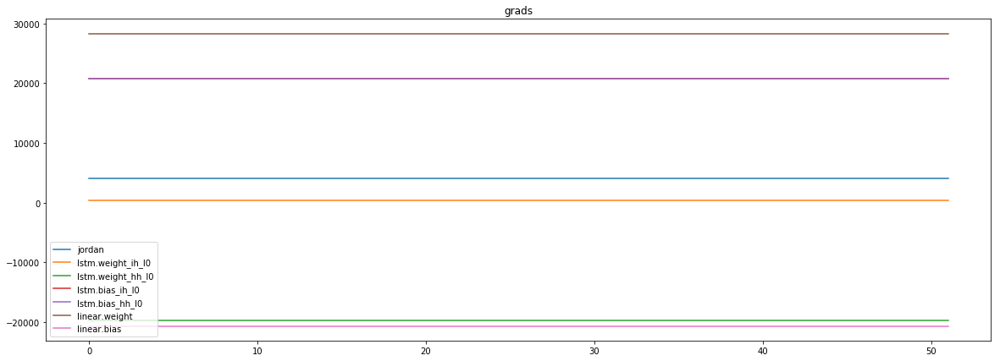

mean_p1 : 2751.6083984375
mean_p2 : 20500.927734375
mean_p3 : -19222.53125


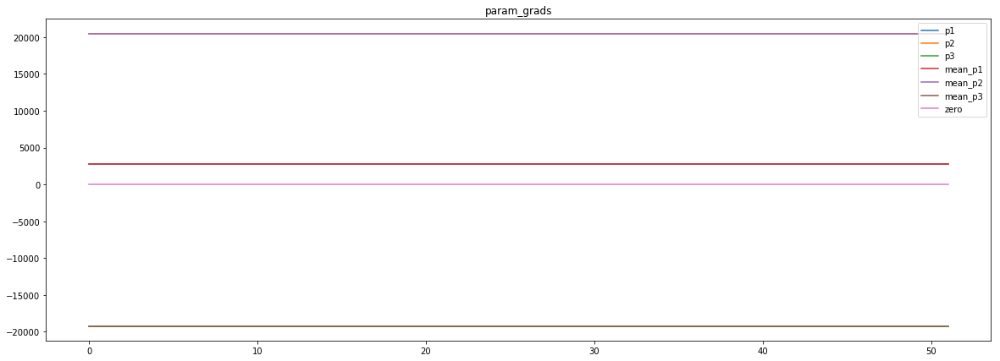

loss rate [-0.06098258363400699]
Epoch [53] 
     train_loss[6818.974083533654] 
     eval_train[4.645313152900108] 
     eval_test[4.656369485638359]



aux preds: -1.8978838920593262           0.9631574749946594           0.7501978278160095
main loss 6898.083336463342
aux loss 0.0
jord loss 0.0
combined loss 6898.083336463342 



Parameter containing:
tensor([[-1.8979,  0.9632,  0.7502]], requires_grad=True)


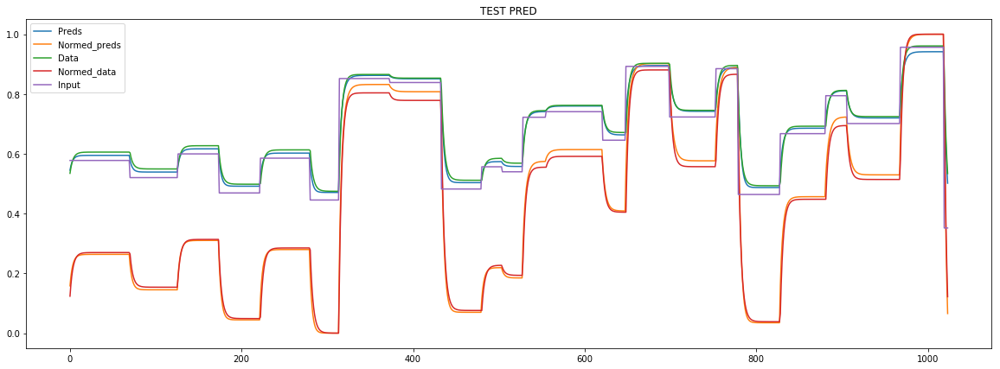

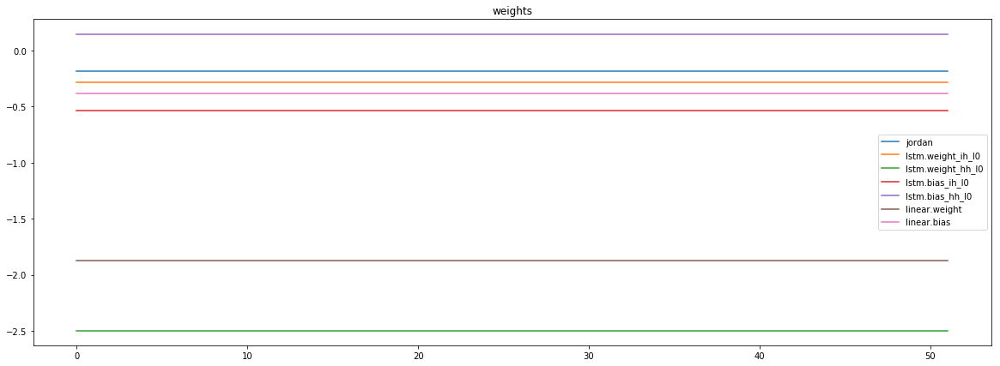

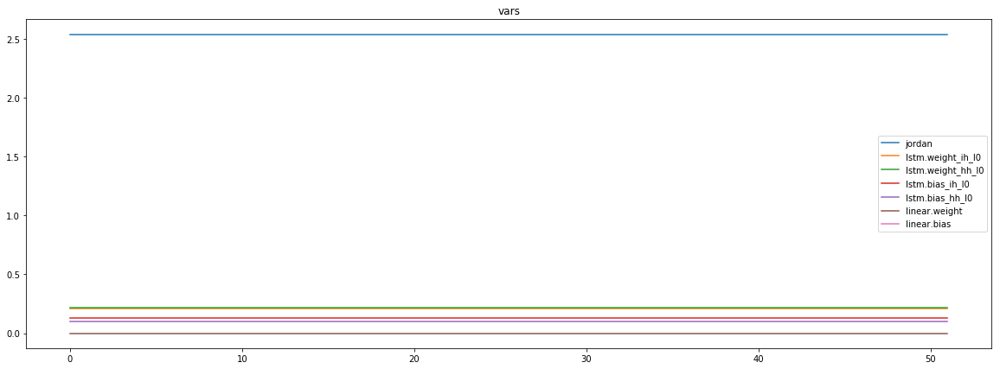

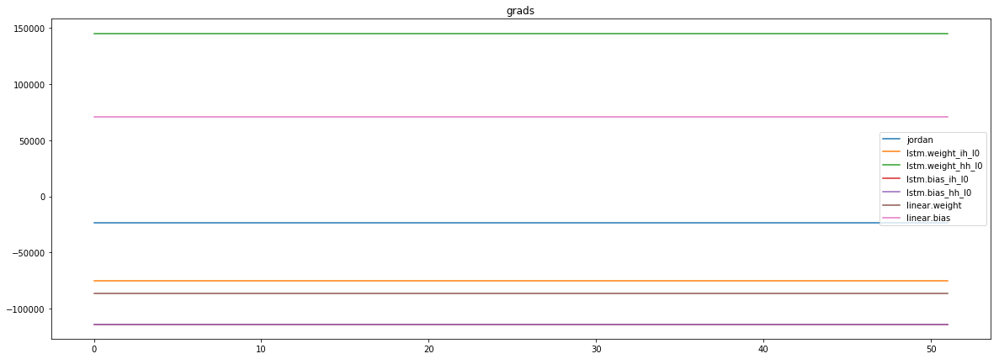

mean_p1 : -16389.76171875
mean_p2 : -114008.8203125
mean_p3 : 107103.4453125


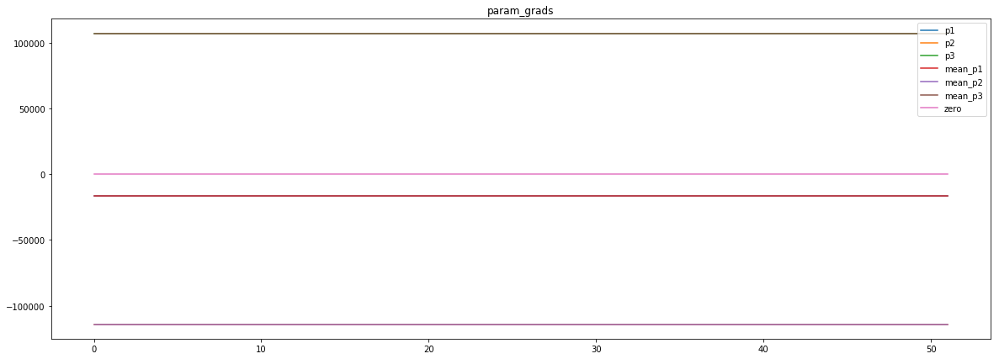

loss rate [-0.007340613033453236]
Epoch [54] 
     train_loss[6898.083336463342] 
     eval_train[4.507497338148264] 
     eval_test[4.510930771177465]



aux preds: -1.9064054489135742           0.9605139493942261           0.7521921396255493
main loss 7820.1322678786055
aux loss 0.0
jord loss 0.0
combined loss 7820.1322678786055 



Parameter containing:
tensor([[-1.9064,  0.9605,  0.7522]], requires_grad=True)


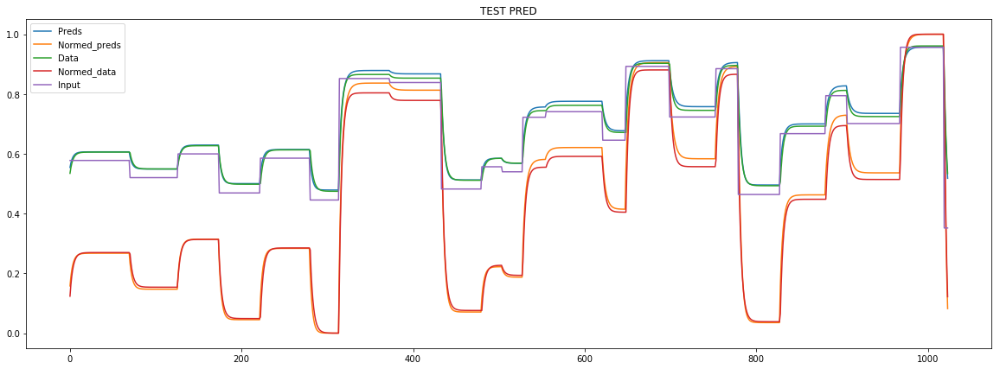

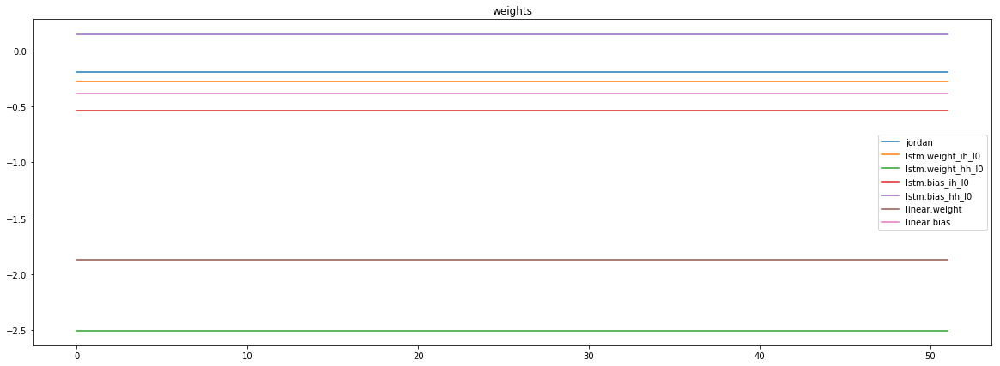

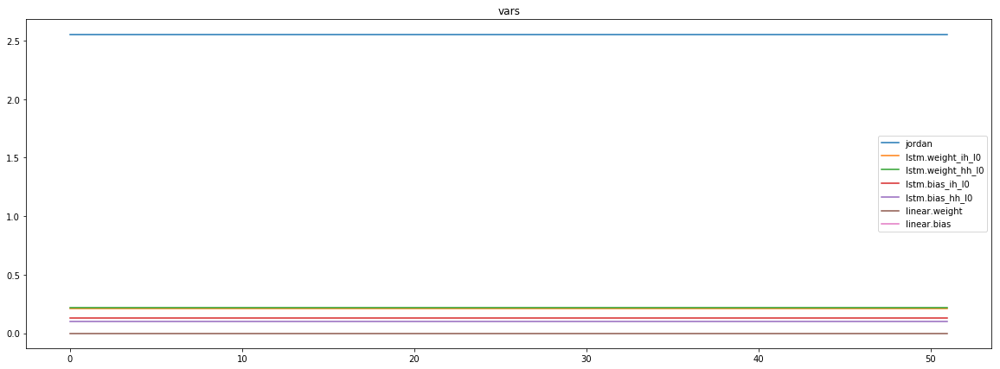

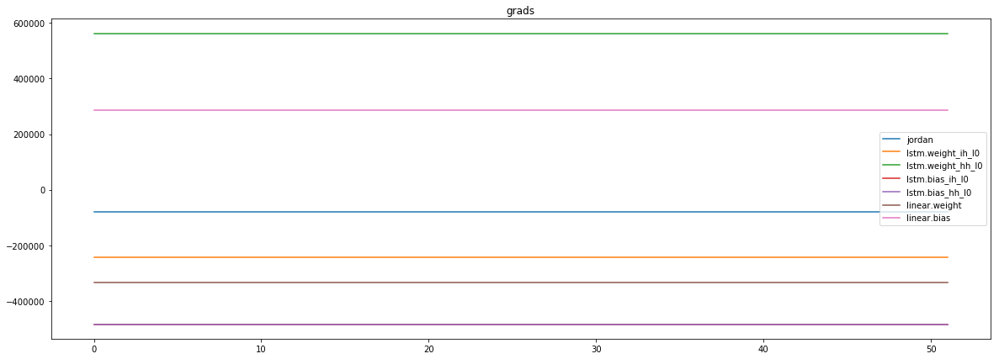

mean_p1 : -52760.87109375
mean_p2 : -441847.0625
mean_p3 : 415641.1875


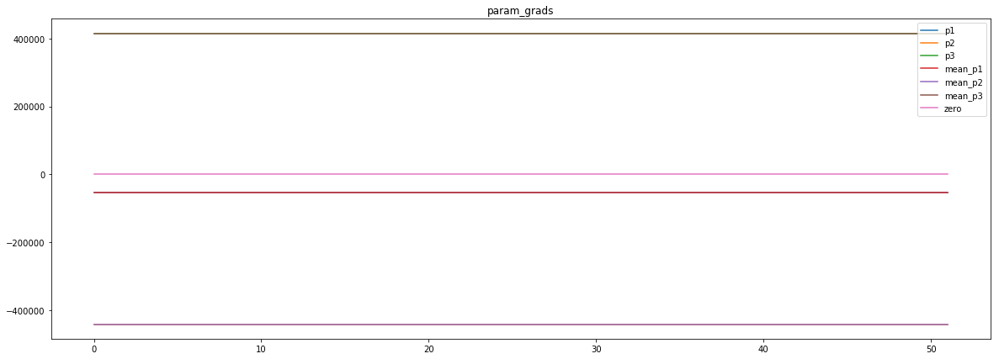

loss rate [-0.004312606906562211]
Epoch [55] 
     train_loss[7820.1322678786055] 
     eval_train[4.564378308562132] 
     eval_test[4.533776512200182]



aux preds: -1.8980356454849243           0.9623280167579651           0.7498631477355957
main loss 6732.9654541015625
aux loss 0.0
jord loss 0.0
combined loss 6732.9654541015625 



Parameter containing:
tensor([[-1.8980,  0.9623,  0.7499]], requires_grad=True)


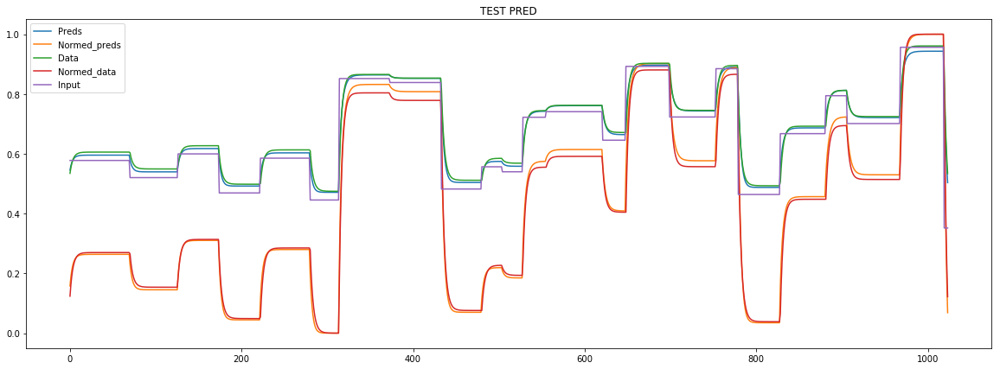

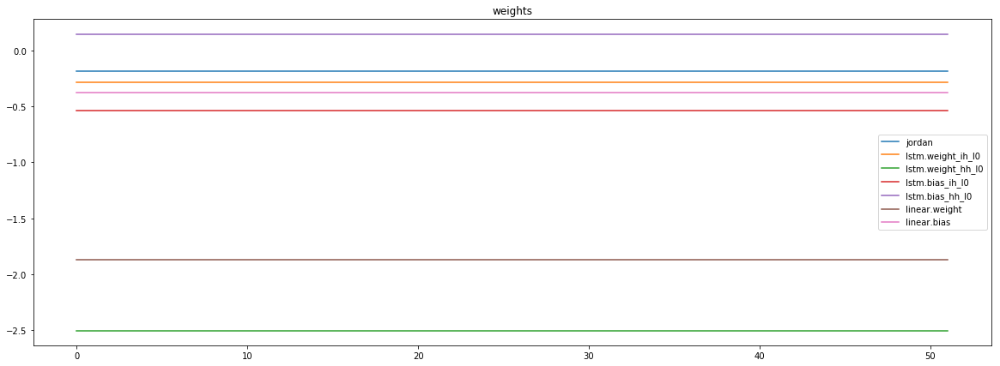

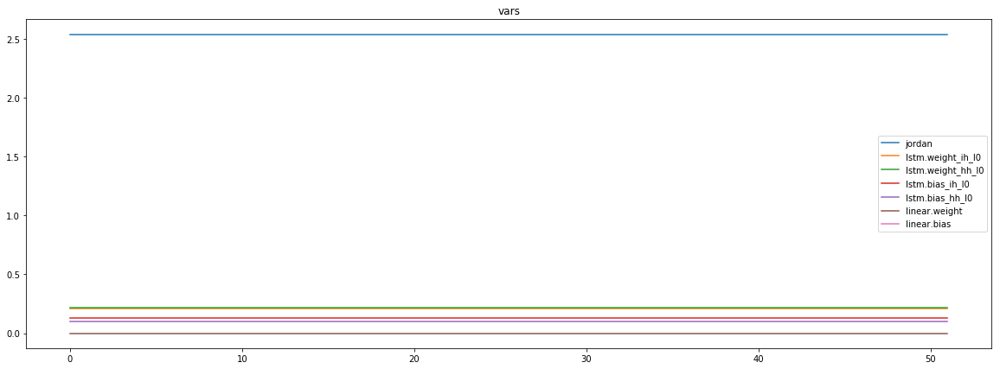

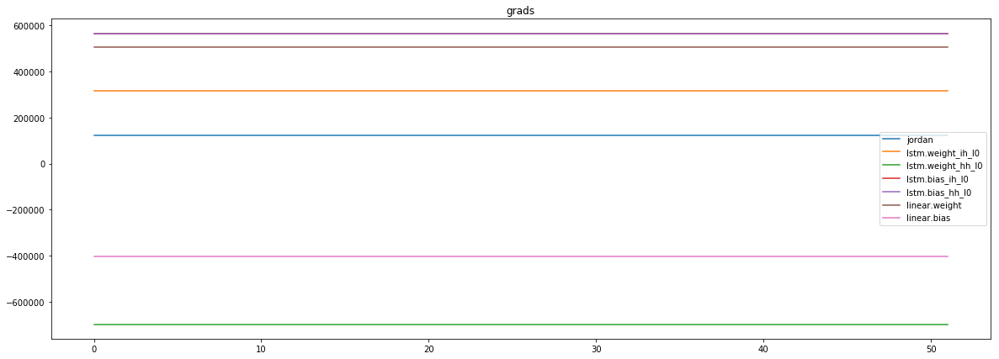

mean_p1 : 85427.09375
mean_p2 : 578365.4375
mean_p3 : -542346.4375


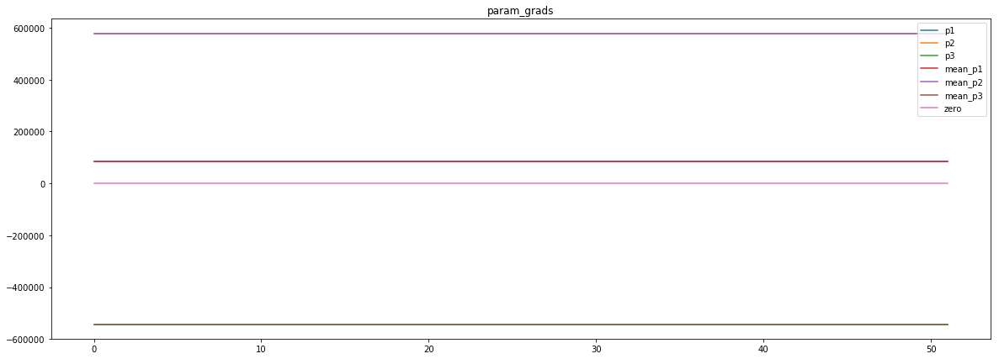

loss rate [0.025168595333399546]
Epoch [56] 
     train_loss[6732.9654541015625] 
     eval_train[4.451073878659652] 
     eval_test[4.452079970728267]



aux preds: -1.9028120040893555           0.9597948789596558           0.7518447041511536
main loss 7531.40629695012
aux loss 0.0
jord loss 0.0
combined loss 7531.40629695012 



Parameter containing:
tensor([[-1.9028,  0.9598,  0.7518]], requires_grad=True)


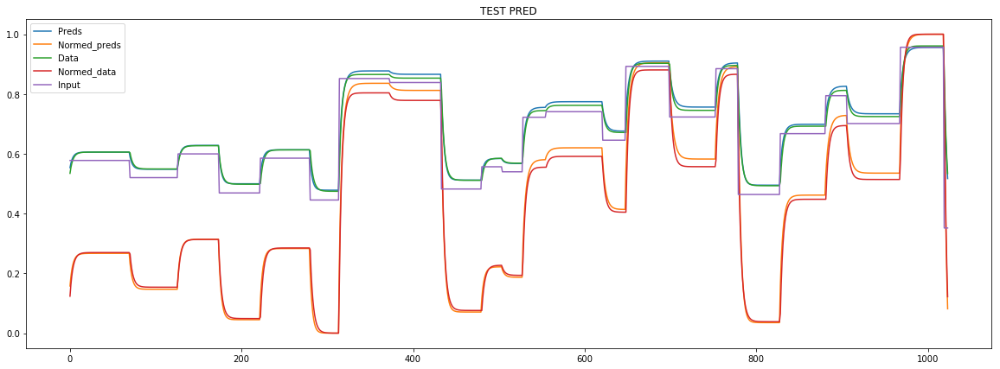

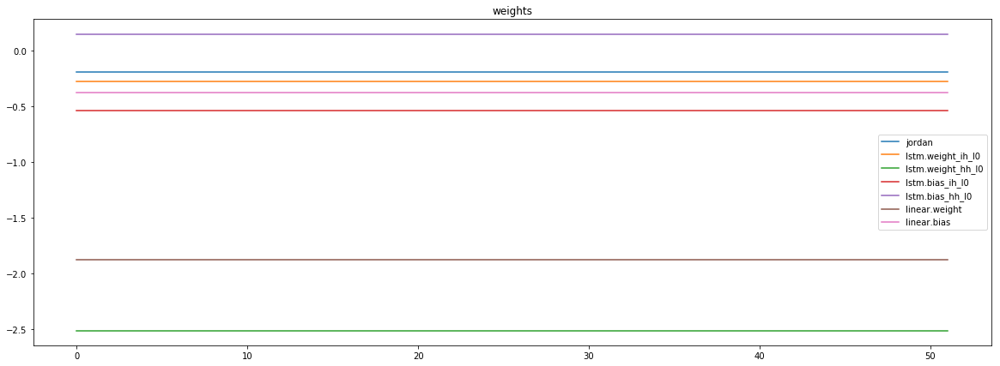

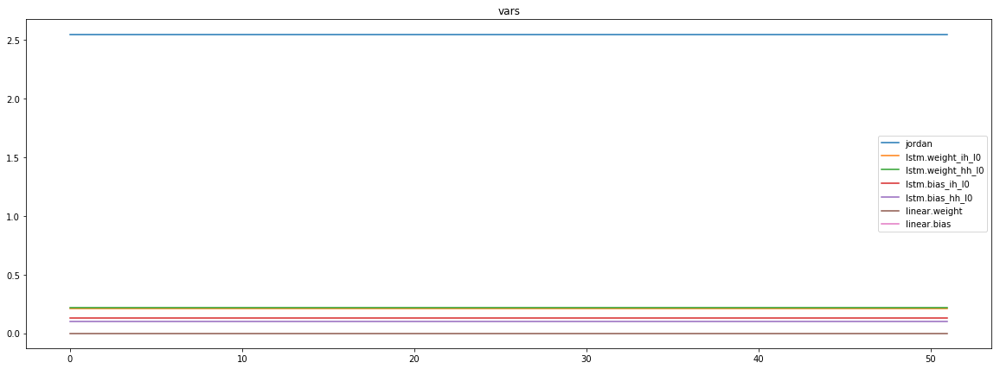

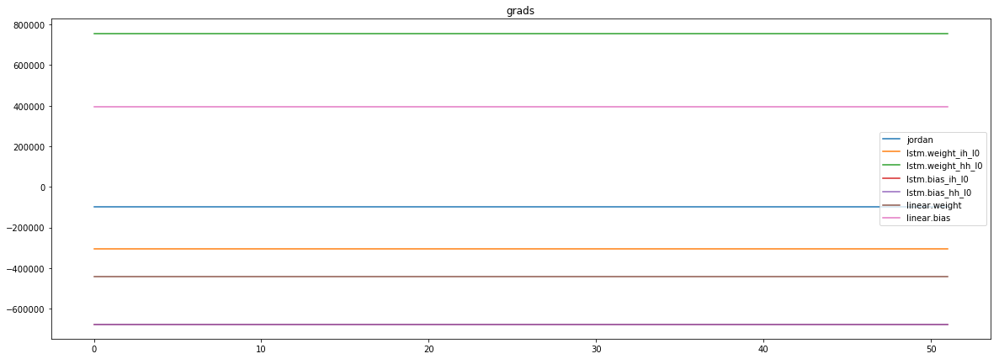

mean_p1 : -64728.515625
mean_p2 : -592808.25
mean_p3 : 558124.0


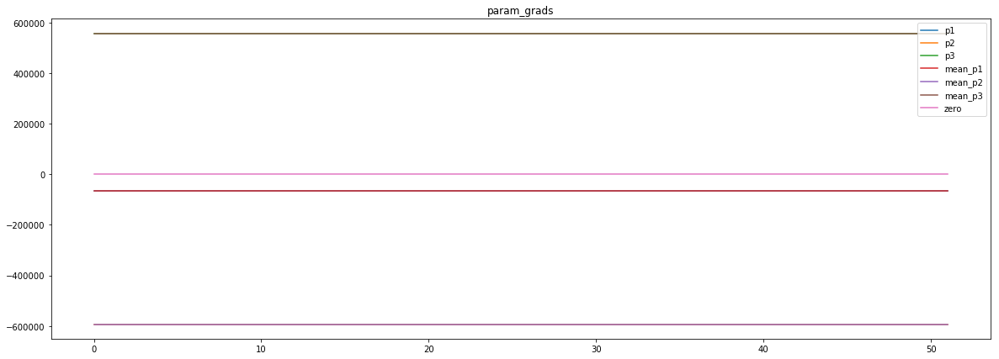

loss rate [0.00408612756894422]
Epoch [57] 
     train_loss[7531.40629695012] 
     eval_train[4.511194577010778] 
     eval_test[4.480545886538246]



aux preds: -1.8951478004455566           0.9604828953742981           0.750743567943573
main loss 6147.917311448317
aux loss 0.0
jord loss 0.0
combined loss 6147.917311448317 



Parameter containing:
tensor([[-1.8951,  0.9605,  0.7507]], requires_grad=True)


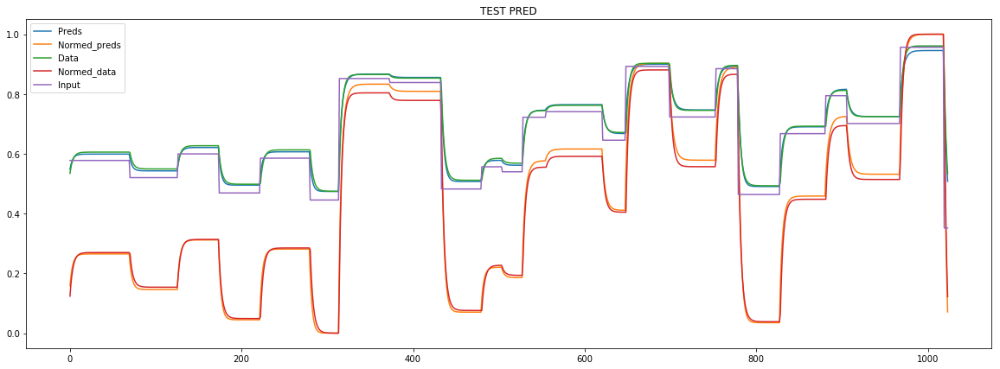

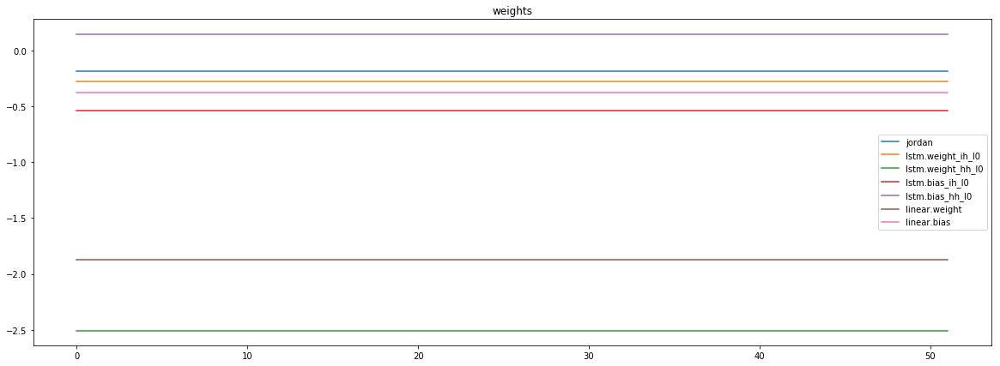

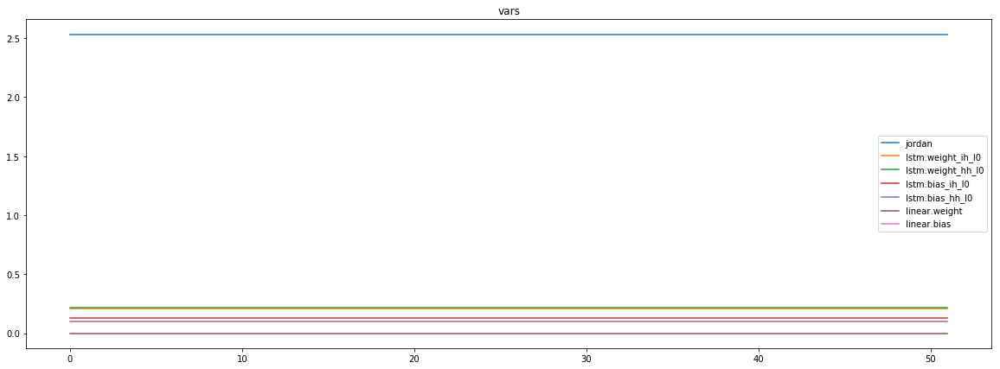

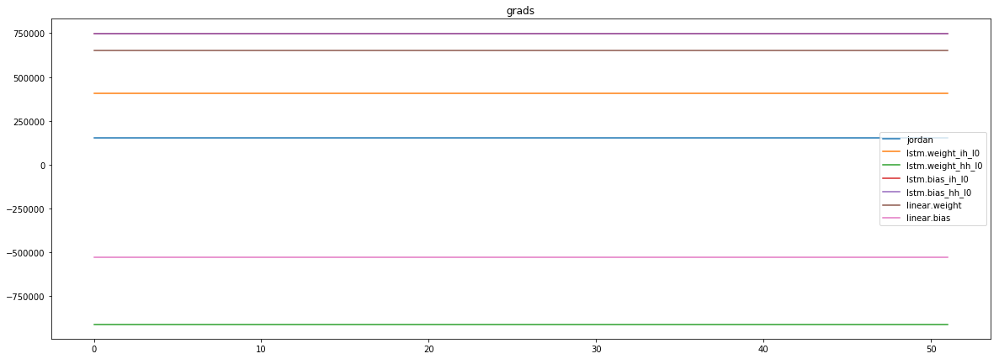

mean_p1 : 108342.203125
mean_p2 : 752028.5
mean_p3 : -705412.375


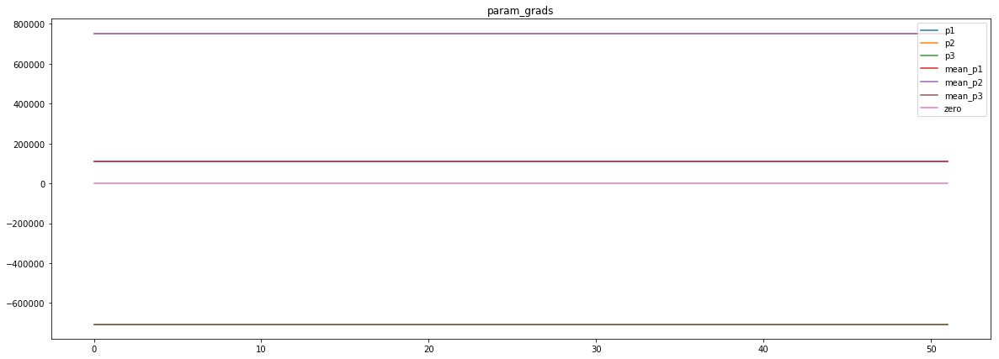

loss rate [0.028903453479151353]
Epoch [58] 
     train_loss[6147.917311448317] 
     eval_train[4.370472605411823] 
     eval_test[4.359058945016427]



aux preds: -1.8929965496063232           0.9610248804092407           0.7497315406799316
main loss 6290.6625741811895
aux loss 0.0
jord loss 0.0
combined loss 6290.6625741811895 



Parameter containing:
tensor([[-1.8930,  0.9610,  0.7497]], requires_grad=True)


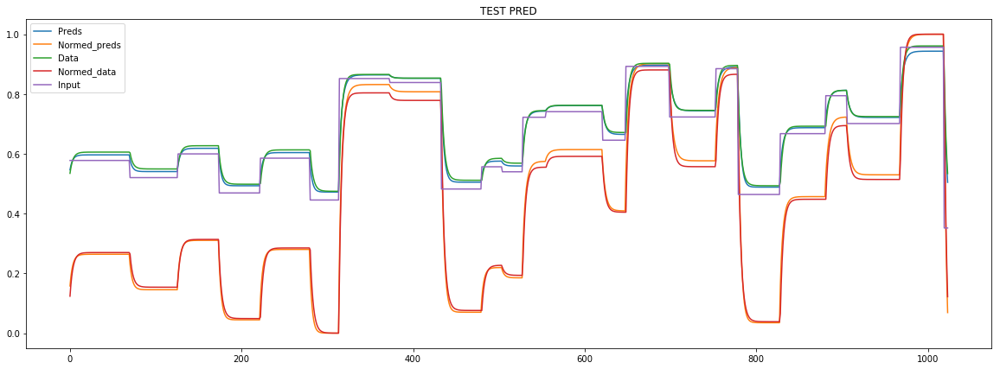

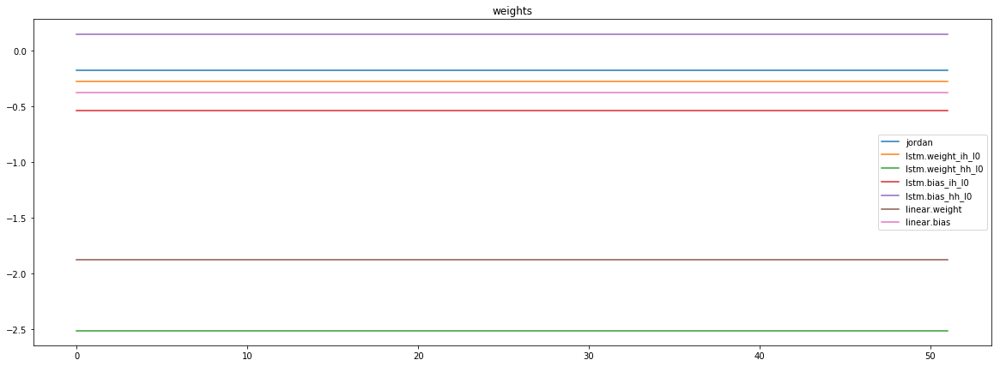

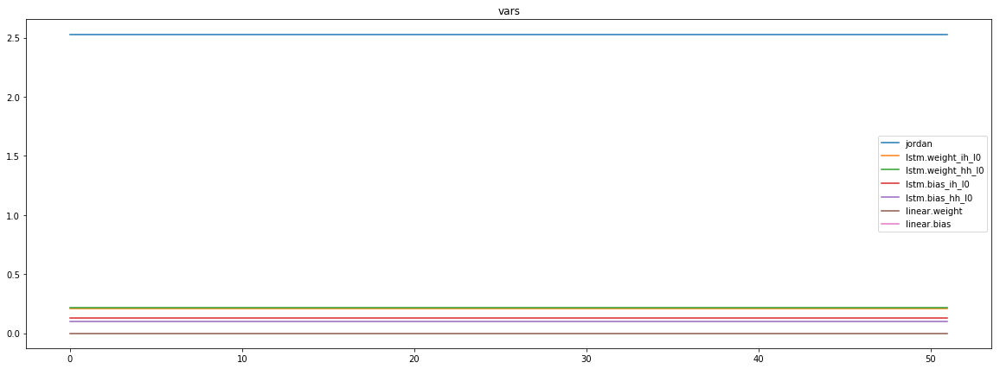

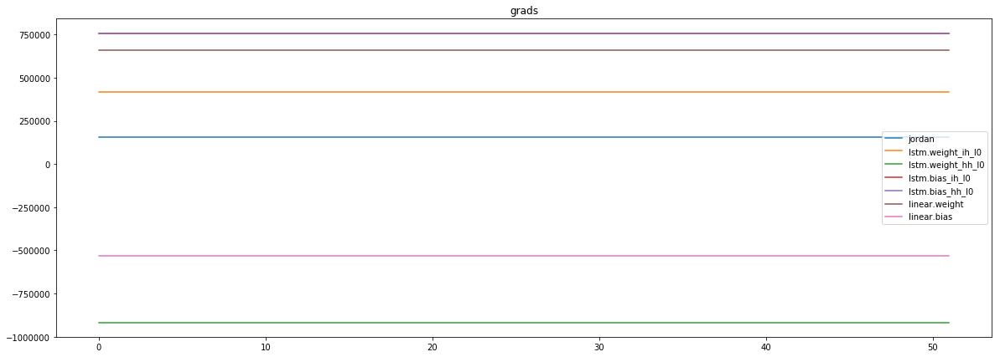

mean_p1 : 109144.78125
mean_p2 : 759317.625
mean_p3 : -712398.3125


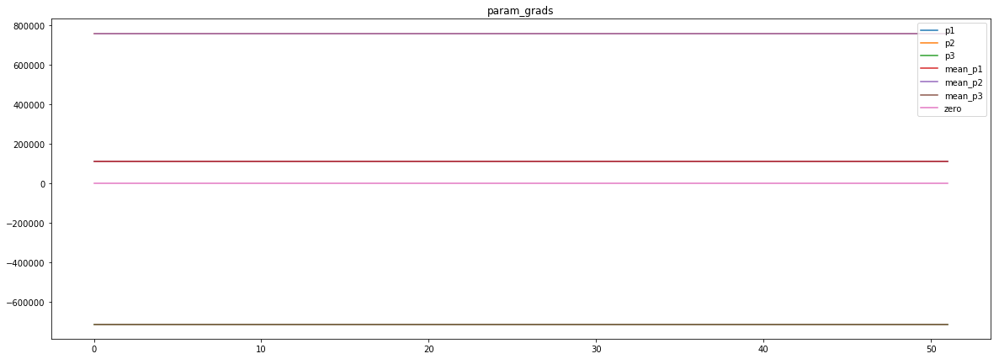

loss rate [0.002257010146256122]
Epoch [59] 
     train_loss[6290.6625741811895] 
     eval_train[4.422739522388348] 
     eval_test[4.4205617782744495]



aux preds: -1.8932353258132935           0.9613211750984192           0.7489140033721924
main loss 6192.62827711839
aux loss 0.0
jord loss 0.0
combined loss 6192.62827711839 



Parameter containing:
tensor([[-1.8932,  0.9613,  0.7489]], requires_grad=True)


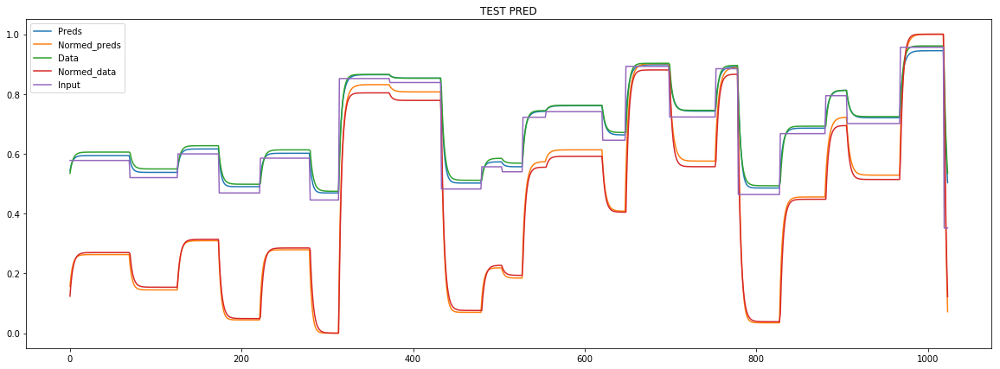

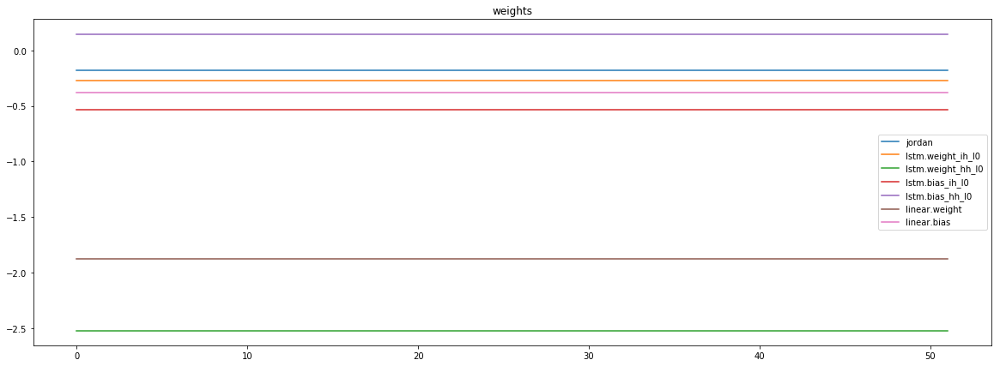

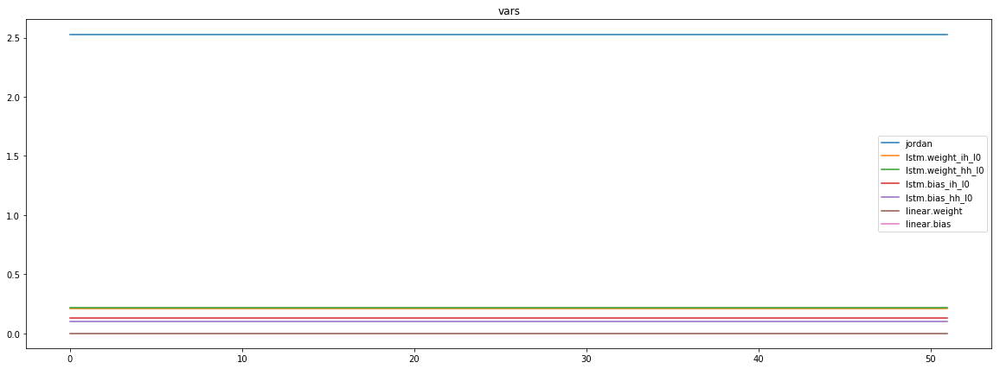

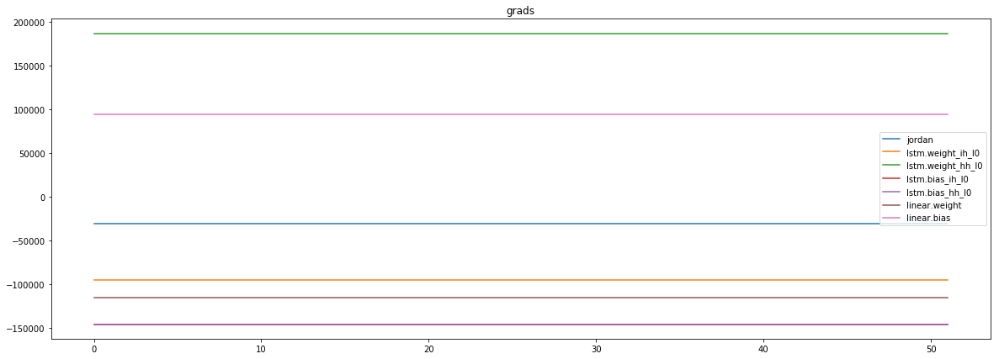

mean_p1 : -22157.107421875
mean_p2 : -148983.015625
mean_p3 : 139947.328125


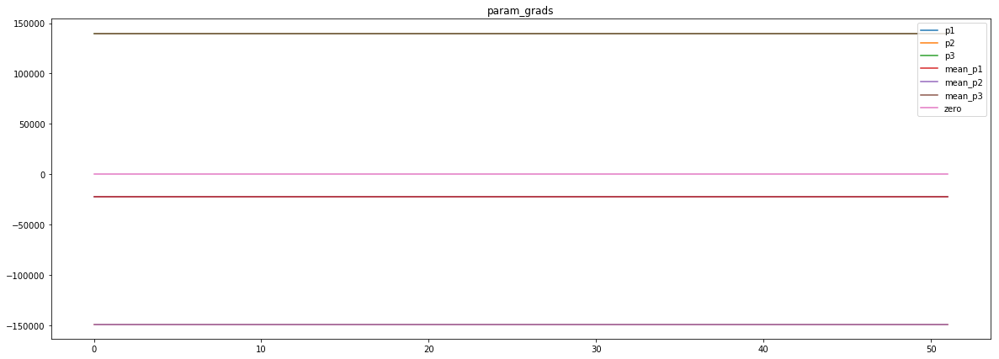

loss rate [-0.007979523455480031]
Epoch [60] 
     train_loss[6192.62827711839] 
     eval_train[4.448757087955109] 
     eval_test[4.455325473438609]



aux preds: -1.8903151750564575           0.9615545272827148           0.7481862902641296
main loss 6228.156381460337
aux loss 0.0
jord loss 0.0
combined loss 6228.156381460337 



Parameter containing:
tensor([[-1.8903,  0.9616,  0.7482]], requires_grad=True)


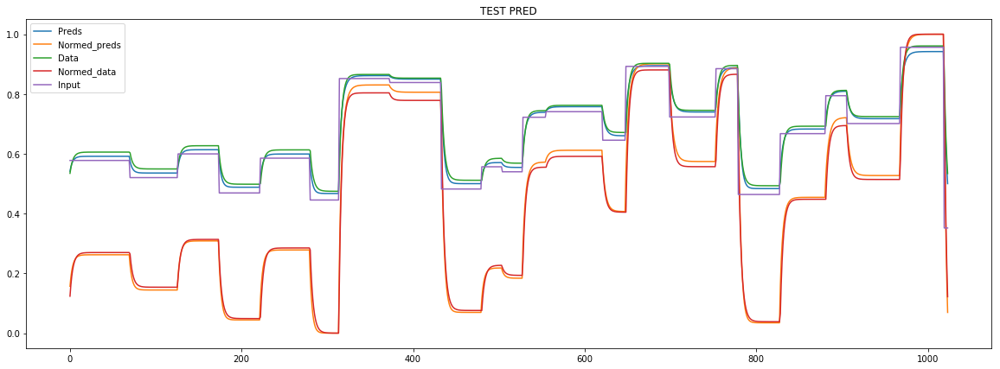

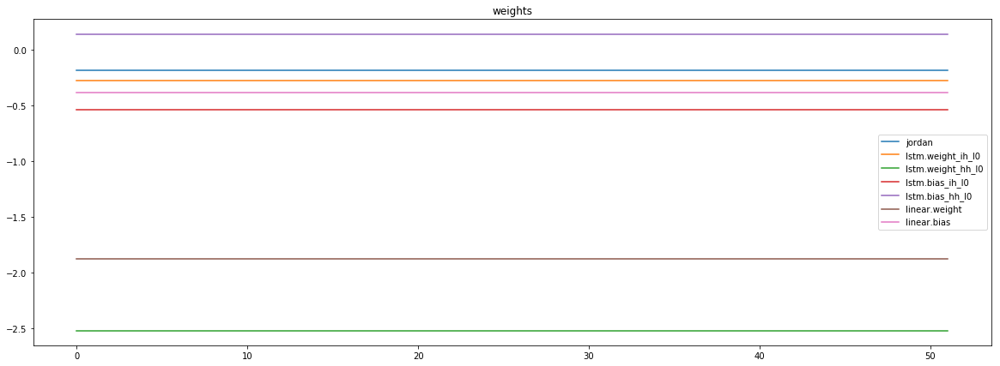

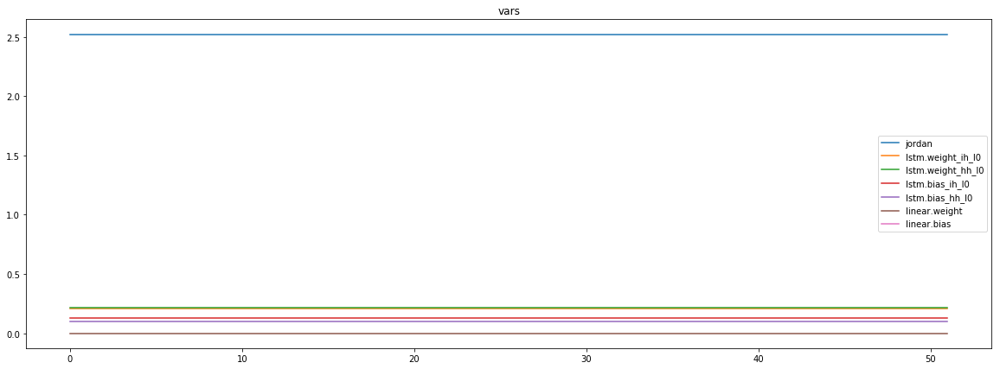

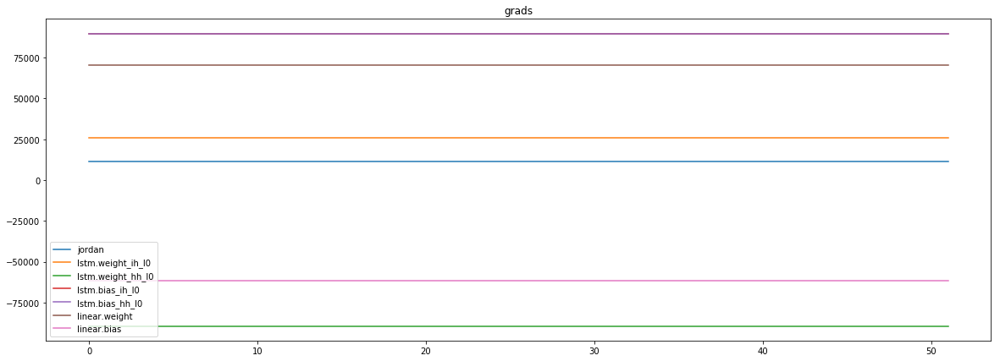

mean_p1 : 7413.2158203125
mean_p2 : 75402.75
mean_p3 : -71212.6484375


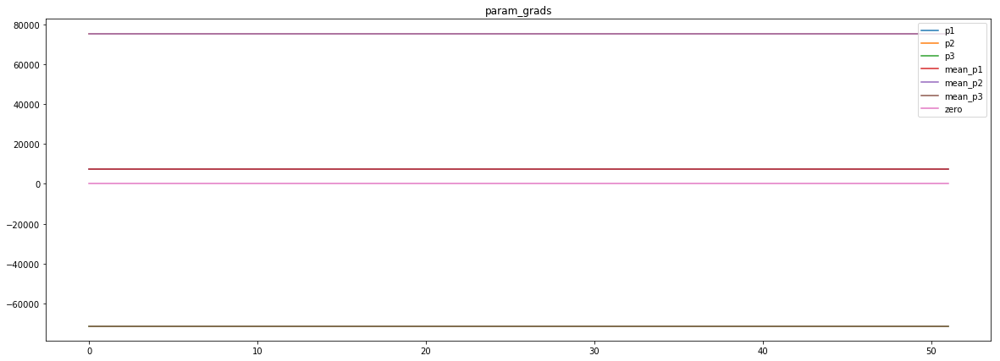

loss rate [-0.04117619724498622]
Epoch [61] 
     train_loss[6228.156381460337] 
     eval_train[4.5789456986463986] 
     eval_test[4.5933036506175995]



aux preds: -1.8863202333450317           0.9602134823799133           0.749038577079773
main loss 6049.917649489183
aux loss 0.0
jord loss 0.0
combined loss 6049.917649489183 



Parameter containing:
tensor([[-1.8863,  0.9602,  0.7490]], requires_grad=True)


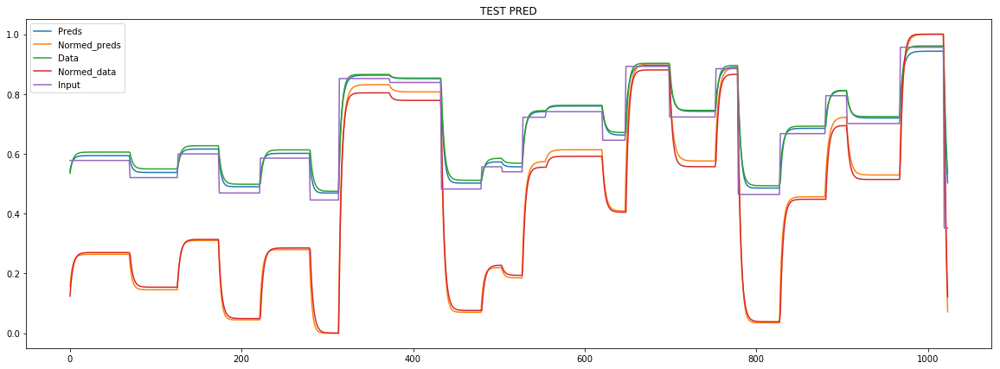

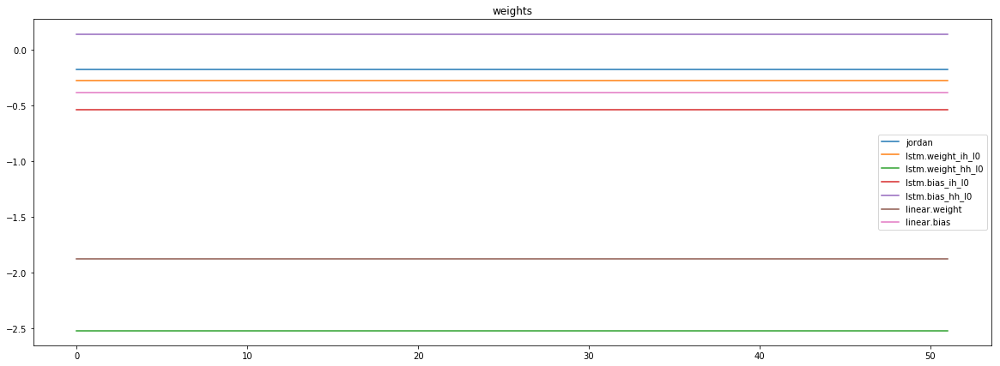

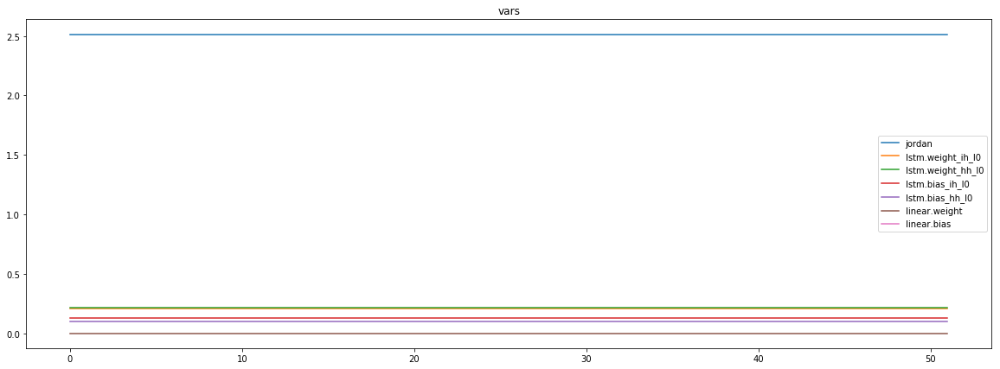

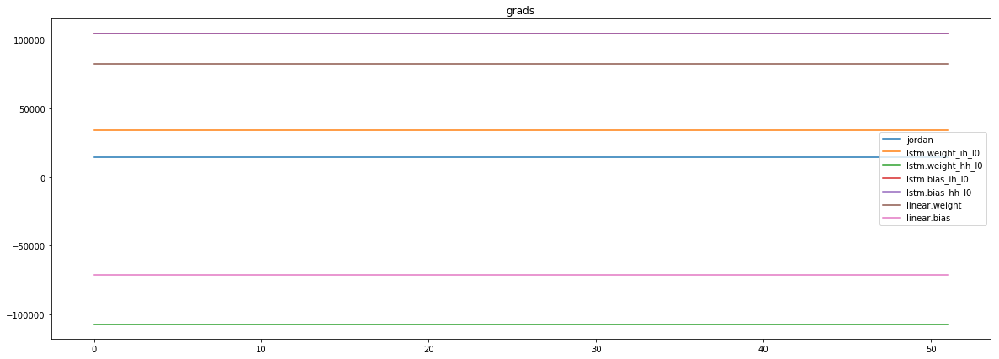

mean_p1 : 9404.9150390625
mean_p2 : 89845.046875
mean_p3 : -84822.671875


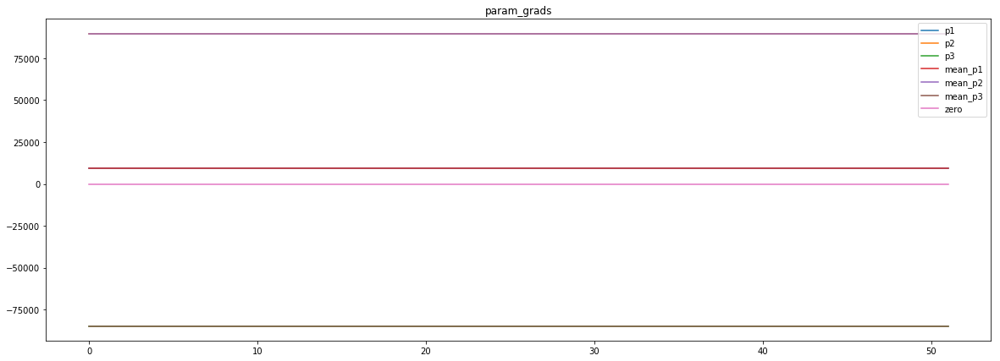

loss rate [0.0015821028518354652]
Epoch [62] 
     train_loss[6049.917649489183] 
     eval_train[4.473120824648784] 
     eval_test[4.482627085664055]



aux preds: -1.8865925073623657           0.9616260528564453           0.7471181750297546
main loss 6291.691129244291
aux loss 0.0
jord loss 0.0
combined loss 6291.691129244291 



Parameter containing:
tensor([[-1.8866,  0.9616,  0.7471]], requires_grad=True)


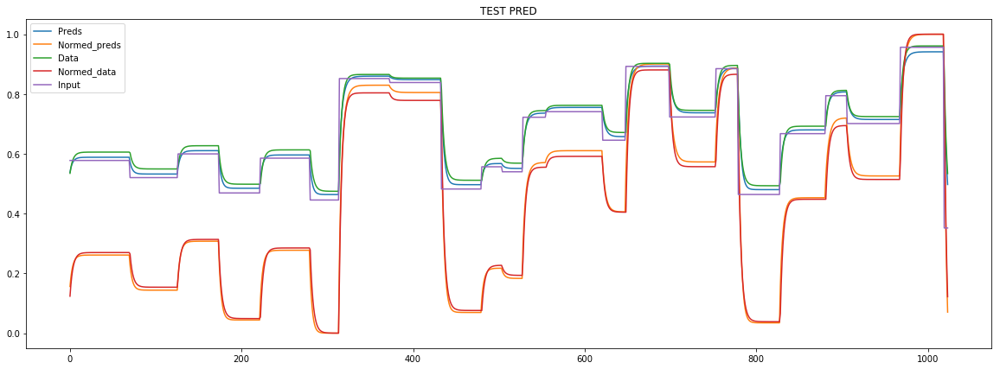

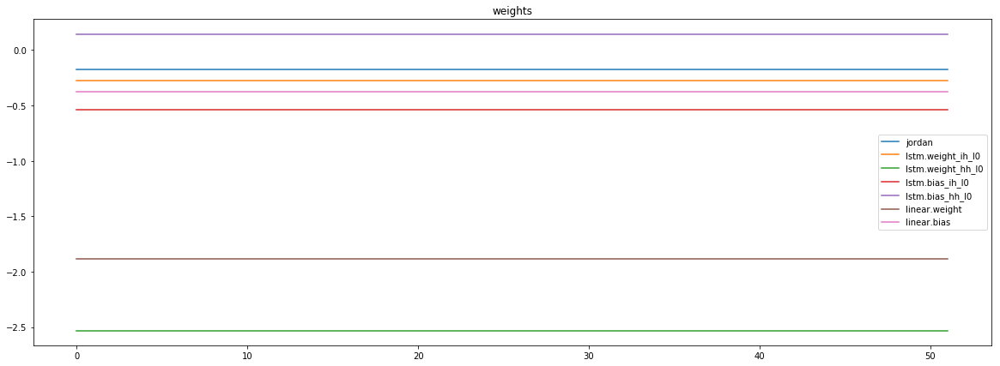

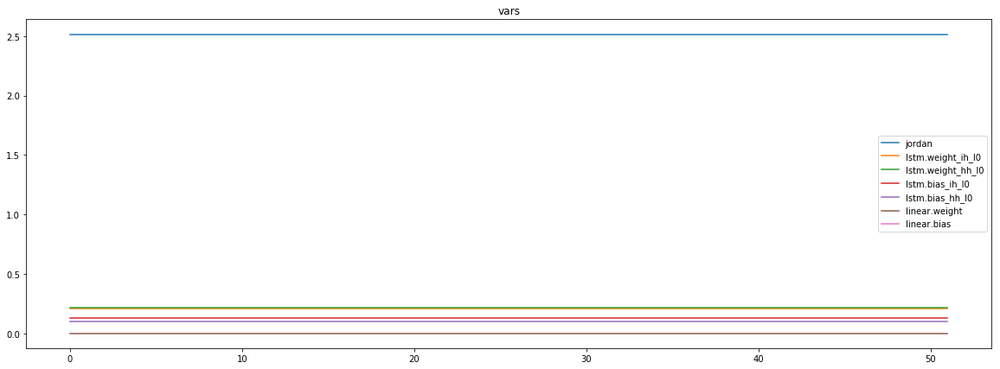

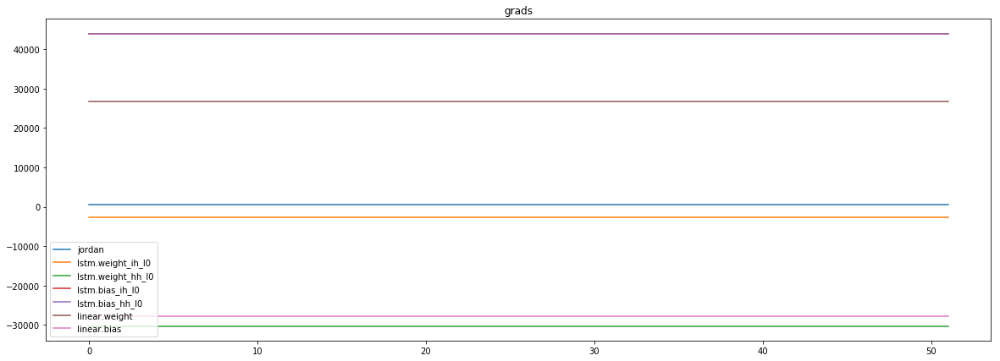

mean_p1 : -614.9189453125
mean_p2 : 25863.171875
mean_p3 : -24774.314453125


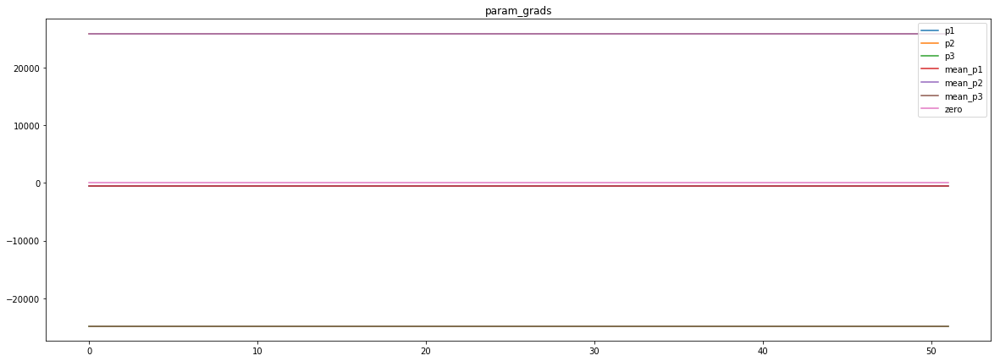

loss rate [-0.04704442949756915]
Epoch [63] 
     train_loss[6291.691129244291] 
     eval_train[4.7038490153276005] 
     eval_test[4.722608812830665]



aux preds: -1.887451410293579           0.959253191947937           0.7489773631095886
main loss 7251.1832932692305
aux loss 0.0
jord loss 0.0
combined loss 7251.1832932692305 



Parameter containing:
tensor([[-1.8875,  0.9593,  0.7490]], requires_grad=True)


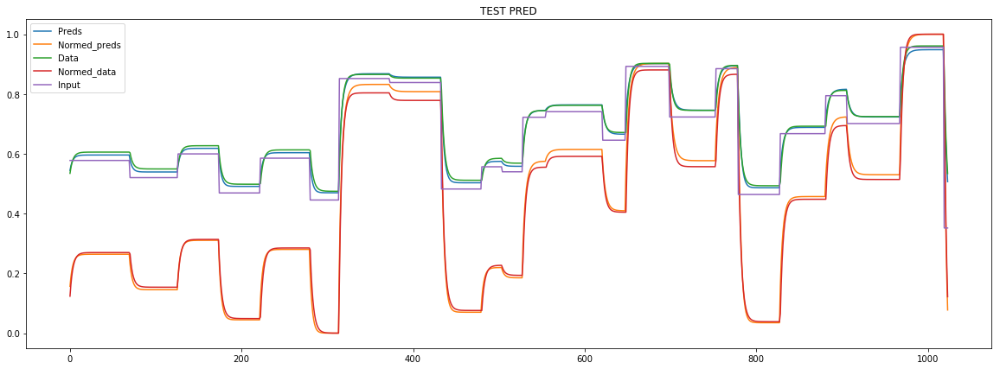

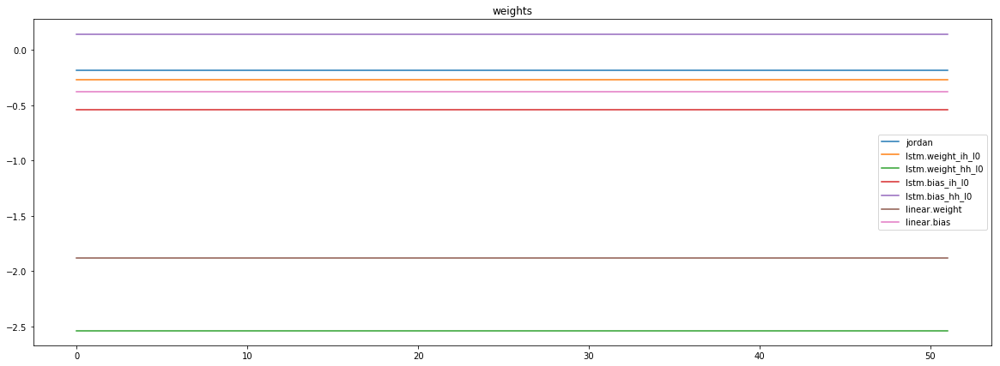

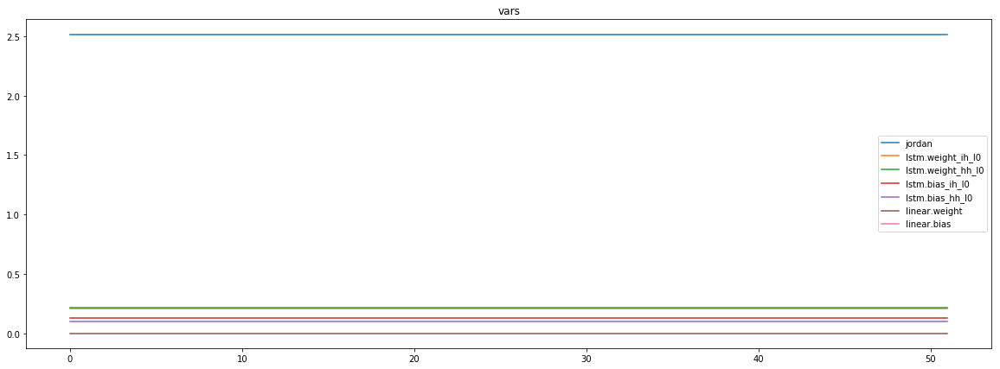

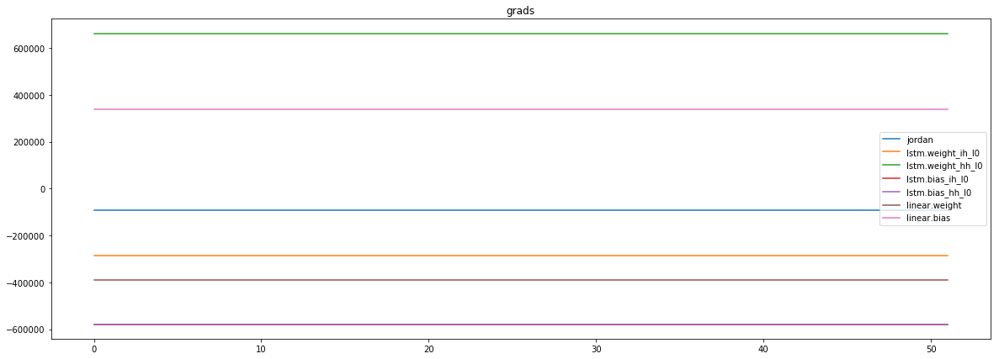

mean_p1 : -61860.671875
mean_p2 : -522536.125
mean_p3 : 491742.78125


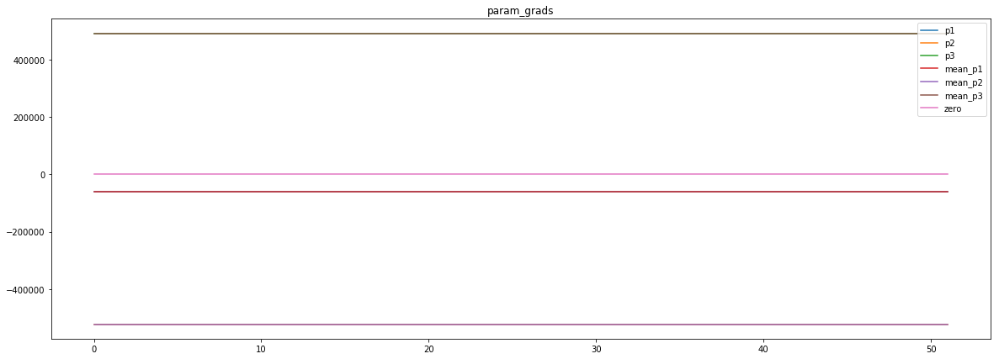

loss rate [0.05012141424881289]
Epoch [64] 
     train_loss[7251.1832932692305] 
     eval_train[4.367503472245657] 
     eval_test[4.368979077447545]



aux preds: -1.882796287536621           0.957727313041687           0.7501361966133118
main loss 6312.753206693209
aux loss 0.0
jord loss 0.0
combined loss 6312.753206693209 



Parameter containing:
tensor([[-1.8828,  0.9577,  0.7501]], requires_grad=True)


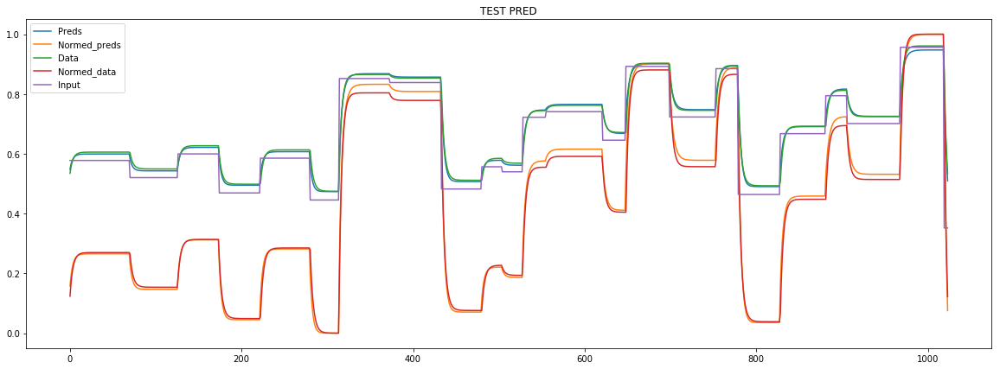

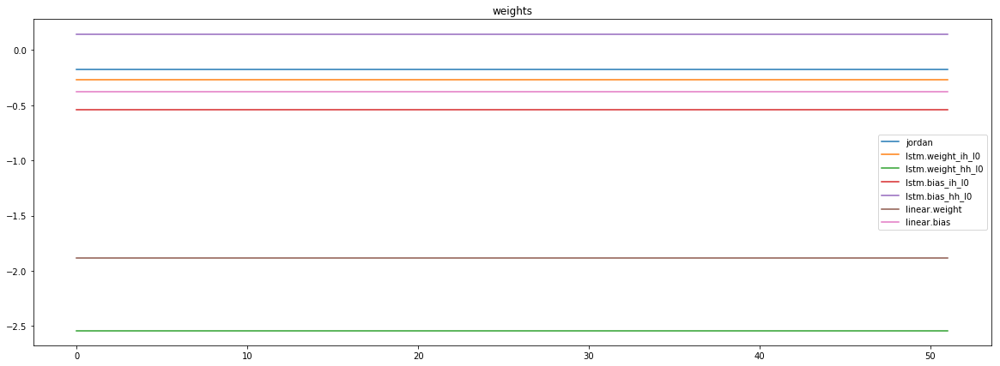

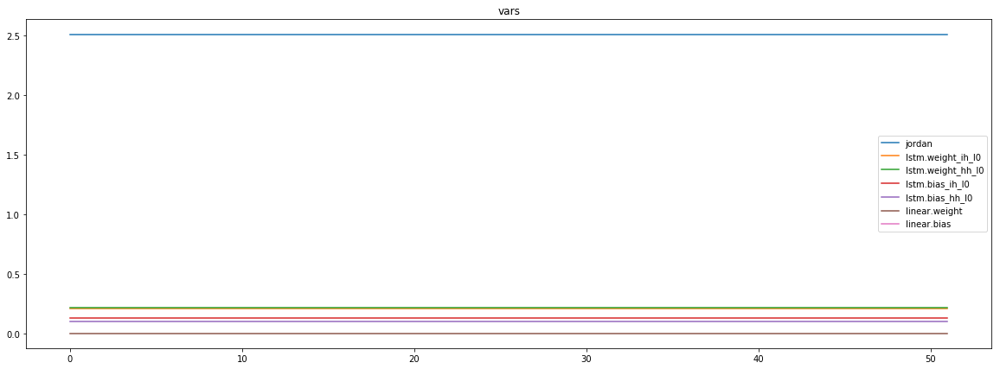

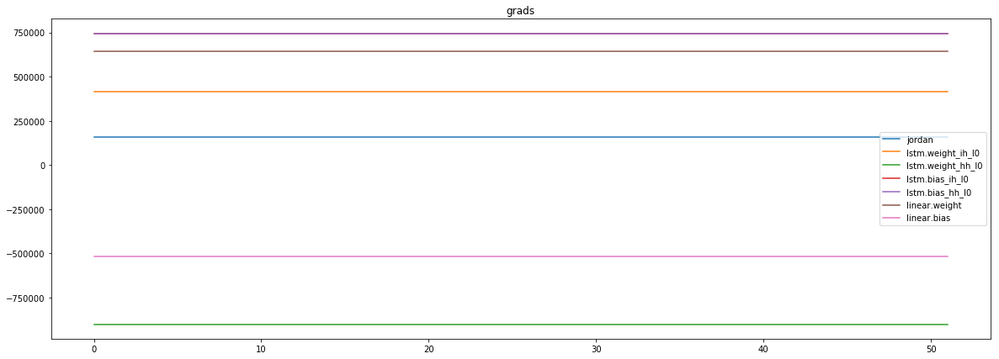

mean_p1 : 110223.5703125
mean_p2 : 751267.75
mean_p3 : -704847.375


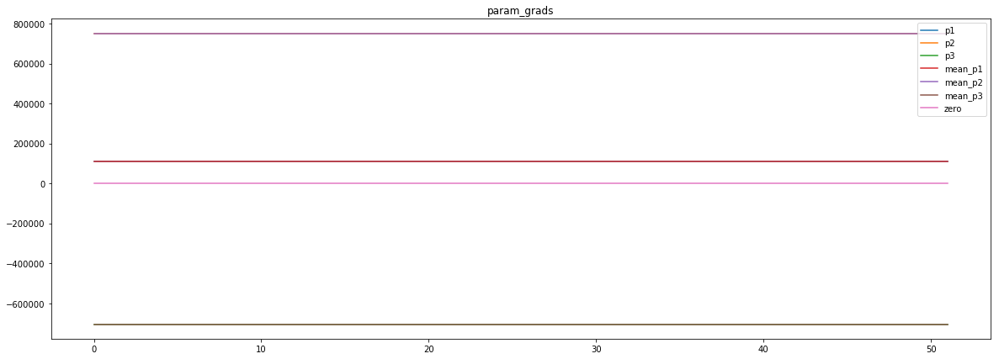

loss rate [0.04631770012756242]
Epoch [65] 
     train_loss[6312.753206693209] 
     eval_train[4.324315576026073] 
     eval_test[4.315162852406502]



aux preds: -1.8815109729766846           0.9583126902580261           0.7491390705108643
main loss 6058.999896709735
aux loss 0.0
jord loss 0.0
combined loss 6058.999896709735 



Parameter containing:
tensor([[-1.8815,  0.9583,  0.7491]], requires_grad=True)


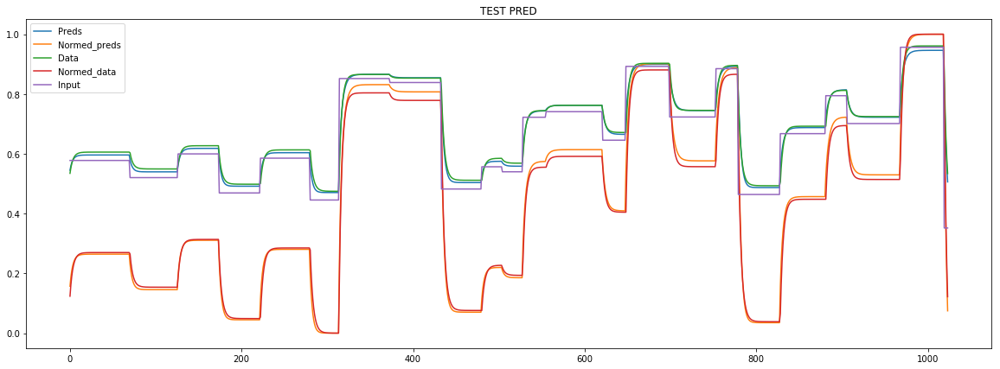

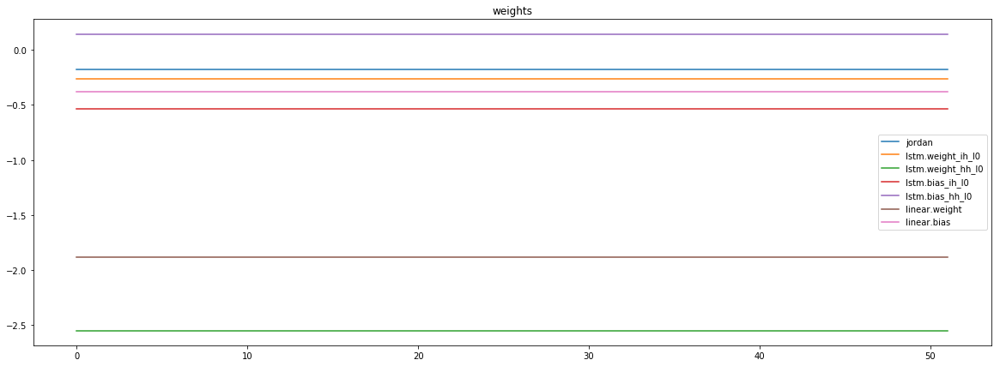

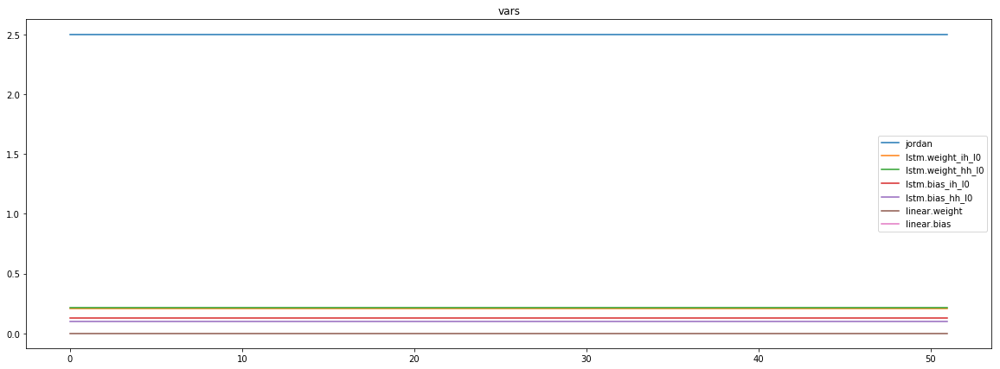

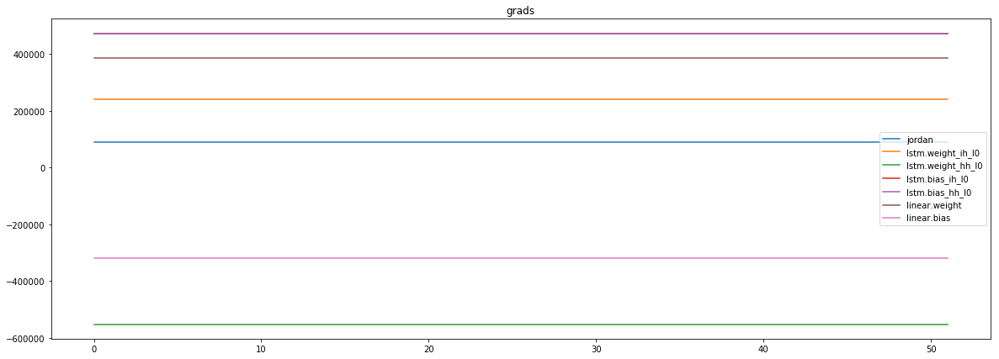

mean_p1 : 62322.734375
mean_p2 : 456666.03125
mean_p3 : -429052.78125


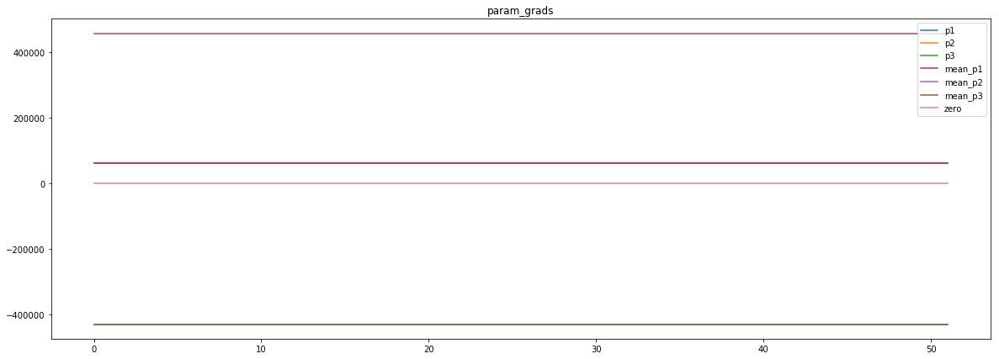

loss rate [0.022990760222657225]
Epoch [66] 
     train_loss[6058.999896709735] 
     eval_train[4.364963988845165] 
     eval_test[4.3661731169982385]



aux preds: -1.8801599740982056           0.957747757434845           0.749313235282898
main loss 5971.666583721454
aux loss 0.0
jord loss 0.0
combined loss 5971.666583721454 



Parameter containing:
tensor([[-1.8802,  0.9577,  0.7493]], requires_grad=True)


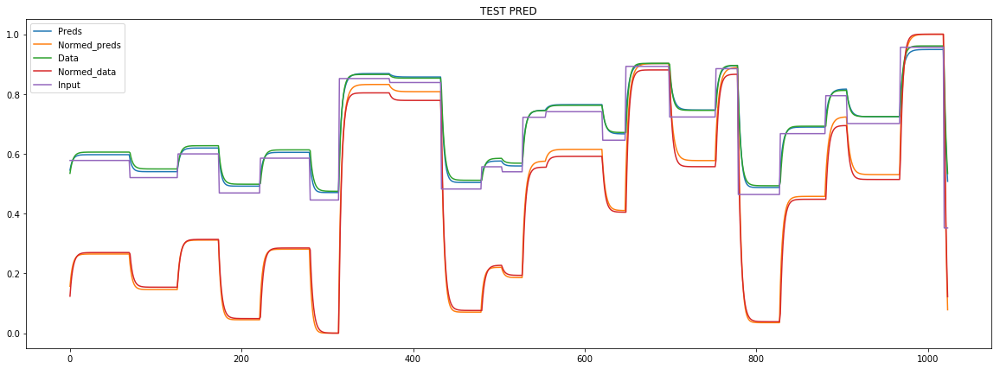

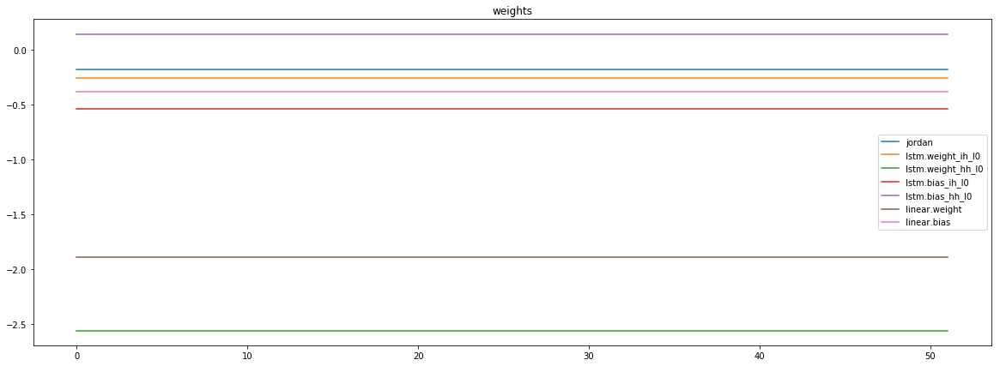

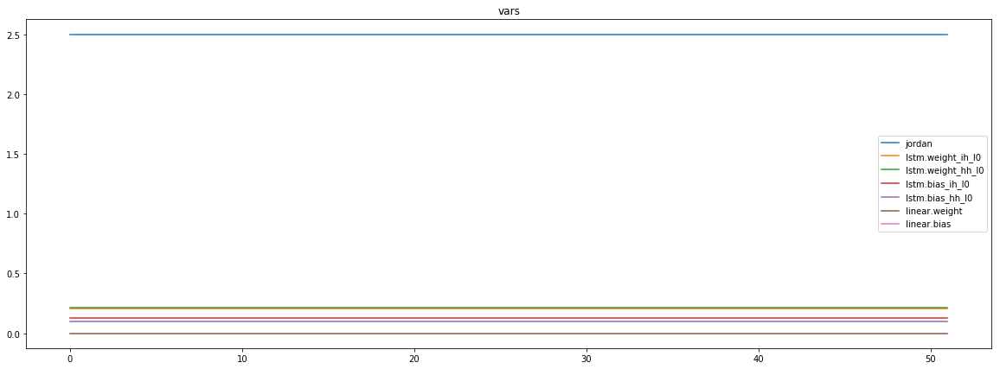

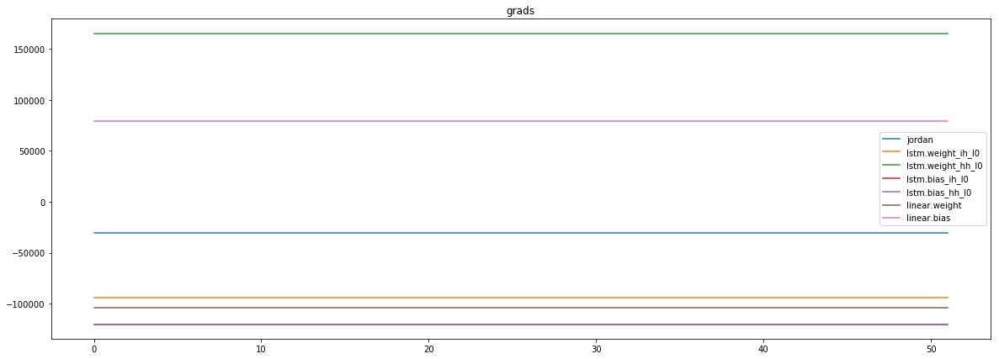

mean_p1 : -22693.49609375
mean_p2 : -133890.4375
mean_p3 : 125595.46875


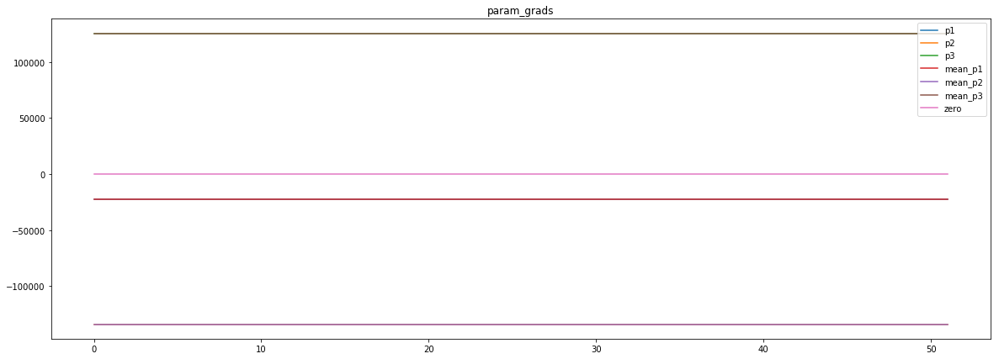

loss rate [0.004458662241935141]
Epoch [67] 
     train_loss[5971.666583721454] 
     eval_train[4.330947751036057] 
     eval_test[4.330709366635842]



aux preds: -1.8757108449935913           0.9576880931854248           0.7489809989929199
main loss 6245.493971604567
aux loss 0.0
jord loss 0.0
combined loss 6245.493971604567 



Parameter containing:
tensor([[-1.8757,  0.9577,  0.7490]], requires_grad=True)


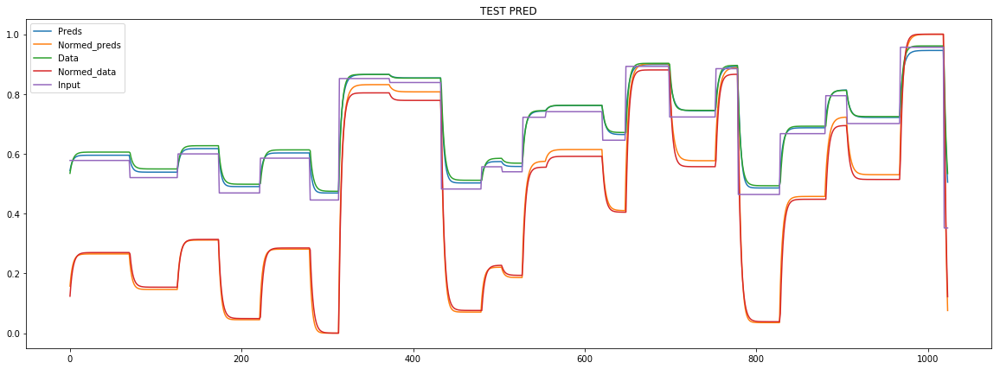

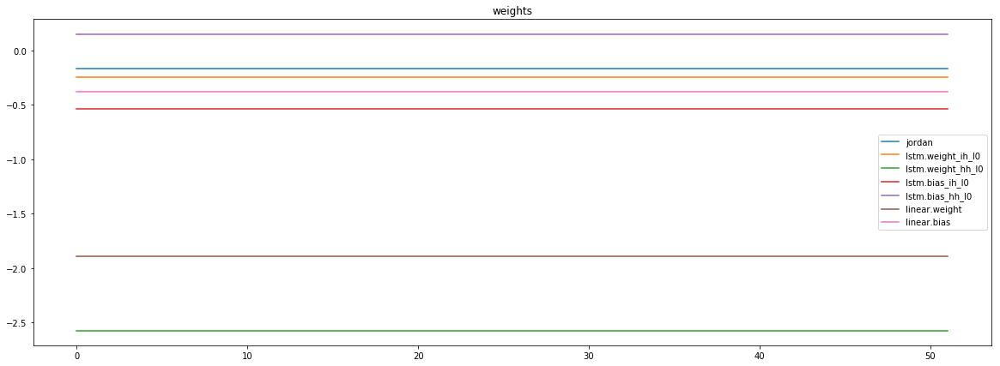

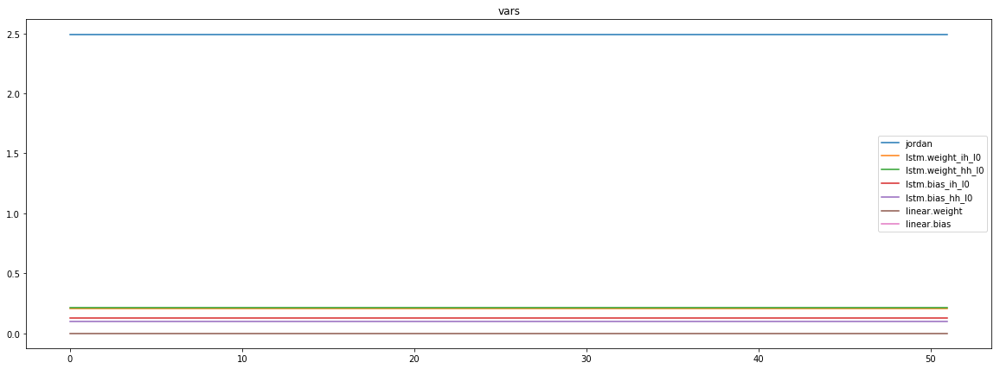

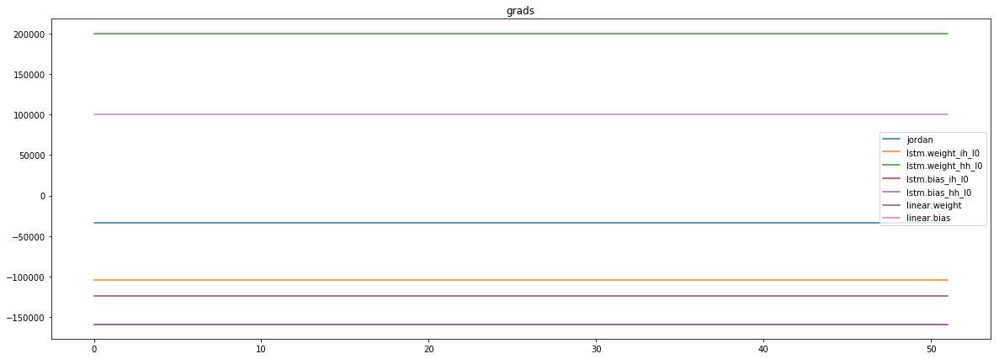

mean_p1 : -24338.40625
mean_p2 : -161608.8125
mean_p3 : 151806.390625


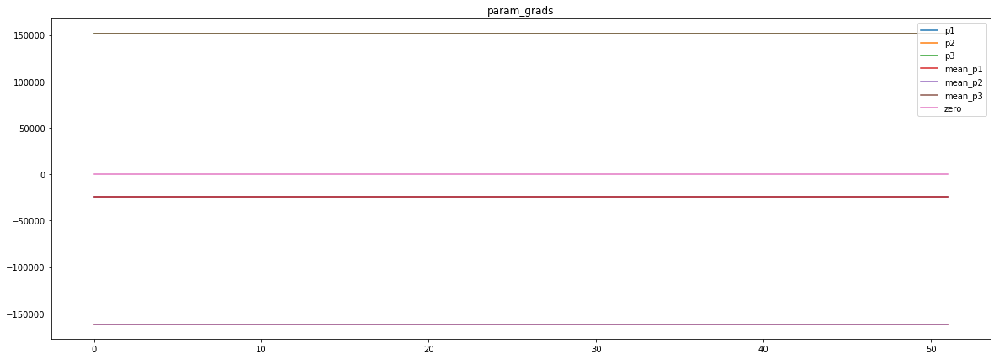

loss rate [-0.009289818153016993]
Epoch [68] 
     train_loss[6245.493971604567] 
     eval_train[4.369803296831938] 
     eval_test[4.377641623670405]



aux preds: -1.8712486028671265           0.9573051333427429           0.7491914629936218
main loss 5918.275010329026
aux loss 0.0
jord loss 0.0
combined loss 5918.275010329026 



Parameter containing:
tensor([[-1.8712,  0.9573,  0.7492]], requires_grad=True)


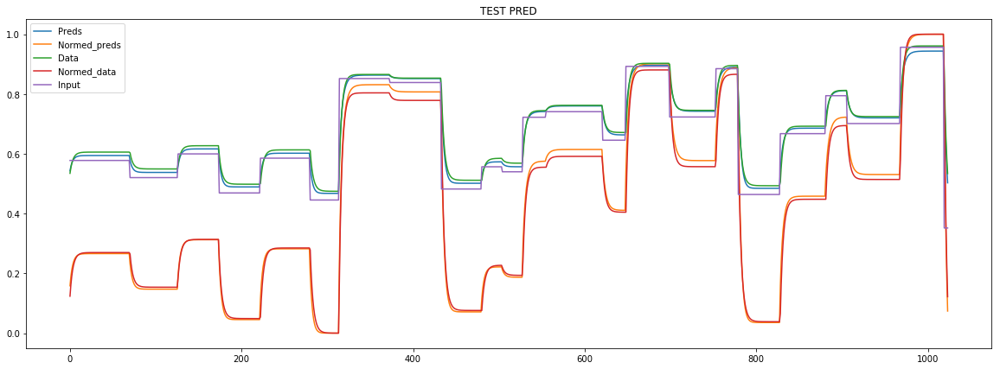

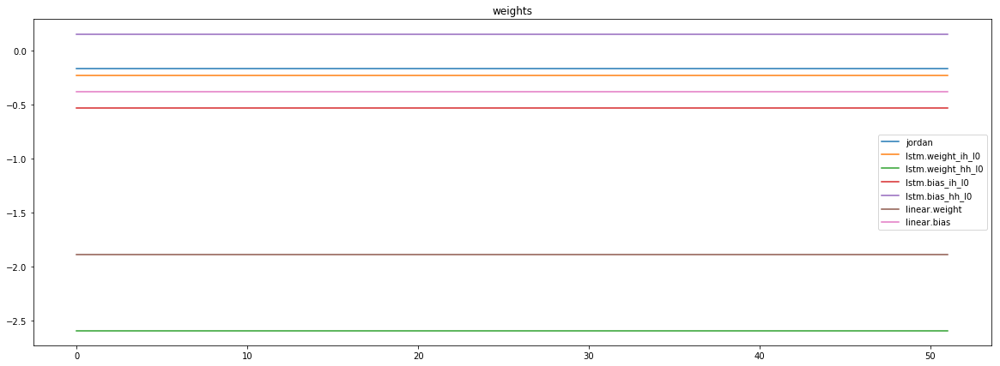

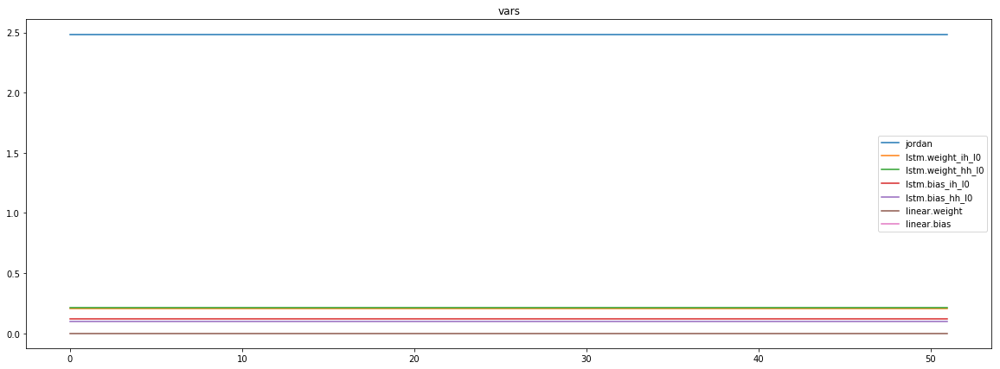

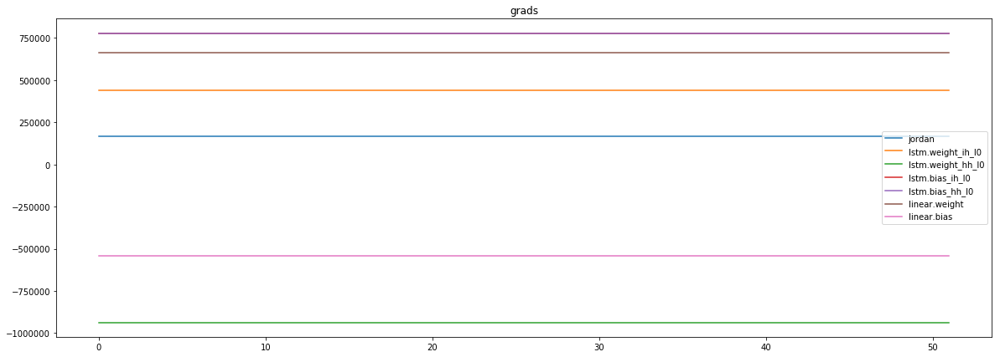

mean_p1 : 117066.546875
mean_p2 : 785189.6875
mean_p3 : -736497.125


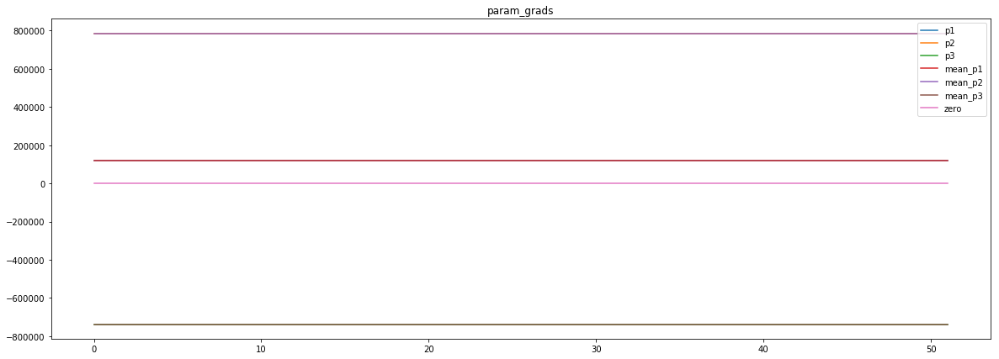

loss rate [-0.01742014069197073]
Epoch [69] 
     train_loss[5918.275010329026] 
     eval_train[4.419636668494114] 
     eval_test[4.434094718911431]



aux preds: -1.865910530090332           0.9562915563583374           0.749851405620575
main loss 7183.876985990084
aux loss 0.0
jord loss 0.0
combined loss 7183.876985990084 



Parameter containing:
tensor([[-1.8659,  0.9563,  0.7499]], requires_grad=True)


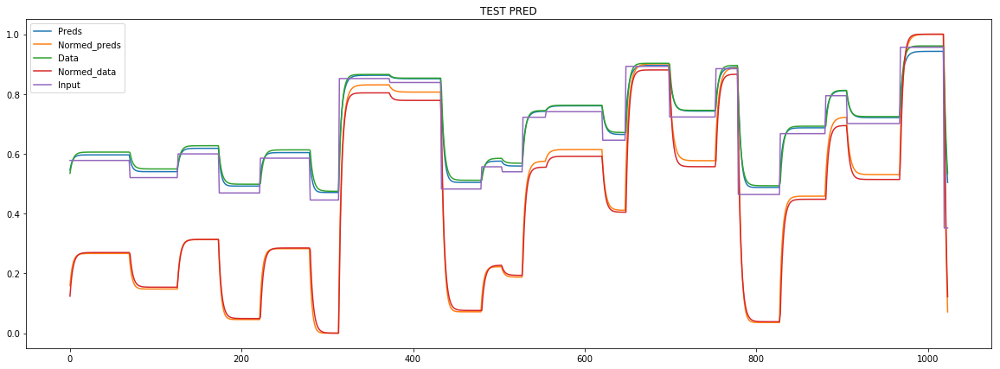

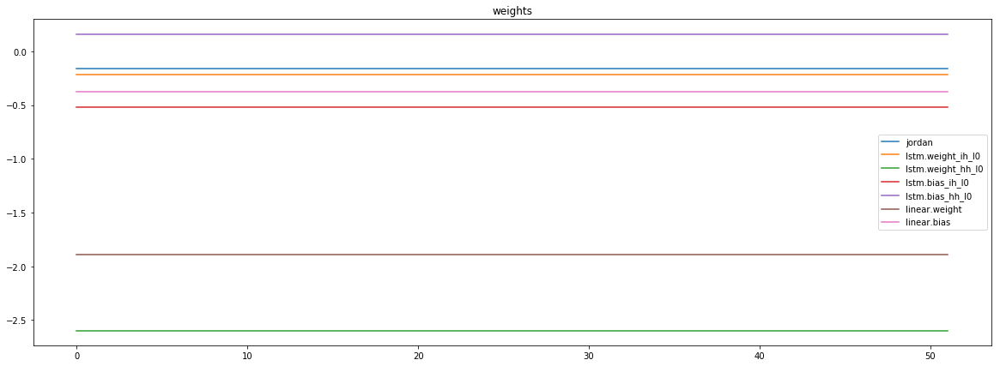

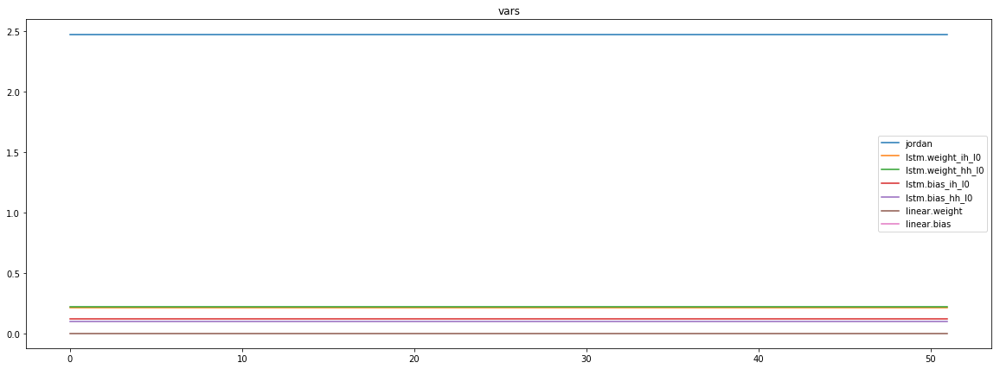

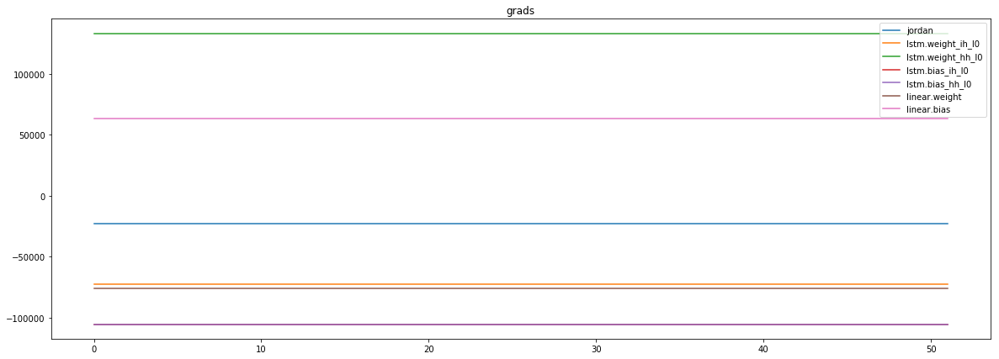

mean_p1 : -16047.0751953125
mean_p2 : -106307.6953125
mean_p3 : 99491.25


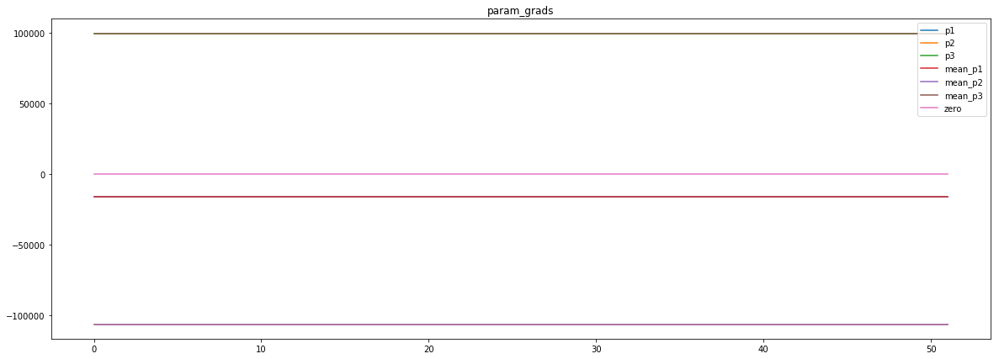

loss rate [0.00032227551408536836]
Epoch [70] 
     train_loss[7183.876985990084] 
     eval_train[4.370929813155762] 
     eval_test[4.379403406923467]



aux preds: -1.8730396032333374           0.9543421864509583           0.7514108419418335
main loss 7526.929048978365
aux loss 0.0
jord loss 0.0
combined loss 7526.929048978365 



Parameter containing:
tensor([[-1.8730,  0.9543,  0.7514]], requires_grad=True)


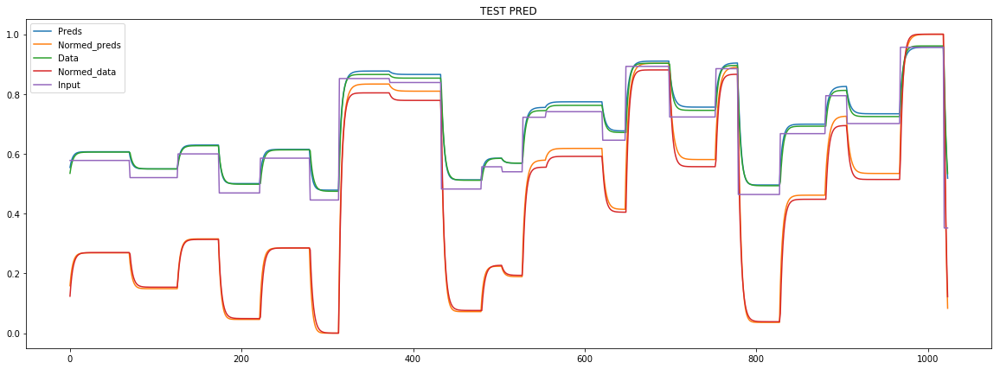

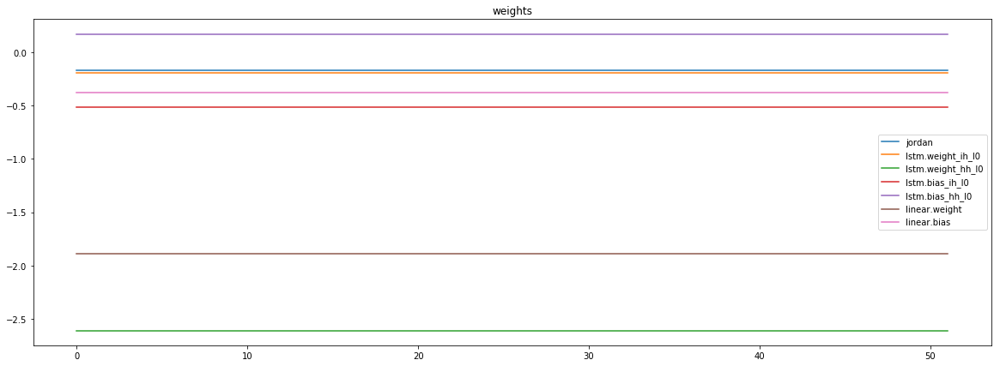

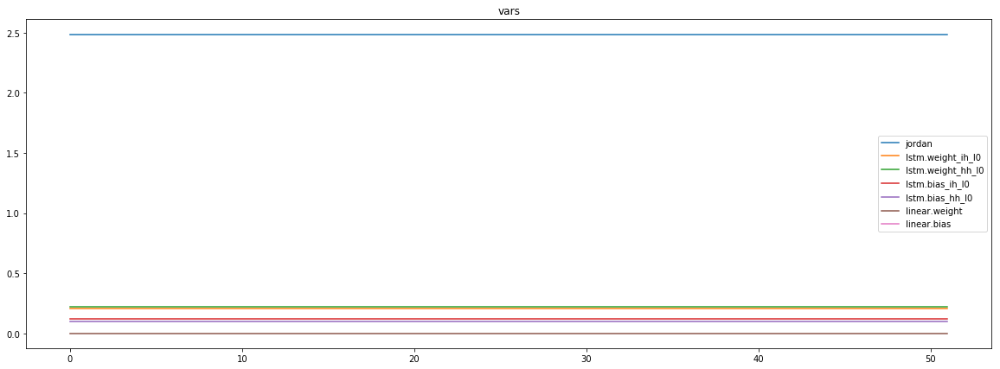

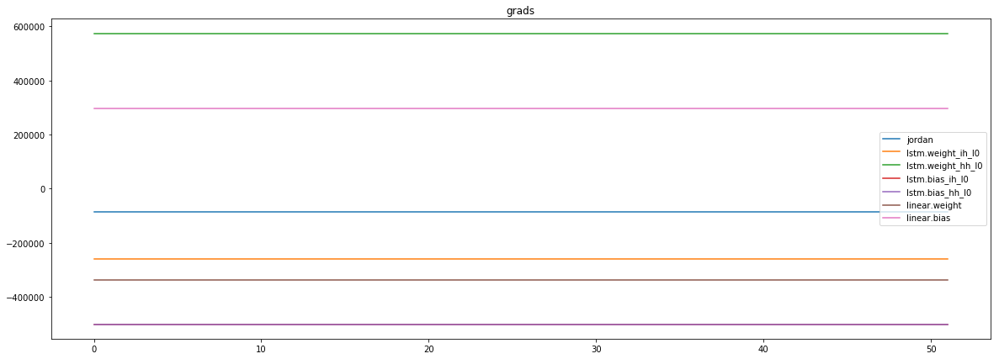

mean_p1 : -57571.859375
mean_p2 : -458686.15625
mean_p3 : 430385.5


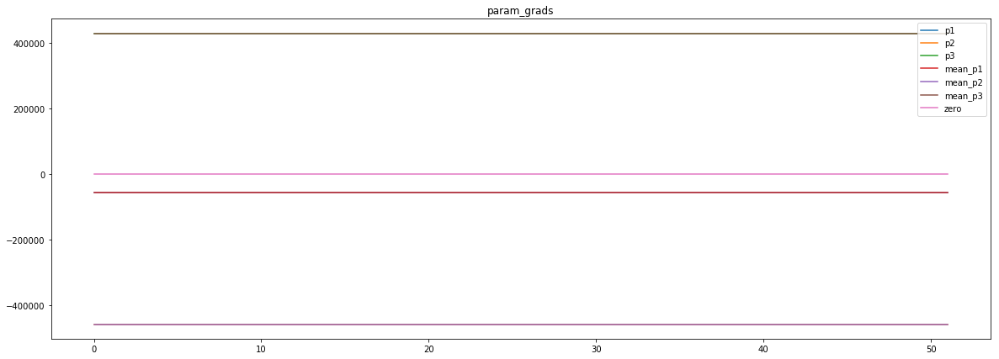

loss rate [-0.0016065203197916933]
Epoch [71] 
     train_loss[7526.929048978365] 
     eval_train[4.429758751621613] 
     eval_test[4.404110527851365]



aux preds: -1.865471363067627           0.953300416469574           0.7527642846107483
main loss 5555.978107158954
aux loss 0.0
jord loss 0.0
combined loss 5555.978107158954 



Parameter containing:
tensor([[-1.8655,  0.9533,  0.7528]], requires_grad=True)


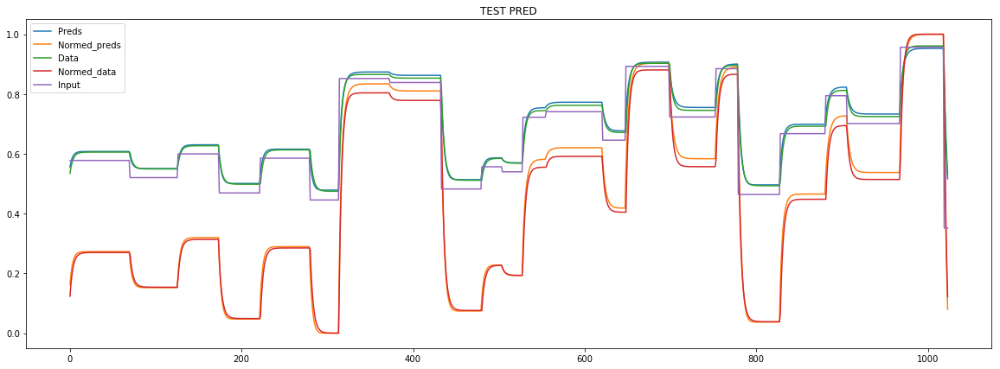

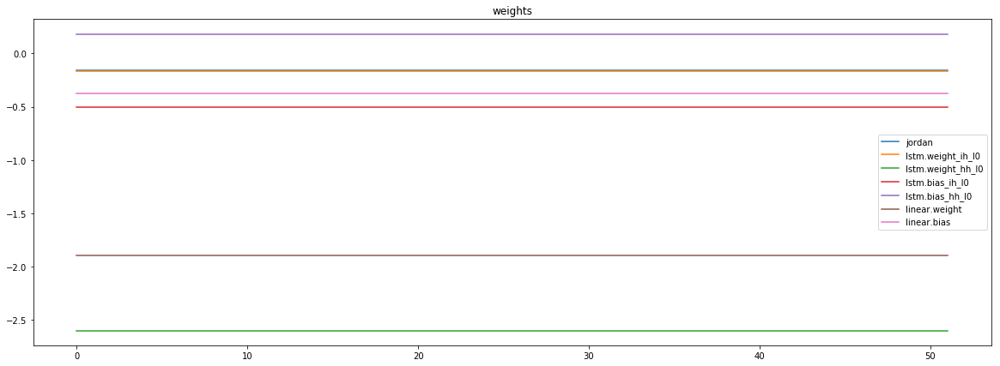

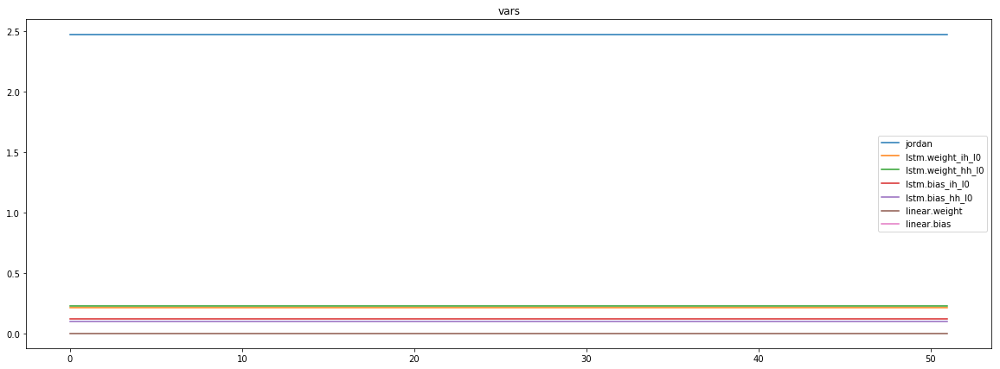

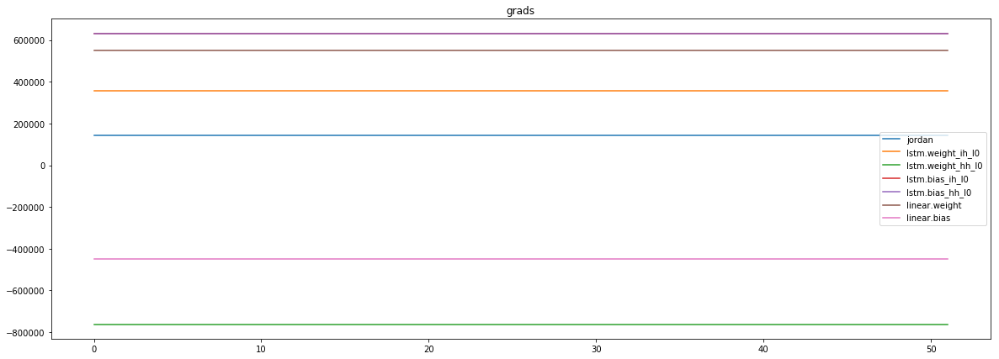

mean_p1 : 99972.8203125
mean_p2 : 645437.3125
mean_p3 : -603607.625


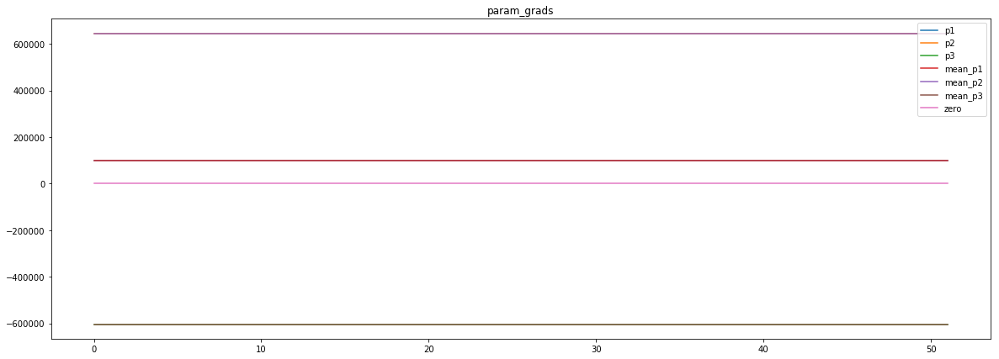

loss rate [0.010229044451333658]
Epoch [72] 
     train_loss[5555.978107158954] 
     eval_train[4.383896079774086] 
     eval_test[4.360801715742458]



aux preds: -1.8667643070220947           0.9573522210121155           0.7484967708587646
main loss 5909.0735098031855
aux loss 0.0
jord loss 0.0
combined loss 5909.0735098031855 



Parameter containing:
tensor([[-1.8668,  0.9574,  0.7485]], requires_grad=True)


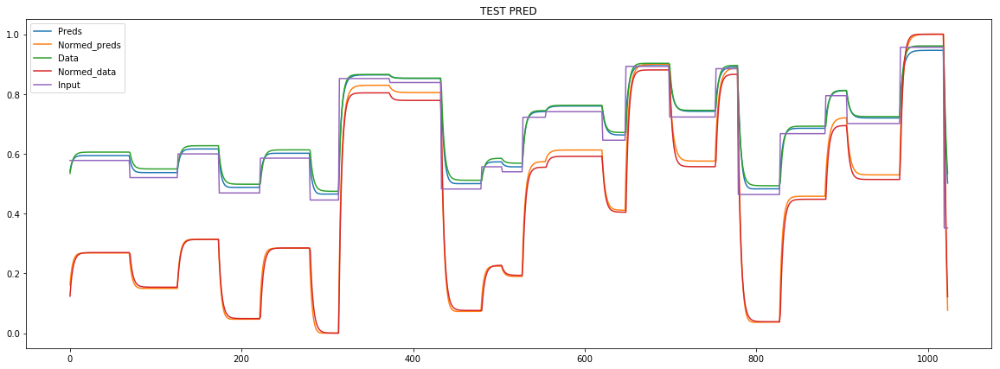

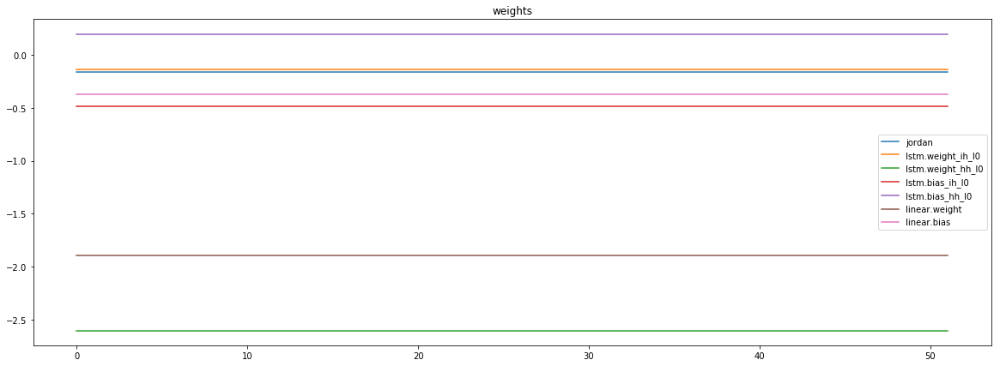

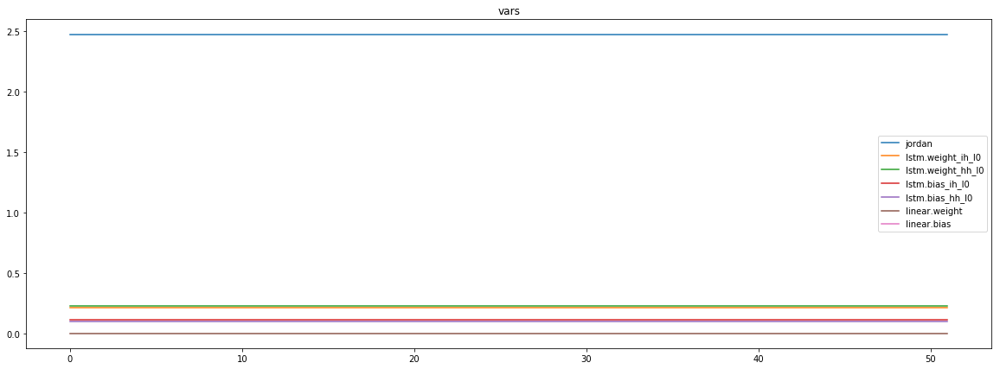

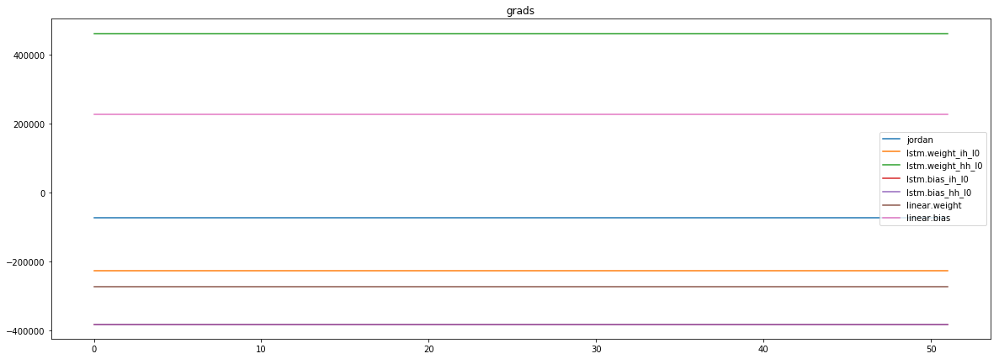

mean_p1 : -51104.0859375
mean_p2 : -370632.71875
mean_p3 : 347308.28125


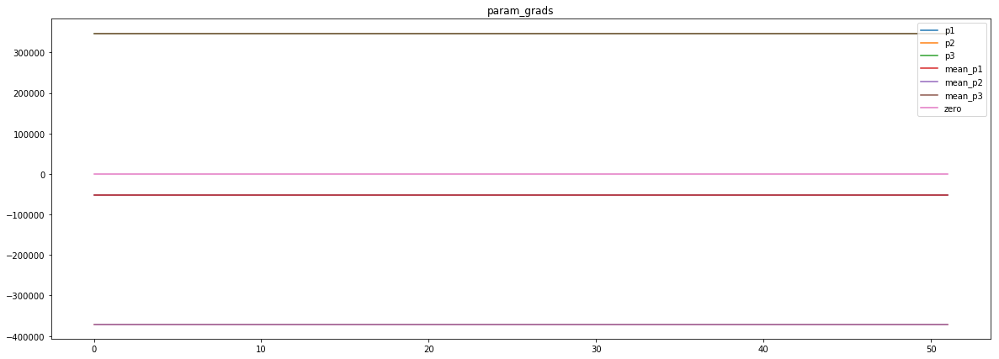

loss rate [-0.010554733682276218]
Epoch [73] 
     train_loss[5909.0735098031855] 
     eval_train[4.412484324322297] 
     eval_test[4.427683467214758]



aux preds: -1.8639099597930908           0.9588235020637512           0.7473286390304565
main loss 5622.379601111779
aux loss 0.0
jord loss 0.0
combined loss 5622.379601111779 



Parameter containing:
tensor([[-1.8639,  0.9588,  0.7473]], requires_grad=True)


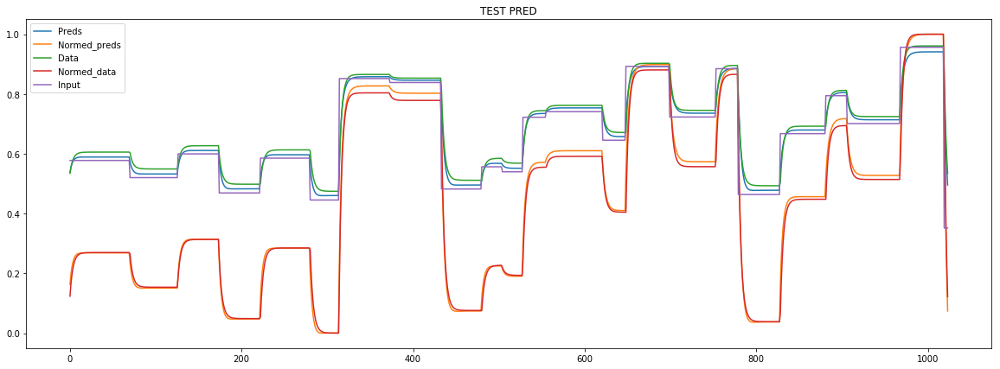

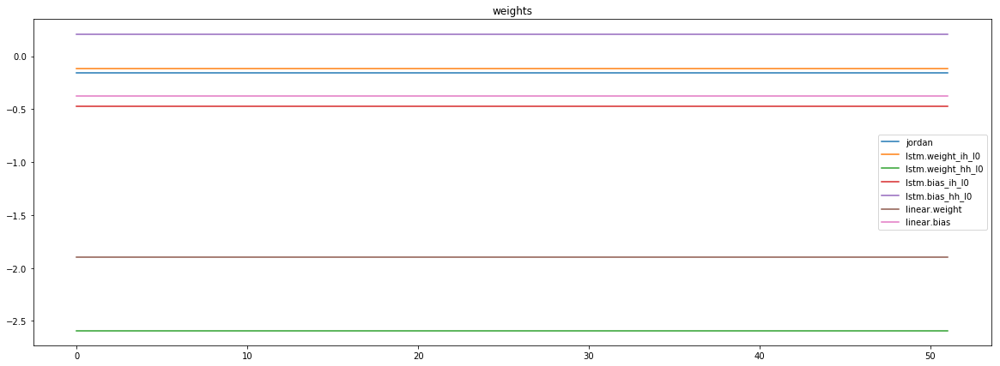

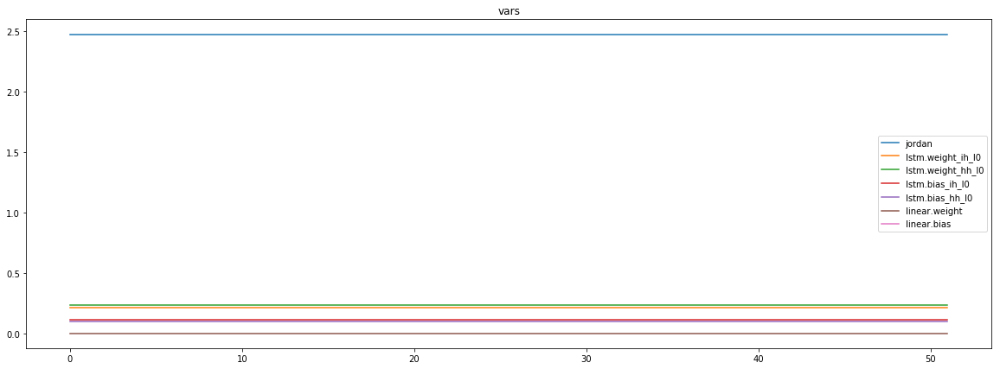

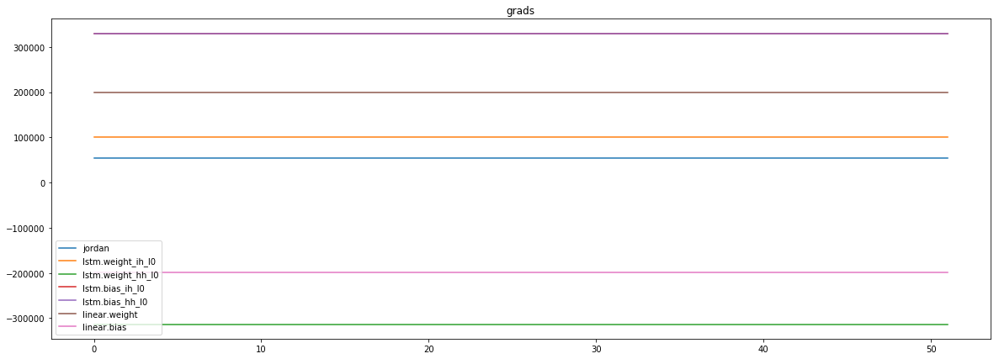

mean_p1 : 30625.94921875
mean_p2 : 265557.0625
mean_p3 : -241195.28125


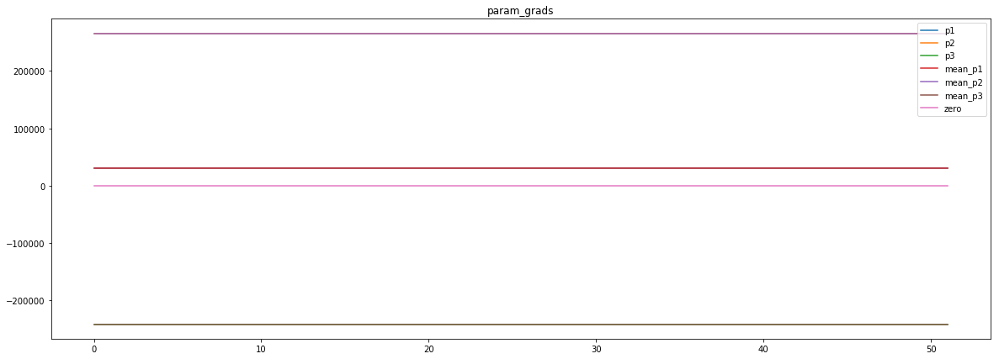

loss rate [-0.08628947597896586]
Epoch [74] 
     train_loss[5622.379601111779] 
     eval_train[4.765110752903498] 
     eval_test[4.7769926271655345]



aux preds: -1.8679389953613281           0.9546316266059875           0.7507954239845276
main loss 6315.124267578125
aux loss 0.0
jord loss 0.0
combined loss 6315.124267578125 



Parameter containing:
tensor([[-1.8679,  0.9546,  0.7508]], requires_grad=True)


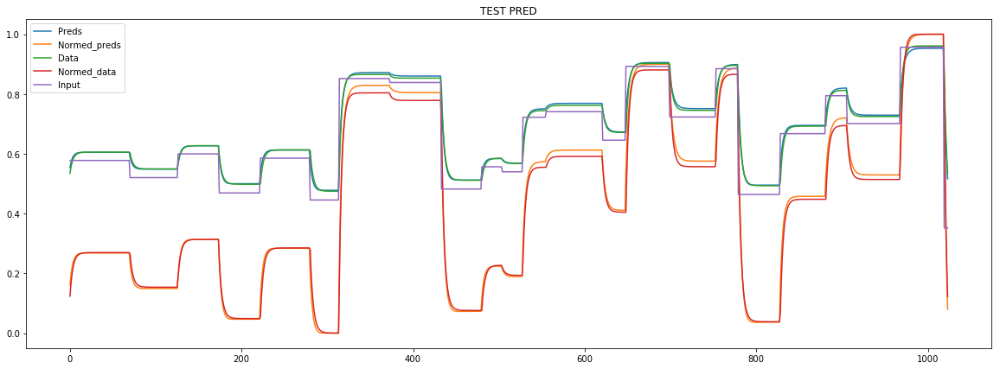

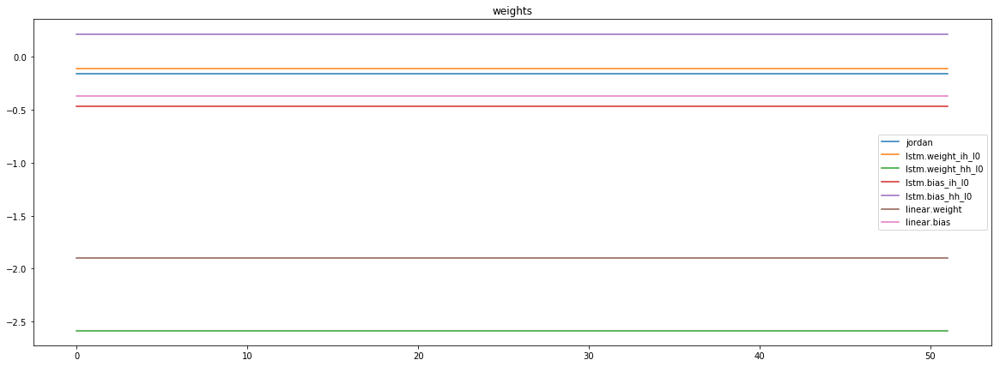

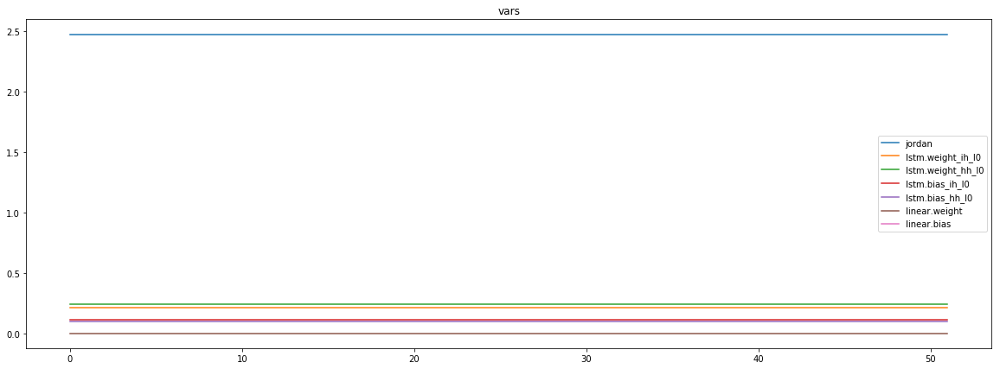

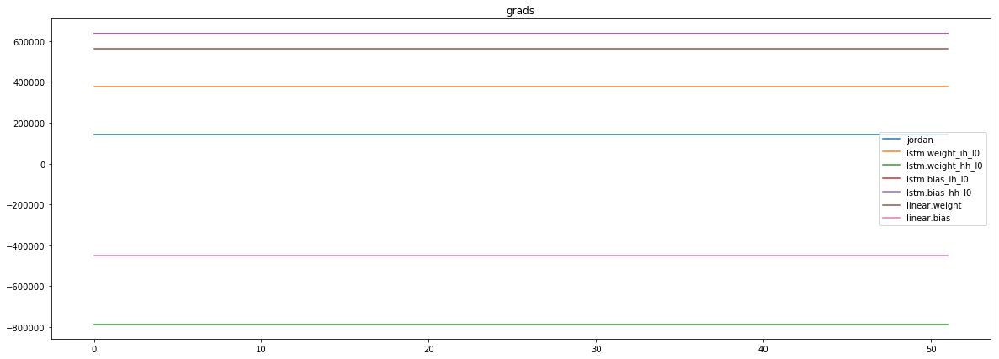

mean_p1 : 101568.25
mean_p2 : 659615.125
mean_p3 : -617791.4375


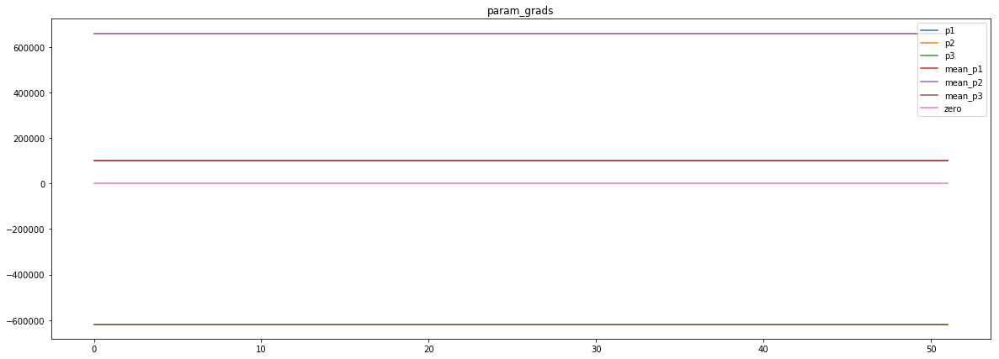

loss rate [0.060026280642212604]
Epoch [75] 
     train_loss[6315.124267578125] 
     eval_train[4.272086538947546] 
     eval_test[4.250397544015538]



aux preds: -1.8635317087173462           0.9561458230018616           0.7500343322753906
main loss 5070.954134427584
aux loss 0.0
jord loss 0.0
combined loss 5070.954134427584 



Parameter containing:
tensor([[-1.8635,  0.9561,  0.7500]], requires_grad=True)


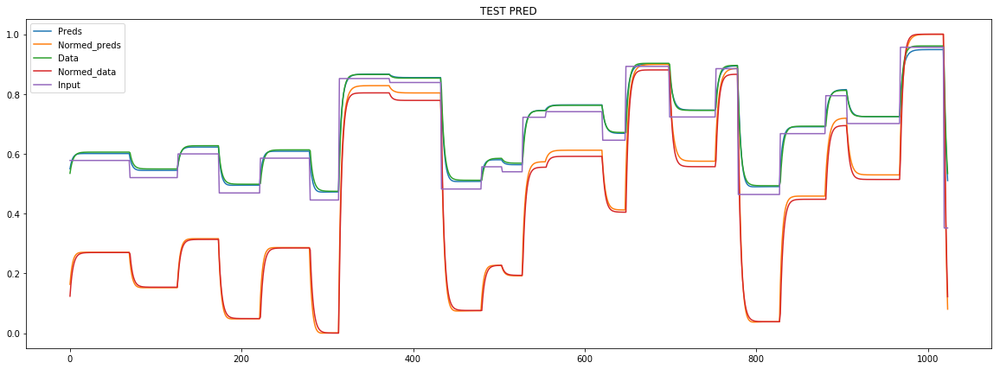

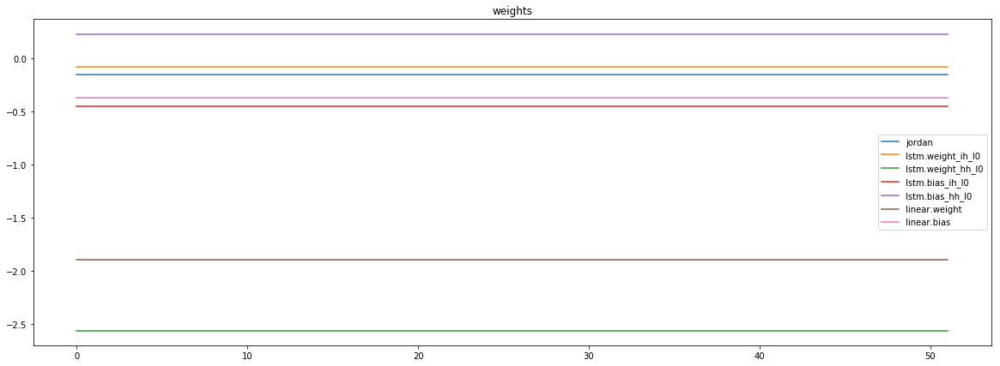

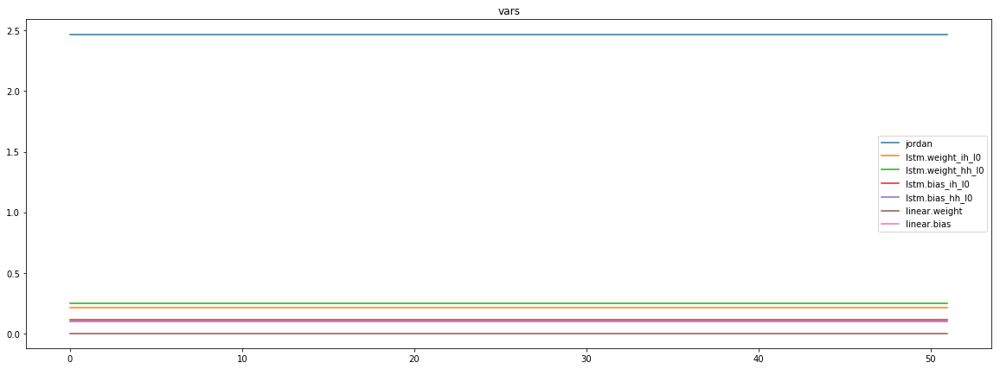

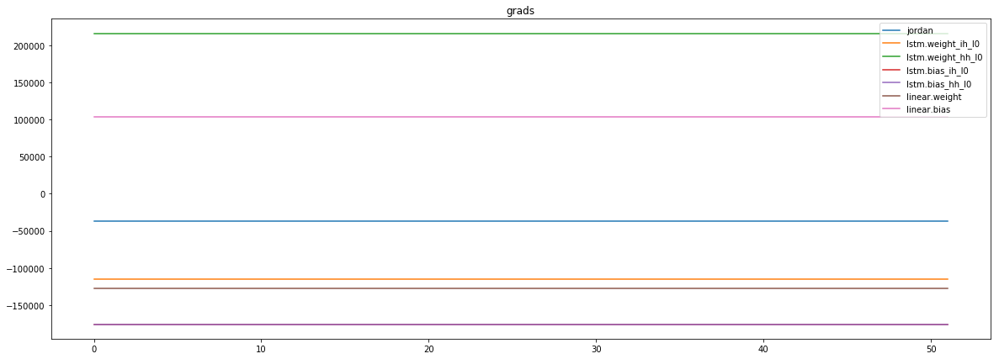

mean_p1 : -25172.357421875
mean_p2 : -175083.125
mean_p3 : 163336.921875


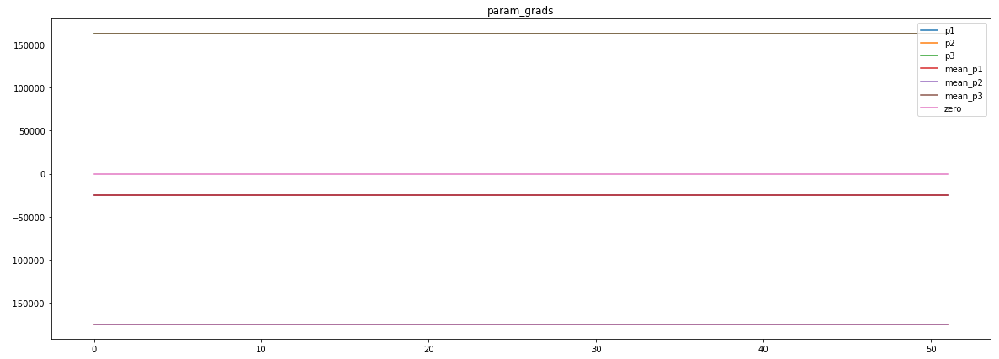

loss rate [0.06310791391093329]
Epoch [76] 
     train_loss[5070.954134427584] 
     eval_train[4.196019815710875] 
     eval_test[4.201984003186226]



aux preds: -1.8651716709136963           0.9565529227256775           0.7492055296897888
main loss 5842.114084097056
aux loss 0.0
jord loss 0.0
combined loss 5842.114084097056 



Parameter containing:
tensor([[-1.8652,  0.9566,  0.7492]], requires_grad=True)


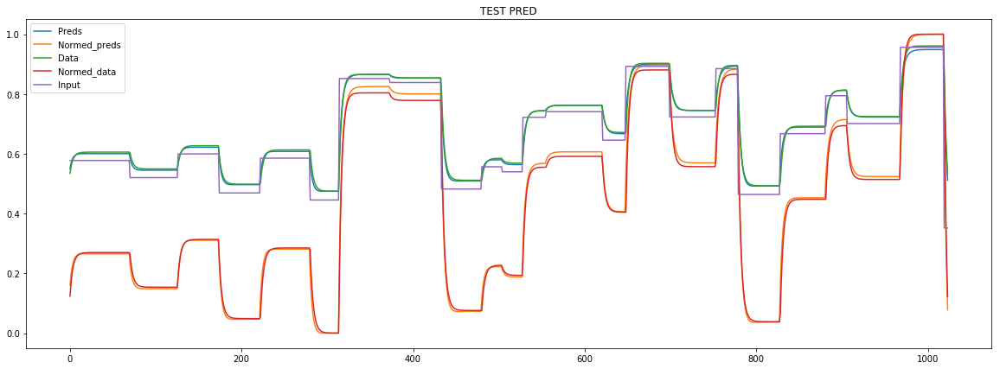

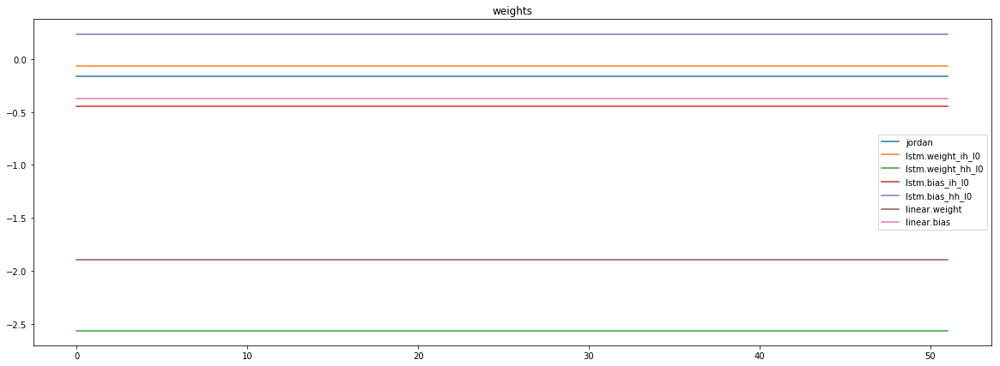

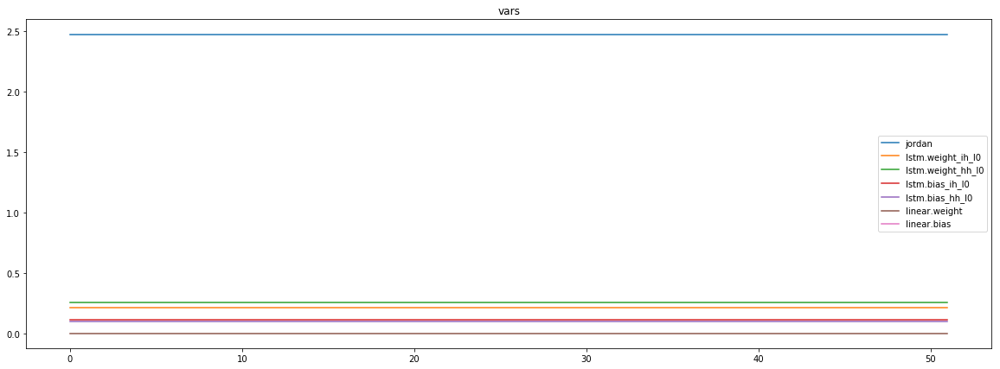

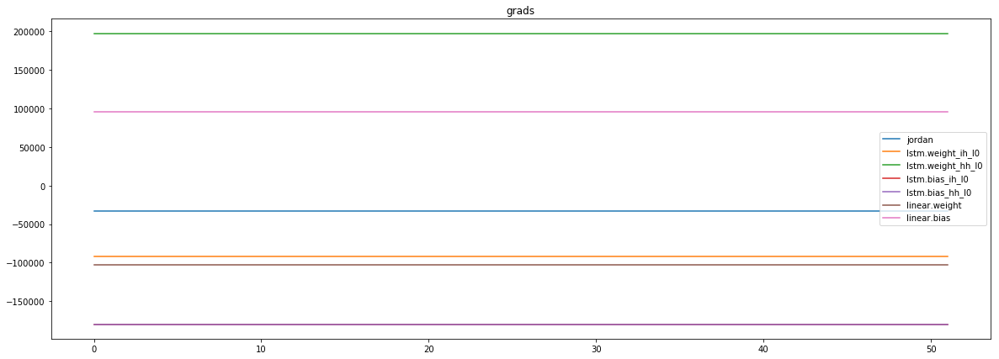

mean_p1 : -19962.572265625
mean_p2 : -157976.0
mean_p3 : 144482.984375


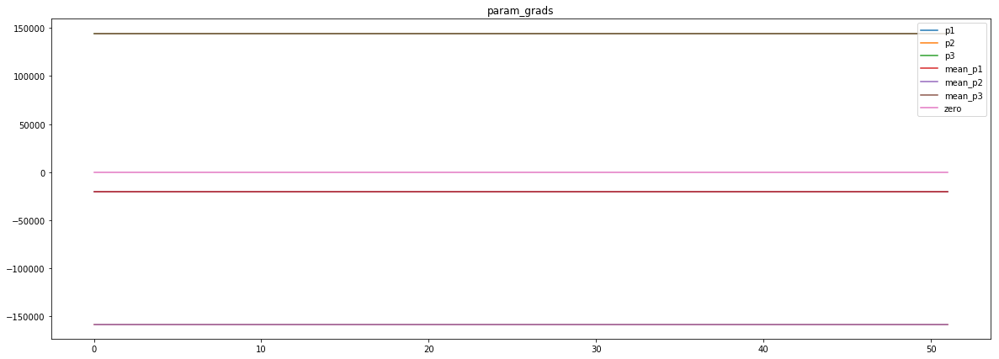

loss rate [0.04657930057102799]
Epoch [77] 
     train_loss[5842.114084097056] 
     eval_train[4.210342435309521] 
     eval_test[4.204386392777616]



aux preds: -1.8653959035873413           0.9580010771751404           0.7483029365539551
main loss 4880.492159329928
aux loss 0.0
jord loss 0.0
combined loss 4880.492159329928 



Parameter containing:
tensor([[-1.8654,  0.9580,  0.7483]], requires_grad=True)


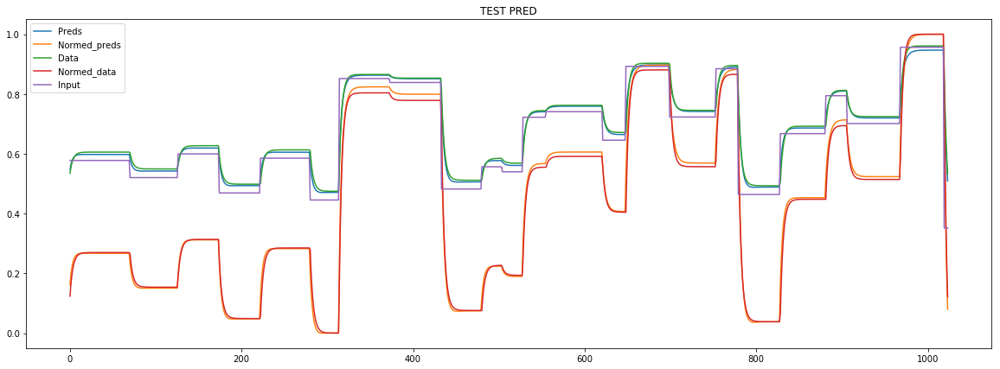

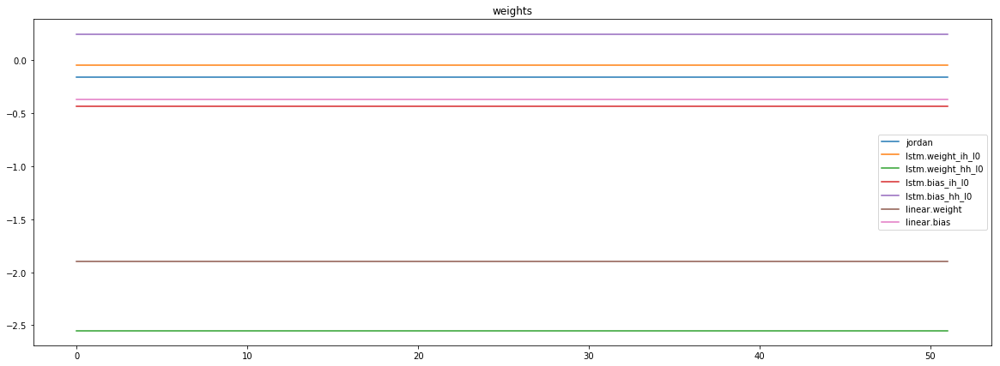

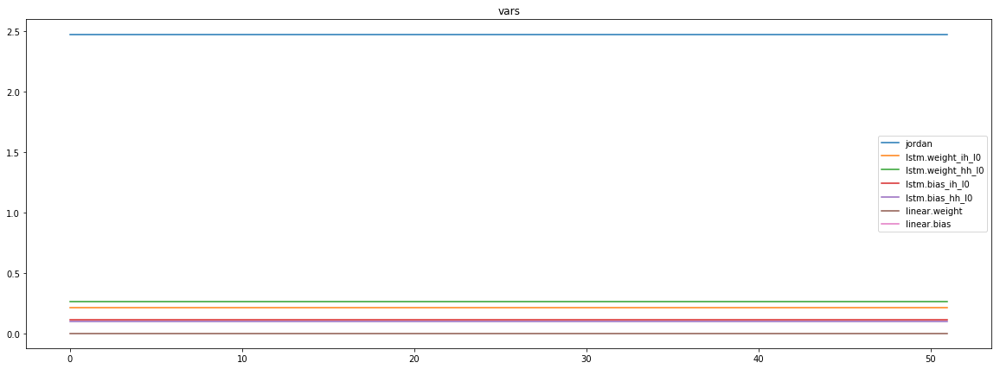

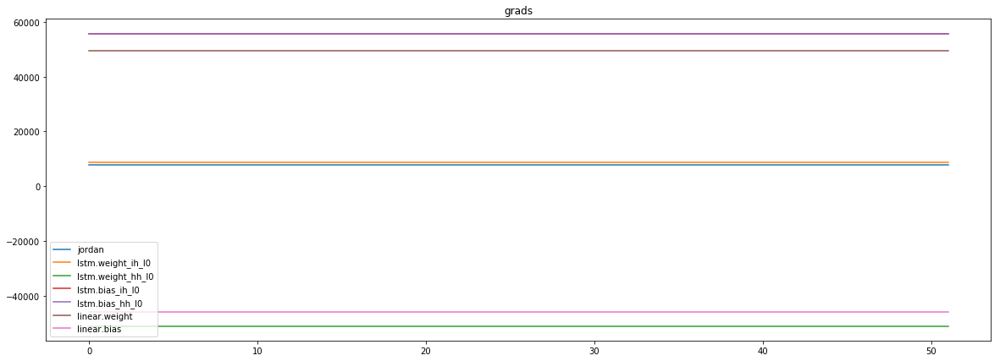

mean_p1 : 4980.439453125
mean_p2 : 44789.5390625
mean_p3 : -42069.61328125


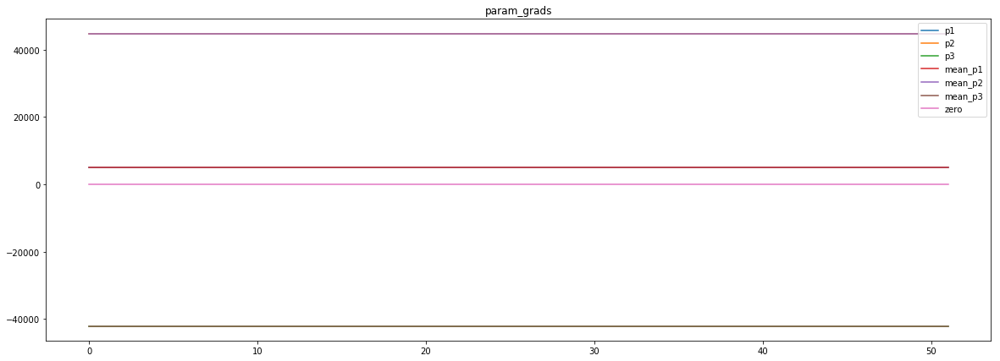

loss rate [-0.023081699514425846]
Epoch [78] 
     train_loss[4880.492159329928] 
     eval_train[4.303664471094425] 
     eval_test[4.3163025514646005]



aux preds: -1.864582896232605           0.9576193690299988           0.7493373155593872
main loss 4839.115971491887
aux loss 0.0
jord loss 0.0
combined loss 4839.115971491887 



Parameter containing:
tensor([[-1.8646,  0.9576,  0.7493]], requires_grad=True)


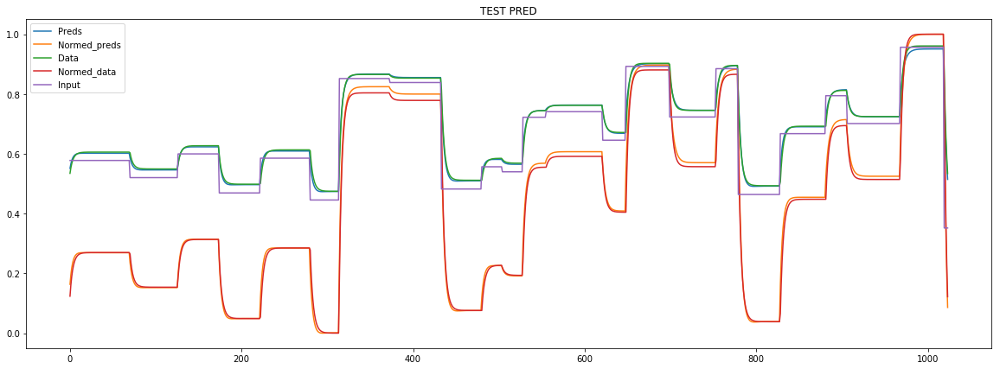

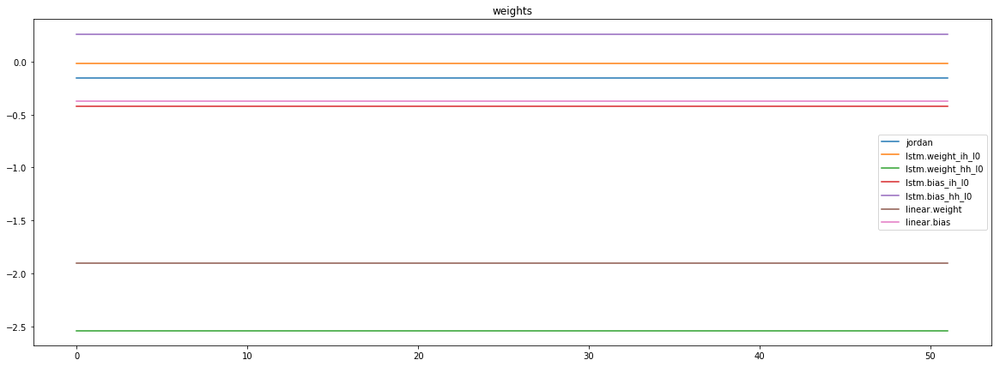

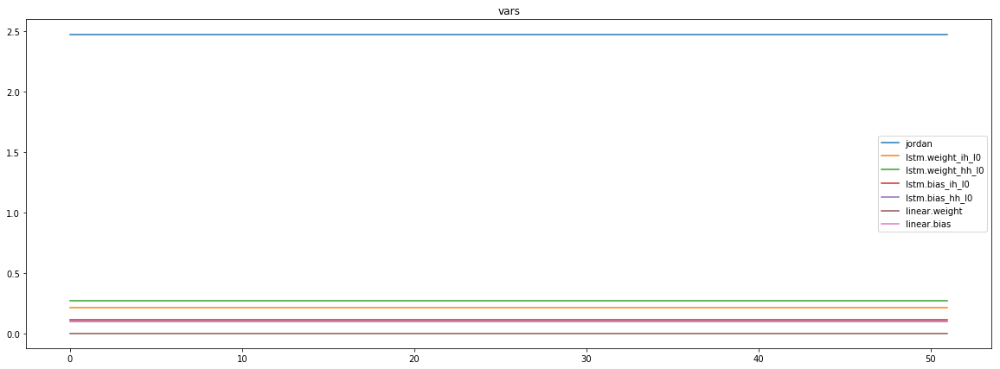

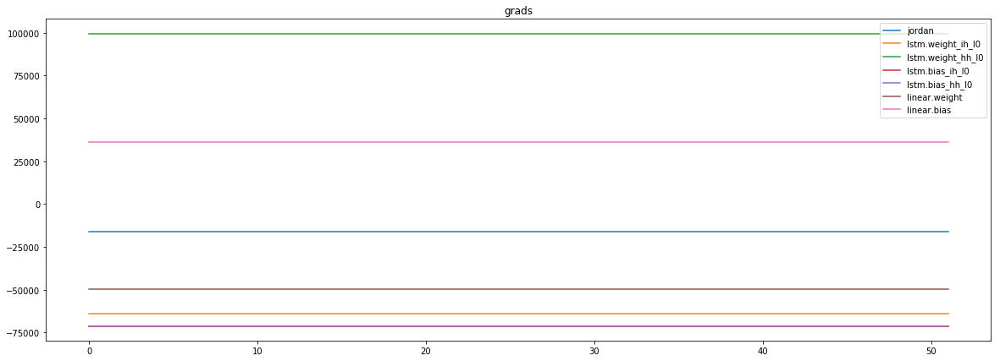

mean_p1 : -11675.5595703125
mean_p2 : -78472.1015625
mean_p3 : 73863.4609375


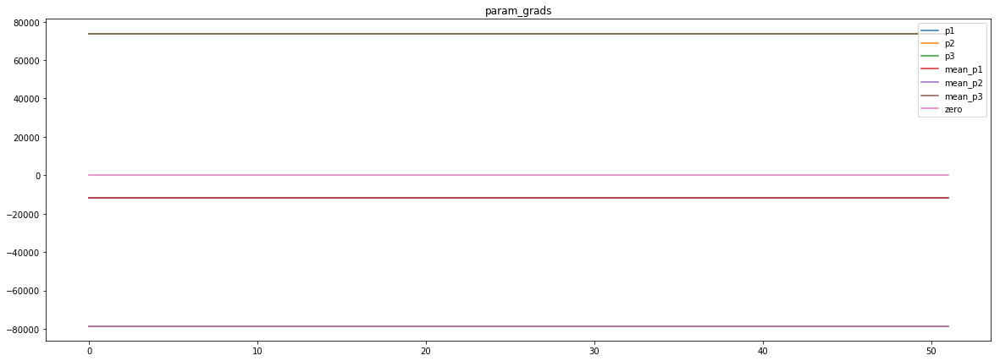

loss rate [0.019926397928252904]
Epoch [79] 
     train_loss[4839.115971491887] 
     eval_train[4.153981405381973] 
     eval_test[4.156385301188989]


In [17]:
logging.info("Training process STARTED")

model.hidden = model.init_hidden()


for t in range(num_epochs):
    
    batch_local_hist = hist["train"]["batches"]
    long_term_hist = hist["train"]["epochs"]
    
    for i, data in enumerate(tqdm(train_dl)):
        
        model.hidden = model.init_hidden()
        
        y_pred, jordan = batch_iteration(
            iter_index=i,
            model=model,
            optimizer=optimizer,
            batch_data=data,
            backprop=True,
            hist_part=batch_local_hist
        )
        
    hist['mean_params_sample']['1'][t] = jordan[:, 0].item()
    hist['mean_params_sample']['2'][t] = jordan[:, 1].item()
    hist['mean_params_sample']['3'][t] = jordan[:, 2].item()
    
    print(f"aux preds: {hist['mean_params_sample']['1'][t]} \
          {hist['mean_params_sample']['2'][t]} \
          {hist['mean_params_sample']['3'][t]}")
    
    mean_losses = update_long_term_hist(batches_hist=batch_local_hist,
                                                            long_term_hist=long_term_hist)
    mean_main, mean_aux, mean_jord = mean_losses
    # TODO add w8 decay
    print(f"main loss {mean_main}")
    print(f"aux loss {mean_aux}")
    print(f"jord loss {mean_jord}")
    print(f"combined loss {sum(mean_losses)} ")
    
    # VISUALISE TRAINING PROGRESS
#     x_batch, y_batch, indexes = data
#     plot_shared_scale([
#         (y_pred[:, 0].detach().numpy(),"Preds" ),
#          (y_batch[:, 0].detach().numpy(), "Data"),
#          (x_batch[-1].detach().numpy(), "Input")
#         ],
#         title="TRAIN PREDICT")
          
#     residuals = y_batch[:, 0] - y_pred[:, 0]
#     plot_multiscale([
#         (residuals.detach().numpy(), "Red"),
#         (y_batch[:, 0].detach().numpy(), "Green"),
#         (y_pred[:, 0].detach().numpy(), "Brown")
#     ],
#         title="TRAIN RESID"
#     ) 
    # /VISUALISE TRAINING PROGRESS

    # EVAL
    with torch.no_grad():
          
          model = model.eval()
          
          for i, data in enumerate(tqdm(train_dl)):
              batch_local_hist = hist['eval_train']['batches']
              long_term_hist=hist["eval_train"]["epochs"]
              y_pred, jordan = batch_iteration(
                iter_index=i,
                model=model,
                optimizer=optimizer,
                batch_data=data,
                backprop=False,
                hist_part=batch_local_hist
              )
          
          update_long_term_hist(batches_hist=batch_local_hist,
                                long_term_hist=long_term_hist)
          
          
          for i, data in enumerate(tqdm(test_dl)):
              batch_local_hist = hist['eval_test']['batches']
              long_term_hist=hist["eval_test"]["epochs"]
          
              y_pred_test, jordan = batch_iteration(
                iter_index=i,
                model=model,
                optimizer=optimizer,
                batch_data=data,
                backprop=False,
                hist_part=batch_local_hist
              )
          
          update_long_term_hist(batches_hist=batch_local_hist,
                                long_term_hist=long_term_hist)
          
          model = model.train()
    # /EVAL
          
    # VISUALISE ITERATION PRED
    x_batch_test, y_batch_test, indexes = data
    print(jordan)
          
    sample_y_pred_test = y_pred_test[:, 0].detach().numpy().copy()
    sample_y_pred_test -= np.min(sample_y_pred_test)
    sample_y_pred_test /= (np.max(sample_y_pred_test) - np.min(sample_y_pred_test))
    normed_data = y_batch_test[:, 0].detach().numpy().copy()
    normed_data -= np.min(normed_data)
    normed_data /= (np.max(normed_data) - np.min(normed_data))
    plot_shared_scale([
            (y_pred_test[:, 0].detach().numpy(), "Preds"),
            (sample_y_pred_test,"Normed_preds" ),
             (y_batch_test[:, 0].detach().numpy(), "Data"),
             (normed_data, "Normed_data"),
             (x_batch_test[-1].detach().numpy(), "Input")
    ],
        title = 'TEST PRED'
    )
    
#           print(y_pred.detach().numpy() == y_batch().detach().numpy())
#     plt.plot(y_pred.detach().numpy())
#     plt.show()
    
          # /VISUALISE ITERATION PRED
   
               
    plot_shared_scale([(v,k)for k, v in hist['weights']['batches'].items()], title='weights')
    plot_shared_scale([(v,k)for k, v in hist['vars']['batches'].items()], title='vars')
    plot_shared_scale([(v,k)for k, v in hist['grads']['batches'].items()], title='grads')
    
    param_grads = [(v,k) for k, v in hist['param_grads']['batches'].items()]
    param_grads_means = [ (np.full(v.shape, np.mean(v)), 'mean_' + k ) for v,k in param_grads]
    for par_gr_mean, name in param_grads_means:
          print(f"{name} : {par_gr_mean[0]}")
    plot_shared_scale(param_grads + param_grads_means +
                      [(np.zeros(len(train_dl)), 'zero')], title='param_grads')
          
    visualise_resid = False
    if visualise_resid:
        residuals = y_batch_test[:, 0] - y_pred_test[:, 0]
        plot_multiscale(
                [
                 (residuals.detach().numpy(), "Red"), 
                 (y_batch_test[:, 0].detach().numpy(),"Green")
                ],
            title = 'TEST RESID'
        )
    
    
    # UPDATE LR
    val_loss = slice_loss_sum(hist['eval_test']['epochs'], t)
    scheduler.step(val_loss)
    hist['weights_sum'][t] = torch.as_tensor([p.sum() for p in model.parameters(recurse=True)]).sum().item()
    hist['weights_var'][t] = torch.as_tensor([p.var() for p in model.parameters(recurse=True)]).sum().item()
    
    for name, parameter in model.named_parameters():
          hist['grads']['epochs'][name][t] = np.mean(hist['grads']['batches'][name])
          hist['weights']['epochs'][name][t] = np.mean(hist['weights']['batches'][name])
          hist['vars']['epochs'][name][t] = np.mean(hist['vars']['batches'][name])
    hist['param_grads']['epochs']['p1'][t] = np.mean(hist['param_grads']['batches']['p1'])
    hist['param_grads']['epochs']['p2'][t] = np.mean(hist['param_grads']['batches']['p2'])

    hist['param_grads']['epochs']['p3'][t] = np.mean(hist['param_grads']['batches']['p3'])
          
          
    
    hist['lr'][t] = scheduler.optimizer.param_groups[0]['lr']
    if hist['lr'][t] <= 10**p_sched['early_stop_order'] * 1.0001: # 1+eps 
          print("Loss critically low, EARLY STOPPING")
          break
          
    if t > 3:
          h = hist["eval_test"]["epochs"]
          loss_rate = 1 - slice_loss_sum(h, t) / np.mean([slice_loss_sum(h, k) for k in range(t-3,t)])          
          hist['loss_rate'][t] = loss_rate              
          print(f"loss rate [{loss_rate}]")
    # /UPDATE LR
                       
    # FINAL PROGRESS LOGGING
    msg = "Epoch [{t}] \n \
    train_loss[{train_loss}] \n \
    eval_train[{eval_train}] \n \
    eval_test[{eval_test}]".format(t=t,
                                train_loss=sum([val[t] for val in hist['train']['epochs'].values()]), 
                                eval_train=sum([val[t] for val in hist['eval_train']['epochs'].values()]),
                                eval_test=sum([val[t] for val in hist['eval_test']['epochs'].values()])
                               )
    print(msg)
    logging.info(msg)
                       
    # /FINAL PROGRESS LOGGING

In [18]:
timestamp = datetime.datetime.now().strftime("%d_%B_%I_%M%p")
specifier = f"{p_net['jordan_nodes']}_{p_net['num_layers']}l_{p_net['hidden_size']}n_{int(p_net['bias'])}b"
print(specifier)
print(timestamp)
filename = f'jordan_vanilla_label_loss_par_004_{specifier}_{timestamp}.pt'
torch.save(model, filename)
filename

3_1l_2n_1b
19_May_01_25AM


'jordan_vanilla_label_loss_par_004_3_1l_2n_1b_19_May_01_25AM.pt'

In [19]:

filename

'jordan_vanilla_label_loss_par_004_3_1l_2n_1b_19_May_01_25AM.pt'

In [20]:
def get_size(dicts):
    acc = 0
    for key, val in dicts.items():
        if type(val) == dict:
            print(key)
            acc += get_size(val)            
        else:
            acc+=sys.getsizeof(val)
    return acc

In [21]:

get_size(hist) / 1024

train
batches
epochs
eval_train
batches
epochs
eval_test
batches
epochs
mean_params_sample
grads
batches
epochs
weights
batches
epochs
vars
batches
epochs
param_grads
batches
epochs
grad_global


328.515625

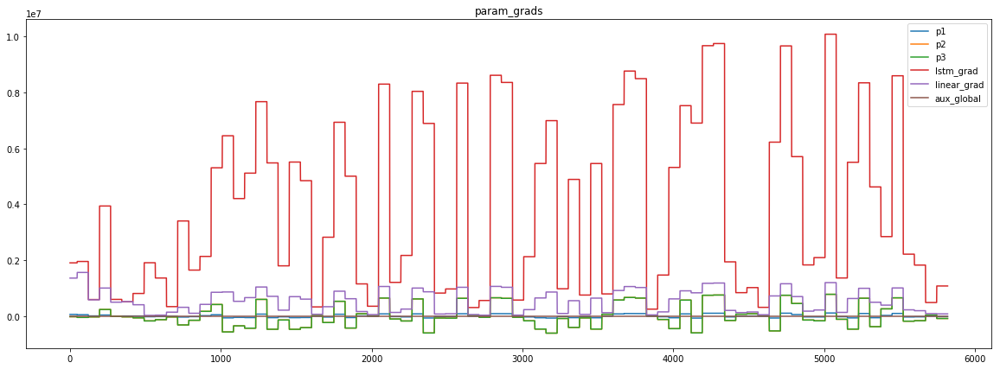

In [22]:
s = 100
e = -1
plot_shared_scale([
    (hist['grad_global']['p1'][s:e], 'p1'),
    (hist['grad_global']['p2'][s:e], 'p2'),
    (hist['grad_global']['p2'][s:e], 'p3'),
    (hist['grad_global']['lstm'][s:e], 'lstm_grad'),
    (hist['grad_global']['linear'][s:e], 'linear_grad'),
    (hist['aux_global'][s:e], 'aux_global')
], title="param_grads")
s =  10
e = -1

In [23]:
s, e = 0, t

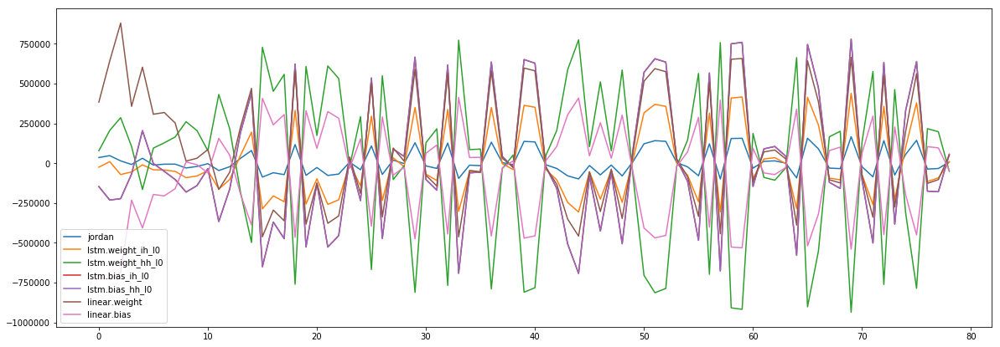

In [24]:
plot_shared_scale([(v[s:e],k)for k, v in hist['grads']['epochs'].items()])

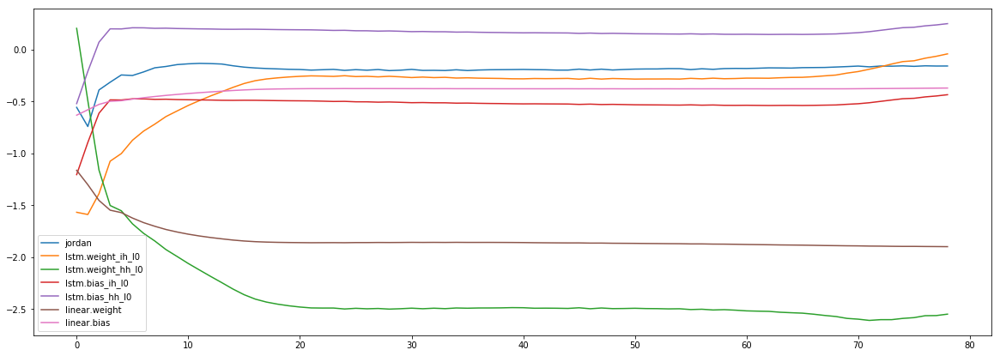

In [25]:
plot_shared_scale([(v[s:e],k)for k, v in hist['weights']['epochs'].items()])

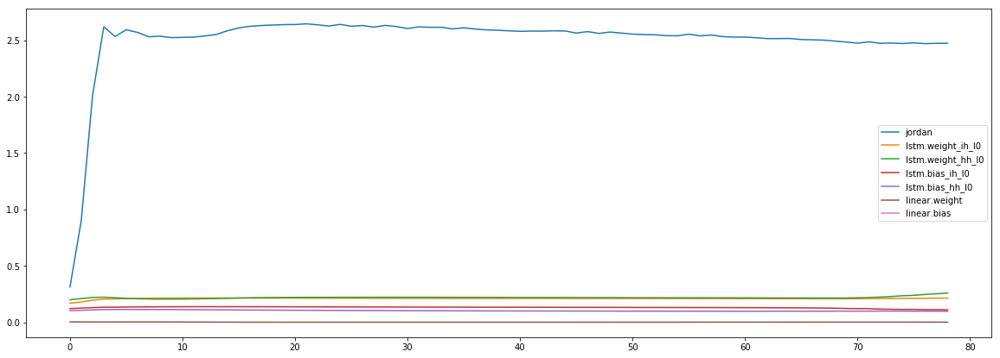

In [26]:
plot_shared_scale([(v[s:e],k)for k, v in hist['vars']['epochs'].items()])

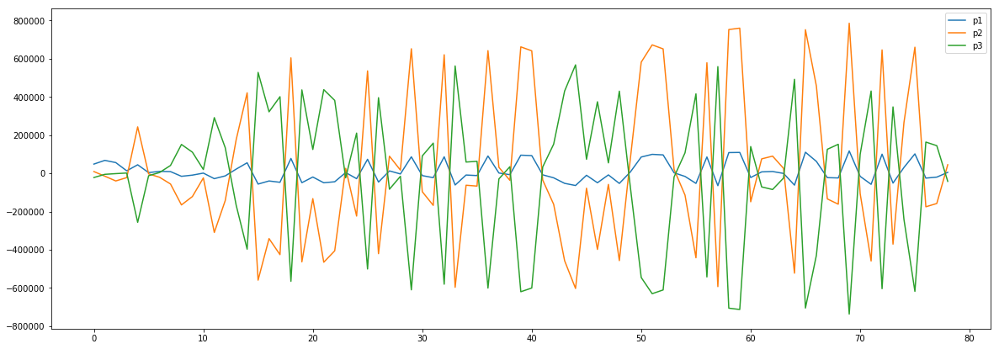

In [27]:
s = 0
plot_shared_scale([(v[s:e],k)for k, v in hist['param_grads']['epochs'].items()])

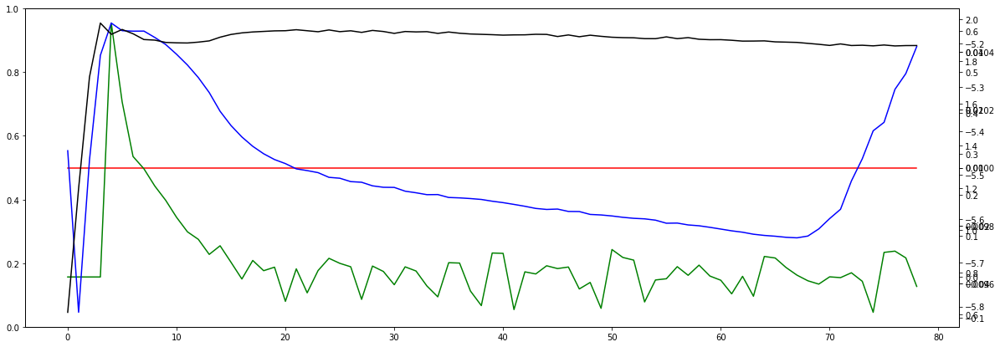

In [28]:
s, e = 0, t
plot_multiscale([
    (hist['lr'][s:e],"Red" ),
    (hist['loss_rate'][s:e], "Green"),
    (hist['weights_sum'][s:e], "Blue"),
    (hist['weights_var'][s:e], "Yellow"),
    (hist['eval_test']['epochs']['aux'][s:e], "Black")
])

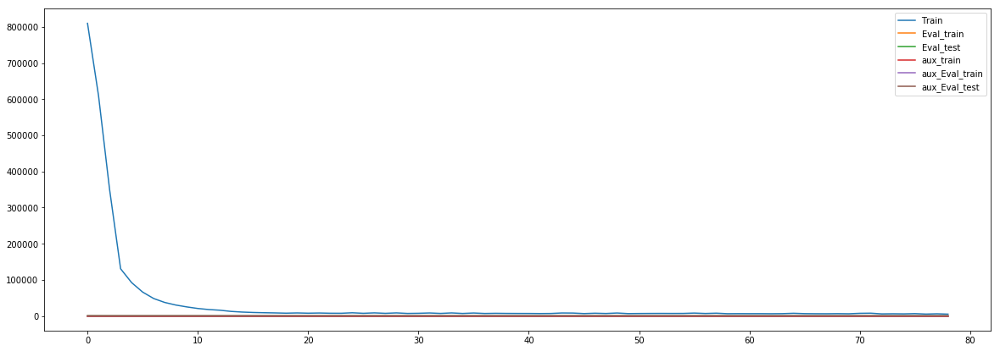

In [29]:
plot_shared_scale([
    (hist['train']["epochs"]['main'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['main'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['main'][s:e], "Eval_test"),
    (hist['train']["epochs"]['aux'][s:e], "aux_train"),
    (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
    (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

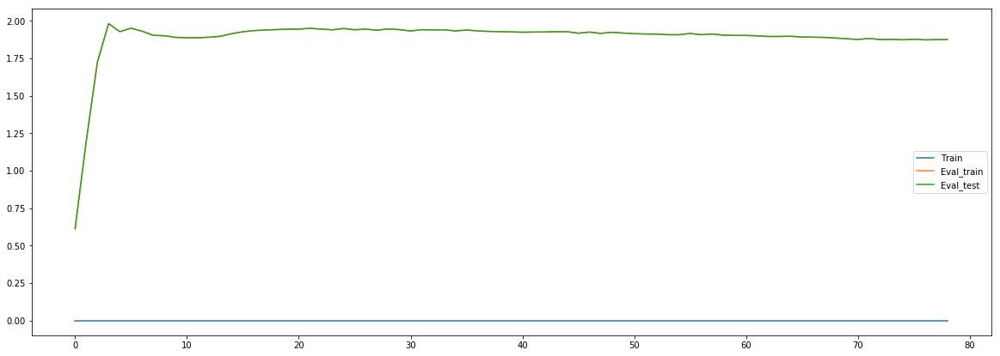

In [30]:
plot_shared_scale([
    (hist['train']["epochs"]['jordan'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['jordan'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['jordan'][s:e], "Eval_test"),
#     (hist['train']["epochs"]['aux'][s:e], "aux_train"),
#     (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
#     (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

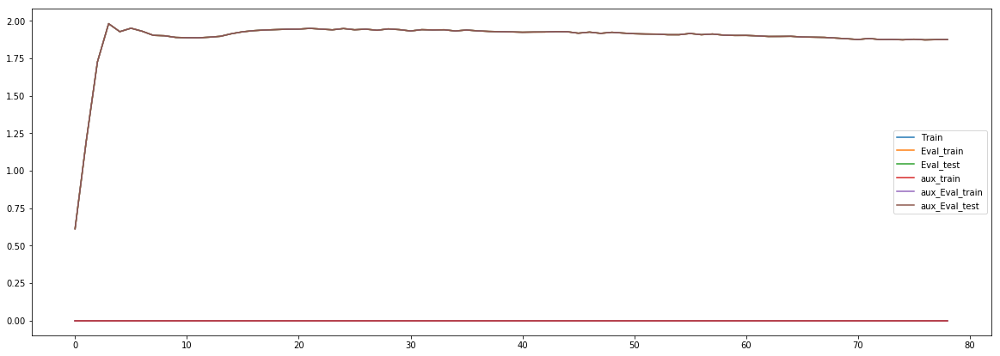

In [31]:
plot_shared_scale([
    (hist['train']["epochs"]['jordan'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['jordan'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['jordan'][s:e], "Eval_test"),
    (hist['train']["epochs"]['aux'][s:e], "aux_train"),
    (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
    (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

In [32]:
# To the prove of faster convergence

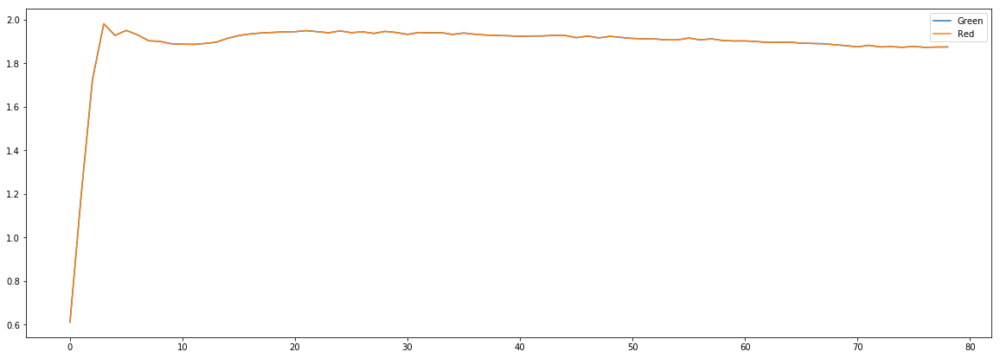

In [33]:
plot_shared_scale(
[
    (hist['eval_test']["epochs"]['jordan'][s:e], 'Green'),
    
    (hist['eval_test']["epochs"]['aux'][s:e], 'Red'),
]
)

In [34]:
for n, v in model.named_parameters():
    print(n, "\t", v.shape, "\t", v.sum())

jordan 	 torch.Size([1, 3]) 	 tensor(-0.1576, grad_fn=<SumBackward0>)
lstm.weight_ih_l0 	 torch.Size([8, 4]) 	 tensor(-0.0184, grad_fn=<SumBackward0>)
lstm.weight_hh_l0 	 torch.Size([8, 2]) 	 tensor(-2.5392, grad_fn=<SumBackward0>)
lstm.bias_ih_l0 	 torch.Size([8]) 	 tensor(-0.4231, grad_fn=<SumBackward0>)
lstm.bias_hh_l0 	 torch.Size([8]) 	 tensor(0.2611, grad_fn=<SumBackward0>)
linear.weight 	 torch.Size([1, 2]) 	 tensor(-1.8999, grad_fn=<SumBackward0>)
linear.bias 	 torch.Size([1]) 	 tensor(-0.3704, grad_fn=<SumBackward0>)


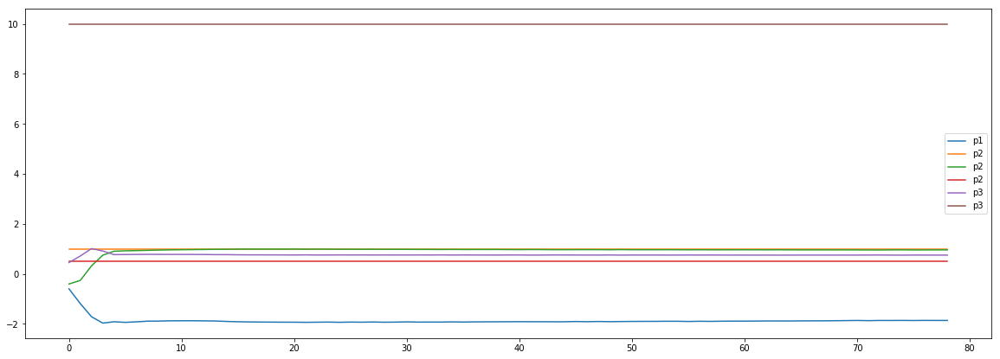

In [35]:
plot_shared_scale([
                  (hist['mean_params_sample']['1'][s:e], "p1"),
                  ((hist['mean_params_sample']['2']*0 + 1)[s:e], "p2"),
                  (hist['mean_params_sample']['2'][s:e], "p2"),
                  ((hist['mean_params_sample']['2']*0 + 0.5)[s:e], "p2"),
    (hist['mean_params_sample']['3'][s:e], "p3"),
                  ((hist['mean_params_sample']['2']*0 + 10)[s:e], "p3")
])

In [36]:
model.buffers

<bound method Module.buffers of LSTM_jordan(
  (lstm): LSTM(4, 2)
  (linear): Linear(in_features=2, out_features=1, bias=True)
)>

In [37]:
logging.info("Training process END")